In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
from sklearn.decomposition import NMF

from molecule_clustering import estimate_molecule_clusters, position_data
from neighborhood_composition import neighborhood_count_matrix, estimate_molecule_colors
from plot_utils import plot_molecules

from noise_estimation import estimate_confidence
from molecule_clustering_cython import init_assignment_probs_alt

/home/nglukhov/miniconda3/envs/nmf/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
nn_id = 15
test_data_path =  "/home/viktor_petukhov/mh/spatial/CellSegmentation/data/merfish_moffit/merfish_coords_adj.csv"
cells_data = pd.read_csv('/home/viktor_petukhov/mh/spatial/CellSegmentation/data/merfish_moffit/Moffitt_and_Bambah-Mukku_et_al_merfish_all_cells.csv')
df_spatial = pd.read_csv(test_data_path)

df_spatial.rename({'cell': 'Cell_ID'}, axis =1, inplace=True)
merged_spatial = pd.merge(df_spatial, cells_data, on='Cell_ID', how='inner')


df = merged_spatial.copy()
stratified_samples = []
for gene_index in df.gene.unique():
    try:
        samples = df[df['gene'] == gene_index].sample(n=1024)
        stratified_samples.append(samples)
    except:
        pass
    #stratified_samples.append(samples)


sample = pd.concat(stratified_samples)
sample.gene = pd.factorize(sample.gene)[0]
sample = sample[sample['Cell_class'] != 'Ambiguous']

In [3]:
n_clusters = 15
pos_data = position_data(sample)
genes = pd.factorize(sample['gene'])[0]
ncm = neighborhood_count_matrix(pos_data, genes, 15)
nmf = NMF(n_components=n_clusters, init='nndsvd')
nmf.fit(ncm)
mol_vec = nmf.fit_transform(ncm)
gene_vec = nmf.components_
assignment_probs = init_assignment_probs_alt(genes, mol_vec.T, n_clusters).T
#assignment_probs += np.random.normal(0.001, 0.001, assignment_probs.shape)

In [4]:
from matplotlib import pyplot as plt

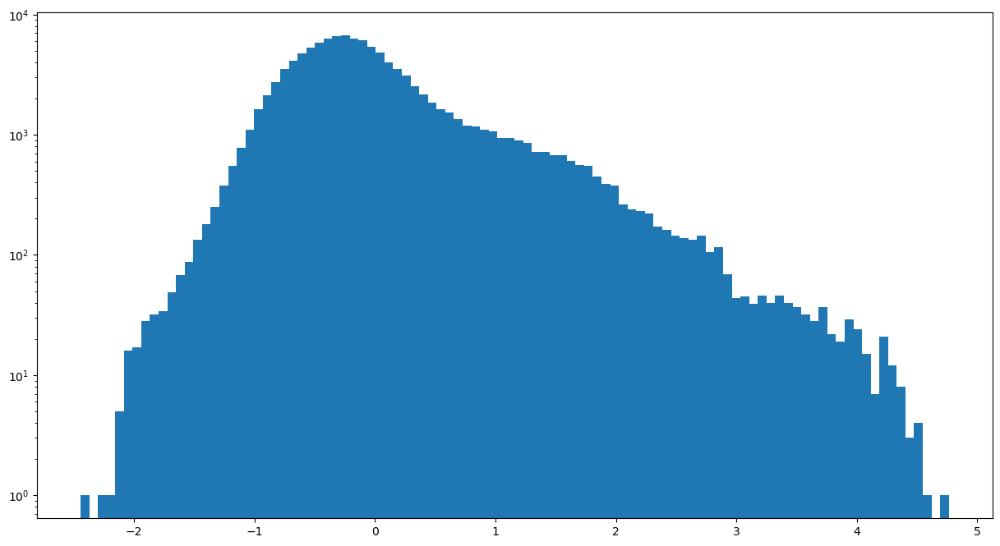

In [23]:
from neighborhood_composition import estimate_molecule_colors, estimate_molecule_vectors, neighborhood_count_matrix
#from baysorpy import neighborhood_composition
def position_data(df):
    if 'z' in df.columns:
        return np.array(df[['x', 'y', 'z']])
    return np.array(df[['x', 'y']])

n_clusters = 15
k = 25
sample.gene = sample.gene.factorize()[0]
ncm = neighborhood_count_matrix(position_data(sample), np.array(pd.factorize(sample.gene)[0]), k = k)
mol_vec = estimate_molecule_vectors(ncm, 1)
genes = sample.gene

mol_vec = estimate_molecule_vectors(ncm, 1)
plt.figure(figsize = (15, 8))
plt.hist(mol_vec[:, 0], 100);
plt.yscale('log')

In [24]:
def quantize_array(arr, ranges):
    # The quantized array will be initialized with zeros
    quantized = [0] * len(arr)

    # Iterate over the original array
    for i, val in enumerate(arr):
        for j, range_val in enumerate(ranges):
            if val >= range_val:
                quantized[i] = j + 1
            else:
                break

    return quantized


quantized_result = quantize_array(mol_vec, gm.means_)


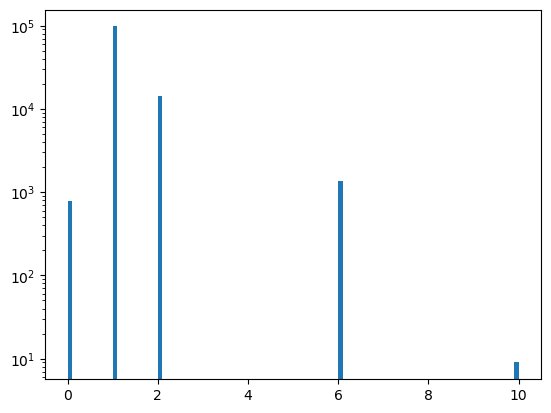

In [25]:
plt.hist(quantized_result, 100);
plt.yscale('log')

In [9]:
import numpy as np
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=10, random_state=0).fit(mol_vec)
gm.means_

array([[-1.32171],
       [ 0.78221],
       [ 2.48985],
       [-0.47069],
       [-3.20521],
       [ 0.20336],
       [ 4.39838],
       [-2.23227],
       [ 1.41174],
       [-4.35709]])

In [6]:
genes = np.array(sample['gene'])
n_clusters = 16
pos_data = position_data(sample)
ncm_mat = neighborhood_count_matrix(pos_data, genes, n_clusters)

In [26]:
confidence = estimate_confidence(sample, 15)
sample['confidence'] = np.array(confidence[1])

knn


  0%|▏                                                                                                                   | 14/10000 [00:01<20:08,  8.26it/s]

-0.0006970535841720601
Converged...


<Axes: >

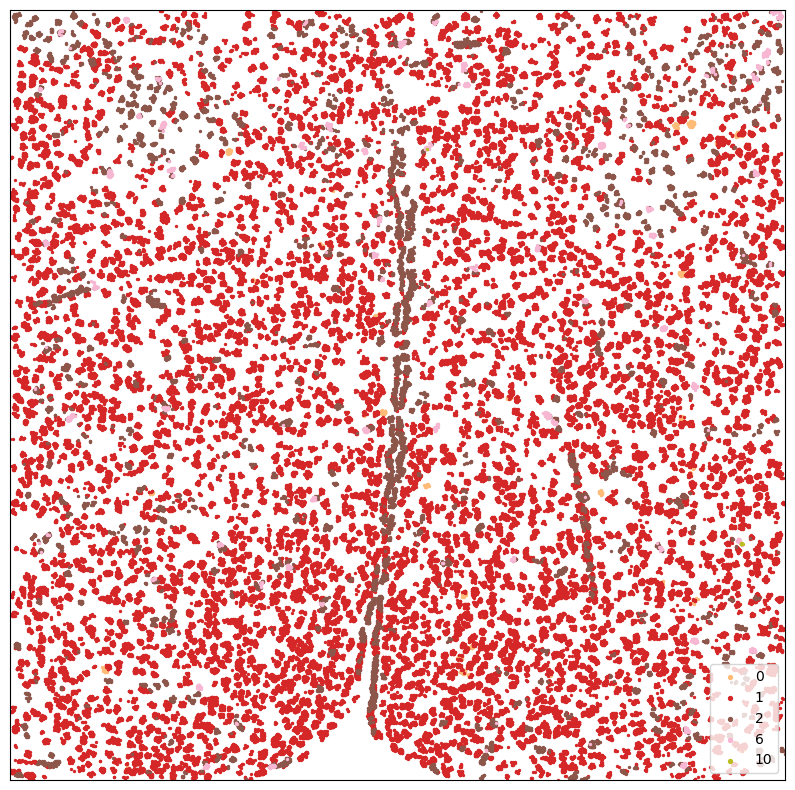

In [27]:
plot_molecules(sample, annotation = quantized_result, alpha=1, s = 2)

Clustering molecules...
knn
Enter mol clusters
kek
end
Here?


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 35.93it/s]

Done
{'exprs': <molecule_clustering_cython.NormalComponentListWrapper object at 0x7f0990329db0>, 'assignment': array([1, 1, 1, ..., 0, 0, 0]), 'diffs': array([0.     , 0.00637]), 'assignment_probs': array([[0.49981, 0.49927, 0.49979, ..., 0.50067, 0.50083, 0.50039],
       [0.50019, 0.50073, 0.50021, ..., 0.49933, 0.49917, 0.49961]]), 'change_fracs': array([0.    , 0.9483])}
[[    0 57352]
 [    1 56837]]


<Axes: >

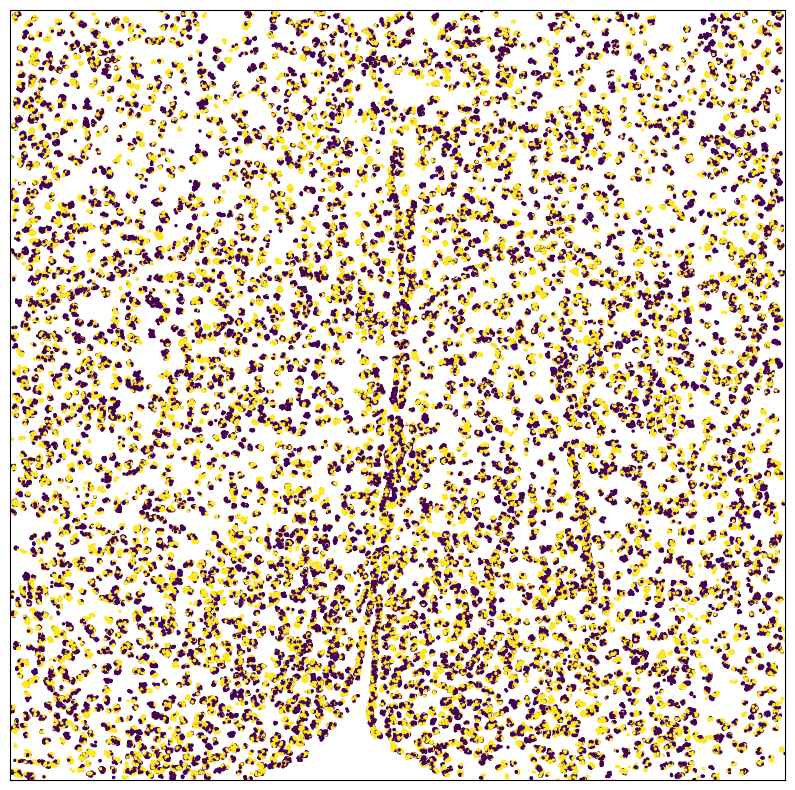

In [31]:
results = estimate_molecule_clusters(sample, 2, method="normal", max_iters = 1)
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

In [15]:
from molecule_clustering import cluster_molecules_on_mrf

In [24]:
sample.gene

976804       0
1146881      0
223131       0
624809       0
748904       0
          ... 
260898     139
982333     139
998687     139
423009     139
1402766    139
Name: gene, Length: 59545, dtype: int64

Clustering molecules...
knn
Enter mol clusters
end
Here?


  2%|██▏                                                                                                          | 195/10000 [00:21<18:12,  8.98it/s]


Done
{'exprs': <molecule_clustering_cython.NormalComponentListWrapper object at 0x7f43bac2b910>, 'assignment': array([10, 10, 10, ..., 10, 10, 12]), 'diffs': array([0.     , 0.     , 0.     , ..., 0.00146, 0.00154, 0.00162]), 'assignment_probs': array([[0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
       [0.     , 0.00209, 0.     , ..., 0.     , 0.00001, 0.     ],
       [0.     , 0.00022, 0.     , ..., 0.     , 0.     , 0.     ],
       ...,
       [0.     , 0.00071, 0.     , ..., 0.     , 0.00003, 1.     ],
       [0.     , 0.00017, 0.     , ..., 0.     , 0.     , 0.     ],
       [0.     , 0.00002, 0.00003, ..., 0.     , 0.00001, 0.     ]]), 'change_fracs': array([0.     , 0.     , 0.     , ..., 0.05317, 0.05246, 0.05201])}
[[    0   515]
 [    1  4342]
 [    2  1218]
 [    3   760]
 [    4    16]
 [    5  1166]
 [    6    21]
 [    7  2559]
 [    8  1237]
 [    9   296]
 [   10 41185]
 [   11  2002]
 [   12  1547]
 [   13   373]
 [   14  2308]]


<Axes: >

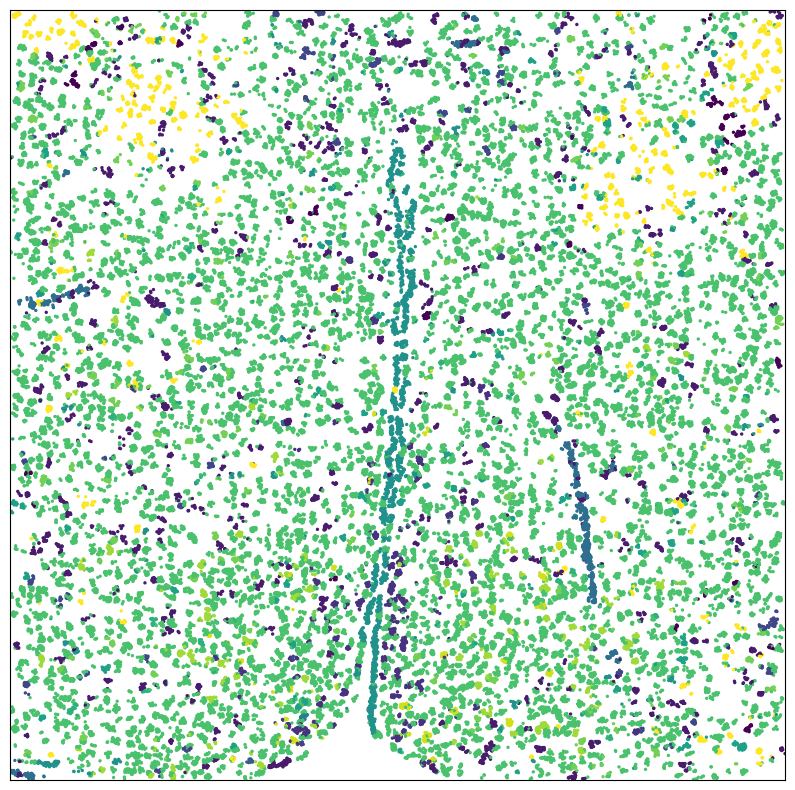

In [16]:
results = estimate_molecule_clusters(sample, 3, method="normal", ct_exprs_init=mol_vec.T)
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

<Axes: >

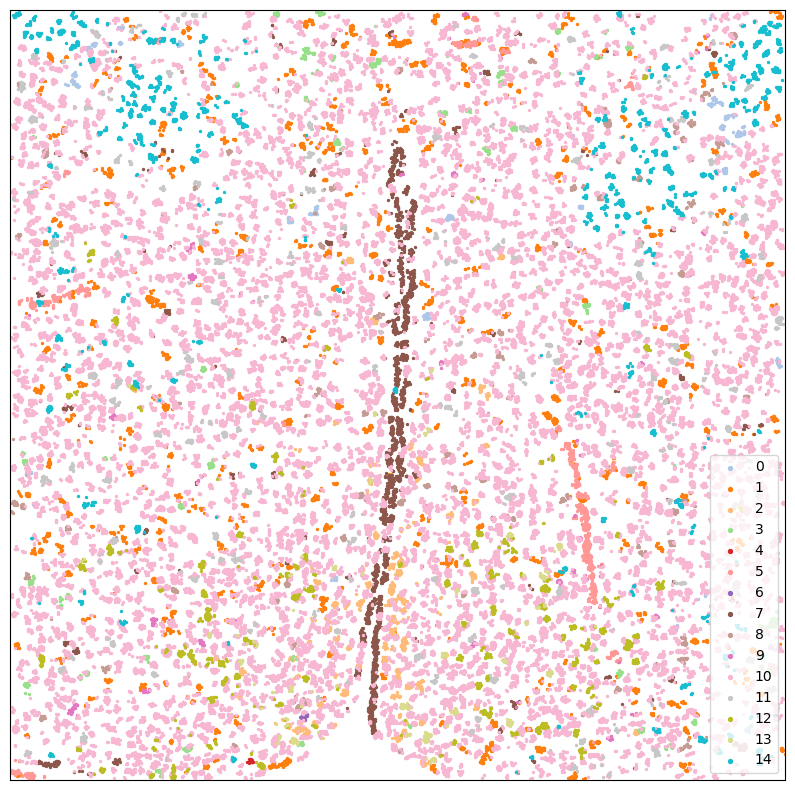

In [17]:
plot_molecules(sample, annotation = results['assignment'], alpha=1, s = 2)

In [151]:
import pandas as pd
from scipy.stats import entropy
from collections import Counter

t = pd.DataFrame(assignment).groupby(sample['Cell_class'].values, group_keys=True).apply(lambda x: x)
richness = t.reset_index().groupby('level_0')[0].nunique()

# Shannon Diversity Index for each cell type class
def shannon_diversity_index(labels):
    label_counts = Counter(labels)
    probabilities = [count/len(labels) for count in label_counts.values()]
    return entropy(probabilities, base=2)

shannon_diversity = t.reset_index().groupby('level_0')[0].apply(shannon_diversity_index)

def simpson_diversity_index(labels):
    label_counts = Counter(labels)
    N = len(labels)
    return 1 - sum((n/N)**2 for n in label_counts.values())

simpson_diversity = t.reset_index().groupby('level_0')[0].apply(simpson_diversity_index)

diversity_df_nmf = pd.DataFrame({
    'Richness': richness,
    'Shannon_Index': shannon_diversity,
    'Simpson_Index': simpson_diversity
})
print(diversity_df)


               Richness  Shannon_Index  Simpson_Index
level_0                                              
Astrocyte            15       1.708329       0.509751
Endothelial 1        13       1.810877       0.611744
Endothelial 2         7       2.093173       0.723446
Endothelial 3        11       1.822512       0.612368
Ependymal             5       0.648133       0.252208
Excitatory           15       1.115858       0.287272
Inhibitory           15       1.288492       0.338355
Microglia             8       2.285689       0.733095
OD Immature 1        13       1.555721       0.573299
OD Immature 2         2       0.266765       0.086777
OD Mature 1           7       1.658838       0.554361
OD Mature 2          10       1.197478       0.370469
OD Mature 3           3       1.336666       0.565000
OD Mature 4           3       1.413680       0.588160
Pericytes             8       0.739493       0.221867


<Axes: >

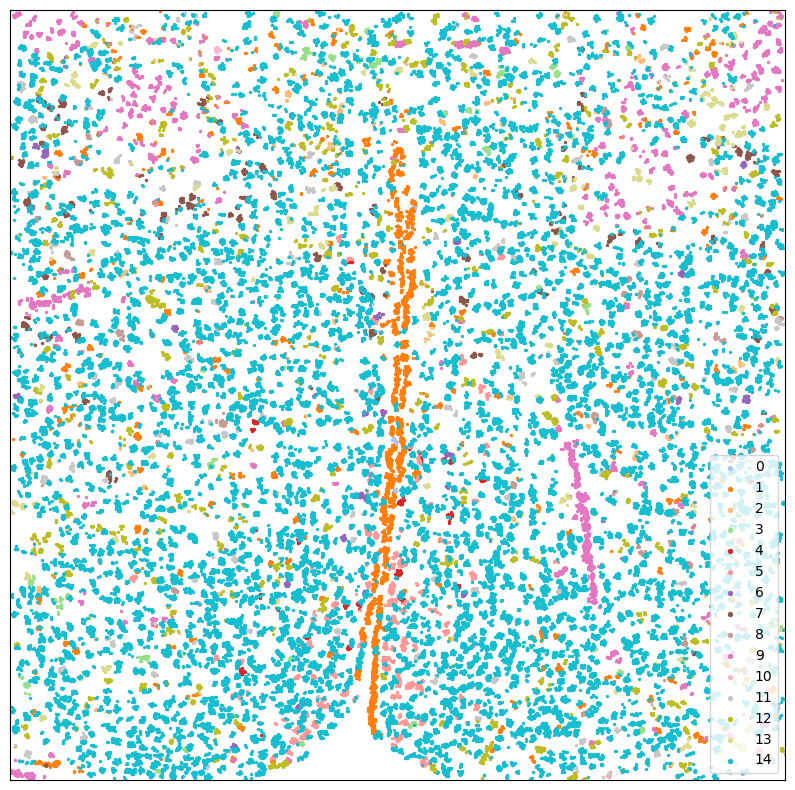

In [11]:
#colors = results['assignment']
plot_molecules(sample, annotation = results['assignment'], alpha=1, s = 2)

In [27]:
results

{'exprs': <molecule_clustering_cython.NormalComponentListWrapper at 0x7f43bd1ad4b0>,
 'assignment': array([4, 4, 4, ..., 4, 4, 7]),
 'diffs': array([0.     , 0.     , 0.     , ..., 0.00361, 0.0036 , 0.00359]),
 'assignment_probs': array([[0.     , 0.00012, 0.     , ..., 0.     , 0.00003, 0.     ],
        [0.     , 0.0001 , 0.00003, ..., 0.00001, 0.00015, 0.     ],
        [0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
        ...,
        [0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
        [0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
        [0.     , 0.00003, 0.     , ..., 0.     , 0.     , 0.     ]]),
 'change_fracs': array([0.     , 0.     , 0.     , ..., 0.11999, 0.11939, 0.11877])}

In [30]:
results['exprs'].get_some_data()

AttributeError: 'molecule_clustering_cython.NormalComponentListWrap' object has no attribute 'get_some_data'

In [31]:
pos_data = position_data(sample)
ncm_mat = neighborhood_count_matrix(pos_data, genes, n_clusters)
estimate_molecule_vectors(ncm_mat, 1)

KeyError: '[22092, 33103, 31116, 47768, 45724, 34246, 49677, 27114, 27060, 49614, 14737, 1457, 58824, 46878, 48243, 33293, 56855, 40868, 46518, 23310, 41392, 23085, 17210, 5601, 40820, 41608, 21099, 5457, 52765, 1355, 36232, 23818, 35917, 29732, 39716, 32442, 6105, 30652, 5816, 25270, 36501, 13228, 15826, 24562, 15486, 59318, 1518, 16556, 31912, 7512, 13424, 47650, 47633, 58640, 31866, 27123, 38515, 31842, 26905, 16268, 29413, 32601, 32752, 55451, 59490, 29941, 42861, 36750, 36992, 47489, 56439, 56333, 55102, 21979, 937, 31110, 58465, 1560, 4474, 5794, 47277, 10054, 10023, 40586, 41615, 58149, 47046, 2928, 27247, 19826, 54843, 1763, 32369, 56187, 31127, 15095, 46804, 20698, 7344, 43243, 50293, 26558, 20695, 20564, 21603, 27683, 41595, 35456, 11837, 52270, 10492, 36834, 54960, 47946, 52145, 9776, 36914, 30673, 35849, 35126, 50497, 55828, 12929, 7235, 7821, 49140, 40449, 14985, 33760, 56076, 12884, 13775, 38022, 32738, 26448, 32148, 27860, 56317, 24338, 27998, 53545, 55414, 1746, 39451, 21577, 43062, 27934, 4993, 48349, 52870, 10620, 34862, 42416, 15549, 51245, 13660, 52967, 43724, 19378, 59397, 6337, 42638, 2427, 26748, 29536, 51781, 53483, 30452, 4190, 3953, 4387, 16600, 4220, 31637, 11408, 4415, 49848, 14785, 14813, 49658, 48554, 23566, 23605, 54896, 23570, 41502, 25251, 16824, 18001, 4628, 54740, 15859, 31015, 4695, 19051, 7158, 6512, 38844, 54451, 19426, 27894, 57092, 16771, 4960, 35092, 9930, 50343, 24273, 21914, 982, 11851, 49313, 19178, 16232, 43711, 12282, 42474, 28752, 963, 39073, 1261, 4972, 12952, 57797, 4714, 12715, 6951, 46444, 12758, 12520, 49194, 45153, 42859, 57737, 7007, 51621, 23348, 11034, 47129, 42815, 56917, 56706, 46994, 29187, 50861, 47483, 9208, 40264, 3630, 17900, 50241, 47274, 1940, 18298, 1791, 28946, 5995, 18401, 2385, 43915, 9328, 37531, 10016, 6263, 40315, 52037, 58217, 39410, 14540, 30561, 25937, 58376, 16800, 55717, 6454, 39085, 17651, 11379, 7764, 204, 39617, 39546, 37268, 19596, 25805, 2632, 27344, 31441, 16952, 13410, 47173, 51006, 59022, 32064, 1944, 268, 50842, 45645, 48889, 48566, 35292, 48411, 48359, 42028, 58571, 43153, 21496, 23793, 28560, 36280, 40985, 55359, 5063, 54440, 18620, 9995, 41626, 33437, 332, 31577, 41619, 19672, 11434, 57198, 13379, 53574, 43757, 53344, 10113, 18947, 59302, 26680, 30659, 38238, 44370, 33942, 53777, 33746, 49830, 39876, 7904, 26362, 57750, 10236, 20709, 20775, 59502, 20766, 38629, 20646, 19098, 20187, 33268, 20339, 20842, 54829, 51829, 32028, 29068, 57664, 39921, 2691, 989, 17930, 1984, 10884, 51836, 46333, 20142, 6528, 186, 26864, 45680, 22529, 23331, 40354, 7557, 4769, 40237, 53610, 4461, 17735, 53493, 55196, 19469, 54336, 25650, 44633, 20533, 20914, 11525, 20772, 20699, 29424, 20742, 1867, 18437, 36358, 54335, 40660, 10165, 19645, 35014, 12449, 26026, 34452, 40217, 10060, 52576, 52503, 3381, 370, 48242, 48249, 21086, 49056, 58234, 24864, 41611, 52, 32072, 366, 32279, 34197, 34886, 17002, 7865, 57276, 19301, 35027, 24846, 28545, 41842, 50708, 32799, 33245, 30556, 5791, 56911, 45750, 19980, 22085, 34070, 42826, 22154, 13059, 2344, 45922, 5913, 19961, 25658, 14435, 13314, 17618, 17648, 13001, 47560, 104, 12224, 43427, 44270, 44290, 5746, 46856, 47098, 7305, 54790, 57053, 46863, 54290, 34326, 47330, 4036, 56578, 21683, 15412, 36192, 22131, 43046, 28316, 43511, 52239, 8375, 3083, 47055, 36628, 33044, 41359, 19654, 32957, 39136, 2279, 57983, 33890, 5625, 24805, 11155, 47121, 56682, 47600, 36222, 36581, 5868, 21172, 42132, 47058, 11244, 59371, 46932, 34444, 31758, 2572, 57135, 8429, 29481, 57193, 15881, 26133, 10991, 6835, 29598, 52421, 43200, 29609, 44463, 15975, 9684, 16234, 9847, 4829, 14016, 23300, 44328, 6295, 25644, 9634, 18646, 59488, 30161, 12890, 18513, 23623, 39558, 19985, 21997, 19862, 50624, 31393, 31384, 19474, 9042, 11488, 31306, 18317, 8940, 5941, 13566, 2172, 12249, 10664, 21428, 28328, 23095, 10281, 48385, 11098, 14969, 54791, 50936, 30038, 2381, 53166, 46454, 54841, 35194, 36440, 34378, 33314, 53420, 13281, 2414, 17375, 27284, 58453, 19018, 54397, 52356, 46631, 52465, 12188, 34364, 36710, 38086, 52772, 33607, 33107, 33219, 33409, 36112, 31818, 54782, 33042, 428, 38882, 46526, 39931, 18717, 5685, 40557, 46823, 34665, 34903, 23612, 45931, 31466, 35585, 11762, 5883, 16443, 35252, 12131, 11824, 47239, 17019, 56832, 51404, 87, 57736, 37570, 54432, 51954, 40170, 23273, 2544, 13980, 54216, 52050, 49240, 6448, 1946, 17120, 17261, 38814, 35393, 38734, 46534, 20127, 10475, 51211, 9805, 7485, 49386, 51379, 54250, 46409, 26107, 20407, 52509, 40247, 6736, 17602, 56020, 20992, 42362, 51976, 57869, 39401, 56506, 39163, 21206, 35106, 48578, 31208, 35712, 35215, 40259, 21705, 5846, 25053, 53359, 49755, 53584, 49356, 9970, 4886, 23381, 56044, 57796, 20663, 44541, 43058, 1395, 59269, 12210, 52778, 46801, 46762, 41457, 21547, 5958, 32040, 11260, 49461, 42547, 10112, 38672, 46723, 5977, 30334, 35916, 520, 50874, 53867, 30769, 6856, 13385, 24782, 25709, 2445, 31916, 38110, 21699, 34358, 53480, 48310, 38122, 37684, 10435, 21856, 38697, 31917, 21502, 37150, 12109, 37120, 42749, 28229, 21531, 3336, 48448, 29, 50187, 334, 39524, 31551, 11882, 32336, 52249, 50429, 39548, 2588, 429, 23307, 2055, 32713, 23342, 16131, 154, 50413, 36830, 37410, 40296, 30045, 14484, 21798, 21399, 21606, 30509, 3096, 6310, 19898, 49301, 55636, 39575, 1726, 33323, 47310, 21346, 9057, 40428, 6389, 56144, 46788, 24371, 17698, 28132, 50436, 51970, 24484, 35673, 37643, 37872, 32054, 25936, 3696, 48040, 38165, 8176, 37897, 24148, 23667, 602, 30912, 35521, 17917, 12012, 51731, 39096, 52033, 8028, 17987, 41959, 24422, 27227, 50468, 14792, 52316, 31385, 15075, 29236, 175, 35049, 47423, 46435, 122, 54351, 4538, 32420, 54403, 9171, 168, 54193, 17961, 3820, 52657, 18819, 55945, 40836, 56999, 48634, 54182, 57297, 43104, 10753, 12455, 56681, 34208, 52427, 29299, 4009, 42666, 4241, 38062, 29421, 40902, 50508, 26235, 29647, 53609, 26142, 22102, 16092, 2611, 19638, 12132, 50194, 50192, 5025, 31008, 59005, 19249, 50188, 23301, 43170, 29027, 47571, 20818, 6044, 28965, 51347, 30825, 5651, 2247, 51851, 6348, 5358, 53884, 51047, 17075, 31805, 8448, 50694, 4322, 54412, 30211, 327, 46584, 12649, 55813, 28697, 52671, 50662, 53373, 14858, 7248, 91, 19436, 18444, 20540, 3494, 57015, 19740, 58758, 48926, 57820, 28065, 3473, 3657, 23257, 20907, 37453, 44312, 6117, 49221, 2079, 31445, 20316, 43688, 31454, 52936, 44097, 57102, 31414, 19379, 32446, 32494, 25655, 19500, 52489, 55888, 43991, 30348, 48654, 40348, 57085, 23220, 50015, 46630, 36437, 22035, 29082, 2777, 43115, 43167, 4790, 279, 21272, 47362, 14807, 35739, 47631, 47493, 33404, 385, 47512, 52922, 26635, 26386, 53478, 54533, 15610, 40289, 57204, 17703, 56017, 33640, 17775, 24731, 14400, 47645, 19138, 16369, 230, 389, 47955, 6138, 42722, 853, 21508, 52956, 50131, 21745, 276, 6282, 54343, 54280, 7583, 54759, 54460, 19314, 30911, 54963, 39228, 29226, 5610, 54205, 11731, 22065, 49457, 30098, 24441, 35734, 18865, 3754, 33669, 471, 42710, 42220, 41943, 50670, 3608, 42040, 49052, 46328, 40462, 11714, 52154, 47781, 15091, 35771, 9812, 11633, 7856, 23729, 35471, 17512, 30332, 57325, 47410, 19310, 57913, 30616, 21127, 31993, 42894, 17630, 49191, 39367, 4934, 31784, 29828, 31950, 45468, 52890, 35278, 56935, 32155, 53009, 13245, 54076, 33062, 34513, 17561, 7602, 22867, 38809, 13492, 398, 13774, 54730, 23451, 36627, 16125, 10235, 14403, 46326, 36085, 14215, 38596, 14590, 35948, 42174, 50342, 37926, 41993, 19274, 3649, 5967, 49988, 183, 31485, 39001, 54874, 41820, 29889, 30191, 28451, 43031, 40763, 15235, 54985, 8102, 21313, 31124, 33526, 27275, 28449, 5757, 46408, 5523, 46215, 18920, 26842, 15577, 43322, 28302, 58868, 50426, 47202, 10038, 50272, 24124, 50484, 58972, 53229, 58472, 10772, 18952, 38787, 57647, 1652, 1583, 43312, 35857, 48368, 24922, 54644, 19447, 12007, 53735, 39494, 23238, 20048, 16179, 30285, 377, 49735, 9521, 2231, 24302, 49943, 18888, 12300, 58905, 46188, 45986, 21035, 41845, 9722, 2619, 59171, 23750, 28465, 38227, 29850, 33246, 23743, 19008, 48952, 12106, 48942, 49011, 18724, 49938, 18681, 24502, 56466, 24399, 50559, 30934, 50683, 54659, 59459, 54040, 40581, 56411, 41481, 43473, 56252, 45740, 41675, 15286, 19555, 45268, 57341, 58565, 16038, 6012, 1397, 13650, 44648, 41423, 21638, 23171, 11987, 7880, 1614, 20477, 9984, 48476, 43052, 18595, 59263, 18470, 238, 42165, 42001, 28912, 33173, 47138, 15159, 54954, 21562, 1559, 2308, 43765, 20572, 44875, 13623, 23656, 45075, 32063, 26994, 58570, 16605, 18334, 53687, 22553, 50767, 12932, 31391, 23439, 12994, 1756, 43, 42761, 24834, 9936, 32036, 22666, 26384, 57503, 55286, 42900, 56299, 42476, 22814, 43028, 36396, 25350, 12345, 29078, 57721, 29385, 4927, 51716, 29168, 3185, 23480, 1688, 30046, 18789, 57419, 11602, 43410, 41306, 13306, 57667, 57286, 37121, 35266, 32734, 18935, 44422, 17026, 34597, 33652, 35181, 16084, 46867, 42620, 44617, 50805, 32008, 22395, 310, 21773, 63, 11674, 9356, 28736, 36764, 18162, 19943, 56557, 36760, 27792, 27749, 3207, 21259, 12033, 39170, 39880, 19, 16310, 47504, 2, 10698, 2094, 53494, 17691, 49015, 19300, 56373, 11713, 53296, 53258, 24008, 42204, 22458, 48287, 11599, 16441, 53456, 5809, 16364, 2064, 31372, 2077, 34545, 16913, 4413, 54463, 58413, 6068, 40968, 34632, 11239, 51889, 14117, 40142, 4524, 5394, 5191, 12651, 51674, 12615, 35354, 14487, 30008, 46896, 47265, 59471, 47466, 47137, 47209, 14350, 36195, 46866, 32856, 53145, 11722, 19549, 54640, 18025, 56308, 20970, 32971, 33381, 33505, 12047, 57880, 43108, 19349, 53230, 25667, 22099, 58612, 42556, 41821, 41849, 41508, 19885, 36217, 9806, 25543, 54999, 20947, 49591, 3984, 49815, 25454, 29410, 38160, 42361, 43147, 53583, 47085, 22454, 14569, 12189, 40772, 46021, 46306, 35998, 16066, 21700, 24744, 35318, 36212, 18171, 49019, 57439, 7418, 57541, 40223, 40530, 19186, 15887, 13085, 15498, 18569, 58590, 12060, 12096, 11651, 28163, 55547, 12271, 37015, 28797, 37690, 16087, 37003, 11781, 19001, 34368, 54027, 58694, 56887, 54540, 18000, 16926, 50107, 19751, 7255, 31479, 9447, 31295, 48250, 45014, 32, 55012, 18032, 50490, 50730, 57928, 45956, 50430, 58007, 11873, 8461, 52582, 9116, 17051, 55268, 50826, 27255, 674, 18642, 33625, 25955, 54199, 4673, 54993, 55142, 17233, 12733, 27719, 40233, 3044, 12514, 41065, 12906, 54252, 35059, 42902, 41223, 37736, 52859, 9737, 57561, 18790, 57523, 28676, 35643, 33629, 35817, 48820, 36739, 49451, 58210, 37044, 48386, 47692, 38929, 37001, 48206, 36817, 36730, 44631, 25352, 57099, 57786, 1391, 1750, 28159, 16412, 10000, 29929, 49986, 23367, 48909, 27885, 58436, 58744, 57069, 23429, 54947, 12167, 2577, 46292, 58547, 53604, 54580, 4662, 20391, 22757, 33284, 59091, 23980, 2658, 53555, 16667, 16826, 22308, 16144, 44692, 9858, 14356, 48289, 22724, 32731, 23556, 53444, 17522, 48233, 4532, 37470, 1807, 49890, 50908, 56749, 42023, 990, 31345, 57133, 9990, 1734, 29915, 55605, 19398, 38575, 45787, 39514, 17013, 58230, 22281, 9734, 44445, 18810, 8091, 45177, 50042, 42403, 3911, 16795, 13764, 26931, 23072, 32389, 10069, 33341, 32362, 38758, 50924, 53097, 25494, 39325, 45439, 44251, 17174, 29705, 4161, 26801, 17558, 30324, 46809, 51556, 1203, 1094, 49637, 40442, 16503, 27134, 53883, 14931, 50745, 6297, 23940, 6644, 54571, 1958, 33221, 37920, 19062, 30939, 25971, 56008, 32730, 8422, 46832, 44862, 56334, 25869, 42787, 56520, 55244, 17248, 14618, 25976, 1393, 56564, 56394, 43905, 54413, 1254, 33136, 21482, 58929, 29578, 38289, 1037, 15677, 32914, 30175, 42384, 29072, 34856, 34593, 51648, 54461, 53005, 54512, 44444, 284, 28991, 34117, 30168, 4193, 137, 46650, 3514, 37869, 54501, 11149, 43361, 22028, 47997, 53385, 50355, 44753, 6366, 8034, 39826, 53188, 55782, 47478, 58425, 58, 39256, 52744, 31360, 20469, 5873, 21970, 33685, 27797, 23355, 33662, 18918, 46951, 19296, 46944, 42598, 15624, 38322, 26549, 55833, 15883, 58062, 15491, 49441, 31359, 52585, 21023, 33663, 16061, 33702, 58281, 42417, 25413, 53079, 53116, 44119, 50824, 11451, 17337, 21789, 3129, 9979, 38532, 3152, 44279, 22893, 56444, 40993, 22895, 2328, 6984, 13368, 15900, 39863, 11767, 53158, 8331, 50583, 42061, 41851, 50542, 23544, 3182, 10291, 46698, 32419, 46608, 55917, 1044, 18543, 34578, 25502, 17486, 8521, 46808, 23742, 31542, 58228, 52218, 38564, 19442, 48076, 24804, 15885, 38151, 29159, 968, 57160, 24868, 48956, 18547, 11090, 7613, 52446, 11578, 18546, 58553, 27018, 51027, 18769, 50763, 41659, 57112, 43615, 14751, 43728, 43628, 32670, 29588, 57963, 43675, 47443, 41761, 58152, 32158, 36768, 25416, 21962, 25124, 44745, 54324, 32833, 4600, 58751, 35755, 33698, 22250, 21057, 45046, 23244, 24345, 7760, 25625, 12497, 10075, 50136, 37435, 36254, 19668, 13039, 36685, 28030, 7814, 13270, 44375, 21776, 21672, 50653, 42867, 3313, 58594, 1088, 28966, 42177, 17843, 44186, 35257, 19776, 4495, 44123, 52691, 53658, 57054, 21072, 4411, 57708, 46587, 23341, 32535, 44421, 12037, 22392, 16321, 51453, 39659, 4706, 15248, 7934, 397, 20136, 4692, 33331, 32181, 3252, 6412, 48490, 42128, 16851, 19949, 40861, 32418, 11931, 11198, 4536, 36206, 36474, 31166, 50740, 56722, 57978, 15798, 20793, 120, 55183, 54430, 44083, 48732, 33150, 18581, 33047, 25970, 10085, 20758, 50690, 50564, 38917, 33238, 32891, 1886, 57602, 42016, 54824, 5779, 49515, 42683, 34356, 7536, 25473, 10652, 11684, 7559, 36097, 8639, 39576, 11152, 6763, 19355, 43566, 42882, 14780, 40145, 54691, 2306, 41631, 46638, 50447, 5758, 12071, 32387, 3073, 3100, 55385, 18902, 19100, 18909, 25591, 46782, 58728, 17475, 42192, 6895, 37563, 41536, 57289, 21633, 1694, 1815, 42864, 50731, 57007, 24556, 53082, 836, 52807, 21823, 45513, 2864, 54491, 59254, 47458, 4310, 33411, 30749, 10786, 48563, 2989, 30754, 1497, 30894, 45825, 1587, 17176, 24850, 6387, 2163, 12077, 23253, 35312, 50461, 50845, 53925, 45445, 45517, 40494, 17924, 40230, 20516, 50314, 11401, 19484, 9762, 2248, 46465, 24983, 33679, 30605, 5927, 24676, 24082, 49905, 23795, 24876, 47276, 54826, 56367, 2047, 58134, 40302, 25086, 45798, 20014, 16797, 4510, 57705, 33740, 12393, 48687, 26420, 26115, 3036, 2405, 1472, 27304, 28633, 28236, 33085, 4034, 39452, 24078, 2373, 30199, 9029, 3242, 54330, 53224, 28073, 18328, 40573, 21900, 49051, 51642, 19032, 49326, 59462, 15321, 22495, 6152, 16946, 58106, 18508, 18997, 55260, 55341, 49423, 34436, 34342, 42925, 32488, 25792, 53903, 17956, 17746, 19203, 20003, 33578, 13236, 49518, 50633, 2660, 56633, 40266, 41436, 40579, 28747, 6285, 32037, 226, 33530, 37408, 38445, 48169, 53857, 12448, 4141, 58267, 24732, 8537, 45980, 8023, 49126, 54099, 388, 44020, 41984, 52904, 22153, 313, 10267, 36495, 7964, 57498, 45161, 45440, 22239, 10909, 11014, 15066, 50491, 40998, 12790, 31522, 8671, 747, 8769, 44467, 5573, 41178, 56897, 27291, 32191, 53, 53952, 14274, 17491, 2166, 39130, 40888, 40708, 6709, 43296, 29145, 3997, 2618, 36793, 21056, 19050, 49612, 59237, 14552, 7542, 59145, 32989, 21051, 11844, 16505, 52063, 51102, 39029, 14817, 31147, 32719, 44502, 47303, 55970, 4515, 49017, 7951, 3821, 54861, 32130, 43561, 25048, 34933, 19765, 34705, 34670, 4734, 4926, 34692, 3910, 5077, 52389, 40577, 8184, 17951, 47424, 27578, 55733, 16747, 16395, 37758, 25813, 46735, 11702, 57863, 5335, 2031, 17464, 53807, 21858, 9842, 27782, 11351, 22193, 46063, 46988, 16545, 46467, 27970, 55840, 41267, 8656, 20406, 24510, 441, 167, 19302, 17495, 42750, 1833, 45059, 42999, 50255, 46217, 57985, 38027, 47291, 56663, 37313, 47314, 47374, 55199, 36759, 20458, 35021, 40156, 43086, 58371, 44077, 10720, 52899, 34495, 42008, 32244, 14280, 17057, 3201, 41837, 4646, 44165, 44280, 39071, 48983, 13021, 39015, 54002, 49040, 27041, 47036, 56453, 1736, 58949, 38955, 36349, 59033, 4851, 52748, 33176, 3136, 9661, 43763, 27674, 39925, 43544, 15842, 57530, 46733, 53443, 11803, 54973, 32024, 57404, 36926, 9869, 1289, 40818, 42133, 42240, 42221, 42070, 3364, 24335, 7440, 42530, 5642, 42677, 42572, 923, 39589, 10200, 161, 43119, 1437, 28929, 21811, 36741, 21714, 26141, 48959, 54852, 21451, 19367, 50417, 52988, 55315, 57964, 36629, 41370, 18979, 39215, 374, 56473, 28724, 21357, 19648, 17379, 19561, 21427, 9505, 6488, 44571, 42203, 19266, 50094, 43089, 38251, 4842, 37908, 57483, 53965, 7306, 25019, 35069, 19543, 29922, 53441, 7664, 12217, 37343, 40322, 14855, 21111, 25810, 27865, 8409, 41913, 35807, 28808, 31134, 19640, 10240, 58729, 19811, 14929, 46786, 46345, 27573, 19452, 33061, 49553, 47895, 26233, 15845, 38417, 39896, 34120, 26020, 10606, 15801, 19099, 49402, 29636, 57418, 37996, 21340, 26264, 26612, 17409, 52277, 53130, 55810, 27450, 48906, 55577, 16200, 37286, 46646, 27371, 28391, 2790, 28505, 21929, 34533, 16155, 38452, 52157, 25619, 898, 52135, 31676, 31107, 54534, 31731, 31769, 39572, 51578, 13289, 24468, 54655, 37219, 31590, 4342, 57273, 43433, 21925, 12205, 53619, 19551, 56389, 6149, 1669, 9669, 46350, 2124, 30246, 13074, 3475, 6100, 19880, 47463, 44678, 47535, 37023, 11479, 348, 42235, 14622, 12472, 37552, 50971, 36903, 49506, 22185, 31349, 45536, 23102, 21966, 39446, 52071, 34207, 10728, 31289, 31465, 56839, 23060, 23280, 58874, 23165, 23322, 52516, 4928, 46530, 10638, 36180, 39474, 4649, 23111, 56927, 43035, 21478, 18928, 76, 19472, 29649, 42046, 51014, 51956, 2155, 40234, 28347, 25022, 53797, 7341, 33191, 1533, 23684, 49420, 12628, 37173, 32902, 12265, 7991, 14180, 46835, 317, 32754, 56356, 32785, 12457, 43139, 39484, 3426, 32638, 19272, 26, 17215, 55189, 51414, 25985, 23008, 2723, 22882, 28410, 48224, 49497, 11648, 30999, 30845, 57757, 53237, 7883, 55663, 36815, 16899, 16198, 48805, 52340, 21839, 59102, 56554, 49367, 11051, 20148, 42071, 53330, 36568, 10213, 1824, 4811, 9462, 34442, 53100, 23749, 33561, 51259, 19842, 57740, 32920, 36675, 394, 22904, 7668, 57914, 48378, 33655, 22415, 12147, 40213, 12011, 10752, 223, 43107, 52468, 4537, 53255, 59100, 24919, 12201, 31986, 35233, 12286, 6326, 49894, 53621, 9375, 49302, 31229, 55406, 25484, 54727, 11321, 33431, 9709, 39355, 10059, 39612, 32960, 56838, 54156, 55116, 32086, 54472, 55192, 26019, 18607, 57441, 18748, 25773, 10222, 9360, 58138, 3508, 47925, 37065, 47501, 55065, 10625, 25518, 30513, 1476, 47407, 24820, 16967, 54945, 56237, 23212, 41676, 50557, 13232, 24099, 27980, 47304, 22325, 38928, 32357, 44102, 9838, 42260, 52605, 37952, 52491, 18507, 8173, 16461, 59087, 55438, 52745, 44308, 55864, 10954, 21552, 21586, 21626, 42762, 31899, 44703, 37158, 22041, 4677, 12438, 21405, 3763, 14206, 48203, 14657, 6903, 59019, 36683, 46975, 6748, 269, 48164, 40290, 9593, 54653, 9907, 25774, 13171, 43126, 37134, 54892, 20945, 55460, 14275, 55437, 54776, 55572, 12966, 722, 46512, 7298, 13016, 6843, 13307, 5271, 6968, 5512, 30688, 49195, 45455, 20053, 15006, 36995, 44656, 44121, 1896, 53038, 40615, 35235, 48292, 33339, 25564, 20294, 51291, 10563, 34253, 32720, 42173, 57235, 47702, 20224, 15136, 44023, 48738, 16017, 36715, 54445, 11167, 39834, 220, 19562, 18227, 30426, 1536, 11883, 21081, 26706, 24415, 11251, 27090, 22672, 45125, 13653, 46676, 43678, 29462, 13416, 30541, 1033, 50777, 9152, 43616, 9438, 57463, 43682, 31488, 50373, 19602, 3395, 33555, 2423, 34743, 21330, 19805, 3392, 35400, 14598, 16721, 40990, 37554, 52543, 25353, 28661, 11226, 54295, 5937, 24794, 11697, 10143, 35789, 35557, 26731, 33087, 24083, 19844, 6315, 8425, 3653, 20813, 7788, 39469, 17357, 3379, 51973, 43048, 37100, 16677, 3005, 15195, 1195, 47617, 51280, 45463, 22858, 9648, 21653, 45287, 32930, 34008, 57224, 22793, 6080, 21879, 17226, 14337, 29888, 38127, 48290, 55052, 12844, 32573, 48182, 6810, 6533, 4370, 25390, 6965, 45233, 43721, 11102, 48338, 39608, 926, 21089, 6706, 38036, 16209, 45420, 51890, 5664, 45609, 10360, 5836, 49347, 33060, 49917, 22194, 404, 27911, 8452, 16636, 33178, 28312, 11326, 36931, 22093, 52047, 1917, 35036, 57702, 31770, 228, 24430, 42184, 6233, 50949, 10906, 50870, 50923, 34770, 14408, 16884, 50840, 38457, 20911, 35230, 16411, 46078, 46853, 12199, 24818, 44791, 47070, 56289, 20395, 17476, 35353, 27238, 11895, 4722, 9814, 38421, 17826, 22889, 37257, 14237, 17410, 27261, 18061, 27115, 24493, 47426, 35575, 35560, 55872, 51009, 35599, 11563, 36159, 56540, 51865, 21828, 8077, 10121, 22219, 38216, 5246, 14111, 5266, 5557, 14116, 42060, 7122, 14052, 14043, 7150, 9373, 36844, 56023, 41853, 14971, 52463, 35826, 35228, 14154, 32177, 32592, 31937, 27213, 48003, 57861, 28503, 57152, 46228, 22558, 48157, 14087, 8037, 17351, 32254, 16953, 59303, 25783, 17625, 32350, 14960, 58943, 315, 2046, 4984, 35159, 52231, 52521, 58669, 54373, 58356, 24813, 54468, 6768, 41174, 12383, 47323, 202, 6365, 53715, 56988, 5713, 37603, 17701, 56731, 1732, 54118, 333, 43494, 53423, 53305, 36720, 56515, 8855, 5690, 53527, 55487, 55843, 26081, 52791, 3756, 57058, 41541, 11293, 48963, 16954, 35319, 3156, 6520, 41625, 43689, 44354, 21084, 39434, 25237, 36544, 25528, 197, 6629, 16530, 34531, 30396, 6729, 55128, 23049, 51575, 14513, 40860, 51834, 2754, 22707, 29148, 51633, 49598, 27365, 24986, 4, 16539, 42860, 151, 4046, 44694, 1152, 31118, 32449, 5865, 57509, 19617, 54499, 19580, 31382, 58672, 10978, 20913, 212, 50922, 50719, 46654, 35542, 31206, 30700, 37988, 3302, 19851, 42717, 28385, 42853, 44300, 39500, 49934, 17721, 17869, 49963, 10648, 69, 20461, 5693, 1697, 18494, 29823, 6605, 11701, 34809, 10976, 31228, 57095, 5446, 54221, 45322, 38949, 33092, 45076, 42709, 3288, 4203, 11866, 27266, 38455, 38288, 42803, 4008, 31434, 51272, 32377, 54845, 56337, 18330, 17976, 57965, 42536, 56989, 17136, 22324, 36773, 4018, 23815, 50867, 12469, 17927, 261, 51759, 53963, 51720, 58841, 47775, 51647, 36989, 36962, 39579, 50233, 6683, 12108, 55565, 46639, 37833, 48502, 42131, 39255, 19457, 16250, 44493, 14977, 36003, 45015, 13117, 38016, 11337, 43872, 28862, 24185, 33450, 53541, 45957, 6336, 47322, 7732, 22208, 19938, 20046, 1712, 19889, 1156, 47073, 19665, 54234, 59244, 44385, 7793, 45311, 40639, 20650, 35584, 46780, 33332, 31386, 54348, 23471, 48691, 85, 1132, 29919, 25639, 2081, 35440, 58099, 3817, 57208, 293, 11878, 28194, 38107, 13751, 15516, 9162, 32854, 31423, 51189, 5588, 3579, 49510, 27802, 30157, 41149, 27559, 11867, 53900, 30822, 22077, 42420, 1154, 49856, 49626, 6837, 58209, 38837, 40777, 57940, 19340, 23847, 19698, 18512, 51016, 45624, 31431, 55822, 10803, 10585, 50734, 4293, 25593, 6742, 30699, 9735, 47936, 32242, 2741, 7832, 15979, 3026, 28576, 56161, 44430, 22139, 11860, 49361, 39904, 19510, 10915, 12101, 5045, 7994, 42305, 17311, 25991, 58072, 29097, 49528, 57207, 44256, 45755, 45622, 29818, 33583, 18565, 57834, 45483, 45302, 17149, 1013, 49113, 42849, 26343, 3982, 4125, 40132, 25357, 39897, 44832, 12967, 48143, 48279, 17790, 25250, 55811, 33551, 39710, 56003, 51594, 58010, 51792, 35708, 26500, 35179, 6842, 30066, 686, 53339, 50960, 10051, 24769, 26983, 15325, 19383, 27016, 31364, 10623, 26064, 3145, 49618, 16048, 24065, 17890, 53512, 33387, 34478, 7398, 40627, 27131, 22361, 44428, 53107, 45383, 6472, 42067, 34220, 53620, 30414, 25458, 37462, 9679, 52872, 33408, 41732, 46753, 37305, 55335, 36013, 26923, 9877, 33590, 45449, 52059, 3378, 42338, 13889, 25402, 47203, 36890, 21995, 19040, 1786, 274, 17646, 30755, 23260, 53322, 34288, 46185, 47061, 2787, 12095, 56109, 44478, 257, 12370, 56508, 48442, 53452, 42779, 18840, 34538, 31647, 22117, 34402, 16538, 1978, 49400, 681, 22078, 38579, 36976, 41104, 33375, 11091, 31745, 31705, 4908, 4858, 36065, 57683, 31683, 31599, 25548, 16537, 58263, 31706, 31896, 27408, 23862, 57823, 940, 23725, 15901, 28858, 2735, 4155, 10895, 56224, 1190, 4716, 31299, 40060, 52219, 58121, 413, 53361, 6434, 32183, 35347, 53428, 9473, 52310, 30193, 30006, 51554, 34580, 4814, 40688, 33337, 40986, 15169, 33444, 36725, 4316, 44971, 8339, 14601, 23468, 39553, 58913, 2499, 6782, 51042, 10328, 34607, 27251, 6188, 35633, 4423, 53760, 51366, 36623, 16158, 57689, 44229, 36430, 19531, 16555, 8157, 16697, 30368, 10621, 35894, 52777, 309, 29045, 12422, 30470, 3802, 21355, 15177, 9558, 58276, 59188, 59401, 28482, 44425, 11955, 15022, 6991, 56798, 35554, 54399, 43300, 40558, 34359, 10215, 28040, 25004, 16739, 26014, 50543, 23106, 392, 20659, 50849, 48653, 50433, 53223, 53688, 59238, 35999, 53569, 546, 41614, 9380, 6939, 5756, 45355, 21268, 29452, 37050, 28434, 56151, 44013, 10896, 18035, 25191, 11001, 23428, 36597, 44220, 36321, 11623, 58415, 1803, 22198, 12987, 19656, 44193, 806, 30790, 27170, 53274, 1442, 59360, 5622, 39391, 23515, 26939, 39747, 10294, 36591, 10659, 16912, 9610, 23964, 2107, 34333, 25693, 47216, 27902, 34447, 44442, 22363, 40838, 14182, 42792, 8152, 51076, 53098, 57730, 4425, 1363, 49552, 32605, 46469, 18497, 55076, 42057, 55083, 56611, 45773, 11835, 45797, 42121, 51061, 50175, 53251, 5850, 45674, 20, 30862, 44683, 40222, 21560, 40325, 40276, 57875, 19337, 28872, 50208, 12489, 44709, 5627, 31169, 21040, 49170, 57537, 16614, 44302, 42209, 23173, 36823, 57662, 39647, 11053, 25370, 53181, 12623, 37811, 7750, 41020, 49242, 58716, 16848, 57555, 11517, 24700, 20184, 18173, 25630, 59469, 53882, 16806, 30542, 20233, 28285, 51132, 54361, 10892, 20986, 21242, 46606, 54220, 21770, 16993, 42415, 3464, 33405, 23283, 40854, 40806, 34348, 6085, 55545, 6014, 57631, 39581, 3440, 39594, 40386, 31412, 31146, 52445, 34744, 21588, 32255, 22037, 21902, 55214, 37146, 51311, 8088, 51886, 16370, 48146, 23317, 12986, 44318, 15210, 19199, 4755, 19998, 44082, 37020, 17369, 31537, 7361, 50795, 37346, 13193, 9822, 34926, 32473, 11125, 46894, 18312, 49387, 49804, 2022, 12377, 1187, 13673, 58971, 50895, 2144, 30785, 5934, 20129, 2367, 36828, 49672, 2527, 3849, 28130, 3598, 53823, 9715, 6234, 33534, 1999, 22406, 17734, 49153, 15010, 4399, 20158, 10545, 31215, 48017, 44689, 15837, 8574, 44395, 28995, 37932, 38430, 2540, 28936, 37965, 24827, 39276, 29293, 15543, 7592, 22774, 21083, 2643, 8642, 8961, 737, 55988, 8991, 2940, 8841, 41186, 35185, 41314, 2727, 17699, 53659, 48938, 4362, 408, 48995, 1890, 28851, 22411, 9747, 5033, 13706, 47931, 23784, 54587, 55792, 19579, 18671, 52842, 3054, 52177, 2993, 40410, 27883, 21419, 52188, 25668, 46308, 13627, 22376, 54724, 24469, 49206, 33753, 38586, 49204, 14900, 55345, 35286, 14774, 39959, 14066, 17293, 16738, 38646, 5895, 5727, 47532, 23937, 50428, 7138, 4551, 4556, 24100, 11111, 12343, 57071, 50344, 38350, 45975, 51375, 37039, 11470, 23997, 16611, 49920, 26952, 6311, 16675, 17830, 6977, 27490, 41165, 21881, 32262, 52739, 9499, 16347, 35384, 44361, 3425, 32088, 6340, 26035, 51697, 51748, 50778, 2959, 53531, 15854, 19350, 49772, 22493, 44599, 10919, 43000, 34212, 10920, 27996, 50547, 28873, 49143, 20769, 17934, 54257, 14021, 9266, 239, 13917, 8579, 53762, 17583, 25295, 4152, 16947, 6803, 36302, 8608, 52857, 28559, 15777, 44706, 47448, 47383, 30264, 12258, 5703, 42693, 46458, 51369, 21153, 6825, 48396, 55372, 30156, 32735, 57355, 1617, 24214, 44353, 27640, 17894, 33646, 19827, 33681, 38603, 8129, 20061, 20333, 49036, 16834, 22039, 31129, 29178, 15357, 47233, 18621, 16910, 51664, 15160, 17373, 18809, 56948, 44608, 53000, 2411, 30062, 50905, 58100, 38937, 18438, 54110, 423, 43459, 56639, 15098, 23819, 54866, 38308, 56603, 2204, 29590, 26170, 32732, 49358, 32862, 33780, 31921, 23638, 37844, 34418, 2613, 15154, 21131, 1742, 25253, 10686, 43382, 8515, 17883, 25814, 43034, 16544, 55294, 47119, 21064, 46613, 49085, 42062, 4623, 19193, 3482, 31279, 53976, 8114, 7653, 52557, 36135, 22029, 35656, 35532, 56642, 42532, 43363, 9232, 35426, 54243, 51022, 14247, 43543, 47229, 49722, 44881, 35667, 21118, 23222, 56882, 30130, 35624, 49064, 12346, 44647, 16175, 53825, 56113, 2871, 13935, 21732, 39030, 32626, 47861, 35827, 37809, 32321, 37796, 56375, 18065, 37709, 39853, 29679, 27424, 939, 53047, 56405, 35244, 44567, 49504, 17448, 24053, 3966, 2375, 45198, 48430, 39697, 3197, 15406, 14067, 46128, 12925, 21505, 17750, 50938, 51977, 23044, 6303, 36840, 41908, 42032, 31708, 25376, 53053, 29314, 23064, 16049, 54240, 14512, 50942, 24137, 35124, 9099, 19115, 17081, 39941, 17902, 40784, 37195, 15714, 5546, 5385, 14137, 5141, 33928, 55770, 36167, 13043, 33768, 13950, 13868, 33783, 19391, 36723, 53600, 48155, 10542, 35054, 47289, 1758, 42984, 49142, 30931, 43022, 7136, 21621, 42758, 21433, 37073, 5985, 3683, 21047, 11945, 21177, 45553, 54624, 23670, 36226, 46462, 29335, 39040, 21854, 11022, 28481, 57027, 40216, 27694, 16519, 47574, 44446, 152, 48876, 30358, 28319, 15935, 36141, 55087, 27901, 28276, 39290, 48336, 30707, 16755, 38504, 22347, 3692, 9645, 11045, 219, 57403, 53961, 54043, 55555, 3540, 16541, 47721, 44173, 46796, 12706, 26393, 26277, 26099, 52021, 19126, 21286, 185, 33008, 52004, 44240, 18493, 19964, 10310, 18115, 31403, 31237, 56885, 42777, 23416, 25896, 10192, 32584, 56840, 44035, 46216, 12435, 11438, 28942, 17499, 35508, 45538, 28088, 9782, 42796, 2973, 47384, 19017, 17156, 38766, 35845, 21173, 55816, 17565, 14628, 10800, 50847, 12352, 39293, 50582, 21885, 34693, 12053, 22164, 34822, 24315, 26456, 21483, 23728, 26805, 19535, 56419, 35687, 32087, 40635, 49547, 49640, 20049, 40515, 44577, 31123, 9243, 1530, 41944, 29441, 15551, 27893, 27002, 22115, 19492, 38121, 14006, 36959, 15800, 18315, 33765, 47284, 5122, 34078, 7695, 56526, 8992, 12784, 29074, 12586, 5223, 28999, 25770, 5774, 17502, 25471, 30804, 27360, 39641, 27564, 15923, 30083, 27637, 38572, 12134, 57165, 27563, 7889, 28062, 41701, 15282, 58654, 6397, 27925, 50638, 15932, 35473, 22384, 22147, 48737, 40033, 3474, 25631, 46516, 45771, 19298, 42524, 43985, 34626, 31960, 42339, 35107, 435, 36165, 31375, 44657, 5877, 41547, 19519, 16312, 11227, 46602, 33194, 37851, 21331, 26011, 37333, 20408, 4798, 46213, 42458, 4763, 21649, 36342, 30174, 48399, 4864, 53044, 36642, 4932, 39197, 42618, 30374, 58801, 11818, 19005, 42282, 43186, 25490, 41753, 50822, 50642, 51967, 52295, 24158, 53078, 54172, 59151, 70, 2813, 22, 56853, 56936, 28405, 21613, 33492, 31136, 56231, 23250, 29241, 31239, 33395, 48355, 7265, 34151, 48482, 48546, 6395, 21898, 52834, 798, 32059, 21767, 14397, 26999, 8337, 27599, 586, 33670, 25781, 8106, 57911, 4326, 18753, 28408, 32253, 53928, 12325, 56842, 38589, 23335, 39315, 18838, 4329, 16748, 59114, 17465, 41808, 8451, 50575, 36121, 55567, 50460, 10782, 2136, 3316, 24557, 29062, 50493, 53068, 17463, 8813, 30627, 36611, 37091, 411, 30815, 16951, 34573, 37174, 46510, 49972, 33717, 32165, 56011, 16014, 28573, 25158, 16966, 31205, 25873, 12405, 59544, 27858, 47166, 53793, 46983, 4585, 35287, 35317, 35023, 25049, 23385, 5857, 46391, 50930, 52322, 34202, 54977, 22159, 51372, 26245, 45879, 20713, 22856, 22711, 29129, 22820, 27200, 56148, 15096, 27524, 24658, 1367, 16881, 24455, 3825, 26794, 31308, 29310, 55634, 25889, 37108, 57002, 56644, 27827, 1964, 16713, 43294, 29006, 5615, 43085, 15634, 33686, 37849, 46043, 50881, 33636, 50453, 39381, 38913, 38103, 1158, 21709, 7976, 27529, 49012, 10350, 23835, 30418, 55779, 41312, 36588, 26709, 1009, 26593, 14107, 23557, 23431, 13119, 27469, 26024, 6992, 46274, 21537, 49575, 6368, 42888, 54853, 9228, 28920, 58022, 1074, 58177, 58114, 52771, 19644, 46453, 36560, 47414, 54136, 6174, 37639, 44521, 14588, 46244, 18226, 29939, 50306, 30946, 53469, 11277, 39295, 10015, 39527, 18676, 24865, 21148, 54747, 15168, 15063, 28887, 16383, 47706, 38858, 49031, 32935, 180, 20244, 52793, 45378, 20815, 45972, 29396, 14585, 52105, 46697, 11495, 57123, 20999, 20363, 16311, 18684, 14160, 5220, 13909, 46271, 23403, 51995, 37192, 42566, 42856, 18400, 2007, 44115, 15128, 15341, 27194, 421, 46976, 51636, 31062, 47051, 3725, 27047, 27067, 26742, 37348, 19294, 5301, 4005, 25550, 37957, 43083, 16521, 28023, 29021, 22144, 38912, 57617, 28080, 16354, 46536, 37582, 33898, 52964, 57784, 48643, 15419, 36619, 41637, 32717, 29472, 6529, 670, 1619, 13182, 58245, 39222, 36732, 35430, 51547, 25555, 19878, 59359, 24351, 6473, 6723, 9326, 13359, 20177, 1704, 40436, 18010, 7607, 59528, 4848, 22247, 9622, 28955, 49978, 10815, 21185, 28520, 50012, 917, 4199, 47285, 41076, 50341, 19423, 7843, 28013, 18615, 8055, 43156, 13966, 5860, 33573, 50519, 35380, 33329, 11388, 14183, 15489, 28500, 59291, 59280, 24624, 17931, 42934, 51390, 42573, 51288, 51489, 9118, 36327, 49348, 18904, 57506, 46252, 52958, 38954, 48793, 38093, 38347, 38608, 14899, 41302, 19371, 19162, 227, 53787, 5668, 14262, 21176, 20556, 17268, 42366, 24571, 43067, 9675, 31351, 23405, 57886, 4690, 23675, 34346, 3122, 36820, 53881, 17692, 53628, 12956, 44810, 21779, 34093, 537, 45658, 37463, 781, 25616, 29377, 26255, 29368, 3778, 23031, 29096, 22896, 39028, 22739, 42731, 36134, 24965, 26596, 43023, 48624, 37182, 16235, 54647, 56309, 31809, 41891, 21305, 38449, 636, 12698, 12738, 649, 676, 35315, 39752, 31405, 34769, 59491, 31310, 30492, 16124, 46051, 34688, 45970, 30427, 15031, 32290, 14056, 27503, 135, 37367, 34599, 34749, 34982, 28700, 22572, 7312, 27297, 20667, 3546, 42278, 56288, 33458, 38792, 40567, 4089, 41874, 39600, 12765, 22210, 12806, 26459, 26665, 54098, 10123, 15432, 7784, 22217, 33486, 36029, 11527, 50400, 47417, 46117, 44092, 36731, 9575, 7097, 11094, 22192, 48186, 10661, 13267, 14508, 4900, 1621, 10971, 39173, 34837, 46696, 56810, 16157, 4327, 19374, 3009, 42076, 24188, 42215, 12495, 10118, 41952, 2425, 45213, 26339, 52968, 44030, 27956, 25801, 24196, 31464, 17619, 7998, 32552, 32761, 52266, 18611, 48033, 50498, 51778, 6765, 49808, 19198, 5673, 45635, 34786, 46225, 37265, 50548, 32912, 9516, 14567, 170, 10445, 35785, 50898, 48086, 663, 1729, 34522, 28933, 10473, 39262, 9078, 4497, 16191, 19489, 41925, 37186, 12076, 43033, 43520, 43075, 4636, 6538, 44671, 875, 46079, 22274, 12522, 536, 52409, 24116, 80, 20225, 35409, 9288, 38506, 55330, 37213, 42263, 57480, 39344, 9269, 23828, 26966, 33163, 24932, 39146, 12355, 21391, 39286, 21529, 5935, 28616, 22515, 37281, 33275, 50370, 22630, 32940, 26700, 15300, 33000, 33018, 27638, 32983, 55097, 42059, 58542, 42774, 17984, 56446, 38726, 47452, 10178, 9364, 2610, 41067, 19597, 35455, 39499, 1667, 11761, 49902, 28123, 56847, 43542, 10293, 43946, 9275, 31534, 13637, 40814, 49072, 52780, 52980, 34440, 33490, 26888, 26944, 39605, 34716, 48012, 52073, 59234, 54794, 56296, 52357, 56655, 10655, 29668, 59136, 56920, 9433, 11299, 13128, 56870, 5634, 27819, 50114, 14218, 48226, 48444, 24048, 48677, 57132, 10198, 20958, 9965, 49045, 20320, 31762, 30258, 8595, 27963, 24234, 35190, 1510, 26038, 3868, 41720, 51620, 35966, 33386, 38592, 4406, 895, 19930, 29283, 29340, 32150, 32358, 19143, 48387, 24305, 32610, 36414, 23693, 5103, 56057, 37122, 22046, 49000, 39090, 6299, 1835, 3716, 36467, 15746, 40292, 21585, 40918, 4144, 28620, 50224, 24271, 14366, 59507, 35865, 40999, 25537, 55354, 11156, 1869, 11775, 14868, 51092, 46924, 43192, 39646, 11101, 260, 48694, 3059, 43396, 53004, 13475, 20771, 31160, 42535, 23299, 1301, 8471, 6112, 16923, 1135, 7217, 54877, 23560, 15710, 190, 9885, 45122, 10022, 17740, 54196, 54497, 23993, 54407, 31533, 19488, 10351, 57217, 50625, 54014, 33580, 58763, 7768, 26670, 12348, 19065, 75, 23953, 42341, 27725, 43831, 40892, 34408, 944, 15560, 57088, 38105, 43793, 36546, 38470, 48153, 16889, 34550, 24895, 47245, 56546, 47438, 19608, 36539, 34259, 8947, 2657, 36721, 15963, 47135, 28826, 12152, 5904, 687, 55312, 26997, 54340, 56673, 56843, 23155, 43198, 30214, 32172, 56321, 2066, 36043, 39413, 35479, 12175, 11208, 42652, 56939, 46131, 10573, 27459, 5744, 5890, 19614, 47585, 47636, 14352, 9716, 32115, 25521, 57065, 37045, 42336, 6155, 31540, 50818, 25106, 2037, 12331, 55039, 211, 37398, 695, 41876, 5780, 530, 48200, 40368, 42019, 46149, 51685, 26167, 24728, 55585, 53003, 58541, 9507, 1939, 52905, 12984, 20107, 19818, 11313, 32232, 58197, 48364, 47396, 32706, 37136, 37576, 59194, 52869, 10206, 39604, 58617, 22437, 57340, 495, 51260, 28508, 25071, 20261, 17813, 35385, 9582, 285, 48318, 58444, 21162, 45984, 14019, 14678, 56738, 10471, 54425, 54365, 23462, 4274, 49642, 41407, 23249, 24582, 39061, 23924, 59351, 25755, 27644, 42396, 22314, 35665, 48719, 26955, 338, 32355, 16052, 32587, 30262, 23357, 21028, 57008, 4508, 19211, 19881, 12339, 12299, 35412, 8328, 11195, 18648, 255, 43929, 38624, 25600, 11758, 3294, 17480, 50387, 48165, 24616, 58814, 21205, 27463, 12357, 50256, 48394, 20166, 37379, 14518, 37356, 37534, 19058, 38669, 31822, 20197, 9706, 23657, 23661, 9846, 55084, 22992, 22729, 22752, 3896, 26713, 26808, 59443, 26243, 44600, 18146, 26058, 26287, 7789, 59078, 15174, 21731, 21918, 45626, 29864, 22001, 5207, 56272, 1183, 38047, 40837, 31330, 21733, 42945, 42822, 21661, 17182, 57157, 36056, 36237, 42439, 28898, 11802, 36194, 17532, 14454, 48791, 23785, 33848, 15510, 31270, 6431, 33691, 11122, 33648, 35783, 1558, 51737, 44722, 45421, 49449, 1826, 47798, 34500, 38334, 52689, 42126, 37805, 2390, 39908, 37827, 38097, 40453, 30844, 37665, 44718, 32593, 58056, 8391, 30800, 45588, 33074, 41388, 10860, 42352, 33345, 51328, 21273, 23018, 19641, 21261, 2025, 33682, 16875, 10532, 54475, 41554, 42238, 298, 42699, 30925, 3938, 5691, 58766, 34549, 59053, 32273, 44721, 45962, 20153, 57218, 18424, 12950, 58556, 16185, 10319, 19923, 55960, 17166, 42896, 19786, 47309, 39537, 4341, 46511, 19928, 28964, 45655, 45914, 43547, 34250, 44145, 56486, 27968, 28996, 38689, 6704, 57855, 43402, 48999, 30904, 6577, 3531, 28294, 56629, 8384, 43121, 35240, 21802, 17719, 32680, 17656, 16691, 16407, 43131, 10804, 42, 34084, 13991, 49573, 12022, 3738, 56865, 6674, 11774, 30986, 20239, 4644, 52056, 23840, 27317, 6076, 23662, 18617, 11916, 55252, 58291, 26350, 36520, 38756, 51768, 51187, 51199, 3261, 51144, 35696, 51305, 9254, 48707, 9163, 19571, 51104, 19478, 24521, 44896, 16695, 19697, 30464, 23478, 34258, 39285, 29113, 52555, 35764, 46096, 31545, 28233, 11157, 14228, 55542, 11703, 24711, 25715, 46961, 29301, 47677, 48667, 11513, 53190, 28443, 58248, 11520, 2253, 7916, 21939, 57587, 50092, 24918, 43928, 16119, 17327, 52371, 30705, 3521, 49814, 328, 5734, 11457, 11231, 5295, 5526, 8486, 27619, 6593, 30903, 7185, 1263, 6584, 13221, 57290, 37117, 48980, 36561, 19916, 45545, 16734, 4352, 40644, 20722, 22628, 36522, 54693, 39140, 48821, 36674, 33305, 43969, 40831, 15403, 35720, 58042, 48584, 27810, 1986, 38827, 52698, 22459, 25793, 9749, 22958, 56577, 53030, 25337, 53356, 52558, 18718, 41844, 52225, 42098, 50856, 41581, 32733, 20468, 22541, 41580, 4687, 21681, 35886, 4685, 28670, 55446, 55594, 5807, 23391, 11512, 40943, 55175, 21376, 17406, 43018, 11221, 42531, 51223, 4986, 4701, 27658, 42903, 37258, 51304, 9849, 5253, 12900, 12983, 4860, 4979, 55468, 55851, 56089, 12802, 5559, 13933, 12513, 48209, 55844, 55140, 3008, 49709, 48470, 10063, 3743, 52848, 12389, 3071, 59162, 42971, 40732, 53430, 48606, 13370, 46214, 19994, 5841, 58875, 11257, 5327, 36354, 26634, 13325, 18895, 22768, 30257, 29253, 33026, 33379, 19620, 49936, 48664, 17309, 22298, 54465, 21676, 9928, 43552, 56536, 5940, 54439, 39223, 570, 746, 12922, 805, 42563, 484, 41235, 6561, 751, 12822, 34994, 13718, 17906, 15878, 3012, 26656, 44696, 45018, 58204, 48771, 25798, 41300, 26828, 51326, 50912, 58155, 22900, 40880, 39161, 12521, 7071, 489, 21934, 11657, 58981, 33859, 1655, 865, 29215, 26016, 5476, 43949, 43027, 17761, 56886, 20745, 39566, 43462, 41366, 57781, 49790, 28415, 28246, 29577, 26129, 33828, 54289, 56741, 44183, 20915, 33266, 33233, 54502, 35534, 32877, 18706, 44000, 20925, 20580, 25898, 538, 46375, 18836, 34336, 22518, 38380, 25255, 33465, 54084, 53788, 46268, 24673, 29770, 22251, 39905, 7807, 13447, 32685, 13478, 41949, 59525, 43653, 53198, 30299, 33127, 20736, 38518, 5964, 2532, 9693, 44614, 53253, 46059, 14022, 14169, 56025, 12933, 57607, 41818, 17988, 47639, 2824, 26432, 16323, 16238, 22044, 23047, 24851, 47604, 22276, 47037, 45599, 27198, 43475, 42251, 12518, 564, 44653, 809, 608, 837, 12815, 646, 12717, 12678, 56195, 33722, 13761, 7050, 12879, 31955, 41093, 752, 575, 31799, 8366, 13812, 7039, 13156, 30361, 47787, 36356, 33910, 14080, 31490, 37874, 34398, 22321, 10405, 41061, 6048, 49609, 27773, 51567, 53517, 42994, 24310, 36395, 46860, 19152, 27729, 56929, 17190, 54134, 31028, 32361, 19002, 55932, 6103, 56669, 56779, 10984, 18978, 59500, 11412, 45250, 55528, 45940, 18637, 1812, 27181, 26930, 28476, 59327, 45221, 21317, 33818, 23786, 21703, 145, 6405, 9166, 18296, 51619, 46351, 57162, 20350, 45706, 6136, 46011, 51108, 4189, 11826, 20004, 38240, 30816, 43336, 58348, 53355, 45854, 8067, 15492, 57474, 16021, 11792, 1950, 56645, 19788, 7598, 29264, 11105, 35923, 46653, 41036, 20229, 40486, 46626, 35598, 50031, 44056, 20348, 56115, 51605, 22566, 57532, 51924, 25319, 13105, 13179, 33200, 32403, 18777, 50179, 44004, 44066, 859, 1069, 6551, 7614, 53770, 12718, 22530, 21647, 1976, 13030, 55979, 36957, 2461, 5306, 41296, 33841, 531, 12755, 5303, 30548, 5400, 12825, 12231, 13762, 12920, 578, 12638, 39308, 53370, 34280, 34683, 50300, 513, 29254, 58509, 13486, 29603, 33888, 13459, 40053, 11349, 56602, 46774, 4202, 2490, 24617, 53392, 24291, 11284, 45149, 52088, 52287, 42489, 14560, 51478, 5998, 47829, 40977, 610, 12657, 8970, 41218, 31006, 12914, 41410, 12599, 9385, 12727, 13011, 45412, 40594, 12176, 19070, 18662, 34299, 12290, 33710, 21950, 41335, 1663, 19912, 55714, 14870, 24172, 5070, 55094, 39700, 31882, 2875, 10150, 9957, 39407, 24306, 14620, 50108, 19105, 19493, 41607, 28448, 28125, 24570, 27837, 47785, 3697, 7796, 28340, 45650, 13063, 6746, 31638, 8090, 14854, 50477, 40727, 50085, 44362, 16765, 3634, 46576, 755, 8760, 8786, 54591, 12691, 758, 27401, 41281, 12582, 882, 855, 40555, 44470, 16803, 14407, 53505, 47719, 10301, 43026, 30074, 16965, 32631, 42325, 42581, 22475, 25505, 18389, 18590, 36754, 46989, 19027, 504, 30877, 656, 500, 27431, 8907, 45193, 12845, 698, 41261, 5132, 26503, 28395, 696, 44549, 41362, 54611, 683, 19141, 820, 4421, 12807, 21353, 799, 45777, 21570, 27402, 2785, 17895, 28687, 1351, 31294, 25837, 33552, 51112, 46484, 27764, 13688, 12478, 34290, 27960, 22837, 3549, 29116, 14924, 23028, 17220, 19107, 22288, 18050, 26761, 6287, 45570, 7260, 41289, 41232, 699, 507, 866, 887, 51741, 30907, 53468, 6060, 44522, 48415, 57499, 12679, 17513, 20230, 57643, 12676, 12723, 7226, 908, 1167, 17346, 1112, 12675, 43492, 12667, 58016, 12720, 801, 39956, 13951, 13553, 13457, 30424, 5524, 30294, 56952, 32186, 21833, 10172, 16812, 24355, 447, 19417, 50948, 762, 40970, 12547, 618, 12926, 27836, 29252, 12918, 12789, 7349, 655, 637, 41320, 12611, 6694, 41199, 41127, 41352, 41397, 527, 18369, 33759, 6246, 13535, 5373, 27912, 30797, 48131, 34806, 26467, 57825, 13757, 26915, 30493, 25039, 792, 642, 5162, 13338, 5384, 19570, 34221, 10825, 53058, 32496, 11653, 59398, 39371, 55842, 18647, 23872, 58153, 57575, 9875, 35669, 46552, 55807, 49289, 449, 41286, 48709, 3098, 6034, 43412, 51850, 46053, 25399, 46388, 23956, 34451, 59495, 41148, 25199, 3676, 58978, 19680, 27662, 22802, 49833, 11861, 15573, 21510, 12864, 12887, 8792, 17096, 41196, 55049, 55313, 33641, 42066, 19981, 19784, 38822, 41102, 21533, 15999, 51313, 7686, 3374, 28371, 51172, 13970, 2738, 58581, 14076, 40018, 30380, 13947, 38259, 7453, 40764, 20944, 12684, 5356, 2575, 14058, 770, 9094, 41224, 47784, 7578, 8722, 8694, 8852, 48118, 32775, 7577, 30603, 2962, 2640, 7310, 407, 50732, 36275, 25298, 27244, 29826, 20382, 10227, 39530, 4418, 28403, 42806, 32411, 1805, 34504, 42831, 2781, 665, 517, 714, 12650, 795, 593, 12648, 3065, 619, 27948, 55022, 18304, 52130, 38976, 14728, 11069, 47244, 46920, 56415, 47083, 24064, 47433, 20016, 19838, 46999, 48786, 58965, 20383, 35270, 6946, 44342, 10710, 3945, 26176, 28307, 23849, 29431, 23727, 34045, 24031, 477, 23812, 25184, 51984, 36145, 19540, 40194, 24383, 31850, 17774, 45821, 34934, 5969, 16918, 50100, 32345, 47002, 57189, 10383, 52001, 11278, 35593, 11086, 10850, 45627, 56440, 14367, 9602, 35308, 14580, 18349, 24923, 21598, 4304, 40575, 44588, 30585, 47579, 36181, 28930, 20832, 47321, 36711, 17212, 47248, 57678, 18751, 47803, 49862, 3133, 24921, 42863, 51568, 10956, 32031, 45494, 2999, 25179, 28326, 25403, 30202, 30197, 20111, 39510, 33713, 10844, 56783, 54079, 49585, 11660, 50027, 31333, 57052, 28939, 481, 23547, 33795, 44686, 47223, 41294, 7486, 4866, 41171, 12800, 41287, 7726, 7619, 21183, 12813, 25157, 21271, 19932, 48679, 6360, 58300, 814, 3622, 16994, 16189, 42446, 53702, 52257, 24856, 41535, 50631, 40482, 51043, 54848, 50124, 20041, 28519, 51083, 38872, 32880, 19228, 32634, 7519, 11353, 17553, 28227, 49866, 39351, 1390, 1504, 58620, 46669, 9688, 12993, 50623, 13167, 22552, 41478, 3399, 27829, 19847, 4409, 45840, 14556, 39636, 51562, 59413, 19757, 22400, 21347, 19917, 54872, 18842, 33186, 468, 18316, 31602, 21630, 27443, 9850, 20480, 39974, 2361, 32497, 43060, 3940, 53674, 4216, 32712, 10586, 27815, 56744, 34405, 2558, 27403, 35413, 8081, 57904, 56015, 57642, 37355, 52208, 51941, 59357, 57432, 48304, 4373, 24426, 32954, 49004, 16421, 57585, 31535, 21063, 16040, 22295, 23259, 14319, 4486, 22959, 52800, 38803, 47575, 497, 12898, 6967, 48759, 529, 13993, 33673, 11632, 4627, 12637, 25705, 54140, 28265, 7903, 24461, 20536, 39287, 54066, 37870, 43569, 57517, 23880, 24105, 23532, 39117, 39639, 9879, 36468, 16286, 37225, 23456, 35143, 48726, 19745, 30563, 40314, 58139, 1453, 12646, 14559, 25947, 33493, 17028, 13012, 4761, 5898, 5609, 38577, 51508, 9233, 19599, 30720, 15580, 33199, 47879, 3290, 48512, 19891, 48668, 14631, 12981, 15633, 753, 12559, 29367, 41106, 2696, 5751, 29370, 26455, 25079, 18653, 21642, 54230, 4752, 41654, 42045, 2154, 35726, 3536, 8470, 33883, 26833, 29906, 15574, 33868, 34050, 46417, 8420, 46301, 28221, 647, 5023, 694, 41295, 774, 12149, 41154, 41092, 37419, 41374, 28206, 19908, 28499, 41168, 29366, 26530, 39886, 57389, 18900, 21447, 21384, 43679, 20071, 21817, 43620, 34546, 20635, 9338, 33827, 486, 34829, 34957, 34741, 4784, 28261, 14158, 13862, 44450, 14389, 626, 9240, 12752, 12525, 12725, 6373, 54654, 21486, 518, 405, 22588, 51248, 467, 572, 12620, 8791, 6925, 8779, 8827, 12876, 41151, 8901, 12681, 8843, 8658, 5177, 5438, 8807, 6036, 36019, 23923, 52152, 17035, 39616, 18387, 7211, 50737, 55676, 5899, 14340, 33423, 59006, 18940, 28349, 32976, 31324, 1600, 59178, 56167, 37304, 52062, 37777, 32866, 28802, 33333, 27180, 25320, 13101, 40353, 45661, 35727, 41137, 19221, 19857, 32428, 44065, 3238, 880, 361, 27981, 452, 27600, 24640, 3533, 20950, 14730, 12320, 19559, 37565, 22547, 1760, 23251, 49416, 25864, 28189, 22230, 12526, 5283, 48199, 12470, 5412, 40971, 39757, 12619, 34043, 33869, 4813, 12855, 12256, 49166, 32143, 41091, 46199, 41131, 23592, 24768, 12857, 8133, 42605, 19411, 56796, 29102, 56277, 54570, 26025, 45087, 35895, 41339, 2363, 57612, 12902, 12595, 35163, 35101, 34973, 31649, 48603, 13599, 46313, 56091, 43866, 692, 49292, 13750, 10813, 6957, 12066, 4891, 34283, 27720, 16270, 9606, 34482, 58803, 19632, 2505, 1404, 56956, 53875, 51757, 25608, 55013, 59277, 50927, 11190, 5256, 43518, 22227, 57342, 36563, 49460, 14729, 24358, 44708, 1270, 45895, 54139, 10093, 44752, 16334, 14439, 20007, 41649, 34135, 52865, 29729, 262, 4042, 50250, 44440, 37853, 41590, 19407, 21748, 3626, 54020, 54215, 19363, 39106, 23198, 5872, 21192, 800, 12883, 12584, 41219, 40965, 12903, 25291, 41111, 19176, 760, 623, 12946, 11865, 39184, 30187, 30005, 36915, 49762, 24034, 49704, 30327, 36971, 59326, 13356, 48464, 54837, 32217, 14712, 8237, 41340, 34071, 5341, 33479, 31547, 21652, 45460, 54601, 31352, 24495, 39230, 6113, 25613, 20764, 20651, 20565, 20558, 20727, 50829, 14719, 49299, 4985, 56994, 30938, 20743, 2165, 20653, 3346, 265, 12223, 24207, 1625, 19054, 7666, 28200, 5127, 7676, 7475, 41169, 12811, 8802, 16663, 8670, 47797, 12705, 19777, 15756, 50443, 3352, 4299, 52498, 7168, 15976, 43528, 24278, 465, 883, 604, 41019, 41253, 6978, 12779, 53712, 33954, 44770, 5503, 777, 43055, 23842, 51286, 2110, 23294, 50078, 22142, 1913, 38642, 10959, 23210, 22573, 31404, 35752, 6485, 38839, 27352, 27065, 46288, 17538, 1071, 50711, 23237, 50668, 34237, 5991, 5135, 17217, 53228, 21100, 37171, 44908, 26868, 29284, 28120, 8266, 38253, 2362, 2734, 57369, 4911, 2923, 8906, 2801, 2750, 2888, 11557, 27300, 58882, 27250, 7049, 52965, 25028, 52753, 33987, 15283, 52437, 31041, 48395, 18205, 25594, 20194, 24611, 34107, 21243, 10827, 56627, 39360, 742, 26435, 26437, 13028, 41123, 21500, 53649, 13534, 26301, 9448, 28645, 43733, 13679, 43590, 13691, 38415, 23089, 24051, 49946, 35291, 46212, 29943, 21540, 51682, 35074, 20995, 28588, 33849, 17608, 43737, 759, 12583, 4700, 7282, 14125, 40138, 38453, 30540, 41471, 4166, 6212, 19483, 53847, 15773, 30093, 456, 30240, 49488, 474, 37672, 37295, 11675, 42897, 48007, 48953, 56118, 30936, 52442, 24960, 58961, 46627, 58717, 7077, 25510, 30451, 1957, 42486, 14759, 768, 8638, 8674, 56186, 47905, 12610, 9066, 8691, 8759, 21350, 8905, 2718, 9095, 8736, 9084, 41002, 16633, 873, 40564, 41375, 856, 845, 41082, 49605, 32137, 13157, 5238, 12801, 30518, 9357, 35658, 10778, 48019, 34892, 34689, 48867, 10021, 16013, 40297, 32917, 45356, 14339, 32927, 7737, 2236, 532, 34267, 23702, 38717, 23395, 22571, 23071, 28102, 58534, 15954, 26165, 18040, 22816, 31275, 20251, 19477, 44109, 21019, 58969, 43364, 44501, 6987, 59498, 6508, 21071, 17073, 49136, 35636, 49131, 457, 5165, 32770, 50750, 49159, 24532, 18663, 56647, 48170, 26492, 22362, 48580, 58351, 50697, 36059, 11746, 34351, 34517, 31089, 11899, 20467, 56418, 54842, 39037, 22319, 4335, 19060, 42700, 47672, 49629, 16594, 38785, 28477, 12954, 12694, 53448, 3015, 27917, 14195, 11566, 11938, 44273, 39144, 41214, 9899, 5448, 3263, 18525, 43284, 2200, 19173, 53719, 30727, 22336, 39555, 52511, 46245, 23063, 13187, 49508, 28749, 18567, 2321, 6818, 1698, 11020, 33416, 9695, 16925, 47599, 11336, 27441, 48534, 7017, 46904, 31513, 30012, 44289, 27605, 25945, 51222, 2054, 58557, 30077, 25273, 39000, 48937, 52520, 47428, 28484, 17758, 49297, 12709, 732, 716, 29442, 47217, 13485, 40648, 41249, 12642, 58944, 22063, 22116, 1204, 36276, 35302, 46970, 6422, 2192, 46418, 58604, 23469, 53279, 55905, 19455, 31699, 3613, 16295, 18596, 41364, 53624, 4455, 40393, 42195, 4553, 12361, 34612, 12386, 36624, 41977, 37220, 42111, 31122, 59218, 28691, 12235, 6017, 49538, 23884, 54863, 26907, 55687, 52435, 335, 27812, 2509, 7155, 6885, 12794, 12762, 45512, 6940, 47720, 5290, 13765, 2303, 7284, 48010, 47986, 1087, 57648, 59338, 11444, 34445, 33537, 20393, 23672, 48528, 42506, 23520, 41549, 53106, 59281, 43432, 14378, 46806, 756, 12899, 26247, 6427, 41189, 43470, 4182, 46198, 35125, 58141, 18234, 18067, 30811, 31673, 50733, 31831, 14777, 664, 55766, 54145, 5623, 29115, 39850, 18989, 13013, 43177, 12207, 29961, 42407, 19277, 43622, 58863, 39678, 45502, 26914, 14647, 42768, 49521, 32472, 27733, 54594, 32876, 47756, 47858, 14916, 4099, 28591, 35196, 17054, 4824, 48798, 54537, 52192, 6305, 50978, 50375, 6359, 39692, 5027, 2608, 12767, 12680, 12919, 8924, 26769, 41355, 8093, 13794, 598, 8688, 7678, 7481, 12527, 5235, 52235, 42622, 3737, 28768, 28074, 12761, 33141, 41877, 44841, 42233, 27708, 16625, 41324, 48640, 57417, 7461, 21464, 34215, 849, 8578, 3624, 17683, 631, 35995, 29718, 5006, 1310, 26899, 51965, 8904, 22937, 595, 53141, 34103, 33913, 7476, 34269, 39699, 22290, 10967, 6844, 11447, 16820, 33003, 24953, 22659, 8870, 5502, 8880, 38909, 8987, 7482, 36111, 45772, 5936, 31523, 12157, 53888, 57122, 51742, 51535, 7794, 14475, 25208, 57901, 56431, 49494, 7314, 9282, 25845, 33716, 49549, 33053, 51436, 17690, 33020, 1605, 46230, 54201, 54442, 6745, 34366, 8356, 56, 2358, 29862, 57115, 8539, 54149, 50813, 18490, 54405, 54347, 11206, 51164, 51983, 54080, 54202, 35562, 33234, 31002, 555, 56601, 49971, 40408, 30180, 32911, 52282, 34236, 9539, 57453, 51936, 51589, 49132, 32173, 52240, 34704, 18618, 769, 48221, 17319, 57988, 6603, 5788, 9475, 37101, 41617, 11160, 57104, 7033, 54958, 30443, 9534, 12892, 41069, 12861, 34911, 31711, 26688, 23577, 34920, 48225, 34961, 38210, 29166, 8293, 5513, 5338, 56179, 16047, 2406, 24681, 57000, 12257, 6186, 28715, 19627, 1659, 24534, 11787, 31512, 5740, 32417, 35285, 470, 14711, 21033, 19194, 32298, 24863, 30143, 19109, 46706, 57514, 47953, 5479, 41638, 49234, 33932, 48160, 869, 12541, 12826, 12656, 8902, 12820, 12901, 12753, 41016, 31846, 54935, 36713, 15575, 30883, 37352, 23363, 2614, 56073, 23411, 24772, 50567, 49396, 50601, 56849, 55299, 49222, 52396, 51952, 20490, 55632, 39711, 58266, 54883, 9795, 3350, 33142, 21107, 57364, 32486, 48251, 22851, 51392, 48836, 56135, 10555, 36452, 33088, 14179, 51201, 17328, 25345, 40649, 33799, 34273, 14640, 29315, 2574, 17795, 35831, 34061, 4057, 4223, 1019, 33654, 11131, 58613, 19797, 34449, 47333, 8641, 8585, 43350, 808, 5407, 21125, 8929, 8956, 7386, 32208, 8928, 12780, 12653, 7617, 9015, 485, 9652, 45251, 40272, 56634, 40278, 21471, 28089, 21456, 50228, 38762, 36789, 23934, 46874, 31970, 51576, 35330, 28917, 52378, 49286, 55726, 25428, 3159, 53177, 9918, 38798, 27489, 51537, 2345, 548, 8413, 33763, 1127, 1283, 8575, 59496, 2283, 28257, 35155, 19348, 977, 15463, 2023, 54970, 54907, 42857, 36357, 28975, 23201, 42497, 16511, 58719, 22418, 36904, 2178, 56363, 37034, 8619, 19409, 56105, 8859, 12716, 27035, 5547, 7431, 6897, 528, 41143, 38218, 31113, 13807, 9110, 52759, 51406, 38372, 44820, 33623, 7770, 11905, 23949, 48700, 28377, 24067, 50736, 38310, 26607, 48416, 8211, 46849, 7296, 26603, 15456, 28268, 48377, 948, 32555, 32570, 652, 30376, 12572, 56335, 20969, 703, 9191, 8778, 17723, 18986, 35218, 14167, 40107, 29409, 44909, 57626, 12719, 738, 7187, 38412, 46368, 7279, 12905, 43454, 5500, 12924, 53112, 9515, 57529, 5482, 7427, 21894, 14819, 4969, 42317, 15270, 5709, 31171, 20332, 45489, 20789, 31554, 19785, 54531, 31373, 27783, 41965, 40722, 23345, 794, 12640, 5211, 5225, 5520, 7550, 5320, 47783, 8660, 41162, 41008, 8765, 12778, 5264, 57328, 56406, 38441, 39174, 33751, 38275, 15953, 58239, 50786, 57332, 48977, 43157, 40554, 39723, 10398, 32948, 6145, 21124, 56181, 14312, 44512, 10665, 7780, 17669, 48648, 53057, 53897, 3046, 35150, 41254, 48598, 41555, 39050, 12934, 12849, 6889, 7029, 13914, 12873, 41376, 12862, 30337, 13126, 6670, 53407, 36576, 839, 12741, 53573, 7313, 49255, 36178, 58490, 57324, 11046, 35709, 12446, 20739, 12213, 30848, 44389, 20874, 25470, 45451, 11855, 4437, 56702, 46413, 33792, 40249, 53096, 44322, 38665, 37586, 1357, 27943, 12450, 42923, 23950, 9489, 38070, 45141, 165, 9503, 9713, 54618, 44750, 45140, 487, 2890, 46802, 22709, 18257, 819, 33771, 38098, 41012, 20829, 5167, 12748, 12696, 43758, 731, 33953, 54894, 40120, 33842, 39468, 38024, 37654, 49001, 26220, 51926, 30236, 47978, 3135, 23578, 16559, 31783, 44243, 31616, 25870, 29963, 45408, 44424, 55680, 15278, 31803, 56605, 41518, 59290, 31567, 52701, 1755, 38821, 53616, 20527, 27743, 50532, 22526, 19033, 27945, 58648, 31473, 52408, 55397, 20598, 52810, 48303, 16133, 25171, 10221, 31232, 55024, 29938, 41399, 10757, 18342, 19328, 40794, 6976, 10966, 2234, 48898, 55225, 58336, 39198, 34485, 24964, 16958, 51044, 15996, 49999, 50128, 17742, 13095, 6200, 15817, 18721, 629, 9063, 52361, 16568, 16346, 43440, 19808, 56357, 22660, 24936, 42964, 47403, 57309, 16471, 36190, 58529, 16456, 25185, 835, 7229, 840, 41185, 7360, 38370, 13395, 32479, 30619, 6816, 13175, 11845, 4368, 43257, 16027, 55014, 43113, 35007, 34793, 38699, 36899, 50492, 50160, 35417, 20304, 6170, 37041, 14713, 30454, 53819, 38972, 53722, 12546, 1354, 9352, 50859, 53544, 48792, 40797, 28759, 28212, 25151, 4906, 51124, 2955, 48971, 11711, 10194, 57853, 47049, 7608, 19265, 50573, 58481, 26075, 31432, 13166, 30886, 29261, 2409, 22701, 37310, 52550, 52987, 22860, 56342, 4573, 35552, 9681, 51643, 37486, 14579, 50211, 9087, 55614, 49881, 38559, 17539, 49496, 14216, 26520, 52346, 25354, 44741, 14306, 7451, 44382, 39679, 20554, 58996, 31079, 25597, 14964, 33260, 3377, 375, 591, 50404, 50562, 24781, 49788, 3673, 3787, 28533, 29924, 50265, 30806, 54125, 45391, 48723, 32842, 25093, 32710, 2548, 6001, 14621, 24826, 57593, 48840, 53697, 32672, 25067, 36188, 33466, 19260, 50357, 28447, 48641, 35980, 2280, 58734, 5024, 51787, 32653, 55742, 52719, 40215, 59229, 39728, 36755, 51113, 55261, 10372, 42370, 33547, 36426, 46445, 17552, 37967, 2971, 54059, 47494, 59208, 23061, 28044, 28115, 478, 55881, 15219, 16939, 29276, 47751, 11148, 55688, 24609, 17955, 25347, 51953, 27515, 31528, 37161, 36535, 12674, 2370, 13746, 3822, 13994, 6636, 43484, 5181, 4393, 6848, 3767, 43253, 13316, 22632, 56852, 27875, 37130, 25025, 40398, 11365, 16381, 24408, 57037, 9260, 1552, 52649, 39599, 106, 38208, 39979, 31571, 15125, 24911, 39086, 58483, 23655, 33977, 58015, 26540, 9311, 16542, 48884, 15552, 1517, 23711, 59149, 32071, 42647, 56402, 2876, 33959, 25995, 24103, 25962, 54560, 56024, 24337, 25880, 25695, 28793, 27768, 40996, 7121, 3640, 41029, 11113, 15950, 53629, 34167, 51397, 52513, 53801, 40463, 33508, 4205, 32492, 45829, 26671, 55122, 56654, 20157, 49199, 252, 36252, 58968, 6244, 15328, 45316, 11103, 34251, 20471, 58067, 49647, 2827, 27639, 23700, 36896, 49385, 3327, 36504, 3205, 46833, 22162, 33704, 13273, 47632, 13170, 44040, 29108, 27530, 1772, 53088, 51950, 38186, 50782, 58423, 18765, 10706, 34252, 39162, 45265, 40701, 3795, 33596, 57260, 7721, 3601, 27155, 41309, 40199, 47910, 401, 28878, 36403, 39582, 19108, 25765, 29852, 37716, 56547, 8301, 3443, 29155, 3421, 10110, 39266, 39843, 42124, 17263, 10901, 39498, 7161, 39440, 31236, 2667, 24142, 11532, 26206, 11285, 11630, 24301, 9550, 29962, 33100, 23721, 19345, 12350, 10688, 10549, 3873, 35375, 32131, 46401, 8159, 47939, 52236, 1170, 11680, 40538, 55110, 967, 38542, 32884, 50309, 38394, 543, 46614, 46690, 20033, 58382, 35756, 33098, 39098, 35164, 33225, 54222, 34183, 33031, 25875, 53301, 36303, 23958, 32515, 54769, 54767, 31748, 58435, 48038, 55416, 32812, 57955, 2208, 37749, 26068, 23900, 40099, 8200, 39771, 39976, 22207, 20949, 17853, 46805, 39275, 21326, 27594, 17937, 42675, 52622, 28506, 48686, 12341, 15439, 52321, 52317, 6254, 8547, 34274, 10765, 22033, 30041, 55226, 9190, 51934, 46662, 50626, 19449, 51134, 46770, 42395, 24208, 19770, 36227, 52939, 18833, 34525, 20081, 27480, 45204, 30694, 50335, 50658, 28698, 36427, 7133, 12662, 47994, 41210, 30390, 12644, 45274, 11552, 46955, 53670, 16725, 25130, 51365, 35809, 18925, 39145, 32341, 25115, 50197, 16995, 37590, 22346, 14545, 6042, 26875, 40765, 15062, 47610, 50785, 57031, 31553, 9956, 46865, 766, 767, 39813, 41317, 24774, 21011, 53120, 13201, 41240, 6929, 6894, 8887, 10859, 23602, 992, 12961, 13394, 12690, 13097, 47696, 6814, 37, 726, 12852, 11504, 12703, 12552, 52207, 41208, 53805, 33852, 22084, 32197, 21113, 16597, 15566, 2573, 45320, 32326, 39302, 32280, 27399, 32543, 19467, 28228, 4920, 42735, 55981, 43194, 43187, 11984, 27839, 52884, 35205, 47909, 41990, 5216, 4543, 11807, 36783, 58224, 58818, 9786, 18517, 28703, 23346, 18871, 46099, 49710, 36532, 19807, 5653, 24362, 12771, 56221, 51056, 21848, 38695, 38826, 30712, 40915, 38167, 24669, 37261, 46812, 49322, 17342, 47679, 47455, 35112, 27987, 1914, 53585, 7663, 27696, 4222, 2554, 1912, 20372, 37106, 43258, 41062, 7264, 14119, 7380, 9038, 30594, 583, 15614, 41361, 771, 5118, 36182, 15115, 41121, 41021, 9032, 52641, 15141, 13164, 20812, 38671, 8024, 30746, 30137, 19934, 7574, 45017, 39901, 33976, 13639, 9314, 9329, 18072, 13636, 57111, 37614, 10174, 52969, 3841, 27063, 10041, 13238, 49180, 12835, 33745, 23235, 13482, 52976, 18206, 55893, 29802, 30508, 2323, 49167, 53214, 29774, 46596, 40082, 13460, 26554, 39797, 41816, 43904, 28466, 52626, 59122, 21060, 46667, 43074, 31525, 19009, 199, 19333, 54446, 5288, 6948, 47242, 10451, 3782, 10277, 57280, 44621, 2161, 39531, 9241, 1836, 29686, 26381, 8276, 57116, 1303, 27654, 6401, 59225, 36645, 46855, 12241, 27497, 25052, 57670, 25833, 7347, 7366, 7383, 7500, 6751, 7106, 7401, 12955, 8731, 7449, 7644, 7515, 12808, 46550, 20112, 708, 51945, 43136, 57674, 1682, 52184, 24022, 56074, 16406, 20519, 33707, 37704, 3202, 16429, 48009, 41442, 50090, 49197, 41660, 21977, 39706, 41462, 1948, 10432, 9570, 5859, 48234, 16908, 54821, 41553, 17270, 50459, 42933, 2969, 11063, 37428, 39347, 34195, 38255, 43303, 58328, 23232, 52643, 37151, 17882, 31060, 41435, 15445, 38569, 19677, 37058, 13333, 32142, 27641, 20273, 644, 22917, 26463, 48945, 13892, 28845, 41869, 13838, 18177, 14038, 6914, 38119, 7241, 44394, 43699, 34696, 34967, 49505, 13231, 13388, 18403, 48451, 31880, 16196, 17490, 53957, 43359, 45167, 57785, 13123, 53685, 5514, 13850, 28651, 764, 30030, 29890, 11794, 41244, 10729, 15007, 43452, 50025, 33956, 31350, 9613, 13161, 44147, 36799, 25299, 43043, 14910, 9490, 3731, 42004, 14467, 16786, 47859, 12877, 5231, 283, 24233, 9013, 5440, 24318, 31026, 48811, 22389, 18483, 7767, 26049, 51053, 21808, 22993, 43423, 26644, 6329, 1473, 35519, 6349, 44725, 18462, 15166, 18212, 44546, 24101, 46461, 52161, 12897, 59246, 43408, 7558, 13813, 5277, 25015, 51362, 31669, 28423, 24129, 27840, 24950, 39491, 52775, 1934, 51929, 41703, 57119, 49822, 59189, 39291, 6465, 42243, 28856, 59348, 43534, 25797, 30505, 29617, 1075, 43331, 42189, 29124, 29423, 1148, 38329, 19699, 45712, 28857, 45542, 987, 8605, 48356, 43183, 55061, 17398, 32053, 10275, 18430, 59184, 55623, 22414, 55137, 45442, 48878, 44654, 24541, 8926, 44043, 153, 8973, 35461, 38612, 14850, 38049, 32790, 57686, 48716, 3800, 6731, 37605, 24894, 53959, 11614, 3758, 41994, 55703, 5032, 13763, 47624, 2078, 12868, 23629, 3760, 37172, 33377, 28552, 47449, 25893, 36475, 39830, 41055, 27617, 47207, 51157, 19813, 37276, 27499, 18761, 39715, 30447, 34184, 2823, 55768, 11228, 46712, 35721, 34589, 34838, 523, 41416, 33217, 37567, 14615, 14636, 13216, 4490, 14644, 32451, 14999, 14991, 14523, 35622, 475, 53086, 50029, 3226, 6369, 12168, 41613, 36909, 8353, 49835, 38943, 9387, 57394, 17715, 563, 39993, 30514, 11159, 56290, 32617, 35873, 41628, 37960, 50132, 43913, 20384, 42838, 46755, 14131, 17422, 14147, 13067, 41129, 14155, 12536, 48887, 7157, 24937, 7073, 13956, 13022, 5406, 41347, 40988, 7016, 735, 2434, 15085, 30863, 39248, 28068, 51323, 51251, 24712, 13146, 51285, 51456, 51188, 25749, 39634, 55209, 706, 568, 8756, 606, 717, 51630, 52779, 30183, 50901, 37606, 9276, 24506, 23479, 37458, 21410, 29000, 54169, 37905, 21458, 37592, 5355, 7420, 5348, 41004, 41177, 12551, 41035, 12936, 2119, 15600, 20567, 52978, 10298, 10188, 45783, 54121, 18645, 27070, 17383, 11842, 39054, 3437, 10748, 40073, 29932, 32293, 7316, 8541, 37945, 38446, 39031, 38409, 59127, 21380, 19984, 8459, 37762, 37103, 12870, 28336, 14151, 20376, 5488, 20375, 3048, 12746, 55278, 46663, 2399, 871, 55210, 12839, 50002, 52140, 4867, 29893, 14779, 59199, 21311, 22334, 45653, 42684, 30149, 32129, 56726, 23360, 42802, 6649, 51738, 28160, 51529, 53238, 52399, 25791, 1851, 36305, 4567, 42552, 51978, 37212, 37992, 36348, 36554, 3449, 42851, 9788, 15751, 43513, 18487, 30827, 46298, 3571, 38548, 44729, 38531, 11558, 46549, 5426, 53917, 30359, 14877, 50205, 3376, 39271, 51896, 57167, 24866, 45936, 39252, 24270, 50705, 41426, 31255, 39955, 11688, 13096, 3402, 23936, 25717, 27253, 29550, 26918, 8215, 899, 19835, 40406, 48914, 34261, 1402, 23313, 46300, 44138, 29216, 39012, 23364, 23147, 39493, 33373, 9176, 24248, 12143, 2252, 20896, 7693, 33201, 17541, 6598, 24267, 59259, 4855, 44039, 12414, 55824, 34521, 14227, 36364, 22103, 59003, 2010, 18641, 58592, 25848, 42711, 6107, 56938, 36379, 55568, 12673, 39543, 56042, 31401, 6954, 38571, 6740, 49377, 26627, 11065, 58296, 4500, 46826, 37197, 9530, 56032, 46374, 35094, 31918, 31261, 25601, 14493, 31235, 52344, 56795, 25712, 21143, 10874, 31824, 31852, 2330, 7094, 47929, 12600, 39842, 41318, 59311, 12687, 46546, 36101, 41057, 41789, 12550, 22931, 39966, 55259, 52817, 41159, 17700, 56957, 47230, 5882, 24604, 56772, 19568, 52665, 1799, 28127, 46946, 14318, 10339, 20052, 42621, 26114, 34527, 20820, 42518, 43430, 5123, 24344, 51002, 6204, 14606, 10666, 633, 30919, 26351, 53286, 47950, 48862, 12682, 12688, 56385, 57920, 13355, 11017, 7332, 16529, 46570, 51702, 19734, 31527, 29751, 12543, 40284, 13879, 3965, 2806, 25492, 13894, 921, 38439, 3539, 21937, 27021, 42399, 26226, 4533, 4903, 483, 56019, 22100, 55800, 19704, 32811, 24722, 28453, 2071, 55693, 2058, 25441, 1778, 10869, 22122, 19688, 44766, 40063, 19970, 20062, 54496, 47393, 4742, 24593, 36697, 12394, 47370, 27724, 40047, 46558, 26962, 4041, 31277, 2542, 23604, 2314, 7177, 3815, 34124, 52925, 17901, 24184, 43533, 53115, 35011, 31715, 264, 3293, 35906, 14449, 19773, 21025, 59057, 4944, 10354, 11799, 9654, 27390, 48373, 4446, 7915, 54849, 16905, 617, 9006, 36244, 30234, 32838, 19996, 59261, 39022, 7368, 33736, 50943, 33661, 57213, 23895, 38312, 38314, 38017, 37674, 8063, 41401, 9454, 19039, 3322, 28417, 30843, 42953, 21524, 28384, 22209, 3028, 5948, 17910, 4451, 19909, 46399, 26009, 26489, 26349, 57381, 22942, 39227, 1080, 39492, 36208, 38284, 21422, 21751, 12544, 12957, 35288, 12799, 6904, 39103, 54616, 24290, 42314, 44728, 39243, 45068, 24853, 58641, 509, 45323, 45504, 22521, 53122, 2956, 47319, 30226, 51710, 37215, 47325, 12467, 44691, 19318, 47551, 55672, 20734, 11025, 17335, 15678, 10318, 10175, 3805, 51579, 52997, 58531, 29851, 28593, 20780, 37750, 15843, 46708, 33773, 17970, 38578, 44488, 38790, 6409, 6384, 58635, 44555, 56873, 48853, 21002, 20128, 30890, 49798, 57832, 35313, 38656, 17404, 54565, 9318, 5875, 27045, 58680, 45948, 17820, 33588, 12170, 643, 13930, 10821, 12578, 14093, 3865, 7937, 55376, 907, 4109, 23527, 50676, 1207, 58029, 17207, 52480, 4212, 43901, 34066, 20678, 34819, 24482, 13494, 8054, 43527, 59508, 9340, 59196, 29627, 56771, 45252, 44396, 47731, 16345, 41385, 15949, 6236, 41257, 12634, 33119, 22528, 47469, 21110, 46629, 23254, 40065, 19205, 55533, 43971, 54303, 29792, 4074, 975, 28430, 8561, 38317, 29218, 26110, 56711, 32245, 15149, 15053, 46174, 2495, 39436, 21203, 28743, 40883, 28816, 53192, 38207, 47145, 46457, 28008, 28043, 3360, 9501, 13577, 22557, 50935, 32045, 24663, 54364, 49836, 20336, 53758, 7818, 14426, 49839, 35877, 30520, 46579, 11619, 40613, 2501, 50999, 50421, 32096, 58930, 8022, 58599, 25662, 33280, 33106, 50651, 25305, 10525, 48296, 49907, 24141, 48180, 38851, 39872, 3366, 4492, 57405, 50744, 48346, 4427, 10169, 32950, 48523, 19759, 57061, 16326, 16984, 42064, 17812, 55009, 41857, 41651, 28753, 21936, 12481, 18914, 2075, 32236, 7035, 40174, 53672, 12635, 17855, 14004, 13397, 52711, 49574, 25258, 2586, 46384, 27938, 3117, 32117, 48625, 53393, 2716, 44475, 21332, 49646, 7791, 34201, 56835, 18131, 18302, 8087, 58530, 47134, 46597, 32270, 17403, 22223, 54522, 56343, 53365, 44263, 34306, 59284, 51794, 20288, 55338, 55157, 33684, 654, 28331, 142, 7477, 5483, 21069, 3224, 5564, 47924, 43193, 9590, 7002, 37430, 9059, 21201, 12744, 41368, 8874, 867, 638, 11035, 13033, 13291, 52947, 1452, 49427, 29056, 4026, 23497, 51962, 9848, 32337, 46236, 33491, 58135, 17847, 53404, 10824, 58318, 27141, 55789, 55996, 9140, 10442, 30163, 15350, 23983, 16324, 42812, 19939, 39046, 55967, 38626, 20975, 15228, 21981, 52117, 28737, 16315, 42765, 3011, 11646, 5763, 52051, 41381, 35152, 8244, 29549, 57720, 35869, 22751, 46803, 29081, 47801, 22748, 26439, 57707, 3396, 55769, 23298, 1478, 18408, 569, 7228, 32887, 24507, 9873, 31340, 41865, 32102, 52474, 6522, 35750, 4589, 13233, 50156, 37251, 35377, 24176, 19560, 40517, 42668, 43172, 35494, 54420, 49664, 47492, 43210, 56970, 28523, 58116, 35855, 54164, 17877, 15336, 11229, 20178, 51948, 49563, 11392, 53283, 21951, 15490, 34821, 5600, 597, 33571, 53318, 25095, 52789, 34655, 34891, 34656, 3435, 17044, 50568, 2207, 5888, 30779, 24909, 13277, 5567, 6549, 5576, 23526, 23744, 38874, 26307, 15790, 42534, 52621, 48261, 9467, 37131, 51819, 44927, 12828, 13279, 35019, 12816, 12872, 5353, 5408, 12923, 12677, 8952, 8984, 34497, 21404, 17062, 29797, 36219, 2484, 34519, 3631, 38432, 29937, 33945, 55718, 30198, 15527, 3431, 29114, 36667, 13088, 7872, 7829, 46497, 5073, 59016, 6403, 14375, 47837, 25827, 2670, 10390, 54685, 14753, 4861, 50726, 50947, 51078, 53406, 7853, 47199, 52635, 24250, 49885, 35742, 55544, 42029, 22390, 31159, 54423, 466, 33438, 10715, 42610, 30270, 20493, 42728, 56574, 42696, 12278, 55745, 39333, 38333, 19910, 20453, 34634, 13771, 13365, 5425, 11729, 13753, 41379, 5195, 23376, 55920, 41358, 29591, 41193, 41126, 44001, 24327, 15326, 53861, 48550, 50237, 35650, 30547, 13810, 8282, 6479, 48404, 26229, 17935, 28202, 12777, 4994, 21210, 31109, 52533, 57428, 17387, 47981, 20543, 36077, 23541, 1076, 31471, 8033, 13918, 18670, 16566, 627, 4709, 28548, 23856, 39058, 16635, 31787, 14365, 28595, 27817, 25541, 31867, 31827, 37421, 30731, 24525, 45715, 54962, 50663, 48582, 612, 50752, 4344, 3287, 50852, 2016, 16785, 50718, 13070, 12043, 9673, 17460, 53114, 10426, 2012, 56194, 778, 38132, 2035, 51391, 29986, 45069, 18216, 34041, 36776, 44954, 34122, 2706, 51905, 31152, 48520, 14069, 12548, 50009, 57950, 1280, 6207, 10675, 56331, 20484, 1356, 14236, 40452, 25321, 24348, 3274, 25941, 35763, 57892, 38781, 18276, 21050, 31781, 42979, 18521, 46704, 57258, 56103, 32234, 1089, 50064, 47350, 40889, 4852, 29038, 28399, 22806, 24258, 28365, 41166, 10863, 28097, 58879, 20972, 4209, 39580, 38659, 51170, 41058, 28248, 51209, 54246, 17836, 28496, 40804, 28868, 57492, 38703, 11970, 3524, 24675, 17267, 27017, 51569, 41887, 37246, 35052, 43015, 30053, 40481, 11416, 23314, 53673, 12397, 3033, 39759, 13103, 8583, 38076, 44568, 16660, 23874, 5639, 12166, 17061, 30489, 33630, 13620, 10793, 7011, 22224, 12699, 39245, 34884, 34864, 34927, 29231, 35411, 43994, 53561, 14210, 3196, 49215, 46527, 23788, 50955, 47371, 48756, 38753, 2991, 59174, 20217, 11571, 11463, 37166, 7755, 37448, 38713, 51565, 38778, 21360, 9853, 54707, 43958, 20689, 48147, 16077, 20904, 13107, 20673, 32536, 12380, 7816, 12965, 54671, 48751, 52163, 41684, 33424, 31687, 32646, 5711, 48587, 22165, 46560, 10381, 24236, 27369, 35875, 41687, 23371, 44968, 44642, 54122, 41105, 14972, 55279, 17763, 27653, 1710, 48362, 38507, 11303, 9682, 31909, 24264, 57146, 35717, 17392, 23568, 44208, 26802, 29499, 26514, 15513, 23158, 33427, 23266, 49421, 20760, 37712, 23517, 37935, 57301, 38496, 52934, 46496, 7057, 31052, 38413, 38462, 55328, 32458, 8243, 29763, 8628, 55609, 28327, 15054, 8363, 8311, 52794, 50402, 43643, 39418, 39134, 2756, 14492, 24994, 4888, 7501, 6281, 49807, 10195, 28048, 26136, 37475, 44634, 45205, 49823, 27169, 40571, 41496, 4626, 41562, 20238, 29194, 51743, 36387, 53761, 34089, 34006, 928, 51943, 23701, 55665, 13855, 40162, 4224, 34895, 9510, 36001, 31756, 40195, 39495, 25180, 52381, 22331, 2935, 34325, 11254, 6544, 24833, 14360, 14794, 37619, 44010, 42541, 12803, 21039, 7639, 8865, 41034, 49268, 7355, 31280, 5493, 7709, 8689, 7537, 5227, 15140, 8964, 29294, 6407, 26046, 35213, 38389, 177, 26279, 35821, 15667, 35829, 8290, 784, 15385, 5437, 3577, 39164, 57883, 30251, 4064, 58645, 28938, 11240, 27008, 13304, 12403, 17109, 33581, 6023, 1300, 57402, 9939, 7970, 44262, 38999, 30549, 29468, 15755, 34178, 4156, 26723, 23229, 16015, 31516, 46325, 28374, 37679, 8258, 37846, 51570, 47699, 31256, 38137, 11736, 23747, 33770, 49949, 57927, 58185, 42920, 3486, 52638, 24039, 46634, 28801, 45266, 13184, 14259, 12374, 40698, 18217, 28639, 44581, 5657, 23767, 45546, 51460, 26716, 33428, 9506, 28840, 52616, 7974, 11502, 36286, 21920, 19369, 25047, 49590, 36566, 4937, 39088, 26395, 51156, 40720, 50364, 21771, 21539, 41826, 3671, 10960, 23295, 4136, 29778, 51247, 55915, 54706, 30310, 12871, 34668, 12707, 57436, 50552, 58054, 3992, 821, 58477, 482, 29557, 7085, 32977, 33985, 26552, 29779, 1327, 50104, 13352, 7224, 36076, 49903, 32033, 21256, 46137, 59286, 23627, 21439, 1297, 26160, 26427, 20101, 50515, 3591, 49127, 55043, 26401, 29529, 29127, 17564, 11445, 57105, 48873, 2407, 25453, 59480, 48592, 53174, 3217, 17085, 34523, 58332, 35238, 15205, 7984, 26449, 8171, 33593, 49295, 35830, 34509, 52856, 9214, 28720, 26218, 35820, 22568, 16187, 915, 52074, 54494, 30086, 35484, 22979, 26124, 3251, 28719, 31478, 54207, 29415, 36688, 12137, 26642, 27830, 26767, 3422, 21452, 20708, 2587, 17978, 26413, 55579, 29134, 4214, 15238, 29125, 4915, 913, 53991, 3644, 55407, 9435, 19546, 2931, 26147, 21448, 8286, 33903, 23957, 18429, 4374, 3058, 34514, 24806, 15812, 43572, 29438, 4178, 8440, 48517, 55645, 48343, 55373, 32169, 45618, 56519, 37721, 43984, 56380, 1588, 33644, 44028, 41721, 53601, 15607, 33263, 9672, 19210, 10930, 20470, 6144, 6947, 45979, 36229, 55869, 1145, 6790, 39933, 41191, 23707, 54566, 2568, 33077, 9912, 42686, 1627, 37200, 48082, 37288, 43077, 55350, 45824, 24752, 4087, 26547, 45347, 797, 40041, 17543, 25200, 49809, 22024, 40350, 29979, 50159, 32200, 49175, 3952, 43909, 16769, 52420, 35872, 45146, 42322, 46407, 16176, 3871, 39180, 4896, 2480, 23881, 974, 8397, 23426, 35186, 6108, 23898, 6074, 18099, 40863, 21911, 29579, 393, 28045, 29479, 210, 24020, 4324, 42114, 53844, 17454, 28879, 22169, 36547, 41342, 55593, 1509, 58674, 28148, 26476, 4796, 894, 46488, 37140, 29095, 19742, 59117, 12772, 6651, 58312, 29256, 44049, 24585, 52907, 4007, 19741, 57700, 34032, 34230, 58410, 57845, 48905, 40093, 25926, 24436, 19146, 19127, 33845, 32141, 41895, 12710, 25340, 42159, 7603, 49284, 59097, 39005, 24397, 14173, 15523, 15656, 35740, 4641, 22536, 1783, 24334, 59272, 6003, 35176, 53992, 36204, 50264, 16861, 51689, 30485, 33081, 33316, 33616, 27130, 8599, 23572, 30642, 28279, 3862, 49992, 6493, 17745, 3906, 54943, 15692, 2668, 26595, 49309, 11402, 32118, 12030, 10617, 3976, 32652, 45822, 24311, 5014, 40643, 7292, 49850, 17042, 19216, 3949, 39708, 45996, 31735, 624, 27097, 21587, 24757, 20628, 13806, 36973, 3343, 4298, 19991, 33584, 53398, 57604, 19079, 51509, 28786, 50166, 17064, 25997, 14624, 10891, 26447, 3128, 305, 59204, 17218, 20672, 254, 49536, 38611, 42568, 57732, 47703, 27537, 4562, 22236, 59241, 57354, 23553, 16563, 54663, 54101, 47638, 4812, 4758, 43510, 28203, 8556, 22671, 37061, 20920, 17469, 46372, 26496, 17288, 28173, 5487, 5499, 34139, 33834, 4959, 8223, 52790, 10090, 32910, 38038, 48080, 29691, 2251, 39836, 8490, 49245, 26088, 399, 2874, 18826, 54702, 58779, 53639, 47742, 39858, 28907, 58947, 54636, 41030, 13317, 51912, 25570, 32549, 30312, 37254, 18677, 45547, 20710, 39068, 24173, 54189, 20933, 18232, 6213, 20629, 42501, 54355, 14811, 30552, 53887, 20023, 49756, 15629, 57766, 31996, 56721, 10252, 18937, 35256, 53849, 4802, 38197, 24693, 39069, 15858, 628, 7660, 4872, 6469, 17621, 8980, 56877, 54506, 24122, 54398, 54304, 40683, 20167, 35004, 12165, 4622, 54588, 23488, 36081, 6352, 7989, 3954, 26440, 26120, 34415, 44159, 37321, 15398, 36894, 38875, 50178, 35621, 38405, 27669, 38063, 42899, 23533, 36694, 1272, 53979, 28330, 51213, 55673, 18007, 41380, 39219, 52153, 19920, 14772, 8140, 57030, 22638, 6958, 23149, 10438, 30336, 3719, 11555, 44572, 34281, 24414, 4251, 10678, 10255, 29351, 57109, 9952, 39156, 57455, 58445, 27878, 26947, 43469, 26477, 49027, 43600, 43880, 29473, 26560, 29227, 26464, 46432, 58036, 18240, 29634, 35431, 34739, 22589, 52903, 8467, 51715, 45111, 15764, 47857, 27909, 2504, 30723, 54766, 21255, 30333, 32639, 58137, 49065, 21199, 11386, 56914, 37583, 47990, 38780, 1648, 11779, 49787, 22579, 32480, 59373, 46817, 1471, 40190, 57958, 40085, 29532, 6776, 30106, 5224, 48344, 37700, 26070, 14094, 6568, 15703, 28412, 7182, 1121, 28397, 4249, 24638, 42002, 9863, 9868, 35363, 20549, 54012, 50225, 45679, 39026, 20680, 59143, 23555, 26849, 1677, 12159, 7690, 6090, 38456, 12089, 28485, 46248, 26076, 2113, 4172, 44490, 23713, 3297, 51603, 51458, 51158, 1441, 51308, 51351, 35166, 57194, 35540, 53975, 49061, 57544, 2606, 8317, 15945, 18509, 27235, 13139, 13093, 40516, 8714, 10105, 24574, 37800, 57445, 23277, 26653, 12230, 1897, 2092, 16640, 46649, 30543, 2677, 34896, 15488, 52788, 8316, 34028, 2995, 8300, 57256, 37456, 51591, 52005, 54731, 58326, 691, 21382, 4114, 2098, 38146, 9651, 57810, 15394, 40851, 57844, 51744, 23236, 11248, 47867, 23490, 38276, 19684, 35044, 28379, 3420, 20892, 2567, 23760, 28315, 28182, 6534, 4664, 17957, 4996, 32282, 15485, 1255, 1211, 1188, 49783, 37710, 15716, 9257, 35870, 15892, 32963, 1159, 48767, 45025, 42421, 21564, 10674, 10616, 55531, 38650, 40383, 41750, 27345, 40311, 16885, 36821, 48369, 26740, 48144, 32049, 18488, 48447, 36039, 34724, 20151, 48494, 17339, 39727, 32030, 40885, 29790, 28230, 4167, 41966, 45126, 26266, 55616, 31820, 36808, 24841, 44149, 43979, 24307, 4435, 924, 30849, 34000, 825, 25590, 30504, 15853, 28536, 18625, 26186, 29388, 30752, 26300, 18812, 52290, 4484, 28825, 16336, 31088, 55786, 935, 4441, 8338, 7949, 26396, 20412, 34406, 41996, 1230, 17705, 52523, 50163, 39701, 36745, 6239, 55722, 24598, 37402, 5611, 59084, 28531, 16282, 16072, 23492, 26617, 43674, 48618, 38054, 34294, 9831, 56399, 53530, 42280, 46504, 58966, 31004, 17439, 49769, 49777, 5717, 52823, 33871, 12768, 13020, 5249, 13295, 22635, 40719, 3010, 12260, 12114, 31389, 14, 3881, 25817, 1274, 5019, 26037, 7053, 17445, 23042, 39348, 48704, 48718, 3791, 22845, 4953, 51609, 17726, 2946, 57873, 28216, 56358, 29640, 8374, 23524, 21187, 26374, 30498, 1257, 26389, 35472, 52860, 3900, 14974, 1126, 8320, 42584, 41716, 15672, 11462, 45375, 18813, 50238, 46901, 40294, 34939, 53014, 23888, 52724, 52410, 7208, 24740, 11437, 25360, 16632, 52077, 57907, 10829, 2485, 56203, 52502, 744, 11892, 47887, 41360, 49545, 19424, 44169, 5645, 55690, 40602, 49152, 16320, 18831, 41783, 29386, 16281, 29788, 39472, 25, 18894, 50167, 23450, 49162, 59242, 56230, 11686, 11529, 2085, 11474, 4624, 27400, 16470, 28820, 21931, 32222, 35862, 36850, 54664, 37089, 58361, 29942, 16517, 44829, 51907, 18006, 25051, 36266, 47893, 57200, 42485, 5961, 40232, 33560, 53588, 2246, 33207, 54576, 7286, 13976, 34755, 56176, 29619, 49280, 1150, 8302, 38429, 21258, 28987, 2537, 45297, 41437, 41648, 40569, 23945, 48682, 7124, 51479, 8225, 8534, 46564, 50611, 30342, 15327, 23619, 28472, 5113, 40773, 18969, 2780, 31572, 42191, 49886, 36335, 2131, 24612, 51964, 17571, 45232, 45155, 14314, 36511, 53284, 44484, 15603, 32906, 23886, 15434, 26146, 48104, 49668, 1628, 58752, 53836, 6738, 13854, 54267, 17286, 8445, 2450, 37439, 6896, 6941, 15823, 7369, 12889, 56177, 53886, 37411, 6802, 39892, 23863, 57522, 58817, 23988, 28386, 34758, 55704, 17981, 32229, 34015, 47993, 21507, 16498, 45846, 27342, 29756, 54812, 15311, 8396, 59086, 58714, 43605, 18039, 17846, 13137, 8334, 15718, 33562, 7112, 29587, 8378, 26194, 25901, 2616, 24111, 34186, 30657, 26203, 24117, 54641, 57847, 36961, 37618, 25382, 34459, 49122, 5583, 26319, 43146, 27309, 17452, 55599, 2665, 54665, 22720, 57090, 39127, 23901, 30511, 3740, 29296, 8772, 28433, 44287, 56352, 1253, 40148, 34155, 21935, 27391, 29820, 11378, 45753, 45616, 7325, 42315, 4204, 45720, 5840, 3127, 20960, 47921, 41152, 19434, 50603, 40260, 17677, 4072, 34231, 11608, 5675, 5795, 41346, 27701, 51130, 58667, 21790, 5593, 15251, 24483, 4803, 39369, 26039, 26348, 15864, 8569, 52360, 15590, 4818, 43506, 20924, 4882, 47745, 14095, 14987, 44997, 33850, 24526, 35978, 1219, 11589, 37662, 31989, 22973, 22755, 22788, 25621, 22855, 5498, 7258, 7096, 14122, 5197, 24545, 30724, 13890, 13288, 7242, 13122, 4750, 7159, 43319, 7239, 344, 39313, 23191, 27187, 30810, 25309, 44348, 10412, 51938, 32383, 30360, 20647, 32153, 38739, 41641, 34411, 4420, 8530, 30471, 15719, 1855, 40982, 22196, 38283, 16615, 40345, 14437, 54922, 5131, 10547, 16742, 1295, 25839, 13568, 22717, 22926, 2905, 45084, 43896, 29602, 44787, 57201, 8207, 26479, 30500, 11004, 29500, 53419, 19586, 4467, 54556, 15294, 53245, 15152, 15171, 45861, 44021, 20361, 7778, 27132, 18760, 19453, 58512, 40074, 30620, 13671, 7624, 16390, 51837, 4845, 30682, 18164, 43631, 26877, 43687, 2884, 19241, 29999, 58161, 47066, 57543, 31370, 14933, 23282, 22933, 1137, 36247, 55308, 34023, 34108, 37628, 5106, 32803, 30033, 24524, 3958, 55639, 24255, 33777, 34876, 30784, 15459, 2815, 8039, 50489, 19511, 15446, 18734, 50067, 31316, 33516, 49544, 4162, 24220, 33603, 31, 29244, 24875, 26230, 35909, 29731, 56244, 48671, 42205, 41911, 21910, 18716, 49742, 37360, 55040, 2932, 40121, 58136, 7335, 2837, 21455, 35629, 8357, 54630, 17641, 17555, 42839, 26724, 8936, 47913, 22359, 44731, 29477, 45746, 33144, 15691, 1294, 10548, 54810, 47908, 14501, 26860, 21283, 7650, 15769, 1284, 56606, 50304, 31845, 15002, 26003, 13540, 37309, 17324, 45063, 19992, 29746, 30873, 39786, 57454, 2583, 47763, 37959, 29978, 38104, 38256, 33820, 38356, 29881, 39329, 39811, 36185, 13529, 12539, 38120, 8766, 49264, 23472, 24006, 20809, 3017, 12151, 36923, 7058, 20242, 6255, 16137, 38816, 24323, 52423, 18570, 40505, 48398, 25373, 17031, 24392, 23974, 10272, 25228, 57865, 3998, 2714, 43389, 17778, 44812, 38377, 23610, 43723, 51538, 29628, 44878, 8333, 33793, 18301, 17936, 52548, 49929, 31371, 49314, 21265, 31298, 43932, 53726, 3810, 20290, 31266, 6807, 40220, 30002, 51989, 20639, 52255, 39903, 47973, 52460, 43073, 40415, 8708, 52272, 58220, 46142, 55866, 53817, 12910, 15119, 5889, 39447, 32694, 20521, 42393, 37316, 15974, 34608, 10770, 16513, 7699, 15411, 4242, 23854, 28459, 46532, 15369, 7890, 57909, 56412, 32075, 20431, 23275, 17368, 45182, 48314, 40867, 21197, 40529, 47830, 41855, 35745, 51536, 52172, 55223, 24314, 16779, 53750, 203, 15596, 22054, 15615, 4083, 26465, 29306, 29157, 17562, 17596, 22924, 31716, 23306, 22884, 43334, 57874, 10498, 48966, 39254, 49298, 50125, 14345, 15161, 7938, 49179, 23915, 39534, 30071, 10948, 46820, 22302, 55180, 12074, 30568, 5660, 30444, 1164, 47189, 12340, 6259, 24144, 10841, 3233, 56616, 17222, 10943, 119, 38686, 25912, 49558, 1571, 32260, 39942, 10081, 34021, 35541, 30121, 8503, 47995, 14782, 30398, 58559, 32861, 32655, 48085, 40059, 29447, 28198, 4266, 33143, 15685, 4029, 8934, 12885, 58334, 33817, 21476, 12878, 17447, 28425, 26704, 3476, 5742, 35210, 58333, 57539, 45117, 38775, 26311, 39479, 26738, 33867, 54520, 27432, 31742, 33843, 55017, 15734, 20025, 26361, 26821, 40176, 34174, 35926, 55838, 51467, 23129, 10653, 14273, 48066, 55631, 58993, 45742, 2763, 29804, 17347, 32820, 53699, 33936, 26466, 26008, 47716, 9712, 27057, 39158, 36763, 56569, 42916, 39691, 3257, 7402, 11458, 46954, 34484, 55177, 14477, 15373, 48639, 3223, 15387, 127, 24888, 35668, 57610, 49635, 1144, 52304, 40469, 28180, 44967, 57191, 43554, 46665, 47035, 26786, 26679, 14733, 31095, 8196, 8419, 32879, 42930, 19336, 36022, 25196, 55363, 8465, 6657, 17680, 56250, 43593, 13573, 43910, 58720, 21917, 43750, 40595, 46647, 6955, 12997, 41262, 51340, 49137, 41180, 3806, 50686, 1072, 3936, 8529, 55601, 40245, 3974, 29380, 38808, 58737, 21367, 17579, 8322, 18127, 39444, 4898, 43006, 46028, 17214, 43731, 7356, 29112, 26562, 7844, 43686, 9377, 13476, 55829, 56110, 10958, 16353, 21549, 57993, 3356, 5926, 49764, 37848, 48852, 23004, 29325, 48561, 19291, 20085, 20885, 28566, 5380, 51143, 30611, 7895, 46004, 38164, 17665, 29417, 19754, 30560, 3934, 40798, 1070, 26722, 26317, 54959, 28436, 21534, 49650, 48702, 30677, 42824, 28950, 45330, 49841, 36140, 40402, 30099, 30109, 44738, 49619, 2832, 2921, 30930, 30850, 16174, 29090, 48263, 44162, 21045, 28875, 33253, 50122, 23523, 18287, 41107, 23841, 26485, 26484, 38087, 39320, 40932, 35954, 28541, 1177, 39263, 7249, 43839, 13442, 9992, 39729, 58284, 40859, 1640, 17892, 11180, 10970, 27508, 4054, 34883, 41080, 33658, 45175, 19906, 47214, 29207, 28486, 48423, 29292, 54978, 30323, 58950, 48912, 56883, 25066, 49038, 34090, 4913, 30664, 9193, 42788, 38471, 46479, 42791, 14662, 14077, 25377, 33193, 42743, 30725, 16584, 58535, 12156, 29926, 39383, 55710, 14641, 57725, 57502, 8288, 8466, 16787, 8169, 5036, 58967, 34096, 38144, 51401, 41175, 8377, 55670, 46800, 29612, 57076, 23509, 28232, 23907, 42318, 21619, 38332, 17199, 32415, 41776, 21974, 20938, 27588, 11581, 50359, 39107, 15202, 10840, 34672, 29180, 41176, 41540, 28488, 32376, 26639, 23671, 35773, 15768, 53328, 36293, 33439, 43844, 43781, 55982, 52612, 45928, 11328, 23669, 13617, 15538, 43614, 14238, 14204, 9547, 53132, 9898, 9306, 34660, 46481, 56684, 43132, 28139, 14720, 2803, 2944, 2870, 40716, 1118, 23910, 14844, 28152, 33236, 32953, 59487, 58082, 11407, 26676, 3594, 6461, 31886, 26719, 4765, 36512, 38172, 48094, 8401, 31069, 41258, 53950, 15875, 28351, 26398, 29217, 15897, 1903, 25708, 8613, 55602, 36331, 29511, 51596, 14715, 36735, 34679, 1053, 557, 15861, 1049, 59158, 11511, 51951, 17754, 1128, 26406, 3898, 26380, 34431, 56457, 24303, 56720, 4853, 42763, 54431, 10230, 26360, 15478, 53682, 22463, 30987, 38374, 42820, 345, 743, 24508, 41727, 27635, 2978, 35592, 863, 41987, 3678, 37344, 17276, 26846, 13082, 57429, 25111, 3170, 21689, 15257, 15417, 20929, 11023, 46210, 21829, 57682, 47735, 20967, 41817, 58606, 57401, 28437, 40431, 5931, 28038, 47899, 43377, 46331, 8263, 27437, 8332, 36673, 33360, 11093, 28170, 11681, 34698, 21719, 25854, 17424, 2552, 22894, 21536, 57308, 57279, 39442, 26092, 39860, 11246, 33855, 15681, 50630, 49342, 44742, 19724, 59274, 54994, 41243, 51080, 57255, 6335, 57121, 10910, 10952, 39238, 10106, 19523, 2099, 7776, 33183, 27094, 34200, 56694, 47916, 56378, 45818, 50754, 56586, 23710, 4931, 2072, 1753, 40300, 33327, 57568, 20021, 5735, 1553, 39934, 49037, 26487, 24381, 52166, 46336, 28480, 49333, 15898, 15554, 23588, 29711, 26768, 26510, 15735, 9227, 12917, 5174, 13795, 14113, 19888, 29525, 38400, 15533, 40227, 39226, 15514, 55856, 14607, 24075, 33772, 15715, 48185, 53110, 11453, 30522, 33899, 133, 8330, 37075, 44022, 35135, 32271, 4142, 876, 12708, 4014, 33856, 6433, 15019, 52712, 44076, 10968, 22830, 21020, 58887, 41115, 8476, 8525, 36138, 4113, 2747, 22013, 11820, 16896, 45817, 16152, 29946, 25979, 13403, 9466, 55732, 37737, 52530, 30570, 29567, 5241, 7180, 56211, 32651, 26750, 45230, 17153, 45327, 15368, 49225, 26290, 30331, 47907, 26758, 41207, 682, 54968, 116, 45401, 20943, 50710, 20500, 4206, 58126, 41500, 32252, 48571, 58156, 52150, 42300, 55855, 50096, 32768, 32303, 49566, 39865, 3496, 22941, 21270, 23272, 12592, 57127, 37562, 13856, 17549, 36431, 32123, 38966, 16103, 54631, 53833, 40539, 11934, 42429, 42365, 28193, 23948, 58269, 50673, 27221, 39362, 14747, 44136, 23808, 23087, 32993, 53337, 11339, 38150, 23584, 10879, 11472, 43013, 27440, 22442, 44117, 35754, 46553, 38084, 36066, 44372, 23891, 38277, 3489, 51782, 3693, 8153, 37816, 29298, 8382, 15529, 8100, 56379, 21742, 38191, 38273, 58816, 23804, 40524, 34145, 2720, 45253, 27549, 20880, 35073, 27509, 26599, 57219, 17535, 8252, 6464, 58240, 45794, 26214, 1935, 26238, 10074, 6031, 56384, 21114, 43602, 15728, 30612, 39961, 30403, 45051, 46486, 4120, 9485, 13567, 39847, 33894, 34049, 18095, 27629, 49345, 46741, 28540, 44388, 23917, 26392, 15742, 4252, 16465, 3897, 43864, 18068, 29673, 43853, 29895, 45270, 24917, 40680, 19710, 18680, 45392, 45290, 50514, 42967, 45185, 23292, 12423, 20331, 24024, 15704, 40069, 56347, 25069, 26820, 6892, 50994, 57620, 58924, 35526, 33989, 52927, 55355, 54991, 54308, 3771, 22355, 15041, 17854, 12473, 33256, 37884, 23876, 35226, 53326, 29669, 3887, 20908, 59358, 6009, 41707, 4549, 16008, 10747, 12203, 35907, 29121, 47998, 29132, 27929, 23096, 59133, 17627, 22332, 11433, 12078, 6536, 48087, 55503, 51527, 52138, 58416, 47180, 47024, 40268, 40337, 40158, 36787, 1305, 15612, 29354, 54913, 11847, 59536, 26060, 43474, 57086, 18629, 4359, 39569, 21232, 52916, 8523, 4705, 45255, 45842, 58808, 6146, 6437, 49588, 47694, 1711, 57482, 45362, 21449, 18181, 8265, 3860, 27486, 1606, 55078, 56241, 4211, 24549, 43164, 53708, 15630, 4201, 49111, 1725, 11603, 42673, 50450, 50929, 23947, 28460, 56880, 15433, 10250, 59222, 7407, 56896, 21403, 10833, 56164, 6445, 44460, 5981, 48772, 54333, 53352, 15292, 18923, 49527, 28656, 19329, 57685, 33009, 1598, 9117, 30433, 13276, 5150, 43575, 36555, 5462, 7061, 13803, 13380, 56462, 51944, 16186, 2297, 27710, 13308, 30349, 8268, 3007, 23885, 9768, 48418, 23654, 3682, 32007, 39505, 20404, 24996, 9076, 48549, 1066, 12003, 29684, 29596, 3243, 41011, 41063, 26834, 7948, 3766, 39567, 49248, 38287, 11140, 55471, 25099, 25302, 50283, 3130, 50940, 53747, 41924, 15960, 40769, 6029, 959, 9988, 22633, 4477, 20714, 47336, 2792, 58697, 30553, 13035, 9985, 15508, 51214, 55127, 31982, 53618, 59427, 59404, 48088, 8253, 36496, 32190, 9614, 35868, 29285, 36705, 36870, 3146, 9865, 58129, 38094, 52825, 47948, 59134, 8611, 57336, 6678, 21264, 45800, 37769, 46370, 18230, 54749, 57124, 43240, 26368, 56192, 9741, 48498, 50146, 44384, 23284, 23100, 29728, 9763, 8550, 35294, 33957, 58214, 985, 34595, 34919, 7819, 24089, 3079, 1073, 23398, 56614, 51216, 22920, 56300, 35028, 39462, 38443, 893, 25720, 25932, 15477, 24699, 33468, 26054, 56662, 55716, 4213, 10313, 28138, 24688, 1285, 57386, 58575, 2702, 6616, 29518, 26097, 4121, 4976, 26187, 29173, 36639, 13425, 6645, 25953, 8390, 50969, 28320, 48484, 36490, 40730, 8601, 26818, 30660, 57546, 28515, 46176, 33126, 23643, 36900, 46281, 15802, 1885, 36869, 25129, 36849, 57906, 41277, 925, 13886, 13845, 5452, 8342, 8603, 36214, 52403, 4101, 39300, 58986, 55879, 14548, 19748, 13713, 7871, 14399, 1017, 32459, 6850, 36706, 54547, 54741, 51877, 33068, 29886, 1582, 4683, 32818, 11858, 26646, 23591, 3832, 23683, 58807, 45700, 46015, 39607, 8439, 37998, 24244, 15762, 28800, 32048, 35293, 9497, 21640, 52687, 4767, 16467, 2912, 30408, 11862, 34345, 24748, 56533, 9935, 35414, 38628, 30962, 22261, 9244, 50904, 27974, 13547, 13978, 6922, 58146, 22022, 41033, 3623, 15820, 3996, 15693, 17292, 15579, 56083, 44047, 8395, 23529, 48996, 28432, 57337, 23024, 3874, 3076, 45456, 1101, 1045, 52133, 17751, 5603, 919, 29671, 39065, 56141, 29896, 52404, 30579, 25002, 12105, 33445, 34270, 33001, 25248, 26885, 42835, 19217, 34922, 58172, 53781, 29990, 4021, 38108, 18784, 35921, 16938, 18005, 56217, 7891, 59533, 22431, 43416, 18735, 46506, 28905, 1160, 49957, 3415, 59510, 26216, 11367, 51125, 10466, 58646, 34727, 42296, 32402, 36116, 34685, 51468, 994, 40651, 50925, 8950, 553, 359, 29621, 37291, 23717, 27570, 59312, 6588, 721, 241, 54127, 34029, 26835, 28732, 3916, 58505, 29724, 1298, 4173, 2592, 38358, 58225, 19037, 30238, 4520, 498, 236, 29297, 47496, 2772, 26453, 1241, 32294, 43116, 30393, 22956, 343, 971, 1149, 50836, 47818, 36865, 30714, 32211, 15381, 32457, 32395, 56624, 27204, 29033, 55387, 55368, 16745, 52120, 19946, 48127, 51670, 1229, 23692, 49800, 29667, 26583, 26241, 2644, 8267, 8453, 3769, 46264, 59313, 57515, 55721, 58504, 55476, 24268, 18003, 8291, 52586, 8447, 2115, 15657, 15509, 38116, 13785, 42957, 1036, 50716, 11104, 47431, 45913, 21862, 51008, 22499, 33336, 48309, 18576, 18843, 23109, 15495, 13172, 28529, 36250, 46620, 32291, 46724, 54719, 1381, 9113, 36770, 33050, 59378, 56422, 20568, 10857, 15942, 5267, 6801, 5362, 27382, 58670, 29752, 59076, 29690, 15711, 8365, 37466, 8506, 15659, 26482, 57442, 14984, 15705, 24349, 15727, 18674, 17707, 18180, 58432, 13194, 55477, 57073, 14132, 15770, 4847, 3722, 44437, 36149, 15679, 37327, 8201, 28442, 35260, 10506, 30764, 46437, 38300, 37715, 45312, 6724, 46347, 37923, 37607, 34036, 44727, 29868, 33787, 56511, 10076, 32503, 55610, 15855, 39668, 37668, 8262, 37776, 10006, 29036, 18956, 29464, 45085, 30009, 35934, 38476, 25843, 7640, 8007, 58132, 57924, 56072, 26184, 50682, 28025, 18605, 49776, 19681, 30828, 8662, 8986, 8937, 52431, 8757, 8810, 48071, 24058, 17598, 33294, 19855, 7321, 6878, 7595, 1056, 26519, 17975, 20721, 6784, 26499, 26337, 49273, 52808, 28219, 4884, 31951, 31968, 58798, 58884, 57660, 31766, 31864, 31793, 51745, 3269, 35891, 43499, 15726, 21514, 1693, 45079, 45030, 1674, 15623, 44664, 22607, 16873, 30928, 7993, 34039, 19798, 36243, 15120, 26735, 4410, 51838, 25818, 21849, 42009, 43429, 21880, 33609, 11123, 41930, 4354, 15061, 39631, 21318, 24102, 42158, 17933, 12581, 2615, 2898, 53222, 12829, 29692, 417, 23263, 46515, 30778, 4192, 12627, 48014, 46533, 13824, 48510, 55795, 18086, 56677, 9135, 36941, 21579, 28510, 1046, 58127, 41378, 46139, 29420, 51471, 8163, 25672, 17736, 28306, 28247, 17938, 16682, 39561, 3912, 14079, 280, 29488, 41042, 970, 16652, 38408, 31573, 26573, 1928, 57138, 52204, 54328, 3405, 19481, 48156, 47395, 54073, 50650, 27603, 20482, 20494, 20131, 25170, 26609, 4174, 4050, 30926, 8287, 26628, 30578, 15791, 15877, 38487, 14814, 48930, 22073, 23781, 58367, 7849, 54477, 12695, 47404, 56445, 54197, 1311, 47089, 33720, 30087, 50298, 42702, 28273, 46144, 22981, 23231, 12938, 57310, 25083, 33295, 35714, 8978, 57972, 26402, 15882, 29652, 38450, 38174, 47500, 13732, 18327, 22600, 17839, 207, 55649, 46514, 29449, 23959, 23653, 40606, 11016, 24797, 4417, 38732, 11464, 17489, 23137, 49976, 10167, 40413, 41285, 5571, 13116, 41393, 40006, 12562, 28188, 22883, 12577, 29853, 22725, 32224, 31840, 33058, 7090, 26850, 55564, 12817, 33991, 3878, 52816, 15609, 53589, 12490, 42989, 44293, 13018, 7893, 4539, 1232, 15780, 15418, 59440, 26065, 15521, 46107, 41912, 26766, 28702, 11137, 42703, 14738, 6854, 52971, 47778, 28099, 51722, 43259, 5173, 5973, 18745, 27999, 58182, 28345, 53042, 15020, 13165, 34624, 26615, 26446, 37936, 29524, 42482, 3167, 2851, 34055, 2686, 39595, 1248, 51627, 48313, 8097, 10696, 45390, 3798, 41118, 23493, 26284, 33084, 4863, 49230, 6608, 25017, 29710, 35871, 16789, 57225, 10065, 10189, 39111, 21489, 30267, 41349, 27611, 18988, 49239, 27416, 27613, 27442, 27346, 27660, 54734, 48159, 27368, 53357, 27670, 58458, 34479, 24458, 44570, 48931, 33955, 33757, 33788, 2927, 26924, 9893, 53056, 49679, 12424, 53681, 13062, 51342, 18560, 40412, 53329, 45370, 36687, 42387, 46993, 8083, 47776, 59103, 9692, 22862, 8884, 59030, 42733, 18248, 4208, 26657, 38574, 7705, 46075, 27843, 19722, 31429, 22045, 28570, 4879, 5182, 48021, 54024, 40440, 44513, 40067, 3174, 46180, 28428, 34463, 34355, 56348, 39091, 3075, 13075, 23831, 39406, 3310, 48152, 42745, 49950, 8147, 36397, 53753, 17431, 7434, 17121, 48305, 24063, 26991, 58441, 16963, 45335, 9697, 50593, 58063, 57969, 5133, 6870, 13190, 7848, 5237, 2511, 43690, 18208, 29697, 50226, 50040, 15814, 31322, 53832, 21037, 52380, 59306, 59169, 19007, 6388, 29383, 56590, 12978, 50302, 11382, 40394, 5633, 16930, 15547, 39250, 1244, 7956, 19206, 19993, 45008, 20439, 25939, 8526, 3823, 25963, 24990, 26544, 33823, 11368, 12296, 26353, 11616, 41005, 8360, 29927, 11044, 47018, 1007, 2604, 11572, 26522, 54806, 1236, 52664, 33430, 2869, 40546, 4846, 15524, 43288, 25790, 58825, 15666, 24786, 4702, 38182, 4129, 43501, 51749, 22670, 26109, 43082, 42813, 35253, 53769, 52072, 41777, 29320, 42147, 25767, 32637, 32574, 14649, 44870, 9379, 51628, 23740, 26078, 8141, 3964, 55739, 50995, 15709, 29394, 38111, 15754, 28710, 22369, 13087, 37760, 58629, 39578, 8408, 27138, 33803, 23575, 38392, 8504, 53102, 34106, 36425, 49047, 55160, 39490, 2350, 35922, 58442, 5550, 7141, 1557, 8764, 9033, 8783, 41204, 9089, 8795, 55638, 12660, 3595, 21887, 12045, 56976, 27277, 43114, 9745, 40678, 17732, 1060, 7324, 54695, 38923, 34490, 13625, 37437, 20179, 9527, 53075, 47974, 1162, 48629, 53199, 978, 46652, 4085, 26262, 26211, 3388, 50876, 56370, 46781, 19780, 36299, 46151, 13350, 23153, 48695, 26297, 20798, 38926, 17253, 19139, 52252, 1199, 38953, 8727, 57848, 58231, 42582, 35204, 54612, 33975, 13513, 39688, 33826, 45101, 314, 47819, 21198, 36982, 39470, 48140, 31303, 31684, 14831, 35918, 11205, 2563, 28846, 8370, 41003, 15520, 42991, 15471, 14801, 54608, 36063, 21545, 34817, 39079, 34998, 1220, 26006, 29313, 44447, 8308, 7971, 12476, 42385, 32076, 11975, 38401, 39586, 30517, 8381, 7005, 55674, 12534, 5443, 5619, 13908, 30653, 17005, 13235, 6474, 11710, 49095, 40370, 3665, 41560, 42664, 41440, 53028, 34725, 51001, 39709, 53151, 40479, 20344, 1157, 14887, 14725, 7621, 4234, 26551, 38175, 20074, 59463, 43159, 35274, 31694, 11192, 7433, 43455, 4825, 43859, 32742, 18190, 44805, 39971, 43748, 3835, 5083, 43792, 5530, 39884, 31189, 1309, 38201, 17101, 1216, 56120, 41620, 53149, 2771, 42502, 32885, 8122, 30415, 4059, 7216, 51438, 5963, 44802, 49499, 24118, 32576, 44134, 34778, 59273, 31087, 22645, 56543, 56875, 19506, 4592, 45710, 4833, 13797, 4449, 13037, 51726, 55832, 48125, 29312, 23838, 39024, 23659, 1202, 28353, 14177, 22704, 52068, 14139, 7247, 12672, 5395, 7464, 5416, 12909, 5401, 9210, 5369, 57334, 35061, 54237, 25858, 48244, 20587, 39067, 12378, 4613, 36115, 36202, 19288, 5805, 12140, 50328, 59098, 19459, 18009, 28931, 57012, 16607, 16478, 31468, 47281, 33232, 47550, 26309, 33806, 23865, 49108, 15689, 23543, 23673, 29024, 18820, 27292, 1003, 25571, 13936, 41804, 49888, 10670, 25366, 26305, 29568, 3834, 58906, 6237, 28131, 37963, 47897, 6677, 36883, 3003, 30892, 50760, 36079, 984, 1307, 3840, 28175, 23641, 38134, 7920, 4112, 33033, 30482, 36093, 44480, 38166, 44171, 16668, 48895, 57577, 54509, 54515, 45960, 6546, 7436, 48602, 3621, 31905, 12396, 25589, 15164, 44212, 8424, 17786, 42941, 14671, 28143, 49029, 8376, 8230, 53179, 32359, 21554, 54109, 10097, 35765, 26444, 53633, 29411, 7906, 30395, 29332, 51387, 33732, 20170, 15813, 15829, 52313, 14328, 49275, 43919, 436, 44535, 35818, 6650, 52245, 46103, 55379, 46794, 56750, 39992, 58610, 1658, 37357, 19251, 9427, 4715, 27805, 54392, 11047, 4593, 19382, 9450, 19695, 58829, 4606, 40016, 37144, 14503, 21470, 27125, 58352, 7781, 27171, 4337, 5917, 34429, 53969, 9323, 19858, 4416, 47349, 46875, 35655, 50743, 35110, 1970, 14784, 26149, 58634, 25611, 15281, 47622, 36407, 4981, 3303, 17649, 55695, 1642, 26082, 51452, 37838, 24130, 2090, 20696, 39737, 9369, 19078, 36952, 23853, 34528, 53266, 22433, 8645, 2635, 8685, 32176, 9000, 9024, 48047, 8861, 8849, 32603, 7635, 11429, 8866, 52428, 545, 18455, 15036, 25419, 51666, 48674, 54526, 51784, 25301, 1372, 24933, 45128, 10755, 46209, 18966, 20156, 952, 57287, 35983, 46791, 57378, 13664, 42653, 45361, 59432, 41780, 40165, 45762, 22215, 40489, 10866, 983, 10423, 50392, 19270, 28324, 33487, 36166, 46477, 2276, 57192, 22083, 33980, 28681, 7929, 21435, 22382, 57449, 3236, 5880, 21420, 17325, 38293, 29733, 56613, 32097, 47609, 13730, 979, 47413, 20109, 14441, 23445, 4016, 26157, 34671, 34940, 34818, 11466, 17907, 53155, 55549, 14432, 12882, 43150, 46640, 15455, 26683, 15736, 44867, 41323, 58387, 12439, 2337, 14986, 30574, 53667, 16171, 53664, 16396, 39945, 15546, 6789, 15581, 35097, 41311, 49089, 59235, 31057, 17605, 15409, 41241, 52893, 43349, 5329, 12775, 41398, 13963, 41301, 41327, 12785, 18955, 40652, 45543, 26329, 32454, 28489, 26171, 38473, 7874, 33165, 23712, 32530, 3957, 26093, 34254, 57962, 51957, 17154, 52963, 49810, 9336, 13769, 23435, 1634, 14135, 43934, 38897, 25323, 1023, 1131, 44768, 23649, 23582, 19995, 3074, 54900, 12098, 20222, 38668, 58000, 23495, 38610, 2217, 20220, 36988, 37017, 30529, 26212, 8220, 34751, 37791, 51543, 38337, 2437, 47866, 4512, 3206, 53782, 37909, 10266, 28249, 15724, 57174, 3525, 7761, 1686, 26265, 31032, 40535, 18017, 26509, 24531, 57870, 16919, 42643, 36521, 58194, 44379, 34303, 32371, 48357, 48467, 57611, 49164, 27122, 4963, 27306, 58488, 35989, 7671, 41888, 19591, 21637, 26148, 24692, 22714, 29146, 9, 7587, 28677, 23766, 28329, 35206, 4236, 54013, 26336, 36045, 13781, 15794, 55701, 44941, 15730, 1022, 26619, 49873, 17825, 34277, 1011, 44091, 10654, 47607, 3280, 29806, 8277, 32463, 34859, 34853, 58363, 40031, 58912, 10480, 34990, 15503, 42515, 1105, 910, 26685, 1155, 5968, 48659, 48145, 51717, 36736, 41775, 54709, 17094, 14957, 44652, 57352, 25462, 58091, 20293, 4031, 4230, 901, 23680, 16976, 16041, 7866, 37780, 56598, 5112, 17959, 41212, 49088, 24530, 27185, 55617, 18447, 25686, 11403, 11956, 59419, 20440, 23753, 16034, 23698, 1110, 50231, 4090, 33335, 4248, 30495, 23596, 20571, 15889, 11414, 20686, 20905, 20931, 39898, 38885, 20912, 20787, 1258, 57435, 45875, 34063, 28902, 48413, 57345, 47824, 42207, 47795, 1318, 42142, 40125, 34380, 42017, 40270, 59422, 33918, 44278, 1243, 21993, 55543, 1192, 47369, 12404, 9750, 48982, 49304, 18732, 8352, 25925, 49383, 52126, 43417, 24276, 5641, 4244, 4873, 34812, 14901, 15515, 26691, 44891, 36151, 54951, 15888, 33920, 44616, 6576, 12949, 8812, 16123, 28373, 8815, 7648, 13649, 5121, 36146, 13538, 34027, 40005, 39657, 59288, 9922, 2908, 43371, 8009, 33967, 49673, 43912, 54044, 17769, 38764, 40526, 48198, 29744, 29507, 44126, 9408, 39112, 13408, 29787, 31651, 44821, 53891, 9271, 28444, 35595, 5037, 57510, 43047, 26581, 32082, 30839, 58846, 8224, 32514, 55940, 8177, 28191, 37148, 37573, 51161, 1308, 52372, 41982, 843, 32658, 32590, 42310, 15951, 27713, 12044, 47760, 13561, 21293, 20634, 13507, 9287, 56325, 59004, 43656, 20530, 45336, 9587, 12036, 24110, 44698, 37414, 1494, 12313, 29777, 24703, 48204, 17010, 41559, 46557, 41586, 56339, 19092, 25041, 31191, 33715, 45396, 12226, 9981, 1343, 10671, 53556, 55197, 33229, 28033, 1469, 41198, 41010, 51095, 35272, 54934, 43313, 51176, 53348, 4732, 22025, 50427, 59506, 22441, 5949, 1413, 1874, 4837, 14922, 1730, 16762, 16979, 24420, 12400, 5834, 5957, 9736, 2825, 19522, 19495, 52267, 28675, 11166, 17997, 36587, 9225, 51693, 29247, 1592, 19731, 3355, 23491, 50897, 55735, 45671, 40175, 11936, 51465, 10216, 23859, 909, 52091, 14603, 14335, 20130, 28586, 35264, 36895, 2526, 7771, 36917, 10501, 46759, 14542, 20282, 51293, 49997, 4489, 42222, 54352, 47247, 16360, 10036, 58901, 35223, 23645, 38617, 39745, 11165, 39154, 17000, 7487, 9069, 38304, 7565, 9001, 8942, 9127, 31729, 6596, 3748, 26869, 21320, 45532, 40023, 46017, 44128, 21191, 19573, 10816, 28693, 22047, 27506, 49198, 48967, 42825, 33764, 19135, 30217, 53405, 4550, 41556, 22074, 24790, 51626, 14341, 24274, 2622, 29156, 13052, 2887, 12970, 57493, 14706, 13261, 7186, 13829, 14627, 36889, 16574, 51520, 20442, 41456, 23762, 24485, 19148, 14302, 11210, 37068, 38711, 2728, 46594, 55042, 54827, 40042, 46834, 56638, 47671, 47175, 53248, 2773, 19631, 22335, 17841, 53421, 47352, 7516, 55969, 5086, 33731, 5136, 8869, 21066, 7593, 6985, 47919, 7601, 7142, 8894, 8995, 50382, 11692, 58804, 7646, 57733, 43036, 31517, 24134, 40273, 56777, 50173, 56233, 38553, 2289, 16631, 1660, 42320, 11078, 2194, 47620, 2502, 50659, 49993, 57821, 23973, 53907, 10934, 12113, 36586, 13260, 11902, 45631, 47736, 11638, 33324, 53175, 16637, 48029, 20432, 42640, 40474, 30687, 16891, 28101, 54051, 20311, 9711, 58619, 17317, 13254, 55939, 39110, 24935, 46196, 6554, 52156, 6028, 53579, 51813, 10742, 17112, 20489, 56227, 43817, 52159, 21361, 3253, 50033, 22466, 24424, 58207, 51019, 19575, 8910, 24037, 55367, 3372, 35713, 44459, 22591, 41834, 24492, 1322, 7135, 23514, 25723, 24432, 46183, 46721, 40192, 10491, 18667, 12238, 17948, 16823, 16775, 42284, 44695, 46819, 9198, 29484, 56555, 33175, 30842, 58489, 15706, 23640, 15087, 26773, 47257, 50660, 10098, 50474, 22197, 27692, 3770, 50510, 58215, 4188, 48731, 48739, 20211, 31029, 32281, 18056, 23045, 38801, 18062, 27590, 2759, 7462, 28542, 22988, 32909, 15408, 5683, 29581, 15919, 3642, 46763, 30341, 10528, 33228, 42632, 18011, 10593, 51639, 57144, 52820, 52646, 53254, 37252, 30761, 28119, 18026, 46324, 19024, 49165, 8403, 3899, 45048, 23903, 55511, 40647, 10346, 55523, 41728, 32840, 49994, 27779, 33541, 7707, 47005, 24224, 37666, 4045, 47752, 53593, 55836, 38478, 52104, 3317, 59531, 55986, 53920, 10730, 23134, 1418, 12990, 24030, 3349, 28354, 14494, 42608, 19783, 44327, 49200, 32990, 2042, 32353, 27367, 55581, 35134, 5718, 658, 2369, 18844, 56485, 24605, 12409, 33222, 10347, 57789, 27107, 9816, 31615, 32427, 40658, 41028, 41070, 2820, 12032, 42405, 21803, 42705, 21453, 34536, 52331, 3092, 52280, 11247, 5748, 18975, 49849, 3939, 44785, 22234, 17088, 27962, 14270, 15717, 24249, 10733, 51215, 19758, 22328, 26181, 45759, 47828, 13345, 37962, 9204, 15673, 36026, 20389, 46329, 48579, 10316, 25417, 40508, 32986, 1649, 25766, 9141, 47010, 25100, 42845, 47143, 18762, 52234, 46182, 45608, 17444, 43975, 35737, 41565, 20858, 45703, 39052, 57106, 49319, 48024, 47715, 39153, 17377, 57236, 46455, 51798, 35619, 56112, 25131, 45403, 266, 34149, 29722, 26326, 16729, 10756, 14532, 48784, 24152, 48730, 3602, 52190, 44449, 8621, 55211, 27479, 8718, 7586, 9091, 8848, 7261, 6942, 48028, 2695, 8744, 22470, 7375, 8697, 7223, 32813, 8886, 37190, 58252, 51444, 51495, 53129, 16719, 10088, 51746, 51515, 9643, 42414, 341, 23730, 22874, 26258, 30320, 11393, 25747, 7322, 21123, 30162, 57270, 42729, 3980, 57831, 7605, 15778, 45982, 45926, 43232, 25385, 17702, 5616, 47471, 58702, 4596, 51198, 34227, 51587, 34384, 36662, 56393, 25367, 44758, 14045, 35601, 49125, 1491, 10687, 57410, 54931, 41854, 7777, 4405, 19011, 21234, 31797, 20204, 4503, 51887, 36933, 49887, 196, 38900, 36301, 40807, 10651, 25077, 16874, 46768, 34766, 58631, 37632, 34879, 55606, 28209, 34583, 22622, 28468, 57894, 22609, 8591, 14086, 19183, 5345, 21227, 15569, 22050, 6693, 54217, 54495, 18337, 49117, 7047, 37561, 7198, 224, 52415, 52693, 10714, 10292, 23430, 38908, 25072, 25618, 10177, 14011, 1931, 53931, 9281, 7117, 57323, 57615, 18666, 44601, 44419, 4071, 4768, 32342, 9658, 33973, 58994, 23719, 49882, 50866, 51763, 16680, 46797, 6743, 52036, 52223, 19342, 26521, 32216, 45424, 2255, 58049, 15899, 37494, 40397, 34162, 5698, 11741, 56407, 53560, 1607, 24717, 50887, 17968, 30889, 56124, 24575, 51617, 35299, 26876, 1590, 1166, 4460, 13264, 47765, 17326, 11031, 14305, 49129, 7836, 55751, 7480, 29742, 20444, 45394, 25935, 3783, 27675, 41454, 11677, 37722, 48268, 26759, 48360, 17915, 2346, 53087, 36796, 47462, 53069, 46810, 49865, 23356, 46813, 28300, 47241, 47041, 43438, 14398, 6449, 5453, 6516, 32783, 35157, 10801, 51140, 1808, 31772, 48632, 53147, 52093, 55473, 15400, 29954, 26539, 13630, 23927, 40376, 32041, 37451, 21617, 36326, 37032, 4694, 2699, 15977, 42725, 10007, 31269, 21213, 12080, 39848, 50873, 42565, 36367, 16227, 21021, 31693, 16895, 15803, 41973, 10722, 55041, 55058, 50259, 17807, 15748, 51991, 40751, 9626, 10521, 11043, 49013, 59331, 369, 20176, 2599, 2274, 15065, 15135, 9927, 4720, 37233, 23432, 37514, 49119, 22909, 55624, 37116, 40422, 511, 48656, 11637, 110, 51590, 3180, 15074, 50381, 11679, 1499, 44319, 1909, 43486, 51895, 46361, 53054, 13373, 34948, 118, 24934, 42635, 55235, 56739, 7543, 47942, 48077, 48044, 8692, 9043, 58500, 7290, 8908, 8867, 25883, 18816, 31153, 48, 23380, 19136, 37107, 36975, 36078, 43071, 24157, 4276, 4949, 11425, 29087, 23326, 17995, 7514, 53125, 41686, 18919, 50521, 55754, 27615, 16487, 6134, 54559, 54542, 11309, 6043, 48978, 40218, 40310, 2202, 26814, 34172, 9738, 17021, 16418, 35105, 10057, 11440, 35034, 45499, 30075, 23287, 12354, 10464, 55340, 56846, 46355, 20024, 22010, 46273, 53135, 45540, 45723, 9529, 41889, 50944, 50509, 48637, 52667, 24618, 53211, 53282, 52329, 22283, 34866, 32597, 59296, 55403, 18853, 12407, 27910, 55333, 785, 16060, 30114, 58848, 50524, 38793, 53721, 24421, 34383, 23320, 10889, 44427, 11534, 48893, 17575, 3088, 23446, 46498, 27152, 544, 34441, 48491, 35129, 21288, 22619, 58940, 18134, 57548, 31995, 30918, 11417, 16067, 22535, 57912, 54975, 50296, 51608, 51416, 43505, 20953, 51482, 39017, 11754, 51409, 57285, 21927, 10296, 7478, 50478, 12082, 28631, 9220, 32044, 41247, 6086, 5034, 14267, 17629, 39951, 53124, 50337, 5907, 55303, 45183, 31020, 19942, 58354, 48539, 7714, 37119, 19552, 53353, 11409, 51405, 33013, 41059, 10977, 21091, 23726, 6122, 16419, 24672, 43947, 32901, 24653, 38859, 54368, 36338, 31990, 29406, 4942, 36682, 18138, 28619, 46280, 56542, 39749, 39791, 58309, 17451, 43376, 59203, 11188, 45721, 52799, 25292, 25799, 11647, 52895, 9642, 28368, 23790, 5793, 34726, 1324, 5594, 17676, 36515, 45298, 56240, 53017, 42423, 46371, 20305, 18868, 52226, 32858, 44476, 16868, 20561, 54525, 52589, 32802, 10745, 33300, 1468, 58605, 39614, 31455, 45552, 11170, 12410, 11926, 32112, 55068, 33108, 35262, 31526, 26946, 50045, 4998, 39862, 3094, 48428, 10336, 42794, 7006, 3229, 50431, 25509, 14707, 44957, 9247, 38050, 16613, 22474, 1353, 28402, 6739, 14110, 12516, 9105, 13223, 13162, 56166, 5343, 9230, 6771, 35994, 58939, 22604, 25313, 39539, 47945, 28653, 42200, 23105, 14742, 29495, 40584, 51571, 59236, 52815, 6556, 10612, 1325, 39629, 14320, 1692, 45920, 47904, 11342, 58819, 42464, 22258, 22051, 49236, 18418, 31328, 59061, 1713, 42168, 3855, 54839, 2663, 19490, 3138, 34960, 55644, 50513, 41964, 16428, 9106, 24114, 41150, 55911, 34559, 13320, 1430, 39279, 24447, 39754, 15388, 13263, 14221, 33712, 28635, 51557, 50596, 24343, 32975, 18575, 36274, 49058, 31887, 52038, 54876, 31605, 18707, 46246, 59270, 31753, 22559, 40465, 25508, 19556, 36225, 50865, 45446, 12443, 35141, 2082, 39991, 33605, 53092, 24847, 1898, 45601, 42116, 28266, 46872, 46948, 19394, 10091, 39420, 39680, 47084, 39185, 3365, 31211, 1727, 17529, 35119, 54543, 5589, 37084, 47356, 33790, 30717, 3586, 36762, 2770, 51450, 26862, 24701, 42904, 1714, 14371, 49961, 20126, 17607, 16961, 34217, 51637, 50282, 11739, 23682, 56427, 17228, 23387, 24852, 1424, 28538, 51799, 39011, 31741, 31999, 34782, 5179, 21462, 43832, 9476, 34125, 44926, 35379, 13704, 27484, 46349, 39559, 29527, 52276, 3165, 41372, 5151, 39168, 16794, 51910, 21262, 3181, 21378, 6607, 32771, 52751, 31661, 7881, 55490, 49262, 55216, 3037, 48837, 38836, 49674, 47956, 54203, 28059, 27739, 22106, 55336, 55105, 1506, 8412, 22539, 32374, 19979, 18311, 57046, 24005, 50435, 42732, 2831, 1514, 5584, 1916, 42752, 25229, 27290, 56140, 3225, 52178, 26312, 55899, 50041, 38517, 35427, 9517, 58124, 3909, 10691, 57114, 31550, 44368, 57518, 31252, 12285, 56717, 48636, 49501, 55737, 9384, 45690, 23078, 37558, 2965, 169, 32894, 8294, 37094, 27109, 27064, 44492, 4693, 27245, 4138, 58219, 47491, 36350, 26606, 42579, 56403, 28270, 23589, 37524, 39402, 33979, 25393, 43395, 42210, 39681, 18931, 47659, 12333, 8524, 15080, 15936, 31101, 53323, 52924, 40181, 32347, 38580, 16183, 41975, 9250, 24737, 54774, 41931, 53562, 28226, 18394, 5056, 59074, 33319, 29772, 29709, 26237, 2212, 39910, 40044, 36033, 56572, 25383, 2685, 43179, 39095, 8648, 37123, 44563, 23423, 19832, 17822, 50488, 16074, 56052, 28890, 32630, 16942, 51070, 37469, 50005, 1450, 31501, 42011, 4604, 41819, 42043, 45176, 16212, 44530, 57081, 42021, 53140, 1492, 41945, 3368, 32656, 19816, 6013, 10324, 16641, 16837, 3140, 35349, 15275, 22269, 32368, 41259, 26556, 5847, 28318, 38069, 46148, 17747, 57582, 24931, 14293, 47734, 46773, 53340, 39733, 10763, 48839, 19809, 54061, 11801, 54603, 48883, 18659, 40792, 32301, 10209, 23086, 55153, 33589, 17063, 45472, 34526, 57960, 52298, 26412, 11910, 57921, 46400, 49826, 1953, 21763, 37630, 40905, 58002, 36476, 18943, 2103, 3423, 29825, 10602, 58706, 24382, 56737, 38101, 19440, 3272, 57578, 58105, 8070, 38530, 9925, 12382, 841, 3918, 48666, 3688, 33517, 521, 4595, 56723, 54672, 57971, 58008, 56070, 21348, 33484, 12351, 46332, 23986, 33349, 58563, 5221, 5209, 18496, 27863, 4883, 12158, 47682, 18630, 45208, 53035, 27869, 28072, 58811, 10129, 26355, 14732, 26079, 45837, 45398, 19307, 42592, 38718, 2924, 17784, 52248, 48137, 52174, 22233, 41729, 22188, 56808, 10332, 23379, 59541, 41517, 0, 45491, 57484, 37311, 19667, 11994, 10987, 23203, 39264, 46381, 47302, 53768, 57013, 31067, 6363, 52573, 24809, 2224, 45639, 40981, 42432, 2197, 55963, 59529, 34308, 22657, 25478, 22972, 35225, 14853, 40150, 24448, 21698, 46599, 9431, 24086, 47418, 9394, 38043, 1611, 12401, 33393, 16126, 45430, 18360, 58009, 58812, 39570, 32283, 2839, 57951, 39487, 37580, 18406, 4303, 51183, 28600, 21644, 8654, 4671, 48583, 51493, 35449, 9727, 48766, 22034, 55867, 44364, 50245, 44670, 55089, 37002, 17384, 22426, 28383, 33811, 4584, 3751, 9809, 6051, 40718, 50110, 17087, 25363, 18392, 25246, 36873, 51168, 38892, 8850, 3654, 36417, 21302, 28218, 52910, 28758, 13251, 6962, 13200, 23549, 33974, 34052, 29912, 43862, 57108, 34033, 24374, 47486, 41161, 1696, 47565, 44596, 12430, 21235, 41839, 47006, 24081, 41957, 34464, 26995, 54897, 50644, 45154, 22340, 1415, 50549, 1323, 13505, 13589, 28960, 24800, 2476, 23274, 16766, 37293, 5800, 53256, 30684, 38774, 24555, 16669, 31621, 56799, 22520, 56990, 48005, 19129, 40503, 17852, 36948, 41534, 35263, 11576, 38861, 147, 1120, 42104, 52655, 10799, 24304, 23344, 31415, 41765, 19655, 49872, 45061, 54411, 32632, 37731, 17534, 48405, 9561, 51783, 6609, 32881, 39615, 42454, 3551, 48438, 8690, 21058, 13621, 18714, 194, 13779, 32243, 53146, 6470, 55954, 52350, 55936, 55841, 56247, 35485, 49636, 53680, 29994, 20505, 56150, 51981, 14517, 22662, 4893, 844, 22378, 22991, 37993, 31081, 4180, 37683, 52975, 55999, 50857, 14802, 9938, 8094, 55479, 14954, 40088, 44329, 27140, 25664, 42607, 21076, 50209, 46278, 45021, 2148, 36886, 2952, 46591, 48744, 20173, 14286, 36120, 51931, 13219, 17074, 28168, 57003, 51175, 54793, 57679, 7877, 50860, 21491, 30344, 51237, 18796, 7700, 30445, 9146, 23115, 50360, 53803, 41903, 41578, 36332, 22149, 47611, 12464, 57450, 26098, 50741, 26040, 49210, 30421, 56800, 45770, 33611, 19585, 57180, 49479, 27262, 36684, 18832, 21853, 47655, 40269, 12115, 23211, 4697, 17718, 47363, 40864, 35893, 30531, 46703, 36724, 48943, 1707, 9700, 3266, 56479, 829, 25923, 19829, 23720, 48833, 16624, 3561, 28804, 34354, 24418, 33587, 34760, 47092, 57465, 18896, 21639, 2530, 51713, 51154, 6613, 51440, 46405, 50386, 57091, 18791, 19650, 28186, 5768, 11419, 53860, 10933, 7167, 46460, 12330, 16172, 49684, 47598, 15073, 33213, 47298, 43943, 16846, 25929, 18468, 38585, 31192, 34784, 32708, 2059, 45473, 23438, 55266, 34590, 7946, 55729, 59396, 6293, 1508, 21342, 6032, 1370, 56029, 1445, 27513, 59367, 16192, 17706, 44063, 21866, 37242, 47477, 41490, 41807, 53113, 42102, 25242, 41766, 49382, 52818, 21394, 1321, 2413, 25450, 52749, 1599, 5921, 47339, 50798, 19611, 33924, 57739, 5771, 14515, 17623, 16261, 13880, 22578, 11661, 11999, 51403, 20015, 45337, 54212, 15424, 24951, 19948, 51119, 42937, 28569, 46726, 30575, 23011, 18100, 24775, 57017, 45707, 39497, 25994, 20991, 23361, 143, 15428, 24725, 2000, 57368, 37152, 35867, 18441, 58788, 10569, 35467, 20762, 56472, 53491, 11830, 1392, 8485, 14445, 43972, 37083, 9895, 16988, 17990, 3172, 28205, 59297, 44544, 25902, 31156, 23590, 51721, 56064, 35944, 53186, 58369, 37129, 8454, 45248, 55534, 27453, 49483, 50161, 4185, 41384, 12293, 34315, 25436, 31148, 13971, 16551, 25465, 9581, 47963, 36879, 37611, 52492, 52374, 57372, 32591, 33302, 8895, 20346, 26857, 22240, 45073, 29493, 52837, 13662, 32796, 42982, 38040, 51249, 30879, 57881, 5813, 24668, 54732, 51561, 54481, 14316, 57591, 47232, 6021, 3002, 2048, 1434, 39441, 41662, 57222, 1717, 26604, 56704, 3291, 36927, 28201, 47928, 7744, 16244, 5331, 21223, 20299, 11939, 10149, 55837, 34979, 53335, 29898, 21876, 46289, 37374, 7696, 1565, 40853, 35731, 27286, 35422, 23169, 27210, 35390, 2356, 2762, 30988, 927, 16285, 28605, 16106, 386, 1535, 13468, 1716, 58383, 11424, 56913, 52508, 14959, 3730, 28153, 5905, 23176, 11258, 27159, 39994, 13584, 29805, 44889, 44850, 10452, 43583, 44783, 30557, 14061, 9905, 5454, 13615, 13725, 3124, 44439, 20335, 59066, 44436, 54038, 22357, 43280, 49330, 21636, 38890, 20241, 49186, 58564, 22338, 55989, 54511, 2364, 48478, 16980, 44228, 53206, 3260, 19905, 6618, 44650, 20415, 49042, 36124, 8021, 44007, 20387, 20269, 29397, 31093, 33148, 20835, 35768, 446, 52065, 54650, 21982, 21150, 677, 47608, 3, 59309, 59191, 14299, 24442, 37789, 15378, 48748, 51097, 51233, 4521, 12426, 23215, 27417, 24247, 37515, 22312, 56608, 17644, 45145, 17259, 49649, 29810, 3164, 16180, 3321, 58014, 6350, 58715, 33196, 30013, 57717, 9238, 51421, 51151, 55697, 34466, 18461, 46267, 19497, 55613, 57269, 51110, 9060, 6095, 51258, 19413, 46195, 57636, 7850, 37240, 44032, 30314, 13328, 10341, 33503, 33677, 17729, 3309, 33659, 3331, 50823, 3441, 49596, 27074, 20188, 19505, 53336, 30807, 58663, 27916, 39242, 20428, 31625, 27014, 49539, 49168, 16163, 16647, 2149, 19884, 56725, 1700, 50273, 12118, 56631, 10871, 56770, 46588, 24801, 47133, 13309, 12385, 33497, 47627, 6495, 21634, 22776, 48553, 25596, 52433, 10337, 59354, 52580, 50123, 21392, 50449, 6159, 41194, 18849, 19918, 36294, 45414, 47442, 37383, 2026, 29741, 11595, 25587, 41700, 31047, 29211, 39124, 35517, 24825, 13100, 26256, 49086, 2609, 28755, 21969, 51114, 50099, 13347, 13292, 26041, 36162, 39689, 17808, 20830, 26537, 2040, 56171, 18992, 5786, 49738, 49486, 27903, 55178, 40621, 19756, 322, 42344, 43426, 43124, 11213, 46077, 17546, 42397, 48920, 48874, 47224, 23207, 29920, 27886, 48205, 42808, 19316, 6400, 9331, 25689, 50841, 45607, 47261, 9158, 17652, 17960, 4801, 26077, 48122, 18538, 29727, 8416, 40468, 23871, 23703, 50661, 23225, 23473, 1993, 32314, 17378, 58143, 184, 29903, 16386, 8450, 44500, 4195, 28655, 29098, 22652, 18229, 40675, 23499, 22835, 41133, 22537, 47932, 1511, 47348, 59142, 47359, 23318, 36487, 46270, 35660, 29025, 48826, 18568, 3629, 21872, 50579, 34389, 58836, 38584, 30378, 9216, 7597, 2199, 41369, 19030, 9574, 44584, 11898, 21953, 41661, 58907, 12496, 49551, 4507, 54029, 16391, 26890, 39986, 6628, 14577, 50882, 7377, 50322, 38694, 48036, 55859, 28944, 6184, 56509, 22824, 49192, 32845, 14550, 35859, 17102, 15110, 21178, 43231, 27673, 47541, 42217, 14205, 43306, 42056, 26936, 32039, 19482, 4088, 14926, 19338, 19144, 52918, 7276, 9915, 50877, 20770, 39455, 52002, 52289, 45711, 29344, 51334, 46086, 24569, 58419, 22592, 43029, 35937, 53611, 17837, 15404, 52590, 18703, 40590, 20773, 53766, 25324, 37239, 50691, 44598, 6106, 36442, 47015, 9035, 42873, 42993, 11543, 47029, 4973, 15150, 20994, 20189, 6562, 36103, 30744, 29349, 16589, 33297, 46574, 43400, 37201, 45869, 51035, 49282, 24594, 22080, 19190, 7590, 54469, 25257, 36337, 26168, 53821, 30814, 40782, 58898, 10393, 3545, 39712, 7792, 27477, 16267, 18541, 48000, 3149, 58459, 3104, 24466, 7741, 58123, 51203, 23963, 10641, 20182, 20249, 25546, 44739, 10766, 40262, 2578, 35497, 49579, 42461, 42027, 48998, 42112, 9478, 33072, 16210, 40745, 28769, 26749, 44245, 24652, 59278, 1737, 12144, 5114, 19539, 59494, 19410, 22228, 36460, 9200, 6639, 41671, 19429, 16199, 28876, 38633, 29255, 29002, 17251, 22732, 18325, 18123, 34771, 20619, 26272, 22886, 34711, 7212, 34813, 21916, 46074, 51861, 56661, 36947, 673, 37042, 24186, 28579, 12823, 19913, 50996, 57753, 47675, 44548, 47534, 31438, 14422, 44059, 45887, 6088, 4925, 17896, 6232, 51881, 37481, 50351, 18985, 10231, 49312, 58866, 12017, 50934, 53084, 58396, 47926, 39909, 59251, 18774, 51826, 44157, 40534, 30428, 49443, 18558, 56040, 25674, 44995, 1226, 26202, 8681, 7404, 419, 21139, 57343, 18779, 5, 50946, 46914, 50458, 41135, 1399, 14646, 19792, 41786, 48860, 24635, 54673, 49417, 11765, 11706, 39661, 30588, 20657, 3125, 49512, 54184, 28924, 50554, 52832, 20186, 17655, 56857, 48988, 33610, 59460, 53382, 15333, 56674, 31181, 24293, 40829, 9404, 30995, 11693, 19590, 36945, 52699, 10264, 54971, 14464, 36603, 54338, 10159, 31497, 5050, 10043, 31227, 39280, 54251, 3633, 38902, 29318, 50640, 44431, 5996, 52985, 49876, 40599, 40922, 5929, 54279, 56823, 54117, 56657, 55081, 55250, 47789, 3937, 16280, 39445, 45452, 14202, 53818, 27102, 14566, 40291, 50289, 6622, 11375, 14871, 40958, 18440, 18128, 56762, 18889, 38760, 16402, 43920, 21231, 12517, 7409, 12750, 38915, 35563, 33810, 29984, 20777, 8844, 7720, 10980, 22756, 32725, 18427, 51857, 26295, 51410, 44801, 9120, 45108, 4816, 13477, 53643, 31470, 35774, 40600, 21557, 26219, 24854, 53320, 30685, 27019, 51335, 54285, 50463, 56174, 330, 18695, 40774, 40618, 51712, 31176, 16752, 17249, 36751, 35503, 35220, 14756, 30940, 13079, 40037, 15642, 53838, 46095, 59340, 19726, 52233, 11083, 35180, 53914, 40024, 17223, 26548, 53304, 15872, 32878, 25010, 6793, 1361, 9072, 40317, 20253, 17113, 31507, 22888, 33563, 49937, 17080, 55482, 57952, 35947, 23943, 6468, 2819, 18728, 25777, 8038, 14967, 8780, 10657, 36375, 15962, 53010, 18738, 40472, 10717, 58456, 27859, 17399, 38860, 32609, 33701, 25227, 54480, 29012, 26908, 52514, 46643, 50937, 53431, 20890, 56095, 14372, 49415, 24167, 43938, 2322, 1632, 44865, 17483, 5393, 5206, 6791, 30634, 14012, 8514, 5240, 13959, 9295, 2319, 18818, 57264, 12458, 50900, 58379, 45523, 3620, 31436, 16701, 43507, 47877, 40330, 9978, 7999, 43014, 47228, 21877, 48401, 21371, 50214, 24489, 12006, 14932, 56640, 79, 50021, 58085, 51622, 38605, 13758, 56713, 41763, 40173, 37802, 23163, 40754, 37832, 30709, 28751, 26285, 32140, 7698, 27688, 56226, 49187, 36399, 54645, 40466, 32259, 37551, 39082, 11058, 26985, 33595, 5604, 25716, 37227, 38855, 47652, 10994, 6193, 57059, 36088, 26775, 22070, 40891, 14714, 11668, 23626, 44733, 918, 50113, 47340, 41282, 6131, 50577, 29908, 33554, 36341, 50592, 41344, 6627, 48193, 50331, 27022, 7259, 53923, 40169, 20465, 39774, 43970, 54058, 21783, 52019, 44309, 46207, 48115, 18557, 3047, 55961, 1326, 20641, 18370, 49803, 39303, 36068, 1989, 6700, 10697, 16439, 36652, 24166, 52500, 24411, 56102, 25769, 53208, 49203, 15012, 49144, 27800, 37847, 3528, 46266, 56692, 46395, 51090, 40817, 53045, 19365, 27850, 57776, 42901, 57819, 6361, 59493, 14165, 59226, 52015, 55492, 46346, 50531, 17391, 14968, 42656, 2201, 36154, 43299, 21567, 56178, 57495, 14451, 34156, 20424, 26533, 25189, 3132, 44661, 15544, 50218, 25487, 7459, 29948, 10152, 49759, 54147, 12860, 54443, 16982, 4643, 56968, 56850, 39340, 38340, 16527, 18182, 5678, 58851, 14062, 28370, 33970, 50210, 41160, 52018, 12531, 52054, 6912, 12693, 1495, 534, 28388, 44179, 41724, 27105, 40352, 54090, 47188, 24453, 18994, 10614, 10682, 10144, 46513, 34814, 27260, 18445, 7285, 3652, 23476, 9802, 20481, 23470, 31285, 35863, 58546, 28861, 2171, 42840, 54241, 12250, 24205, 42625, 11067, 23460, 22329, 52887, 10314, 601, 32907, 45559, 45765, 1113, 34971, 1549, 35392, 42381, 1927, 9611, 1825, 2027, 11204, 24654, 17025, 14773, 29328, 58093, 20034, 27001, 6077, 57622, 32180, 56769, 55925, 1770, 40509, 32264, 21964, 11151, 32077, 42599, 3847, 16956, 55536, 22485, 42602, 21488, 21582, 46291, 9145, 48260, 50281, 50517, 36649, 5956, 58673, 21519, 3607, 42658, 4554, 23823, 29918, 42450, 59320, 7502, 51988, 54768, 39637, 40275, 19550, 44619, 31238, 46573, 19293, 42884, 56404, 53243, 3093, 56381, 20753, 2300, 3863, 55763, 1079, 1489, 8109, 42156, 49781, 51111, 16065, 21986, 27302, 49082, 50377, 21912, 19292, 7445, 12079, 45757, 2791, 32246, 25082, 41109, 29052, 54078, 8538, 14840, 10699, 47685, 18704, 12308, 47653, 47524, 3774, 1973, 6132, 17829, 46968, 34245, 10395, 7498, 353, 20279, 25343, 18960, 53851, 43524, 21383, 18506, 2844, 57271, 44545, 47883, 2977, 26239, 8518, 33789, 27068, 10137, 48495, 16327, 58773, 31636, 38652, 33615, 14726, 25068, 37899, 7560, 24072, 27952, 14082, 14735, 7710, 48099, 31519, 41958, 48921, 12081, 7909, 31163, 28610, 42181, 6673, 24074, 26080, 26515, 24639, 30423, 22009, 13071, 35958, 15032, 23754, 56222, 25105, 14495, 46229, 8555, 24328, 48774, 44483, 16588, 55045, 27924, 37502, 42035, 27939, 57169, 56625, 16271, 47132, 47020, 56490, 48790, 8228, 8226, 37738, 3056, 17672, 13185, 45143, 14905, 38983, 36127, 920, 50880, 24665, 44012, 25442, 3704, 28439, 49834, 35258, 48597, 6937, 40282, 28240, 2487, 10507, 44853, 59452, 2893, 44238, 36441, 9472, 46483, 49570, 30970, 24261, 47201, 41790, 50354, 17213, 14382, 49600, 35321, 25663, 57944, 27711, 35670, 35565, 1580, 54141, 36224, 14642, 4535, 6749, 55767, 47368, 20989, 17756, 56160, 46540, 51296, 30678, 55413, 47123, 49732, 36199, 52055, 28473, 1282, 52325, 50523, 41406, 54651, 32308, 41593, 7622, 24033, 16297, 18482, 46010, 38305, 37114, 43024, 52477, 17851, 24295, 3189, 47064, 24566, 11019, 3757, 58759, 25164, 16384, 19071, 51845, 6231, 44605, 24439, 38880, 25513, 34873, 20419, 20951, 13610, 20804, 10913, 30120, 1661, 11756, 16981, 21822, 16543, 18610, 27167, 21121, 53473, 59466, 19749, 15441, 6846, 59476, 59468, 23293, 40391, 12349, 28834, 3914, 23505, 23745, 20578, 26232, 18169, 1057, 22216, 36485, 54814, 22946, 55630, 15042, 22887, 20159, 22222, 55757, 56558, 23041, 14050, 40328, 27377, 22840, 43057, 39433, 41954, 47379, 28090, 47515, 46824, 47590, 30622, 47481, 59215, 31357, 30555, 12103, 53665, 43434, 56698, 58102, 50307, 51553, 58305, 19093, 23540, 57939, 24444, 47780, 22976, 26746, 26618, 55398, 38681, 52762, 48558, 38870, 2624, 14193, 39936, 51541, 58391, 19097, 40443, 37667, 51380, 34619, 32356, 44137, 51300, 58044, 54857, 55966, 23040, 10384, 58199, 6656, 4011, 5688, 6148, 21146, 44380, 18033, 23769, 52209, 32916, 32837, 3880, 19465, 49083, 52125, 34474, 6390, 27758, 29629, 20268, 5531, 7154, 6446, 44556, 26403, 18778, 58611, 16294, 4426, 32679, 957, 38561, 16464, 18563, 39649, 54331, 29357, 50347, 23506, 7899, 22091, 38941, 55205, 23233, 23343, 4865, 55314, 23365, 12133, 11570, 34206, 30733, 28814, 42559, 7545, 14025, 8793, 58528, 7444, 7288, 7432, 8912, 41382, 5753, 35334, 8977, 8739, 2804, 8798, 36506, 48535, 25527, 20077, 15449, 4164, 24488, 51224, 6710, 8917, 44834, 48933, 36647, 52540, 51454, 53347, 28364, 59417, 26032, 10551, 55895, 21538, 24523, 25443, 11161, 37093, 16689, 43094, 6587, 10997, 55217, 20210, 4257, 56729, 23935, 58117, 15680, 37423, 2647, 15699, 26048, 12009, 20056, 45891, 44317, 44114, 51661, 24062, 45147, 52874, 4312, 50137, 51226, 54864, 51511, 36610, 51133, 30901, 46784, 57850, 609, 56581, 29374, 1338, 1638, 46767, 59330, 59444, 45749, 659, 39132, 5924, 15049, 13160, 48196, 50565, 3672, 19419, 50535, 38662, 12399, 52614, 36596, 20978, 34131, 50239, 55163, 25860, 44176, 44778, 38807, 13144, 12163, 57349, 16957, 53002, 48322, 53218, 28096, 43638, 4378, 46170, 32516, 42340, 31319, 32686, 19480, 3023, 381, 9719, 1604, 8368, 38965, 39281, 37154, 14966, 53180, 37718, 18690, 49687, 50120, 39405, 44024, 46317, 6173, 45325, 179, 53630, 24979, 52011, 58268, 18044, 58802, 16853, 50569, 50168, 10855, 59499, 33278, 5787, 28407, 11849, 46335, 43133, 12185, 38141, 47288, 18594, 30463, 5379, 38085, 15944, 46523, 24746, 55123, 30710, 40946, 31296, 56027, 28659, 33120, 6124, 17349, 23444, 21343, 21396, 10476, 42086, 45492, 39990, 28369, 44255, 44152, 32354, 24620, 48213, 5992, 58293, 14950, 44285, 44130, 13867, 48974, 41386, 16380, 41791, 23966, 21724, 36123, 55240, 17862, 16063, 22996, 36633, 58532, 34040, 29237, 5723, 34072, 25707, 9315, 54619, 53922, 25318, 28339, 27762, 1654, 27964, 25334, 960, 36666, 13113, 19218, 24139, 14256, 11132, 18782, 19955, 8473, 18192, 11397, 45032, 15246, 43785, 39825, 39949, 15399, 37725, 13500, 6127, 14543, 57238, 28348, 58957, 30854, 2816, 7132, 42553, 57468, 27589, 40844, 23025, 15741, 30274, 24320, 13517, 56514, 56096, 30438, 41181, 17022, 44275, 727, 44517, 55298, 15968, 54957, 54756, 50055, 10794, 57244, 52260, 27473, 12075, 3698, 24096, 17105, 40155, 21044, 15995, 52364, 48630, 29118, 7986, 45385, 45406, 5613, 36974, 45374, 38621, 7630, 25533, 35395, 25203, 38740, 35935, 40116, 42954, 27517, 42905, 36612, 42918, 46056, 42996, 43017, 14758, 56455, 31701, 1288, 46754, 7638, 21175, 47976, 7712, 35555, 8669, 9102, 6481, 17271, 7426, 8949, 40995, 7055, 12941, 89, 58053, 9732, 11536, 41485, 46911, 46023, 3569, 27702, 11907, 47279, 20981, 58835, 40729, 29815, 58522, 16887, 23090, 17570, 14739, 25853, 9138, 32772, 32432, 12714, 13911, 15242, 38710, 39565, 49924, 19623, 36536, 5743, 19229, 56561, 18768, 16483, 49283, 40906, 55284, 23402, 12041, 1422, 1179, 17755, 3069, 52972, 45024, 9169, 13667, 43184, 35104, 25081, 49968, 43613, 28092, 9644, 50080, 31474, 11768, 1467, 44369, 12261, 231, 26407, 52704, 58922, 11074, 44561, 580, 18907, 8136, 39521, 22606, 20027, 41632, 35211, 41114, 51588, 54687, 18747, 24674, 55914, 28981, 25486, 50858, 1524, 28011, 10340, 16367, 51848, 54349, 33529, 51121, 27657, 54394, 41315, 15142, 11553, 31425, 33019, 51466, 53663, 52604, 46539, 51197, 15014, 55382, 10565, 43141, 51388, 21126, 11808, 10468, 51491, 49475, 41726, 50275, 2086, 24848, 4422, 53910, 41511, 4478, 54545, 31419, 9526, 56812, 10086, 27127, 48151, 24312, 24608, 48506, 31965, 17697, 52928, 36861, 14787, 48194, 25414, 40226, 39504, 57011, 35697, 4698, 54503, 18527, 16249, 24316, 11700, 21307, 4795, 44457, 10256, 1485, 21194, 7600, 9016, 51532, 47845, 47951, 8993, 7581, 9040, 7307, 7463, 24288, 7318, 9049, 6443, 50295, 16284, 42562, 55064, 12375, 19875, 54367, 3814, 47673, 21559, 47665, 20154, 43537, 52217, 889, 48178, 35715, 50909, 49901, 52330, 26553, 25287, 25396, 23268, 5848, 25612, 55267, 32649, 51888, 8190, 27932, 33514, 26925, 9714, 27991, 38783, 40143, 14244, 51501, 1428, 28128, 9752, 18385, 7588, 52690, 28475, 26043, 52441, 1507, 41971, 58536, 55598, 38674, 18739, 52242, 6290, 5582, 44540, 55705, 45349, 51066, 2452, 50799, 58740, 23569, 51142, 56338, 53564, 14789, 19706, 47425, 11185, 27543, 22646, 27608, 38425, 9538, 20962, 48960, 36388, 49177, 27587, 52827, 41447, 2443, 56119, 30343, 29054, 57212, 6164, 15848, 58203, 25256, 18750, 50561, 52067, 18885, 53438, 31390, 39713, 14362, 34243, 40409, 11265, 10736, 7214, 39169, 58493, 5708, 32554, 1612, 52946, 5989, 6110, 56009, 13266, 13339, 13294, 15072, 17401, 33391, 13089, 45529, 28847, 11545, 11509, 39726, 38719, 14661, 22527, 53343, 26282, 20599, 38841, 20319, 48863, 55, 6452, 2736, 51696, 1427, 48810, 14561, 46756, 24842, 40235, 53291, 58776, 41573, 16731, 42513, 12138, 13972, 36516, 42477, 35084, 13975, 32335, 47835, 10819, 15862, 46442, 3285, 15978, 52654, 54253, 52574, 52544, 39204, 36016, 19034, 34166, 27986, 57629, 25522, 58065, 5229, 18433, 50439, 20706, 30068, 8085, 46621, 13047, 5776, 51935, 10707, 10985, 33597, 39902, 57041, 39751, 41493, 48684, 45664, 54785, 14930, 39717, 49097, 54334, 45836, 164, 1550, 50290, 19795, 8127, 53701, 11218, 11562, 37501, 31721, 55272, 19900, 39739, 27048, 28003, 37772, 55699, 50036, 21886, 22416, 6809, 40430, 58789, 58314, 51904, 13319, 47387, 50600, 16033, 51811, 57918, 29551, 55760, 15102, 17738, 39274, 38563, 11749, 38547, 50051, 58781, 6251, 50206, 21142, 789, 300, 54939, 15401, 5042, 47518, 39317, 35172, 35250, 5026, 6676, 50297, 42129, 45581, 57049, 24589, 23666, 45556, 12367, 31223, 53350, 3027, 32302, 6943, 1923, 34365, 5852, 13313, 13877, 5254, 7203, 1790, 26903, 47465, 42915, 27405, 27946, 36524, 1794, 6094, 50581, 47530, 28014, 51534, 51796, 27966, 28005, 1733, 48613, 45633, 45261, 40630, 40552, 42166, 40850, 34164, 59322, 54159, 45716, 36559, 54859, 27571, 9559, 29079, 59152, 26316, 22708, 26454, 3193, 29100, 29165, 22901, 28614, 18351, 54742, 50783, 52149, 48829, 53911, 25764, 40959, 32888, 49076, 1842, 10516, 12701, 37302, 6845, 53533, 25847, 45806, 3488, 19982, 51725, 13707, 9202, 826, 13582, 20602, 27295, 45428, 54901, 20847, 45864, 6602, 18426, 52554, 39253, 58028, 26902, 11724, 10233, 1083, 20843, 38819, 16342, 25892, 25759, 21891, 49156, 58979, 28084, 36527, 44359, 14443, 19247, 51629, 57684, 23182, 55348, 46958, 51786, 10315, 30736, 52792, 45218, 30696, 19087, 5739, 28341, 10578, 15947, 36287, 56168, 25679, 55459, 25675, 45288, 311, 36147, 19702, 32512, 38833, 6396, 36641, 4601, 3334, 46795, 3126, 27535, 10343, 41466, 36613, 539, 1880, 30239, 43635, 14297, 16484, 12227, 37210, 55749, 10388, 48026, 41956, 27882, 7170, 2697, 28243, 46980, 15252, 38599, 49909, 22262, 59135, 25128, 17382, 10345, 11357, 16618, 18872, 43974, 35255, 30123, 36453, 6, 20899, 20852, 23850, 40870, 57773, 40899, 56530, 12977, 6078, 15331, 31518, 54353, 59119, 56212, 24029, 33421, 11117, 34530, 18573, 42301, 53484, 53345, 58169, 16145, 2462, 7886, 8018, 15284, 3612, 52096, 15163, 11886, 48948, 10424, 35460, 17722, 11281, 40923, 12194, 13055, 5646, 48573, 18672, 53518, 14102, 43525, 37540, 1633, 24127, 11493, 5966, 15906, 1817, 17743, 11134, 41963, 44761, 22620, 41520, 57979, 26155, 14863, 53157, 3095, 40519, 54835, 44057, 33579, 56632, 7028, 10404, 34798, 32695, 31484, 37434, 46765, 56820, 1609, 12639, 2417, 46582, 10201, 6595, 24163, 47427, 23327, 4633, 20169, 47651, 37191, 7748, 51191, 47335, 35341, 43968, 31128, 10618, 49233, 11977, 14599, 20367, 50039, 46953, 42249, 57935, 37077, 52642, 55964, 37574, 34287, 14892, 28962, 57754, 17181, 56197, 36932, 25532, 10103, 32390, 35705, 54437, 22061, 9412, 12384, 35491, 1439, 16055, 12216, 24445, 32750, 12120, 41465, 41576, 1959, 39775, 18808, 11725, 49331, 58793, 14736, 21594, 41599, 11841, 45731, 53745, 42218, 39431, 8158, 59121, 10734, 50385, 17609, 22339, 20605, 24080, 24112, 802, 22229, 49671, 27795, 6289, 43203, 28054, 47315, 50975, 21991, 35772, 54728, 39920, 8146, 4544, 24237, 51615, 55056, 4270, 9781, 48741, 50853, 59267, 27124, 20633, 51314, 23751, 44103, 24634, 16382, 57379, 3463, 44602, 18098, 15225, 41967, 5575, 5259, 13543, 18874, 22353, 7628, 12084, 8862, 40752, 33067, 14499, 46957, 40738, 53717, 50384, 57714, 23223, 34163, 2576, 58013, 932, 16582, 16575, 8428, 4311, 56848, 24192, 2301, 5621, 14872, 29214, 39186, 53778, 33037, 25007, 13557, 20093, 8939, 53582, 9181, 25560, 28277, 43068, 36461, 16056, 55514, 3258, 16328, 22126, 21077, 43939, 22134, 3161, 20381, 11524, 24201, 30691, 47520, 23388, 25921, 56864, 40382, 31257, 50742, 23261, 31248, 7190, 56127, 8614, 25539, 6333, 20162, 52668, 56905, 23595, 19902, 20987, 22089, 27522, 42932, 27532, 27364, 53707, 1744, 17, 37467, 57580, 29897, 21942, 55465, 55548, 17497, 22180, 55669, 11618, 11773, 39008, 10955, 35093, 55584, 30789, 53933, 39461, 46716, 45478, 21005, 16894, 58321, 46124, 56043, 1745, 47578, 46814, 23603, 50506, 42386, 42449, 44607, 53436, 55062, 12090, 1856, 32875, 46114, 4273, 1882, 45291, 1832, 50327, 23410, 23104, 46008, 58417, 12087, 49867, 49407, 44472, 19376, 11777, 23636, 39430, 49491, 57744, 54030, 2049, 29973, 34512, 1894, 30442, 5599, 22450, 54656, 16681, 45808, 32184, 6266, 47691, 43540, 47434, 51767, 51665, 36951, 14511, 24245, 46307, 11610, 51707, 22496, 57763, 52786, 23422, 59018, 56826, 23026, 19848, 5810, 37969, 45610, 17151, 54187, 41859, 15256, 9316, 18936, 45580, 52847, 40642, 39456, 50418, 40881, 6374, 17438, 52034, 53636, 55129, 6414, 50529, 1991, 53321, 34386, 51972, 36557, 23321, 39535, 39342, 31514, 4306, 14248, 25861, 4062, 14176, 14089, 43694, 11292, 20283, 9604, 2051, 18970, 44970, 31291, 32249, 11454, 38558, 14827, 28414, 31858, 496, 59298, 15366, 1834, 9835, 55662, 26410, 7779, 55493, 19767, 51586, 113, 29348, 48706, 1385, 50814, 34480, 45805, 35693, 32125, 48660, 50769, 48919, 1819, 23708, 58202, 19386, 50854, 8040, 48824, 50628, 6989, 58236, 21787, 47225, 28989, 58079, 15423, 2506, 15316, 37947, 25074, 49514, 57573, 52593, 14429, 33440, 47039, 38159, 49857, 19538, 44767, 460, 48108, 40075, 58212, 22385, 53460, 21468, 23972, 37135, 51785, 52200, 51227, 7835, 46541, 23185, 53060, 57656, 57497, 49228, 23545, 46517, 34454, 39906, 56773, 30283, 33802, 52288, 36164, 54474, 16491, 4480, 47474, 10485, 33657, 26528, 15112, 31003, 30726, 33632, 46922, 16774, 22916, 1768, 47873, 11839, 28215, 44736, 8596, 2818, 15422, 57178, 7840, 36122, 24026, 57202, 19103, 2493, 52351, 1809, 23083, 15908, 24788, 43567, 11175, 11757, 9358, 6358, 33499, 21680, 53167, 31011, 39429, 37788, 47445, 30917, 48623, 46937, 19412, 47689, 47054, 47420, 19999, 11062, 19548, 56374, 58677, 58372, 56837, 36985, 17943, 47093, 48138, 1650, 56967, 31332, 33948, 4286, 20854, 20674, 16257, 21890, 20763, 57335, 53277, 3511, 53239, 189, 4982, 1608, 49554, 5953, 34188, 50220, 6230, 25671, 48935, 37784, 25752, 37232, 47212, 41431, 37078, 9092, 35969, 15922, 36531, 15306, 36552, 8310, 47517, 3470, 53727, 27803, 57397, 19600, 2045, 40980, 9852, 47509, 2922, 56743, 35081, 57910, 50835, 47569, 22317, 42907, 46035, 12117, 39506, 14823, 37948, 26568, 23868, 56860, 38067, 41744, 53315, 14212, 56785, 54152, 51021, 32261, 32109, 33306, 7320, 17844, 19354, 28147, 54464, 50594, 45210, 20413, 51327, 6836, 10463, 12212, 10448, 20873, 27598, 33296, 18120, 54965, 54261, 48568, 33203, 39036, 17078, 44269, 1795, 38008, 23311, 1806, 390, 14465, 25043, 31198, 33172, 26508, 31287, 46396, 32931, 45813, 53358, 33351, 52757, 58286, 32499, 36067, 28667, 44276, 27084, 21135, 23068, 53176, 46190, 55497, 54227, 53686, 21933, 57536, 6518, 16944, 52694, 18542, 56747, 59461, 11054, 37022, 52118, 22225, 38848, 24689, 57592, 43953, 22383, 56086, 54417, 36804, 21965, 39592, 12466, 14534, 20265, 53524, 38904, 20245, 33774, 48148, 45530, 21511, 11138, 18689, 28714, 35685, 12818, 22584, 22155, 30793, 3589, 14313, 46275, 35553, 44923, 51202, 24696, 10552, 17766, 14295, 14189, 9335, 42682, 42390, 47328, 50176, 51827, 16292, 56278, 28018, 4952, 30631, 14520, 15379, 11951, 31463, 37320, 4430, 49627, 15038, 793, 19972, 30387, 17921, 52000, 24203, 40742, 9815, 50388, 50558, 37581, 35515, 41847, 9552, 45584, 11747, 25697, 46450, 58074, 6205, 45853, 49018, 15295, 3484, 4020, 44407, 40758, 50320, 27597, 53156, 53427, 2711, 3541, 50584, 52898, 24627, 1854, 57815, 11487, 36902, 38521, 59180, 26977, 16657, 51864, 51530, 55640, 51301, 51179, 26592, 44481, 9690, 34874, 51309, 51368, 43378, 34575, 8891, 8192, 39926, 23073, 6180, 32149, 44161, 49733, 41000, 31603, 11494, 52855, 24060, 55668, 27166, 44800, 26434, 16266, 38684, 47522, 40473, 38748, 46104, 48692, 26960, 54773, 55804, 3333, 31728, 47354, 20846, 40373, 28079, 16662, 10881, 27335, 33346, 23660, 2126, 32098, 34426, 47547, 51705, 5732, 11732, 780, 29928, 32198, 32182, 55806, 50089, 42245, 53061, 9779, 4302, 4688, 41824, 42187, 42254, 20523, 42034, 41899, 10553, 42084, 42012, 17712, 1846, 2250, 21988, 6415, 43144, 4970, 52850, 37096, 50698, 31290, 14310, 23302, 56637, 26117, 34147, 12083, 54698, 20155, 19166, 11387, 15982, 58247, 23816, 52281, 49114, 58154, 52598, 3214, 18585, 58910, 53812, 26495, 23892, 23851, 23037, 2590, 6548, 19823, 41217, 50570, 28380, 8582, 30281, 8062, 58285, 15632, 20302, 52358, 44759, 4414, 5696, 3070, 44078, 29995, 28255, 53599, 38777, 25306, 33986, 22278, 59250, 36656, 14838, 54268, 33206, 43999, 10353, 50286, 18534, 46427, 1941, 37530, 23598, 23801, 20096, 11021, 37686, 3554, 16780, 36953, 56822, 33469, 13257, 27163, 27949, 47076, 14029, 5635, 19031, 1966, 9376, 24284, 22259, 24884, 45467, 48291, 41827, 42549, 42295, 50616, 58068, 33519, 32384, 56829, 17633, 56892, 2859, 57513, 4407, 2112, 25114, 16410, 42947, 6125, 30740, 27868, 49399, 18926, 11587, 28107, 21915, 32003, 1921, 27730, 16404, 32329, 32035, 44604, 16768, 15616, 55571, 26267, 56185, 30632, 45977, 53939, 27, 25503, 3300, 39272, 31746, 21345, 52264, 24972, 18957, 57600, 21006, 50365, 24538, 44835, 59045, 391, 40211, 11193, 17863, 46352, 44406, 58080, 35955, 41414, 52891, 53918, 41157, 27504, 11782, 20826, 49962, 23099, 29381, 2937, 54536, 7206, 35374, 23291, 21159, 4691, 22244, 31221, 22040, 36025, 3168, 17185, 24877, 20371, 47254, 43409, 44641, 26636, 48835, 28539, 28310, 35327, 30777, 56220, 38493, 3838, 4717, 30858, 28544, 54337, 43457, 45482, 9346, 57199, 51408, 6799, 6711, 26992, 57633, 57554, 42186, 59253, 49196, 21109, 17537, 34581, 18959, 10836, 33164, 4822, 24631, 40833, 38850, 52139, 27482, 38991, 55035, 24961, 52828, 58430, 34561, 50363, 27264, 48783, 15351, 9093, 56460, 59183, 29998, 26961, 19515, 14277, 25987, 58087, 36910, 56760, 4902, 13992, 50315, 48918, 8151, 53638, 30781, 8117, 45699, 30991, 45563, 50102, 58745, 14381, 31040, 55111, 32398, 51701, 1971, 29212, 50645, 37479, 19528, 58977, 32187, 1134, 23668, 17912, 139, 26943, 48785, 14626, 53458, 36790, 8031, 12461, 52334, 55551, 33675, 39393, 54838, 50158, 6327, 34198, 50396, 42751, 21788, 47595, 37637, 33310, 36351, 42877, 24789, 2028, 57110, 43205, 7042, 9856, 7336, 9325, 12827, 40339, 14390, 49985, 24773, 15396, 32874, 59458, 52388, 40686, 24914, 48154, 39403, 35329, 58160, 10489, 11904, 10550, 23452, 17772, 23368, 41774, 4187, 4191, 40012, 18202, 8501, 24437, 7682, 32366, 28333, 53034, 24702, 53422, 23552, 57623, 34543, 2351, 14701, 34488, 37569, 17897, 28016, 49258, 42766, 1797, 11901, 22272, 2218, 23494, 54317, 58005, 43342, 12219, 31084, 56324, 59414, 59423, 42091, 5602, 41873, 36831, 53209, 200, 30532, 4933, 20284, 24967, 965, 32306, 44906, 46959, 1426, 58399, 58878, 58004, 49467, 11662, 39312, 7815, 58895, 2187, 46642, 45799, 4966, 56448, 4111, 32089, 31500, 1977, 58853, 49613, 51370, 40671, 3667, 56658, 26394, 21485, 9766, 53073, 54544, 30965, 31317, 32805, 45863, 19012, 55777, 11052, 9285, 19709, 53295, 32628, 11738, 11919, 30944, 11836, 48773, 48473, 52451, 41477, 17395, 5000, 1068, 51849, 37585, 49663, 46499, 17492, 57216, 16331, 53165, 41974, 39563, 37361, 22509, 53039, 46997, 41532, 44231, 37841, 19090, 34469, 57427, 17284, 19081, 58287, 45199, 54802, 32998, 41609, 12452, 18701, 19267, 50019, 26831, 22753, 25240, 47320, 15155, 58632, 48497, 28649, 19163, 3892, 24153, 42606, 51320, 33476, 30648, 31962, 57128, 11986, 32819, 19437, 7828, 53020, 11993, 50243, 32478, 50614, 36718, 49437, 2063, 11850, 10735, 16835, 21438, 10905, 7484, 16500, 14904, 51683, 21840, 42261, 58297, 16686, 49816, 43383, 42469, 55643, 41867, 16744, 14655, 6304, 9740, 10068, 36374, 6245, 4674, 51165, 16502, 54421, 27737, 54209, 33010, 21904, 51128, 2296, 713, 556, 32058, 25583, 58572, 39201, 3597, 51422, 16985, 53327, 52029, 6573, 7299, 14839, 6555, 20726, 30734, 33613, 17845, 53455, 48698, 45514, 4594, 16204, 28290, 40084, 7423, 7311, 8830, 8730, 7074, 38411, 3019, 54168, 50326, 45796, 37412, 45411, 45738, 45758, 37774, 16149, 48685, 46055, 18031, 2486, 49921, 45734, 8174, 39980, 6022, 52752, 50952, 35808, 35802, 49910, 44640, 35470, 28760, 43923, 27581, 49426, 28210, 36812, 19861, 21994, 9596, 43181, 4392, 49049, 27897, 46926, 14010, 14687, 47170, 1866, 7233, 18431, 11856, 35975, 18830, 3446, 3599, 53475, 44732, 35077, 51688, 15193, 45591, 53529, 43207, 49093, 46693, 3799, 44346, 5849, 40441, 57549, 36360, 17487, 37342, 4718, 24785, 17536, 38056, 49795, 30855, 10287, 25009, 45187, 48927, 58990, 35234, 11286, 27575, 45459, 55311, 37728, 27533, 14679, 27464, 11542, 1189, 17867, 2219, 59205, 20338, 28776, 31380, 45379, 15335, 39432, 45589, 54382, 6391, 20759, 42660, 15050, 42671, 56513, 20838, 4035, 10685, 1376, 39125, 2089, 11514, 7034, 2653, 50473, 55120, 58693, 8576, 42225, 48172, 19095, 19581, 12099, 31283, 3773, 6324, 46197, 38537, 58031, 54305, 22432, 43106, 42810, 24736, 15220, 741, 49913, 45566, 1636, 50254, 4194, 20525, 44357, 37647, 44133, 21888, 50423, 27550, 8197, 33124, 14852, 44674, 10740, 43884, 4618, 53804, 4321, 41037, 39590, 21824, 12277, 16670, 2442, 30351, 21563, 33598, 26780, 39131, 52908, 27136, 20671, 20748, 406, 1862, 5692, 12039, 7120, 23296, 21487, 25840, 25948, 37807, 11133, 36734, 25728, 57862, 37958, 5101, 19154, 46279, 58831, 40172, 49171, 33227, 14884, 3347, 54668, 37510, 14907, 33016, 40760, 49584, 30233, 11827, 44455, 3387, 53878, 30582, 48683, 30908, 6630, 42948, 44, 14982, 25013, 24150, 53608, 26433, 46165, 49983, 48897, 27928, 4565, 51250, 28114, 728, 1988, 14533, 50914, 23618, 21007, 39182, 23531, 44637, 25222, 44222, 21884, 55771, 24036, 51256, 23791, 42997, 49392, 15260, 34387, 34247, 51039, 58190, 52046, 42342, 18491, 18963, 17878, 11735, 38615, 33522, 59343, 19035, 3330, 40186, 14394, 54393, 51374, 24353, 24347, 18632, 54124, 54466, 53949, 58460, 43463, 55074, 43160, 45916, 47161, 3788, 46956, 51470, 46998, 31267, 46154, 4719, 50294, 47063, 30791, 58374, 36215, 4929, 46912, 7654, 50261, 50466, 2847, 36740, 2796, 22822, 57151, 44009, 18265, 18382, 49265, 58166, 22955, 35949, 28632, 51433, 47654, 50646, 3462, 42470, 4073, 5947, 28958, 41653, 19890, 22560, 1955, 33397, 117, 45089, 1776, 20462, 44951, 48675, 27333, 17458, 39875, 56259, 12020, 45247, 42380, 49794, 13491, 45305, 43670, 44973, 11730, 47027, 50073, 4862, 19431, 35796, 59197, 37649, 34987, 23226, 55325, 36728, 22285, 10243, 55975, 30874, 39670, 20150, 55316, 27770, 42837, 31049, 19240, 55077, 26813, 18571, 27282, 23199, 50692, 36389, 52666, 43069, 47263, 22014, 28020, 24385, 9808, 56898, 58685, 20583, 56184, 20535, 58118, 9334, 1864, 37397, 44144, 18395, 19068, 28295, 55576, 29498, 8259, 44528, 22602, 33990, 18763, 53730, 36607, 13092, 42689, 17158, 44468, 50976, 52740, 46586, 16552, 19187, 44335, 27000, 44301, 42985, 27120, 2104, 36381, 39177, 39718, 51791, 10403, 42171, 10627, 46402, 29910, 26892, 6248, 40527, 1267, 1884, 56915, 9733, 10371, 45985, 34539, 12480, 11721, 53202, 39093, 43577, 2907, 11927, 36176, 33813, 56134, 55990, 15903, 1618, 39212, 6838, 12442, 45264, 30131, 51860, 11897, 47334, 47113, 12171, 31520, 52611, 25815, 59132, 55441, 10373, 58457, 44871, 20965, 26121, 3430, 1900, 6072, 14123, 9124, 36158, 14148, 34950, 1871, 27298, 31259, 21291, 36472, 49868, 43446, 23537, 34256, 31276, 14412, 17792, 32426, 4365, 58064, 7827, 8279, 32928, 45730, 45596, 33197, 18474, 50143, 19377, 37773, 41939, 4505, 28094, 46379, 53316, 44585, 22574, 3049, 30671, 46380, 45958, 42975, 18608, 1905, 45397, 9617, 51695, 3200, 38635, 50308, 14605, 47762, 19414, 54042, 58506, 35880, 30371, 27747, 39465, 18377, 40551, 45515, 12369, 49279, 36816, 34218, 20806, 56314, 45946, 52131, 27690, 27740, 45867, 438, 20011, 36771, 43393, 23269, 46147, 17982, 48808, 40057, 42363, 27173, 41583, 19201, 37303, 32192, 26331, 1949, 2435, 1593, 58411, 45905, 52756, 25753, 17493, 53252, 49105, 16351, 44580, 51126, 53962, 14282, 49752, 51921, 7099, 29870, 51105, 59126, 53746, 53693, 11880, 35787, 54396, 35539, 35675, 58208, 10322, 35651, 14945, 35847, 43988, 50735, 6052, 12198, 46366, 56934, 40786, 40697, 25930, 56013, 25310, 9744, 9836, 48486, 22424, 9508, 15223, 34110, 48128, 48215, 36935, 34238, 20576, 32207, 56137, 33162, 32889, 25424, 58428, 41995, 12263, 44591, 32206, 25786, 7395, 51601, 38692, 10875, 29144, 50837, 21284, 26865, 28393, 50974, 54689, 12125, 22173, 18741, 22683, 39742, 50052, 50738, 27908, 6223, 27727, 46257, 10001, 55892, 27821, 23648, 47053, 56688, 22440, 54750, 57550, 21327, 11422, 17141, 31210, 22940, 52915, 3699, 25977, 37804, 54198, 5055, 21351, 18845, 47086, 17977, 4317, 281, 1498, 35068, 54585, 23920, 49251, 51073, 22444, 53870, 37055, 15157, 23609, 40392, 10716, 30385, 56088, 18634, 59513, 39034, 32288, 5647, 31161, 39260, 45034, 27765, 27975, 4275, 35535, 21596, 13045, 3424, 4030, 25165, 48591, 27927, 11971, 17507, 31080, 40153, 43604, 28979, 24372, 44978, 48689, 50894, 16313, 40058, 36355, 27989, 40592, 51472, 48690, 2060, 40916, 31884, 31311, 50066, 10640, 2339, 34403, 45924, 42226, 41922, 14304, 17765, 2901, 54714, 2712, 5506, 10033, 46701, 45466, 47087, 2151, 23178, 28765, 18696, 16025, 20036, 8364, 15454, 49565, 29143, 26561, 15048, 26699, 26057, 39056, 41488, 45747, 33728, 52741, 44124, 10503, 44068, 17823, 19402, 15227, 18545, 4890, 47112, 36144, 15816, 52406, 17979, 16337, 25654, 19864, 53645, 28350, 12110, 19833, 47649, 29037, 10416, 14998, 51772, 14374, 47521, 51694, 787, 34228, 40265, 39985, 35309, 15958, 27569, 41757, 47165, 32317, 5844, 28501, 870, 44972, 3864, 26303, 4122, 30993, 59381, 27752, 39021, 3198, 36981, 27864, 19443, 36785, 42898, 39764, 44553, 36493, 42329, 35469, 10518, 13690, 34249, 20037, 30984, 17760, 57719, 55633, 19416, 41251, 41409, 31387, 27329, 27414, 16595, 58466, 20946, 31589, 14740, 37299, 55301, 26796, 23664, 38675, 30916, 51980, 34292, 11048, 40501, 36344, 7839, 49675, 30708, 34988, 34824, 35147, 35038, 34918, 6755, 24388, 23615, 33639, 36060, 47488, 44869, 19461, 19174, 7156, 12316, 13326, 22042, 48542, 50641, 19230, 9579, 22436, 31900, 22634, 45593, 14450, 37476, 14391, 9982, 41265, 52809, 32932, 4454, 51283, 25472, 37597, 37559, 19450, 44677, 35032, 23774, 35612, 38815, 7855, 14660, 20110, 56876, 20757, 17397, 54418, 41182, 6168, 31048, 33627, 11304, 46240, 972, 32275, 35113, 53525, 44606, 422, 32144, 10145, 1526, 41333, 8432, 21972, 1888, 2056, 40491, 3614, 37584, 22691, 22716, 24912, 15184, 26134, 26174, 26276, 29009, 47065, 22907, 34851, 5677, 47577, 19485, 28641, 41515, 37337, 23418, 50911, 57036, 27271, 42946, 34395, 2305, 10805, 52653, 1811, 10226, 50665, 1883, 40912, 22199, 19554, 11817, 19385, 54886, 57879, 7973, 50262, 43555, 5906, 48633, 42942, 20017, 2713, 16080, 15130, 21241, 29230, 10160, 48093, 17919, 57794, 23857, 46625, 15204, 15094, 15289, 28775, 28795, 6000, 42119, 42704, 34439, 33281, 17231, 48904, 49792, 41351, 58128, 38183, 32157, 14943, 26777, 9525, 22253, 56079, 45189, 54326, 46637, 4037, 41529, 41413, 10647, 17103, 40585, 2304, 14124, 48363, 48202, 36084, 7766, 36523, 403, 59514, 24587, 26296, 11318, 40667, 17548, 33258, 33500, 15117, 50578, 1572, 2982, 31919, 19275, 13046, 43041, 16385, 51353, 7995, 39358, 45949, 4040, 19721, 50608, 50869, 11358, 4398, 23806, 56483, 22944, 9545, 30355, 56214, 1887, 5650, 3191, 45781, 32945, 17673, 54703, 57228, 58250, 57606, 52824, 5812, 5962, 40329, 40203, 28580, 53602, 36813, 47377, 36136, 1828, 47643, 46089, 146, 50329, 56163, 16730, 47034, 25903, 46837, 25721, 42601, 25731, 16193, 12356, 18540, 21287, 17470, 47416, 54286, 58627, 44305, 48559, 16246, 40619, 28891, 54323, 50133, 41487, 40127, 50476, 5974, 33244, 1804, 38494, 9332, 40700, 36221, 59245, 3786, 23539, 28696, 37688, 22409, 53236, 31815, 31631, 46260, 59139, 31702, 57770, 22403, 56951, 10774, 21932, 582, 53362, 54419, 28166, 37799, 11354, 27994, 20262, 21718, 41273, 44404, 38925, 7925, 32667, 16737, 1490, 3332, 51098, 34678, 36570, 44586, 38567, 2004, 17945, 54376, 56922, 41018, 17793, 2106, 6933, 5418, 42780, 14144, 5494, 49980, 39314, 4580, 37495, 37575, 33414, 32995, 19029, 9730, 7060, 57994, 14724, 13822, 157, 1908, 36955, 40711, 95, 34931, 40691, 21119, 33886, 57885, 46024, 51117, 21690, 39827, 22256, 59038, 16481, 44403, 31627, 34649, 52656, 19790, 20147, 16300, 54825, 42772, 53341, 46683, 35644, 52670, 33621, 45839, 11685, 55799, 11361, 37317, 47057, 41731, 51207, 41464, 59168, 44400, 52462, 11484, 33721, 34435, 26980, 38346, 47101, 52896, 33130, 56940, 22590, 52561, 30851, 38830, 49615, 55020, 19739, 57680, 22067, 57866, 4349, 24131, 44932, 17832, 17857, 45775, 36970, 45027, 18449, 37090, 15044, 3861, 57826, 45595, 18453, 22627, 26242, 49293, 39662, 24189, 23938, 17285, 51424, 36419, 28967, 50563, 55896, 20115, 16526, 24242, 51676, 50135, 46543, 42085, 41823, 43012, 16557, 52114, 21303, 4547, 23992, 29614, 58762, 23316, 10703, 53996, 830, 2451, 9498, 13736, 27825, 5606, 25951, 56802, 49896, 22356, 45704, 36362, 41215, 31508, 27790, 56981, 32925, 749, 58584, 49906, 43049, 65, 46295, 51318, 15285, 28926, 58790, 47318, 35332, 47231, 30799, 48459, 57889, 2637, 37249, 27095, 53997, 18624, 48342, 22514, 53409, 18498, 32081, 43302, 4686, 48001, 32510, 4060, 49639, 55527, 46471, 50541, 51669, 44486, 32863, 50695, 30399, 54889, 1703, 10746, 42650, 34472, 14207, 5213, 10947, 23674, 28185, 53159, 12463, 5829, 41228, 5624, 53128, 18428, 12259, 24394, 23979, 58422, 30905, 51106, 1932, 58253, 1268, 46857, 6268, 56788, 13851, 26543, 55290, 5896, 48964, 40470, 54007, 27308, 20690, 13743, 58216, 14330, 17801, 49406, 14486, 20394, 1488, 94, 28036, 17810, 16845, 39720, 31998, 11982, 20374, 16781, 53998, 12996, 31707, 39467, 10488, 28083, 17050, 5720, 52092, 51979, 59394, 56874, 31309, 20517, 51966, 58088, 29907, 30589, 44987, 35131, 39165, 58145, 18578, 34551, 11924, 21855, 56491, 51531, 18368, 29015, 16442, 49981, 14843, 19507, 6686, 53173, 47044, 30079, 49492, 19373, 23177, 54708, 25846, 7390, 54718, 48211, 23408, 19273, 56818, 9386, 50961, 10367, 55262, 2899, 35242, 27285, 49529, 16059, 15965, 33708, 33723, 51960, 53668, 9594, 30144, 4229, 8112, 19806, 38715, 37911, 30222, 5687, 54244, 54233, 54488, 29138, 46972, 10561, 2557, 18783, 43945, 8913, 18654, 45106, 37761, 52559, 1969, 9894, 48504, 35189, 27978, 9996, 24568, 28001, 30887, 11656, 2061, 47187, 15671, 23810, 45380, 2642, 35529, 48965, 2732, 2721, 30213, 34240, 8520, 39967, 38002, 51902, 38898, 35056, 17245, 11080, 34999, 18939, 21660, 21517, 49793, 40655, 3434, 8437, 26318, 43558, 51107, 49034, 51100, 21088, 51771, 42981, 16010, 52284, 21217, 46173, 8505, 47136, 39609, 24193, 1865, 20008, 17496, 59375, 961, 49112, 18886, 27828, 26921, 52875, 52197, 53471, 18300, 27020, 20871, 59505, 39229, 40349, 1163, 34897, 25998, 5540, 34703, 15221, 30584, 56066, 5205, 42483, 8270, 24332, 8014, 3570, 34257, 53317, 48868, 18754, 39814, 55125, 23734, 16642, 33214, 26280, 28224, 37747, 35171, 9469, 28394, 39301, 23839, 3781, 41669, 773, 49726, 21996, 41373, 41604, 19150, 59445, 43815, 59407, 37572, 49746, 47446, 6038, 25259, 59412, 23308, 45148, 42138, 42036, 24235, 44918, 35874, 25582, 46227, 49048, 18396, 45606, 18274, 17874, 58075, 20285, 35788, 12980, 3733, 29356, 53879, 4850, 55671, 42169, 50401, 58689, 41929, 13133, 49829, 52713, 55664, 33606, 57947, 13300, 19779, 57616, 1850, 45877, 11717, 4922, 36203, 48090, 26163, 25116, 38352, 38397, 27813, 58254, 2835, 15840, 44672, 34179, 15484, 49716, 16508, 32166, 37720, 59442, 27336, 33687, 40257, 12368, 43545, 38505, 52840, 37364, 59154, 45481, 28892, 17202, 17484, 5730, 2190, 52090, 21469, 58032, 38832, 44423, 46392, 49811, 26383, 42164, 27921, 33261, 28137, 996, 45989, 35678, 43278, 23162, 47292, 36415, 57026, 36319, 12104, 19860, 10122, 39655, 54998, 40616, 14317, 40935, 40416, 55251, 27326, 27439, 52279, 27351, 33676, 53225, 14638, 45160, 55801, 39217, 8019, 36156, 50195, 34226, 49202, 21098, 25296, 6381, 48276, 59523, 41420, 36841, 14593, 14308, 27491, 22030, 14283, 49238, 21171, 58681, 22036, 59221, 4724, 7201, 14405, 57245, 14108, 52176, 22118, 6714, 1630, 337, 3801, 18383, 46022, 14778, 19534, 54470, 43269, 43414, 55554, 43549, 26708, 10487, 33946, 39844, 45632, 34498, 13876, 36643, 44550, 46973, 2863, 5942, 43467, 10656, 8761, 1365, 8706, 33582, 3410, 34113, 8488, 30164, 50346, 6552, 10299, 10045, 43009, 21609, 36986, 7160, 36749, 33432, 28674, 16472, 40645, 14864, 55467, 37008, 38820, 46709, 16518, 52185, 1420, 21688, 37810, 18996, 51430, 28650, 24808, 22176, 32351, 48940, 51077, 16335, 33624, 20051, 36394, 15532, 48134, 17323, 58046, 7245, 12729, 56551, 48174, 50103, 48315, 4028, 49802, 19259, 48358, 5202, 13112, 14851, 31138, 20961, 54170, 22232, 2368, 12362, 56695, 31338, 10348, 54144, 10229, 54478, 54453, 56507, 23205, 15234, 16371, 40202, 56034, 46033, 21417, 53824, 41497, 27027, 21446, 21281, 10411, 46013, 44615, 34272, 57722, 47094, 29931, 49526, 46031, 38853, 45476, 17971, 55835, 56492, 24597, 42597, 6505, 30954, 1480, 45649, 14981, 49838, 43472, 35663, 43224, 2006, 11947, 49370, 15660, 20057, 37624, 15458, 55023, 37794, 26390, 15668, 33747, 30196, 7506, 23843, 24845, 42268, 36446, 44711, 53508, 524, 57184, 51809, 16504, 37040, 8135, 37571, 58658, 33115, 28692, 11000, 16928, 13099, 50451, 49401, 40444, 51974, 58473, 47017, 6221, 4632, 55696, 22740, 31219, 33564, 45629, 11995, 3328, 35192, 19111, 40609, 11988, 45902, 12161, 6560, 33152, 56292, 40834, 34177, 17461, 6654, 8165, 38549, 16319, 50618, 9947, 58865, 34434, 1531, 1741, 49533, 2519, 51971, 43385, 30230, 8762, 18954, 5960, 24913, 15276, 34165, 34377, 51824, 51692, 7942, 1527, 55021, 23564, 36345, 57597, 13777, 16696, 58999, 47576, 47644, 7833, 11972, 26698, 3199, 30604, 57067, 144, 24518, 39777, 18879, 8326, 37746, 28196, 37864, 23864, 47080, 2318, 19064, 36309, 40878, 44366, 47718, 24092, 38852, 551, 155, 28527, 38701, 14771, 35942, 3941, 36893, 6346, 50789, 6026, 57035, 50407, 25167, 18824, 17348, 37427, 50759, 30154, 7935, 12236, 40947, 49253, 19341, 27794, 43059, 49060, 47204, 47468, 46927, 22891, 44267, 27731, 36640, 4382, 17084, 49462, 21558, 10878, 42798, 6901, 56310, 30978, 35168, 10700, 23738, 11978, 22680, 55469, 37973, 52376, 15956, 33585, 18018, 39, 12123, 15214, 35136, 1684, 35887, 34491, 27967, 5684, 16333, 18420, 45303, 35177, 37689, 30317, 57605, 17752, 17589, 4158, 453, 38344, 42013, 39762, 43214, 23067, 17038, 46752, 47658, 33482, 46150, 17131, 33506, 32470, 41507, 14415, 4218, 31039, 31273, 2377, 41813, 625, 57362, 14289, 16898, 18700, 47754, 44376, 41962, 439, 23349, 28699, 44233, 55787, 33612, 52256, 17866, 58306, 43460, 10329, 34532, 32561, 29969, 46038, 39480, 1701, 13098, 6730, 6722, 35156, 9330, 36253, 33586, 45952, 44510, 43997, 47012, 59040, 33678, 45151, 9212, 22954, 58656, 37444, 41862, 48432, 29342, 57603, 28024, 24409, 50774, 14234, 34191, 25311, 40306, 50724, 58871, 7080, 12964, 56133, 53342, 20805, 3282, 39753, 39353, 23443, 20047, 27923, 51033, 19303, 42285, 27435, 18800, 18968, 4637, 4369, 29476, 14752, 28272, 3311, 10882, 38643, 32832, 27446, 58569, 25061, 3583, 18587, 48838, 31131, 11903, 50487, 24943, 2129, 911, 2130, 24522, 18363, 30206, 35387, 44712, 26880, 50713, 41491, 584, 37203, 38594, 50655, 55412, 46068, 51294, 11343, 56282, 9609, 45387, 40461, 35140, 37867, 29833, 43453, 33814, 46474, 15620, 8532, 28925, 26790, 8281, 38343, 8198, 30014, 56122, 32481, 55288, 55082, 11360, 45694, 49458, 41773, 55310, 54955, 50127, 50277, 1460, 2463, 22140, 55164, 28031, 28041, 28493, 57652, 46971, 27988, 47516, 47192, 36438, 46918, 11273, 42844, 13324, 52527, 25411, 14266, 34732, 34937, 9569, 579, 23114, 24903, 42294, 39439, 21407, 35615, 22601, 42038, 17082, 23069, 33734, 19131, 1595, 37193, 12246, 32724, 55281, 12276, 15390, 45838, 1398, 28517, 19432, 10723, 27699, 31209, 45416, 31400, 11875, 50528, 26217, 19388, 299, 46778, 8512, 42229, 5699, 9286, 6225, 54402, 4145, 3943, 12417, 53210, 4197, 53023, 44163, 17817, 27049, 44198, 45890, 21095, 31935, 16854, 31893, 29544, 3728, 47688, 2798, 18752, 6659, 24090, 31459, 21651, 7348, 54995, 54738, 34831, 59332, 45709, 697, 38012, 40038, 23971, 42630, 5945, 48560, 42747, 29967, 11655, 54923, 2433, 20223, 15414, 52618, 52591, 3648, 35042, 18628, 19820, 54504, 49041, 37629, 34407, 1668, 55950, 16818, 29067, 20597, 8285, 17856, 14452, 6734, 14635, 48457, 14902, 42688, 12982, 43338, 13174, 58894, 1443, 40637, 7684, 14915, 30128, 3141, 40920, 37941, 47708, 38338, 15645, 15895, 54792, 37792, 15793, 35089, 2295, 16791, 16842, 2507, 8084, 10953, 31038, 49689, 53169, 35723, 45245, 44771, 45744, 45243, 45888, 45192, 53171, 33461, 45855, 48761, 35925, 42672, 35666, 58676, 8491, 41101, 27256, 15839, 10099, 21260, 43204, 46678, 15440, 55145, 34316, 49160, 47769, 23285, 14249, 52179, 36428, 53558, 1929, 36125, 30906, 32681, 26352, 34171, 27218, 56007, 38964, 31410, 25830, 38422, 59247, 54555, 52180, 42378, 2538, 45194, 52758, 55785, 36070, 20322, 19986, 59228, 44681, 29859, 27153, 7591, 37071, 37382, 37740, 22307, 54017, 38498, 57168, 40856, 43003, 22081, 27478, 43264, 42801, 19261, 54444, 36727, 9954, 7503, 20012, 18785, 22455, 40800, 32926, 48848, 24760, 58373, 47072, 19258, 46048, 19612, 19491, 33429, 11764, 23929, 19588, 53231, 8143, 54077, 19366, 37826, 39577, 25317, 51920, 13180, 13008, 3061, 32456, 39374, 12998, 12991, 27505, 56396, 14140, 48642, 47158, 5021, 47255, 39072, 31017, 36908, 55019, 25434, 18795, 20207, 37823, 8008, 7854, 34376, 13057, 35429, 28039, 22345, 38990, 20321, 10414, 53578, 34009, 19428, 23699, 27237, 27288, 3726, 22644, 10482, 19921, 7884, 43399, 43392, 26089, 39970, 26452, 16450, 46877, 7489, 20198, 4511, 56434, 18454, 45969, 33066, 16808, 58398, 17708, 51344, 55750, 52102, 52320, 53437, 52970, 40890, 46561, 6313, 18156, 55478, 48258, 55933, 51640, 44261, 11952, 41980, 54893, 26911, 59093, 13111, 23975, 52097, 46243, 27958, 27959, 2920, 4424, 33185, 48769, 27723, 2945, 48896, 50812, 59388, 25300, 39167, 50891, 36997, 54179, 25404, 650, 37821, 56304, 3919, 43042, 42736, 49339, 37145, 4360, 43117, 40847, 58304, 49904, 58313, 40152, 42730, 55396, 42291, 36921, 4390, 10529, 21850, 15337, 13302, 39779, 40789, 5806, 22614, 18414, 44383, 2683, 47896, 27458, 24756, 11629, 19169, 10832, 23122, 23192, 19824, 37895, 6273, 3480, 50657, 34150, 18891, 58567, 22587, 49740, 37906, 4938, 3661, 18829, 38278, 24079, 3244, 42438, 17440, 2536, 37896, 56609, 58718, 33800, 58381, 510, 35407, 20278, 28949, 5119, 14481, 18694, 14401, 12415, 7901, 33518, 36080, 48801, 42052, 9612, 33733, 30640, 39318, 8138, 54887, 32855, 52333, 59325, 15713, 38460, 21145, 36874, 21503, 42847, 42912, 2701, 10053, 42760, 39625, 37189, 44155, 21697, 54256, 31505, 58346, 2496, 51996, 28909, 35109, 49207, 51946, 55620, 50227, 26293, 44005, 45686, 45630, 58797, 32801, 7441, 45651, 53540, 42558, 49975, 9419, 45809, 31268, 40869, 53294, 993, 4634, 39137, 40389, 62, 5832, 43882, 461, 18924, 25493, 17654, 50234, 24497, 35606, 52338, 59157, 54183, 28790, 3281, 52505, 24577, 57371, 30050, 49091, 23906, 30304, 37902, 786, 434, 37179, 56487, 16190, 55401, 18199, 23501, 8274, 30593, 27101, 27228, 42819, 50917, 46423, 59009, 51399, 1379, 34765, 36530, 34605, 29585, 59195, 22764, 26493, 22145, 22966, 22962, 56500, 15082, 45881, 59240, 18074, 32852, 53912, 29730, 39899, 37843, 39881, 39119, 15851, 37294, 25865, 24252, 42578, 57382, 45844, 45774, 45951, 21328, 10554, 27307, 33264, 43487, 52191, 3913, 59186, 4391, 41498, 33218, 22744, 26321, 26047, 6123, 39685, 10430, 10434, 20512, 47980, 10248, 36752, 36857, 9572, 35694, 5065, 4294, 51139, 53306, 6341, 58448, 56816, 8139, 31427, 44265, 46882, 57567, 12432, 49686, 18668, 18821, 3753, 49059, 41122, 30037, 19334, 6737, 43143, 24791, 30026, 14762, 3006, 22492, 10628, 10536, 22435, 50229, 45786, 42208, 42072, 50632, 13297, 24716, 10576, 8567, 11087, 40161, 8257, 33147, 51510, 18378, 45078, 43762, 45067, 44890, 20451, 16561, 39411, 49373, 33981, 38223, 25681, 38214, 29813, 38410, 13274, 28174, 10758, 38327, 36304, 44922, 41075, 53858, 22849, 4545, 17201, 47415, 22731, 38420, 23248, 47221, 17370, 4968, 41884, 51675, 20906, 29010, 35039, 33383, 29940, 20582, 15027, 6339, 20620, 43152, 57572, 42094, 23481, 45660, 49559, 19924, 31097, 56359, 39240, 48218, 21550, 27354, 55870, 53625, 58945, 47664, 52531, 21015, 33210, 48621, 30914, 41172, 24749, 33188, 14300, 20403, 40858, 58525, 28421, 56056, 37472, 44087, 6325, 11715, 9180, 24199, 8072, 25035, 33631, 33362, 19445, 42876, 49602, 46992, 27931, 53276, 19504, 49965, 56690, 20586, 49287, 17389, 34652, 31158, 4844, 41647, 9207, 9262, 26268, 3666, 7289, 4804, 27501, 5515, 9961, 11492, 11990, 35674, 42965, 42409, 47982, 28986, 50666, 47181, 9355, 3354, 14632, 43102, 47238, 17240, 47400, 9824, 9365, 55805, 40025, 17037, 56060, 42510, 50981, 20000, 50672, 31634, 31639, 1389, 9840, 7162, 24930, 46201, 2471, 58657, 40209, 1275, 24869, 28355, 22132, 16291, 30237, 15970, 13102, 50018, 3879, 52076, 36712, 49535, 11874, 4591, 5349, 4265, 15461, 8449, 12379, 17642, 39267, 29460, 51751, 26531, 42523, 4319, 5702, 47580, 18897, 34, 39042, 57203, 36637, 668, 21049, 7804, 41479, 8797, 55375, 40640, 5232, 12911, 55748, 13351, 5535, 14191, 50635, 15040, 6167, 26197, 25700, 32659, 52881, 31543, 39057, 56591, 31195, 31515, 10004, 56553, 9148, 47343, 46822, 40242, 9344, 39114, 24265, 53764, 32521, 31315, 23337, 35537, 50520, 54452, 49502, 19120, 42360, 20314, 41800, 41551, 46619, 20190, 33035, 8404, 26111, 10683, 56478, 30530, 38209, 37983, 7786, 44925, 53513, 19725, 49916, 49063, 40414, 6209, 2472, 15383, 6126, 35724, 43176, 49503, 46604, 6291, 57887, 18346, 55086, 25202, 36002, 22608, 32505, 19231, 19308, 7752, 5095, 29103, 41455, 9278, 40565, 55550, 1337, 22372, 23803, 22922, 53007, 25768, 11275, 47195, 55902, 56499, 57991, 6527, 25733, 4962, 22910, 57977, 59344, 31042, 57366, 4049, 25137, 44131, 34753, 41900, 42550, 35290, 45225, 52206, 43337, 45667, 35990, 30956, 40401, 33912, 3504, 41552, 2360, 26929, 21196, 21112, 42797, 39421, 25024, 10027, 32139, 16585, 34148, 23461, 16565, 19821, 31991, 20073, 47213, 18685, 40488, 29161, 10609, 27033, 12295, 10472, 11189, 37984, 2846, 9999, 38838, 28584, 39574, 56497, 42670, 2214, 25825, 10579, 14510, 25993, 1911, 35892, 42369, 48348, 45159, 45286, 48788, 50130, 57064, 15322, 45527, 54345, 43169, 10052, 36398, 8994, 40950, 40588, 54369, 48308, 42540, 16219, 57230, 38940, 49214, 43256, 4757, 52737, 28242, 59211, 51918, 30056, 30205, 39895, 22294, 10925, 52363, 10402, 57790, 3813, 3789, 47484, 27075, 11112, 52620, 50212, 19421, 27214, 18852, 32942, 43123, 48712, 12252, 1784, 16474, 52297, 46041, 22930, 27774, 4287, 53063, 33252, 11672, 6018, 7959, 29626, 15797, 8566, 40662, 30729, 42748, 15077, 50677, 33824, 24052, 17186, 35153, 18365, 42118, 58107, 56261, 52735, 52996, 24003, 14845, 42331, 47329, 35759, 48855, 18953, 55176, 55323, 11846, 38021, 40972, 140, 18139, 32696, 55552, 11541, 10289, 33699, 22264, 46025, 54173, 54735, 56556, 3611, 5409, 37859, 24229, 32804, 30119, 6578, 5189, 32579, 32073, 37416, 55255, 15397, 56030, 40140, 37648, 38202, 44112, 12630, 12824, 12792, 5469, 45332, 16855, 19625, 43290, 40098, 15431, 17408, 3685, 7513, 51494, 19252, 51200, 26363, 25133, 6182, 17352, 26442, 24981, 44190, 51806, 13312, 12985, 22551, 22318, 13252, 27659, 11547, 12493, 44045, 37275, 20591, 48458, 8078, 22563, 57583, 30523, 804, 48048, 2465, 49581, 20927, 14914, 54675, 37480, 29106, 6413, 34535, 9753, 26085, 32309, 59486, 45206, 48722, 46337, 26030, 41566, 35896, 22057, 59372, 21955, 21836, 59289, 55973, 47182, 12365, 56254, 18486, 47118, 35680, 56469, 10868, 3785, 4307, 2164, 15144, 53072, 55364, 20312, 20181, 29485, 43521, 25897, 20433, 42467, 16892, 49432, 12894, 5551, 31100, 16927, 6641, 48239, 42976, 50803, 6756, 26298, 3707, 35397, 34925, 2681, 17008, 9392, 58337, 4283, 720, 58992, 48057, 48282, 8214, 59028, 53842, 55803, 32015, 38192, 40809, 50222, 41890, 6580, 42239, 57895, 25978, 40252, 42096, 39948, 8295, 59173, 55434, 45604, 18635, 39352, 54952, 22524, 23981, 47206, 40487, 24209, 42527, 28183, 7858, 33289, 43270, 31406, 5785, 28841, 41674, 38745, 33043, 20875, 20606, 20935, 20768, 35648, 32436, 17661, 28337, 35683, 19730, 126, 34618, 34970, 55408, 45874, 32613, 34962, 35222, 790, 51322, 56881, 37887, 36702, 36376, 26605, 54235, 28634, 36598, 40119, 54484, 9993, 19392, 14315, 41504, 17425, 34487, 21408, 21669, 11864, 21437, 21723, 42713, 37975, 21940, 25225, 39704, 41582, 57156, 21250, 45555, 20542, 10846, 24357, 45666, 34690, 4548, 18965, 52335, 52366, 19873, 52729, 26518, 18133, 17947, 17194, 29307, 50149, 27191, 3469, 74, 53298, 46134, 40417, 33604, 1063, 22501, 5391, 5436, 26408, 4935, 46062, 27372, 16569, 12658, 57769, 32619, 42419, 24340, 53080, 5811, 26973, 32466, 27444, 49711, 27542, 33719, 1278, 44253, 24450, 2464, 45110, 8221, 10147, 55280, 38042, 23875, 29916, 48652, 32391, 48402, 46910, 55238, 2005, 18532, 37394, 44234, 52583, 52006, 17069, 12477, 9531, 22136, 52216, 42153, 41825, 40750, 52052, 38582, 45850, 21276, 7062, 27899, 41268, 30076, 55743, 56470, 11959, 34576, 2386, 27867, 35139, 6169, 28990, 21785, 19220, 53704, 17296, 20035, 9518, 20066, 48214, 18464, 53138, 50591, 12456, 27612, 34448, 49899, 20449, 32394, 42855, 50083, 29712, 55453, 14091, 13878, 5472, 25683, 9465, 2354, 5570, 53800, 5518, 3872, 6902, 52795, 31853, 40484, 40424, 42427, 43216, 4876, 11291, 22124, 48462, 25384, 55507, 15308, 52430, 13031, 5172, 1893, 27348, 57677, 55560, 27230, 56340, 57347, 46414, 52760, 27347, 41664, 40612, 40550, 40839, 56604, 37670, 17506, 10392, 38015, 28051, 10286, 47082, 47480, 55141, 58462, 23196, 16796, 4290, 55150, 29163, 56961, 2347, 18246, 2896, 45987, 8297, 54966, 29847, 18983, 32857, 15582, 55317, 28701, 33298, 49889, 57469, 45819, 26969, 20231, 26964, 45534, 49801, 10914, 58404, 35558, 58277, 33128, 42018, 38831, 20692, 23305, 42466, 35383, 55641, 22914, 15631, 29983, 31760, 3690, 4160, 23678, 54815, 6498, 26545, 23792, 32923, 26743, 29662, 58447, 3478, 30933, 35261, 20810, 5545, 22007, 21818, 58158, 19789, 40427, 514, 41673, 40843, 34073, 542, 46702, 58576, 35626, 19547, 14217, 35551, 55001, 5891, 36518, 47605, 9977, 47635, 36719, 47022, 36483, 20513, 21461, 55730, 5950, 29593, 25975, 11126, 55518, 55752, 27534, 17848, 5064, 40927, 37868, 53546, 36007, 2145, 25831, 50285, 672, 57313, 38424, 8462, 52926, 15457, 3032, 39621, 34470, 12127, 51933, 10809, 56575, 38601, 48958, 19140, 27349, 36106, 51584, 51727, 21601, 43503, 55821, 41533, 25315, 29204, 44247, 14229, 21101, 37086, 48105, 11909, 16792, 38641, 44284, 34216, 4140, 3341, 15304, 45830, 45598, 18577, 45365, 49819, 55775, 45918, 56932, 22948, 22782, 32210, 10751, 9458, 15046, 12821, 16612, 24222, 15342, 57241, 52402, 26872, 18393, 43576, 18495, 44172, 55499, 22911, 26678, 59369, 50070, 22166, 31284, 46430, 51160, 56583, 30719, 56002, 3920, 12624, 46085, 33727, 5265, 13305, 33724, 51385, 53894, 24970, 45851, 18623, 57437, 6160, 33270, 33250, 27362, 33600, 43954, 38522, 45669, 4654, 38744, 40071, 28997, 50056, 59324, 54568, 17011, 7128, 5243, 40, 23458, 13118, 48728, 21544, 47704, 38023, 6166, 50953, 57858, 51049, 50967, 31444, 53134, 39346, 22348, 58764, 33251, 49956, 27664, 55231, 21990, 55162, 30248, 44392, 37307, 33396, 32599, 20380, 30788, 52327, 42641, 27392, 19532, 35981, 2342, 59421, 48594, 50931, 27273, 14700, 9754, 33029, 42695, 58020, 30138, 21167, 50998, 9396, 16983, 39172, 38519, 519, 23573, 40617, 37547, 6517, 9577, 52012, 50963, 40961, 15199, 21553, 1411, 420, 30194, 6680, 24263, 38363, 4917, 45737, 41332, 45717, 31243, 58920, 31392, 56889, 51149, 31201, 40825, 11985, 45693, 41812, 41473, 10380, 25745, 41050, 15131, 42382, 26904, 49784, 34098, 49712, 21004, 46472, 51646, 26889, 30878, 59206, 59065, 14241, 53261, 18502, 22402, 42290, 15055, 53241, 45727, 23180, 22472, 48845, 53265, 19401, 6841, 13926, 57433, 13198, 13400, 7867, 33153, 14039, 13748, 6932, 16424, 22461, 43076, 58401, 40124, 55067, 55243, 54988, 55253, 9627, 11439, 40357, 57143, 51358, 31695, 31662, 21128, 31597, 48195, 31613, 34635, 41830, 57663, 31816, 13575, 46715, 43718, 24823, 40934, 18144, 26894, 13542, 55450, 42708, 39211, 23058, 58555, 56592, 16104, 10148, 8393, 32485, 31365, 40445, 31740, 16275, 8552, 33988, 29935, 19997, 3638, 37997, 6151, 33885, 34585, 47988, 37950, 32747, 46069, 43964, 16079, 32961, 51986, 201, 15108, 11628, 48129, 36630, 46705, 46482, 41542, 18655, 48524, 25279, 58222, 35478, 48222, 14939, 4939, 12418, 55637, 29834, 16070, 33635, 7003, 44628, 44469, 10297, 24780, 11966, 21010, 40699, 17148, 34481, 39139, 24200, 9546, 32448, 40504, 20894, 21154, 6523, 28577, 25684, 15188, 22798, 11522, 39808, 14528, 14820, 32110, 47746, 41592, 32944, 59516, 38921, 660, 44139, 28511, 23893, 45294, 56312, 31212, 11965, 43148, 26354, 55675, 42410, 5648, 11814, 30195, 51765, 49534, 8609, 39919, 8036, 4207, 46436, 35236, 57501, 10009, 45915, 31953, 5695, 52183, 1601, 7620, 19931, 19145, 25495, 16940, 19963, 24975, 34718, 47804, 18742, 35024, 4262, 20264, 34205, 48337, 42130, 9544, 28056, 52100, 43834, 49053, 54150, 32965, 11678, 33174, 44755, 32915, 35738, 19245, 32268, 10190, 44211, 48891, 13921, 52301, 29200, 16409, 20923, 39384, 48832, 49737, 39997, 15955, 42917, 56305, 21079, 36102, 56264, 24905, 3973, 58975, 8001, 54822, 48729, 54808, 48052, 30763, 14574, 11106, 17224, 26310, 27862, 9121, 16085, 40717, 18934, 56474, 21768, 48101, 6089, 29022, 29278, 214, 58710, 54258, 31437, 54316, 52600, 7254, 20075, 32223, 14886, 24405, 54395, 9471, 52534, 51940, 31274, 45728, 205, 41048, 4084, 13283, 34054, 7529, 52647, 38234, 44623, 49021, 26451, 36263, 30602, 38354, 55650, 8565, 19732, 29936, 372, 54082, 10283, 43927, 16078, 33509, 2458, 44184, 36756, 54132, 54272, 15635, 20831, 37204, 54359, 11, 49149, 22929, 34617, 34941, 2684, 13733, 26480, 54621, 37147, 22735, 39060, 38190, 32452, 46787, 48032, 25144, 54549, 36336, 37464, 30450, 46064, 30242, 51477, 12154, 15067, 48753, 17505, 31558, 3544, 38510, 42988, 12413, 38693, 27315, 25514, 15301, 44543, 27914, 43038, 16839, 40865, 40604, 4281, 5925, 3741, 35246, 55002, 41915, 19475, 50863, 55257, 5071, 15453, 30022, 17928, 23243, 19022, 17940, 15279, 3232, 40286, 5586, 50599, 42659, 49654, 55366, 40261, 49771, 52103, 53272, 2209, 19074, 25807, 56286, 28190, 36238, 48681, 35591, 37650, 29743, 33706, 51733, 16617, 37735, 29461, 8418, 48850, 10002, 59449, 23735, 52804, 15763, 48006, 37694, 53052, 28974, 54770, 26963, 37415, 17417, 46076, 45490, 11716, 16308, 34296, 56742, 47849, 32400, 25504, 33249, 23075, 33198, 47108, 32753, 48595, 11544, 35702, 48323, 49678, 48540, 54858, 28657, 33167, 44085, 7823, 11064, 10247, 58289, 33184, 10095, 44125, 15179, 18828, 45341, 16989, 58660, 34284, 55329, 41138, 22056, 41623, 28971, 30126, 29839, 23691, 54041, 36965, 49768, 12070, 20797, 54273, 24889, 24939, 1938, 1720, 12486, 32218, 6318, 33308, 38520, 49354, 50627, 2986, 46080, 16558, 35566, 35991, 27376, 32226, 26055, 50, 4828, 11383, 46897, 40425, 36943, 33321, 3367, 20270, 58603, 3479, 35885, 51732, 17770, 20121, 6829, 28204, 56410, 56484, 4522, 18930, 37473, 30072, 49260, 2533, 59108, 25561, 57294, 6770, 46535, 23852, 42783, 7429, 23576, 15594, 19156, 37764, 23624, 8247, 38078, 30001, 28785, 38485, 48302, 24615, 37051, 4027, 25480, 38688, 23513, 48266, 41419, 42216, 3565, 21239, 30167, 9860, 56488, 998, 55692, 2076, 25149, 36211, 25836, 19239, 1718, 46237, 45119, 6859, 7140, 27953, 46658, 35362, 38666, 46303, 15427, 38482, 49593, 52476, 2984, 23994, 14251, 19451, 21893, 58799, 46727, 11301, 11423, 51462, 23323, 57311, 34204, 3518, 29899, 26302, 29050, 30152, 23625, 26123, 29418, 15443, 53474, 22805, 3732, 41814, 51522, 18771, 53536, 18743, 24009, 26372, 22989, 46146, 28689, 4432, 15796, 54723, 37622, 58484, 25876, 32721, 38490, 8560, 37680, 15873, 28134, 47790, 2426, 39466, 14074, 13903, 5315, 14023, 6849, 55876, 55823, 5387, 7027, 14035, 20434, 51507, 36832, 51274, 33656, 55080, 54666, 36402, 11331, 45683, 53401, 44185, 33312, 3723, 49249, 3150, 33287, 53459, 48701, 1765, 2198, 2338, 27809, 28156, 27709, 45541, 54000, 6571, 24860, 48452, 7733, 51900, 44249, 37617, 36690, 48468, 32664, 21277, 27665, 48056, 21513, 11121, 10974, 44609, 38324, 30871, 1269, 36757, 12088, 45684, 46440, 38261, 6612, 57598, 59071, 20595, 22999, 26391, 26193, 39528, 29275, 33741, 54881, 27341, 29917, 37274, 22273, 18604, 6130, 34567, 32568, 4295, 52413, 43439, 20353, 51999, 30096, 46717, 35851, 18756, 42872, 32828, 49666, 49428, 9144, 18323, 29597, 34628, 33935, 45099, 40845, 35333, 33994, 39202, 29807, 29799, 29664, 26793, 34592, 2275, 2287, 48651, 48972, 45841, 22636, 17963, 57068, 48708, 15476, 36538, 33004, 2856, 57989, 31394, 22998, 38502, 56947, 26945, 2909, 2906, 38447, 24218, 10894, 26205, 9201, 14832, 16127, 52060, 2751, 18880, 2674, 5654, 57516, 30624, 48574, 4408, 14294, 1470, 43840, 34193, 56775, 41310, 44886, 57211, 39142, 40022, 23752, 14796, 15447, 3708, 40009, 23813, 50739, 23330, 2157, 35297, 17280, 30824, 17899, 54231, 38755, 42500, 30776, 12436, 33378, 10197, 31112, 50551, 45636, 45780, 32700, 29508, 18037, 33901, 45644, 29646, 43621, 18064, 55101, 54573, 50503, 45944, 50361, 20851, 34187, 29369, 15643, 44093, 30081, 12607, 30271, 45682, 35388, 32322, 19164, 39939, 854, 2152, 52692, 986, 4383, 1918, 56941, 1629, 42609, 3487, 8487, 8367, 51650, 15886, 29838, 51922, 39160, 29988, 58380, 30036, 37763, 33754, 3538, 45885, 30990, 2258, 469, 39216, 50310, 32836, 30745, 10104, 50915, 51445, 49519, 46930, 46567, 11026, 50773, 41190, 25084, 6906, 6118, 6030, 22023, 42491, 47592, 55242, 23288, 55327, 23227, 27698, 16222, 39415, 9235, 29867, 11950, 35590, 57307, 2400, 52273, 44135, 36366, 24162, 52702, 31583, 33532, 9341, 52241, 33544, 15192, 15339, 2244, 18321, 6406, 2520, 6257, 10210, 49683, 32985, 57226, 30003, 48527, 6354, 45465, 44566, 21349, 13078, 25872, 20300, 11032, 20799, 57205, 38919, 37566, 15729, 11300, 32372, 27907, 13218, 45344, 53269, 21200, 11518, 14578, 54771, 39175, 23000, 49951, 22742, 59438, 828, 47497, 22540, 3588, 54223, 39855, 58463, 37860, 38113, 30739, 32435, 32690, 22113, 19828, 24822, 43565, 15584, 32188, 57392, 26278, 1922, 29135, 17059, 25568, 53394, 58232, 57984, 46385, 40693, 9986, 1414, 21825, 9178, 53650, 33512, 48782, 53395, 52651, 14232, 45602, 42326, 42424, 24204, 43266, 36449, 3461, 11790, 57625, 50001, 6150, 52632, 58414, 23170, 27940, 47120, 14263, 36317, 11694, 36505, 47009, 32327, 47548, 1454, 49405, 17160, 6566, 33364, 54548, 38236, 55962, 57074, 12951, 50585, 32042, 33808, 50576, 19945, 17049, 14565, 58159, 30525, 54564, 30475, 18859, 5892, 27268, 33179, 19077, 18643, 35468, 18485, 26974, 36558, 47870, 38355, 6787, 28978, 32669, 34664, 34142, 26150, 32017, 37913, 24462, 32779, 32767, 24770, 22291, 6004, 5932, 45961, 45801, 9234, 35795, 9324, 45938, 58731, 58027, 33065, 5421, 45528, 33683, 3296, 17462, 3342, 25293, 17123, 35366, 24883, 3066, 58491, 46045, 53059, 30402, 9657, 10364, 36746, 18425, 33015, 53605, 24168, 42600, 33078, 6035, 41197, 2521, 11890, 35546, 33255, 42277, 248, 2160, 2497, 48529, 44041, 26159, 5819, 13115, 43185, 24661, 3617, 43401, 47432, 19649, 56953, 9934, 27032, 51072, 56683, 33667, 11510, 46341, 54143, 54094, 42963, 54194, 29866, 49334, 6541, 49413, 40204, 41046, 4721, 19418, 28652, 57025, 38970, 40540, 54764, 27936, 3173, 9746, 53553, 46001, 10631, 35930, 36184, 38604, 24212, 6306, 29101, 48950, 53731, 54067, 12908, 12571, 20800, 13942, 50892, 41705, 21219, 18881, 36928, 36284, 22605, 48286, 9797, 21304, 20165, 24225, 21899, 59144, 50054, 24296, 32319, 30092, 20118, 27409, 42398, 5979, 45346, 17086, 40513, 31190, 6747, 5760, 28874, 59328, 33133, 10900, 58926, 23160, 45909, 22405, 54188, 41655, 39089, 44809, 27413, 48710, 25194, 59366, 11443, 11515, 19016, 46593, 15907, 32447, 2492, 454, 2447, 34419, 52851, 18553, 52519, 11018, 58474, 53185, 32116, 43398, 10157, 4077, 42287, 46020, 39831, 54930, 4642, 50991, 11432, 46293, 47000, 30658, 57571, 39038, 14458, 35781, 52636, 31265, 19284, 37995, 36062, 2630, 29184, 58544, 38051, 2408, 2221, 18036, 53892, 9382, 2598, 13466, 18253, 18189, 55433, 29487, 30328, 29760, 34946, 34790, 32661, 34805, 30680, 49213, 282, 38033, 39938, 3438, 59304, 21980, 11172, 55504, 39002, 28037, 55195, 35376, 55208, 21169, 50174, 32167, 8888, 37178, 55016, 53271, 11980, 36905, 40710, 37082, 27422, 36605, 24563, 19112, 25506, 41972, 31943, 10374, 19118, 31871, 31779, 49090, 46200, 23412, 52841, 43431, 31685, 14554, 46434, 17072, 39533, 8455, 5864, 58018, 15512, 18719, 15818, 11506, 4116, 20390, 2724, 34908, 29509, 22206, 27652, 9833, 40659, 9429, 667, 14485, 18480, 46688, 43676, 16671, 45028, 39981, 13607, 13585, 33847, 29496, 29641, 59256, 13481, 43911, 13493, 43612, 2954, 33109, 32070, 13852, 15648, 45804, 13979, 24027, 27009, 5326, 7107, 38294, 12573, 5410, 7232, 8989, 41242, 55496, 22766, 6852, 5169, 8846, 13754, 33895, 7330, 9290, 8820, 5323, 57590, 33902, 52949, 24645, 29993, 51490, 26294, 26431, 22906, 1998, 16032, 3735, 26430, 28555, 57385, 22736, 29286, 18110, 54575, 22658, 44194, 34361, 28829, 41685, 40293, 23001, 48177, 57196, 44075, 33921, 48135, 47800, 15064, 2774, 10173, 19004, 17291, 38840, 19727, 10693, 32444, 34486, 32727, 6780, 28977, 55863, 40570, 57331, 45229, 23911, 12253, 31106, 18580, 22386, 57716, 5581, 41643, 41494, 58517, 48311, 7534, 7414, 53646, 7494, 38136, 7706, 7446, 7742, 8854, 8784, 7294, 8741, 9062, 15113, 41402, 38950, 24783, 6478, 19082, 39157, 30494, 54315, 45363, 19215, 58580, 56302, 16709, 4434, 55302, 10205, 11030, 56753, 42714, 52355, 17587, 53257, 19420, 10108, 20638, 11615, 5861, 11145, 23909, 11611, 10942, 53490, 58891, 58988, 52743, 54106, 37245, 26090, 44192, 23722, 1235, 41316, 4656, 35207, 16710, 18692, 55908, 48770, 37431, 43386, 58355, 56705, 15952, 23046, 33343, 57028, 9755, 16700, 49434, 11042, 27246, 56593, 50589, 21868, 7719, 59112, 46100, 50507, 6073, 41868, 41909, 57451, 6687, 969, 50610, 10629, 18675, 43783, 26404, 32370, 37306, 24179, 10789, 46470, 54846, 34067, 24750, 15241, 25624, 10644, 22963, 15550, 38233, 29282, 26614, 29039, 29137, 49043, 8392, 57698, 55666, 11201, 32598, 15915, 36069, 20630, 27671, 29506, 19086, 57306, 56824, 29558, 48548, 36, 3465, 26333, 17922, 3658, 57836, 35421, 57272, 57377, 33882, 616, 9023, 5088, 2672, 493, 16138, 53346, 22682, 29064, 18201, 1782, 111, 47032, 6215, 16583, 54518, 39501, 28392, 24279, 15767, 29281, 14669, 2933, 2740, 8469, 51398, 2918, 33307, 44266, 33822, 36478, 14488, 21282, 43995, 46617, 57922, 5392, 21306, 44051, 21354, 43701, 43769, 7268, 24509, 56318, 54574, 52291, 50771, 15153, 41754, 45815, 3312, 53432, 53234, 17192, 38512, 1024, 15625, 38250, 41113, 45561, 7403, 37793, 51400, 47846, 7297, 8682, 8649, 8626, 7365, 5270, 33812, 36594, 7495, 8763, 24572, 50257, 17776, 22738, 10311, 16756, 6025, 34847, 25152, 39839, 49779, 50081, 52439, 6057, 17018, 15805, 58860, 28177, 914, 53013, 28144, 10680, 34857, 34907, 1396, 4699, 31353, 33195, 36565, 50480, 48856, 46466, 28716, 2808, 20235, 2730, 26681, 55678, 3691, 37708, 12704, 43419, 46734, 41345, 29266, 42890, 2934, 7531, 25432, 7378, 35732, 41024, 32745, 26949, 26970, 29003, 6486, 29191, 52822, 29376, 11478, 26438, 26367, 7204, 12754, 53953, 455, 23824, 24855, 42048, 6442, 35646, 30373, 26972, 15460, 20423, 25919, 8186, 48538, 38095, 15540, 14755, 57775, 26373, 4261, 44592, 39220, 48970, 55906, 58991, 48599, 59377, 17891, 3190, 8296, 4039, 44679, 20601, 25008, 58144, 35929, 31398, 3560, 2539, 57752, 18457, 9342, 40101, 24505, 44160, 19651, 22516, 21008, 27472, 27521, 27343, 22301, 34432, 25771, 6496, 27553, 6531, 27633, 27495, 27427, 27358, 35516, 29972, 48831, 38951, 55191, 36913, 17077, 32978, 23219, 24973, 54162, 40657, 53212, 22330, 19444, 47305, 44037, 52977, 48545, 27751, 50725, 56666, 5767, 47667, 11061, 30125, 56757, 42496, 18291, 16469, 25303, 43129, 27562, 22512, 22971, 13244, 16495, 45281, 46172, 32564, 49185, 22631, 51711, 962, 30155, 14888, 22200, 22669, 9760, 28458, 20685, 45600, 17727, 33892, 17861, 18034, 29232, 13002, 47750, 4117, 5371, 5572, 1528, 15472, 61, 12842, 44803, 30208, 7069, 35881, 29687, 6766, 59314, 23904, 14040, 52783, 13269, 13875, 31786, 31777, 613, 50556, 1182, 1001, 10409, 26118, 38203, 9411, 56620, 52324, 33093, 40984, 30218, 22523, 34276, 20510, 55047, 2929, 55107, 19960, 43921, 59517, 156, 51329, 38799, 81, 25241, 40715, 13121, 11396, 31847, 32422, 29401, 5652, 22783, 22673, 49879, 26335, 18178, 9694, 23039, 3276, 37224, 30263, 40589, 28213, 3924, 56388, 46088, 42311, 50988, 16623, 57584, 37007, 28050, 7178, 8441, 57936, 52473, 34721, 56061, 17662, 51034, 31034, 53948, 52414, 25455, 28244, 37223, 14261, 1644, 31213, 33407, 19541, 50482, 52425, 52518, 30772, 54346, 27211, 17574, 49730, 57481, 21460, 56902, 58359, 57933, 37202, 42662, 19320, 38982, 56790, 2939, 14830, 44365, 55079, 45643, 18012, 42030, 3600, 9972, 55265, 54490, 16921, 21867, 54377, 11654, 50902, 29975, 17986, 58196, 29246, 57800, 56248, 25990, 39105, 22921, 26804, 22767, 36839, 6355, 36916, 59052, 32949, 37819, 2936, 5879, 8806, 40039, 40109, 2789, 13804, 33756, 12726, 12757, 5140, 8808, 5366, 12788, 12921, 41331, 44349, 9296, 44008, 37253, 53413, 35625, 33535, 3529, 4930, 47961, 8900, 6806, 49071, 37460, 26781, 55845, 34875, 37208, 3271, 38625, 2765, 5051, 50910, 18244, 32640, 16757, 40882, 58392, 38237, 45521, 40046, 53828, 5217, 30298, 23962, 7089, 4708, 54363, 36201, 49697, 25757, 6721, 44466, 41108, 7045, 6873, 37633, 19069, 30805, 6778, 30689, 6071, 22246, 16870, 51755, 43245, 26031, 18599, 45227, 23415, 45516, 2108, 37987, 57654, 49945, 23631, 30481, 2868, 38125, 57315, 40017, 3857, 58193, 15496, 51839, 26744, 33575, 6773, 25959, 26798, 49409, 2680, 49075, 25744, 45677, 44494, 51295, 9196, 3308, 46772, 51492, 36463, 1657, 31679, 28469, 15896, 53846, 26308, 748, 47047, 39803, 30216, 49583, 54669, 17238, 2726, 29019, 59479, 22746, 50669, 17599, 45477, 49806, 10634, 9662, 43274, 48335, 19448, 3581, 41145, 35729, 48150, 56680, 3694, 35882, 23157, 19132, 38361, 56432, 22651, 25108, 26569, 18319, 46357, 14342, 10539, 19196, 5058, 52457, 32212, 55501, 30293, 55776, 11406, 10737, 52556, 22137, 55756, 56552, 17260, 55684, 37455, 7704, 14521, 56851, 14704, 46645, 50216, 56925, 48725, 4163, 57113, 35940, 8586, 4745, 15774, 53137, 16843, 20377, 42377, 4665, 20744, 10185, 34789, 54153, 10120, 35903, 50501, 33449, 33637, 11262, 15966, 35778, 24641, 46452, 46986, 46977, 37857, 19530, 58388, 400, 3526, 29235, 23036, 55891, 5430, 57452, 5171, 56000, 7218, 2852, 53178, 58060, 55530, 31318, 8113, 28308, 51212, 46876, 58683, 39732, 36543, 32090, 32267, 25838, 22790, 13787, 41245, 7343, 5382, 26189, 8957, 7541, 7126, 58867, 5147, 57758, 30738, 22511, 28149, 19987, 16679, 9624, 15367, 44306, 45779, 29719, 37943, 9586, 59268, 38035, 29060, 51690, 11960, 51928, 31559, 41691, 57779, 5620, 27822, 53534, 13480, 14250, 9421, 43314, 44594, 59042, 1002, 25623, 10163, 33402, 38541, 26138, 46108, 6081, 59542, 12119, 23197, 53391, 689, 31395, 8545, 15647, 16379, 29801, 244, 3907, 19810, 20563, 15237, 29196, 58985, 10760, 14325, 37221, 56527, 56425, 857, 51423, 51169, 8974, 7521, 5194, 8737, 5263, 5578, 12875, 4989, 48053, 8965, 8794, 7358, 8776, 8988, 2634, 29650, 50415, 11400, 55435, 35245, 6983, 7234, 7082, 13369, 54787, 7041, 58273, 4566, 2474, 18096, 14623, 49362, 26739, 29404, 22421, 32174, 20895, 19464, 57057, 25871, 48604, 27721, 7509, 29117, 18078, 18243, 17216, 47311, 47967, 36228, 18331, 20618, 4669, 55194, 33650, 3265, 4602, 966, 49569, 51582, 32684, 38264, 15222, 18221, 23757, 22796, 22723, 2964, 29016, 15752, 26132, 17789, 34792, 56210, 26861, 18280, 19067, 47048, 51190, 26246, 2646, 48241, 36507, 37517, 29031, 24662, 36096, 34930, 43574, 34830, 34783, 6104, 36958, 21600, 51271, 53012, 20755, 37011, 39399, 19370, 36972, 25316, 34483, 25230, 52336, 26984, 36795, 2237, 34794, 53447, 32563, 2428, 26166, 5068, 5102, 57197, 32676, 1201, 35523, 31374, 57016, 58173, 29379, 58165, 38720, 4909, 9801, 16006, 24520, 58030, 39122, 49818, 594, 19055, 33443, 53457, 30706, 13225, 9418, 30499, 51402, 33861, 43448, 22850, 50383, 57444, 41269, 11181, 26527, 35979, 20948, 40812, 56276, 38437, 10496, 20637, 20824, 49698, 10425, 30702, 18332, 21807, 12671, 26257, 28146, 13336, 12931, 30350, 1292, 26213, 55246, 44479, 38148, 8278, 55147, 49054, 38088, 38376, 19073, 38454, 32506, 47999, 24125, 6480, 15213, 17794, 19907, 52452, 23484, 53281, 57298, 47869, 9794, 44016, 25272, 2967, 30577, 8872, 7610, 8782, 59116, 8693, 12576, 8712, 8879, 7527, 5398, 29683, 4143, 23601, 27845, 35239, 56708, 5908, 20779, 45377, 47357, 32756, 51739, 47412, 16002, 23351, 39790, 7243, 7387, 2885, 2746, 2797, 22769, 7093, 2926, 22960, 12563, 24059, 5183, 13766, 9070, 57302, 17597, 26812, 59321, 24762, 4176, 57995, 17805, 21216, 34219, 28497, 10470, 21708, 43088, 16480, 53289, 41280, 8785, 2857, 7295, 9020, 47619, 22908, 5066, 3537, 22733, 22800, 18157, 29167, 50717, 3481, 26502, 41850, 42212, 57175, 23685, 9009, 8958, 8787, 8896, 30596, 7052, 21157, 872, 45114, 23647, 8181, 15695, 15740, 49351, 16840, 33146, 58358, 34271, 25166, 39741, 23179, 31168, 26686, 50656, 22508, 52730, 21769, 35043, 3390, 8400, 22771, 26486, 57564, 26643, 2483, 2895, 16501, 39917, 29656, 30947, 17600, 13042, 11813, 15451, 13318, 44507, 14296, 2277, 1027, 23021, 7655, 8823, 22656, 12895, 7238, 8753, 7633, 42095, 832, 13036, 11334, 54961, 53938, 7493, 46691, 58551, 23354, 56169, 47115, 27554, 29965, 12228, 52755, 58709, 5282, 8653, 9086, 47767, 7673, 4895, 37659, 58066, 1100, 36866, 17225, 16388, 40108, 39776, 11325, 17266, 28534, 29271, 22839, 22423, 15083, 187, 48795, 29643, 2546, 34914, 38353, 51612, 30010, 28157, 54508, 30063, 24473, 40081, 48888, 29109, 48789, 2649, 20252, 23778, 9170, 28940, 34562, 7210, 54046, 7729, 8749, 7468, 8657, 8701, 7507, 8941, 7697, 8860, 7439, 55204, 39878, 8868, 8998, 7491, 7616, 29032, 17184, 23035, 52119, 2591, 55953, 32467, 15760, 3609, 21605, 14666, 32250, 57082, 1313, 52738, 13155, 47392, 27006, 53486, 24363, 47353, 30306, 16454, 52768, 16378, 4776, 4092, 47297, 36242, 49224, 21813, 21846, 46672, 45415, 50157, 55424, 18215, 4296, 10365, 31397, 11561, 17582, 20841, 17310, 37255, 56147, 26534, 22770, 41892, 22985, 23030, 57209, 29437, 35001, 43899, 6539, 2579, 26715, 25907, 35214, 1234, 242, 30716, 42152, 28381, 10761, 49659, 52829, 10338, 10645, 41864, 41914, 46365, 46757, 18422, 30983, 11335, 5729, 8387, 36278, 24480, 25988, 58452, 10352, 47365, 30016, 11329, 14788, 54622, 6055, 31954, 38100, 21618, 45368, 36529, 18442, 50207, 52722, 6334, 54433, 54332, 33285, 40563, 43227, 3695, 24282, 40811, 18519, 41187, 52039, 17730, 45207, 45168, 30896, 2698, 1091, 5104, 50367, 32997, 18391, 46934, 48778, 39368, 44378, 28225, 18772, 57446, 4436, 16978, 19877, 28332, 2705, 2892, 18041, 53226, 20006, 50292, 19952, 16515, 16233, 25055, 15183, 52902, 47681, 38298, 23897, 11885, 19763, 53755, 5598, 38162, 28019, 28665, 8029, 40367, 38139, 4238, 8264, 43804, 3975, 52031, 22871, 54992, 7983, 34180, 28843, 55230, 47440, 32175, 3882, 23101, 22761, 50816, 18310, 31892, 39673, 53467, 55570, 5471, 6805, 9003, 56253, 7337, 24194, 9055, 56012, 8943, 47836, 8818, 11327, 33369, 20993, 41415, 53503, 10212, 21797, 33531, 46239, 46283, 21236, 31142, 5754, 42484, 1348, 148, 19332, 18686, 28589, 7571, 39648, 4375, 55008, 16929, 4333, 10490, 20002, 38018, 37635, 31504, 38032, 1785, 51054, 51069, 37391, 55529, 1042, 26397, 22961, 26185, 32263, 18612, 17591, 58686, 37053, 5997, 56190, 14692, 7172, 22681, 49099, 15591, 31091, 22818, 21130, 56092, 6140, 45283, 23877, 22174, 51419, 22661, 21230, 4897, 12814, 43275, 8857, 30953, 46503, 31058, 3662, 23079, 7304, 36418, 24108, 43212, 17868, 53262, 8236, 18993, 49278, 7504, 17926, 39251, 37953, 37669, 57172, 23913, 35254, 42079, 30004, 20921, 47705, 25748, 59079, 1245, 3908, 46886, 1335, 39674, 4313, 25333, 34719, 2556, 33099, 56306, 28952, 34189, 50629, 46389, 39203, 41858, 9731, 33470, 35583, 24496, 8110, 11359, 4456, 41668, 4738, 22890, 22650, 18028, 9372, 26555, 29323, 22915, 2897, 51086, 23034, 12915, 23005, 14806, 29073, 19714, 12311, 31983, 48622, 41981, 46002, 20045, 22451, 12283, 49256, 20298, 3314, 56903, 45371, 58873, 8788, 8944, 58058, 9132, 7736, 32522, 34026, 8976, 7083, 8663, 48043, 7474, 7975, 36000, 22923, 24516, 31952, 25894, 29248, 29150, 44988, 5076, 20869, 22974, 37262, 43937, 20529, 36113, 42759, 16819, 27357, 43673, 41746, 59287, 14220, 52863, 18850, 31001, 3977, 27217, 9557, 18616, 30571, 41128, 14070, 14120, 14078, 29273, 53400, 35883, 14555, 11594, 34030, 25127, 33538, 10078, 52098, 31667, 37228, 59058, 40528, 16194, 13340, 4789, 53566, 38835, 39009, 17996, 40285, 5049, 54712, 42557, 16463, 52265, 479, 18691, 55604, 50338, 8672, 49610, 11840, 10797, 53319, 9064, 57494, 53131, 18883, 27679, 59356, 46950, 47435, 16793, 22781, 28411, 2631, 56138, 33132, 52819, 1122, 38010, 42721, 50091, 15416, 9150, 32546, 48662, 33436, 44105, 15132, 19353, 25724, 51820, 39373, 26478, 45743, 10990, 40623, 12005, 20728, 41577, 23905, 57512, 31099, 29210, 54513, 54521, 32464, 50013, 25018, 54005, 52027, 2900, 18601, 53507, 39488, 5970, 36609, 29122, 8833, 7193, 5308, 42149, 12916, 16999, 2826, 29147, 18161, 4753, 13555, 33262, 12797, 23265, 58934, 33123, 17058, 35458, 34357, 29302, 22710, 48037, 58869, 36868, 7907, 42790, 19170, 11146, 25627, 37497, 6011, 10898, 9792, 30067, 14276, 51382, 44782, 10669, 53191, 58914, 50172, 45968, 4463, 38427, 8932, 9115, 8711, 13827, 7309, 7399, 8686, 34465, 9671, 19666, 378, 13685, 33181, 38978, 27796, 43219, 10073, 55271, 25899, 28583, 49542, 33334, 9680, 14184, 18730, 2947, 600, 42830, 36876, 11136, 25362, 35618, 11771, 24763, 53325, 14976, 11173, 33161, 49828, 42676, 34443, 23088, 9789, 1214, 30462, 35442, 21450, 39690, 53614, 55347, 52123, 44314, 48329, 52058, 36930, 29606, 11428, 30455, 58748, 331, 47264, 23486, 29071, 30935, 57359, 46126, 28739, 4431, 41256, 9567, 9817, 30080, 47331, 47372, 1018, 21016, 6857, 49765, 1680, 9098, 12751, 30279, 12324, 7308, 29811, 47911, 47844, 10864, 18984, 28155, 7397, 23748, 18916, 1818, 56284, 38977, 8362, 1577, 57186, 6702, 4820, 4210, 21794, 22832, 22846, 51997, 23006, 18066, 14703, 35339, 29058, 34877, 32156, 31911, 40277, 22734, 14438, 21711, 21566, 20483, 1645, 54039, 33342, 35331, 750, 53273, 19629, 2595, 32460, 50446, 25268, 33568, 40460, 2799, 24583, 9484, 18847, 51843, 16871, 33694, 31363, 41916, 42264, 52456, 52504, 32520, 57042, 31491, 43488, 15561, 9246, 18804, 21812, 58131, 6189, 6394, 22611, 54757, 27618, 30420, 39259, 7966, 12745, 34344, 34910, 34644, 34613, 34801, 34959, 32728, 34643, 53410, 14471, 1055, 6288, 35854, 36944, 45474, 4353, 10767, 39744, 57694, 22417, 52443, 30663, 59105, 46255, 33372, 19326, 50394, 47453, 37070, 36455, 19752, 30021, 56732, 51775, 38847, 53526, 47380, 47360, 2128, 29843, 55858, 33791, 56464, 38272, 13487, 34060, 36411, 5060, 36670, 11261, 42692, 32678, 44789, 19804, 10257, 1021, 34233, 10940, 56269, 4901, 17068, 6557, 3035, 49101, 51024, 36061, 23454, 28621, 25112, 40828, 11005, 29119, 1462, 54605, 20196, 34565, 51307, 10543, 49824, 55857, 17791, 53989, 43579, 36966, 52079, 41252, 12603, 52501, 5820, 42351, 10138, 47142, 35543, 9791, 24452, 37877, 18503, 14717, 26883, 10704, 46793, 24352, 50757, 1233, 16237, 22513, 40953, 12913, 47847, 8921, 2729, 5351, 36037, 15626, 58469, 26469, 8758, 5451, 53655, 6672, 40896, 8004, 34588, 46428, 16524, 34318, 33594, 51015, 6262, 10996, 12566, 16904, 12866, 41291, 41209, 39392, 39624, 27407, 50546, 2294, 10179, 16621, 45172, 47573, 17446, 52879, 9136, 30300, 22448, 13399, 46729, 39018, 30490, 26283, 38393, 29425, 35970, 29448, 15531, 55092, 8359, 33825, 33963, 7334, 37970, 37723, 48760, 37767, 15792, 37814, 37703, 30133, 15494, 27388, 34100, 45331, 26753, 3856, 3931, 33591, 48374, 15587, 35573, 14683, 18862, 18415, 58241, 53623, 20658, 10049, 54807, 2659, 22265, 25965, 8774, 32541, 16712, 8305, 12819, 58845, 50620, 20422, 11347, 54796, 51218, 10220, 24161, 4501, 4472, 29208, 10524, 34553, 41045, 9886, 41735, 31902, 19653, 41099, 33243, 47283, 31561, 49928, 52244, 58370, 45418, 45462, 49561, 51870, 47660, 2473, 47613, 35051, 32178, 27321, 4914, 47487, 18306, 17498, 26345, 50048, 52095, 8480, 12652, 21501, 48383, 35951, 29001, 6402, 27567, 56579, 52681, 24706, 51914, 18324, 5532, 51766, 38371, 45470, 47464, 22457, 21027, 34942, 46758, 32612, 22019, 17835, 58730, 56270, 21985, 58006, 8444, 8345, 28361, 59015, 12323, 40566, 26223, 36920, 8572, 24698, 37976, 3709, 15781, 25785, 50962, 2138, 46542, 28440, 53796, 10834, 30223, 40788, 40848, 42440, 21755, 28976, 9406, 23999, 3108, 23459, 15355, 22204, 48111, 46320, 7963, 51396, 21578, 18478, 16332, 10936, 37934, 54321, 11526, 33354, 28267, 42267, 7522, 8898, 7566, 49055, 7651, 35336, 8838, 7579, 7669, 7331, 8892, 8665, 2645, 1408, 42428, 10394, 10207, 17588, 11236, 34144, 54686, 41371, 53794, 53714, 14130, 57424, 10708, 44350, 40301, 31503, 3363, 17354, 45395, 45739, 29395, 39502, 8074, 17219, 38862, 3962, 28237, 39239, 39097, 41801, 22918, 48041, 46965, 50352, 54613, 39583, 48915, 4611, 58770, 33094, 38865, 41453, 58338, 43070, 35115, 41893, 29288, 38112, 53648, 55815, 45038, 39943, 5272, 29739, 45376, 18344, 45023, 45005, 46116, 55234, 23846, 8150, 38442, 38073, 38428, 37830, 47984, 47940, 50714, 30185, 55070, 45725, 53472, 55346, 9656, 9940, 49397, 9793, 45533, 44227, 51240, 4856, 39721, 21115, 50076, 11449, 41569, 9010, 38270, 8695, 35522, 5558, 8734, 56718, 7303, 5432, 8831, 57675, 52286, 22964, 39246, 22957, 35605, 29104, 18129, 19446, 56573, 47738, 21300, 14442, 19242, 1016, 12609, 2812, 30943, 20163, 57676, 5313, 30661, 9017, 48614, 8962, 8858, 22864, 22801, 23048, 56537, 18256, 17237, 24829, 32067, 17338, 26664, 18254, 32062, 36599, 2953, 23800, 54798, 20466, 22829, 11338, 40628, 40356, 29070, 2752, 20492, 21615, 22002, 48813, 12141, 44166, 38156, 23826, 14857, 26784, 3894, 55207, 50121, 8255, 50755, 45866, 36533, 27555, 28335, 42031, 25040, 2710, 22899, 7280, 36454, 20767, 21029, 17421, 2776, 11567, 28844, 32704, 41337, 8684, 27024, 27646, 2795, 21339, 54604, 57526, 44666, 19642, 37971, 6788, 4473, 52938, 35613, 16086, 17779, 18374, 11691, 29007, 46714, 22823, 29229, 3403, 22986, 29094, 22935, 29632, 21734, 3004, 23017, 20691, 5994, 22947, 1996, 1012, 26567, 14406, 1972, 57856, 44573, 4518, 33645, 1315, 53678, 23074, 30643, 56549, 52493, 47270, 6372, 11222, 28217, 50323, 37538, 43514, 20531, 20669, 46538, 3627, 47125, 3750, 20749, 29399, 35572, 39423, 5587, 1141, 8755, 47817, 48027, 7195, 44764, 8768, 9046, 15891, 50808, 48046, 20976, 8817, 44669, 48301, 28017, 48796, 24629, 48543, 11564, 35087, 6194, 22706, 4881, 20735, 44088, 15021, 20459, 47678, 13027, 34598, 20865, 6049, 10196, 13435, 22316, 57293, 33435, 37036, 28406, 24830, 56482, 21580, 18058, 20827, 18187, 17400, 22105, 56100, 22407, 58749, 26613, 56689, 16264, 7428, 22831, 2580, 11274, 31027, 26252, 28382, 52715, 12221, 26572, 22843, 35401, 19042, 30813, 17840, 24548, 58294, 17814, 2233, 32823, 4689, 6371, 1456, 48928, 40780, 54979, 39766, 42022, 48892, 53784, 41751, 11073, 53713, 41516, 35600, 52892, 35879, 58385, 14591, 50598, 52568, 19396, 1208, 25643, 18905, 57665, 5489, 2617, 29183, 25673, 29334, 17530, 29225, 38213, 29336, 18063, 18151, 3509, 3550, 1685, 916, 18238, 6617, 2593, 896, 7552, 4530, 1872, 48518, 16447, 3706, 24747, 10151, 19501, 16458, 41936, 41937, 16708, 9726, 10727, 42120, 9851, 49734, 2817, 47013, 34868, 2626, 8805, 59013, 57233, 7329, 24811, 38057, 24580, 31120, 33638, 32769, 44991, 57033, 46061, 22703, 22779, 24478, 20937, 29233, 10788, 46555, 57551, 21628, 21832, 42974, 16357, 16423, 21746, 50251, 27846, 42871, 21611, 21466, 36859, 23796, 3921, 21999, 55959, 16609, 5658, 17610, 22763, 22603, 27072, 15307, 15961, 42327, 29303, 47851, 3858, 22927, 4941, 59368, 21820, 23016, 22828, 59031, 29140, 4744, 49104, 17345, 53193, 29014, 12506, 52876, 54610, 53852, 2638, 45095, 43730, 30646, 43697, 9400, 13647, 30313, 18271, 13441, 57063, 4711, 24360, 26824, 40316, 13613, 45901, 22679, 44315, 22664, 38632, 32682, 43633, 39750, 30587, 19130, 16801, 42936, 30417, 12632, 2891, 22189, 45402, 2550, 815, 26289, 30224, 23925, 27142, 49176, 18210, 15534, 38235, 34051, 18980, 57321, 52124, 34347, 22289, 17972, 57618, 4351, 8720, 30141, 8885, 53510, 51686, 7448, 31059, 34083, 9053, 7350, 56471, 40122, 32084, 24427, 32257, 32286, 37593, 51915, 20010, 28280, 40146, 32509, 35202, 41458, 39591, 39517, 28713, 5792, 46373, 49632, 4235, 15731, 42100, 37312, 8513, 40324, 39356, 22178, 51847, 33696, 33422, 46030, 11230, 1215, 53389, 56919, 12421, 48505, 49631, 42272, 53011, 42990, 29885, 53520, 43091, 9997, 21481, 15654, 55510, 2679, 47153, 49346, 41499, 16862, 16167, 1436, 2843, 2694, 49002, 50621, 9370, 32899, 6224, 35545, 57559, 8634, 7469, 9402, 8811, 9067, 7470, 7384, 9036, 5429, 31031, 47860, 669, 5764, 53522, 4325, 19707, 2278, 25573, 11528, 56123, 54910, 88, 11450, 24857, 49452, 18737, 37273, 50587, 9811, 21249, 24927, 25101, 6483, 32951, 13271, 44321, 46249, 47854, 44629, 18524, 28590, 26965, 53288, 31216, 50855, 15249, 7852, 9629, 18733, 22517, 6208, 58360, 52707, 19159, 49381, 39768, 35326, 21968, 11565, 28116, 56354, 25483, 47460, 4648, 51325, 47729, 21335, 58587, 52198, 44060, 33322, 44632, 20240, 56980, 56225, 16693, 13151, 17043, 58682, 47561, 10922, 53259, 7954, 40744, 35933, 47686, 57485, 37578, 11311, 22011, 46719, 41405, 20515, 28741, 59543, 296, 42434, 19390, 44515, 7799, 42241, 54981, 33365, 14172, 31354, 42088, 43444, 6499, 55138, 2039, 33057, 50720, 36701, 37545, 16876, 21837, 53463, 56033, 57150, 35647, 22982, 29201, 49952, 4684, 2453, 16941, 25857, 48171, 35498, 36486, 13901, 18892, 2444, 6059, 10837, 40992, 4403, 26072, 27222, 53514, 37954, 3306, 46611, 12309, 51150, 58330, 29220, 31009, 58035, 25400, 25277, 48809, 37730, 29290, 52307, 6655, 46046, 20731, 57743, 25405, 11150, 33498, 56476, 42928, 52714, 23878, 32602, 47040, 28067, 37330, 27742, 18241, 15618, 38661, 22565, 11250, 40562, 885, 13335, 2135, 286, 54844, 19764, 31692, 31726, 31901, 3576, 40707, 47958, 14146, 3195, 18549, 6708, 44434, 6718, 24322, 13024, 13159, 3114, 58427, 17516, 16365, 28322, 40872, 51000, 52833, 58548, 25239, 36488, 31804, 58787, 37298, 24398, 6321, 18145, 26428, 4887, 38702, 4514, 17329, 17367, 43262, 26158, 3764, 17179, 8003, 20208, 7857, 57599, 28518, 54805, 56114, 9597, 28613, 37059, 43064, 27558, 12853, 47753, 12200, 50253, 38219, 45103, 24387, 58514, 48929, 56136, 35199, 54387, 1265, 1505, 10775, 32578, 39622, 54697, 45382, 42309, 42442, 41805, 45429, 42230, 37238, 29063, 26346, 29023, 4377, 17568, 18255, 48923, 2262, 1117, 34339, 9829, 28470, 444, 41906, 41688, 17232, 11345, 27216, 26958, 1319, 448, 28239, 57655, 6591, 6934, 5507, 51499, 46224, 33265, 49935, 22478, 46343, 23190, 10660, 50571, 43347, 37598, 10400, 57004, 56828, 24885, 18193, 59137, 9758, 15165, 20082, 16821, 35813, 49625, 31293, 46490, 14804, 16877, 11911, 17124, 1025, 16726, 13508, 46524, 36311, 23433, 10278, 56510, 40810, 44167, 43493, 58377, 53940, 19576, 31262, 58661, 36681, 24470, 38891, 51182, 17039, 10608, 37081, 37109, 36967, 10509, 7642, 28049, 38857, 24679, 23736, 58095, 52395, 25000, 50765, 29982, 46327, 36256, 38670, 28282, 17070, 17816, 21122, 28582, 14478, 3796, 3655, 3401, 11174, 53101, 3450, 10117, 55161, 15059, 50864, 58830, 49919, 1979, 24816, 47185, 46893, 40051, 36534, 36548, 16650, 12317, 33451, 39006, 12196, 47156, 49269, 10092, 34224, 15093, 22460, 56615, 16290, 811, 41989, 15670, 10812, 30448, 27595, 34631, 19566, 15665, 47525, 44150, 58229, 15809, 35002, 24475, 18466, 36668, 55910, 47253, 21295, 9580, 19692, 23634, 9173, 14198, 662, 36421, 10025, 58615, 46525, 20765, 30229, 14260, 30621, 12886, 21248, 21034, 412, 2371, 39458, 27942, 879, 13651, 23563, 14710, 6253, 31862, 35425, 32583, 51606, 45954, 24610, 2838, 33177, 27314, 1433, 46012, 26882, 48858, 56660, 40767, 42039, 30190, 54783, 19582, 38754, 50622, 48879, 9880, 9487, 59271, 4631, 13066, 56522, 19859, 41714, 54748, 11519, 57672, 42966, 41446, 49939, 11037, 10741, 31222, 23338, 7137, 26356, 22718, 13502, 9218, 42784, 14017, 38311, 38463, 38169, 58201, 37422, 19512, 25530, 37064, 38789, 17524, 28293, 58608, 14689, 24705, 51129, 51275, 19974, 38747, 50014, 52695, 21425, 25134, 2396, 53220, 49884, 36852, 52478, 49422, 20291, 107, 56320, 22235, 16024, 9583, 15201, 1787, 16666, 33927, 1637, 1981, 36946, 57805, 21923, 15116, 19536, 1010, 54276, 54311, 28686, 43196, 14355, 52886, 11868, 24375, 24202, 54178, 11241, 56697, 35544, 6197, 29882, 47457, 35490, 52416, 49964, 42911, 52631, 51064, 36604, 31834, 13354, 13005, 58855, 21397, 43623, 34095, 34014, 33797, 8080, 11038, 51225, 43666, 37930, 21493, 3557, 13825, 21565, 27525, 49308, 13073, 17065, 5628, 50907, 46416, 34496, 16936, 40895, 53689, 24379, 15185, 5617, 4988, 14923, 10290, 20822, 40049, 10712, 10600, 44534, 32996, 6563, 55028, 37335, 25599, 47970, 14765, 36658, 44940, 46256, 16620, 34235, 6344, 2225, 27544, 47050, 29251, 59163, 11202, 8115, 56285, 17294, 18873, 22043, 37509, 27574, 21810, 36846, 28055, 4525, 58111, 38154, 15857, 15722, 10142, 53021, 3157, 20183, 44769, 46572, 21308, 34404, 25457, 41156, 2516, 56635, 14890, 10422, 17815, 46831, 41635, 58433, 28502, 24683, 55535, 44454, 55405, 24576, 57535, 25430, 19753, 7257, 37062, 49247, 35195, 50483, 57929, 17664, 50674, 21401, 16229, 58849, 45289, 11071, 1695, 16534, 1861, 44086, 49384, 36964, 43948, 30044, 57803, 41863, 141, 17681, 1286, 50077, 1212, 3632, 5978, 1143, 47473, 54130, 9481, 35800, 2561, 2100, 33446, 38742, 39232, 37485, 6091, 320, 38690, 39298, 10447, 14527, 39512, 30780, 16596, 7842, 25406, 7716, 46222, 50332, 19947, 11234, 51085, 49606, 28951, 59210, 38539, 9513, 24049, 53859, 29959, 56387, 46171, 40979, 56111, 40378, 55685, 3121, 53550, 30920, 56417, 44877, 5467, 57570, 30536, 9172, 43852, 12102, 29277, 26416, 24691, 46580, 49154, 19619, 35320, 53615, 45284, 28136, 16377, 14269, 35016, 9424, 15039, 53607, 56734, 23421, 56987, 38500, 45004, 56599, 39213, 47373, 4668, 14625, 11370, 51718, 5592, 58186, 58150, 55904, 21816, 40757, 3777, 21772, 22859, 22821, 53538, 6417, 14718, 17287, 1403, 50303, 31185, 56646, 11489, 12184, 46179, 33376, 15269, 9989, 15190, 46687, 10849, 50305, 46118, 10044, 56104, 24057, 36279, 9523, 37181, 10681, 36385, 32635, 46764, 32471, 9799, 16811, 31019, 27270, 6006, 43268, 42667, 24428, 17757, 10945, 53139, 46431, 43309, 6715, 10437, 45953, 1358, 1613, 16182, 51753, 32741, 25426, 56538, 36359, 4961, 25819, 31586, 28726, 3373, 40762, 1769, 17300, 47019, 30884, 57149, 3118, 54, 4285, 24434, 45617, 28304, 57048, 36409, 36363, 53215, 27226, 10946, 47026, 54370, 44259, 490, 49749, 11362, 20132, 59293, 9566, 24619, 4135, 36811, 20347, 37104, 51496, 21156, 25586, 11385, 7606, 33914, 22870, 20600, 42987, 48339, 34168, 3501, 16054, 44111, 41759, 33259, 48352, 28721, 6875, 20060, 47725, 44928, 27685, 42977, 19122, 42862, 47406, 28837, 55006, 24880, 19626, 20998, 25479, 42938, 19683, 49604, 49633, 41880, 1387, 55569, 56047, 20254, 51958, 12013, 25247, 8124, 18469, 17004, 26663, 3869, 14975, 49966, 52162, 55586, 51706, 51776, 4955, 35561, 53521, 51760, 51862, 43090, 35794, 26987, 27512, 58723, 27552, 14849, 46548, 53792, 9274, 9536, 38533, 35501, 49024, 48531, 9721, 48463, 12454, 41459, 2865, 56199, 32344, 53161, 4999, 8032, 36036, 10523, 27452, 7969, 48635, 7153, 12505, 5342, 5536, 27775, 24390, 36867, 10465, 4807, 36884, 50129, 10363, 25283, 25551, 27759, 58262, 45871, 52377, 36753, 20352, 40380, 56454, 46777, 58316, 23154, 58626, 55293, 34437, 57563, 57565, 46286, 56618, 48962, 8166, 36863, 42983, 4412, 35355, 53691, 57639, 31114, 25750, 23374, 10011, 37340, 15808, 30891, 47450, 39601, 5296, 2994, 41450, 49773, 4995, 52314, 52369, 58889, 53543, 17362, 46189, 37074, 10931, 17099, 52397, 16916, 35996, 21467, 36031, 21938, 32826, 6181, 57248, 45974, 17526, 10026, 47346, 21677, 23928, 4836, 36119, 30900, 21253, 49469, 19933, 26461, 16457, 59336, 10444, 52181, 44710, 30436, 28663, 17079, 40775, 46319, 43093, 21758, 37105, 3803, 43239, 21398, 21522, 54987, 35132, 46473, 33548, 21576, 58045, 16707, 49897, 3082, 34343, 11207, 41860, 29131, 39377, 18841, 24333, 36458, 56014, 25732, 35343, 41938, 31193, 21963, 54717, 1513, 1562, 3292, 52447, 30617, 55809, 30607, 51007, 55736, 55658, 1004, 938, 49025, 52844, 58001, 39513, 59520, 6258, 27289, 22277, 45745, 10305, 24325, 9946, 45767, 535, 10992, 25735, 46259, 11586, 51355, 51109, 1596, 36107, 38769, 505, 16520, 10046, 53783, 9968, 10791, 25358, 47563, 47110, 11096, 5093, 21412, 18631, 42462, 17407, 28669, 30082, 27158, 21725, 8493, 52880, 38385, 38187, 54929, 37347, 56377, 58055, 24893, 32529, 36983, 37521, 47293, 36766, 33134, 18423, 47676, 52454, 54229, 23131, 51908, 23984, 15990, 712, 1446, 2213, 25823, 29154, 52262, 30989, 24364, 54696, 17595, 28638, 52770, 13004, 10870, 49485, 54643, 13361, 14199, 42697, 28849, 52250, 26689, 18945, 40785, 17003, 13015, 55755, 55461, 28105, 38181, 10630, 22354, 31378, 4198, 26125, 54538, 49871, 31149, 31366, 58184, 19729, 41941, 31137, 39552, 36583, 50190, 53250, 247, 1754, 18250, 18222, 12969, 29666, 6956, 11900, 44525, 48612, 13826, 9457, 55849, 16907, 54598, 21211, 52541, 10739, 30913, 58579, 39349, 9300, 36133, 13134, 21108, 53435, 34158, 2460, 39330, 40110, 23455, 9665, 24119, 11962, 35423, 38654, 33693, 10903, 11726, 55439, 3712, 53831, 4100, 24238, 35080, 29894, 8269, 19605, 49713, 26996, 35634, 13780, 30113, 52619, 45807, 30898, 26891, 33276, 54255, 31258, 30397, 31417, 40159, 31798, 29270, 42555, 35402, 3593, 37264, 10449, 44390, 20318, 52023, 222, 19557, 55661, 3064, 3268, 37442, 44074, 25110, 18602, 18971, 47411, 45234, 16299, 35904, 25444, 5643, 43236, 33212, 33140, 33384, 9616, 29245, 38534, 33237, 44188, 3045, 4440, 55934, 23737, 51867, 28303, 3171, 40455, 54813, 53971, 34260, 55454, 20441, 3264, 40030, 55796, 38992, 13342, 25420, 22543, 13349, 42005, 49860, 39760, 1520, 29956, 6201, 1432, 43627, 4733, 32517, 27769, 19415, 27455, 22127, 45896, 25054, 42868, 31077, 15191, 38678, 14321, 46583, 26874, 59128, 36631, 15384, 10377, 25439, 7972, 57281, 45776, 18705, 36489, 55860, 9224, 16974, 17036, 10406, 51728, 51550, 51756, 19313, 28985, 3162, 34225, 20715, 10777, 20106, 1500, 24120, 57094, 57948, 2524, 40363, 58261, 25281, 55619, 21204, 52213, 25234, 49844, 14254, 45803, 43548, 23858, 59252, 57751, 19736, 37511, 33166, 49892, 23606, 18381, 12270, 52831, 35890, 13860, 14629, 3507, 11456, 14775, 55877, 28034, 12636, 6429, 51937, 53270, 51679, 47680, 19687, 20018, 48061, 35071, 14190, 10125, 58733, 42834, 17658, 27856, 53657, 17494, 43668, 8064, 43233, 23057, 42015, 22876, 43267, 28028, 18101, 41404, 54302, 42275, 14285, 41764, 4396, 14734, 1752, 3454, 42082, 27820, 10407, 58527, 16399, 42929, 42949, 12360, 16146, 42805, 35888, 55667, 47095, 33999, 5614, 33836, 49911, 40480, 37371, 38199, 32746, 49912, 41173, 8475, 35170, 11640, 12214, 40670, 36680, 1534, 35350, 56409, 59262, 22580, 47126, 2597, 3548, 37207, 41738, 32548, 41097, 32375, 10176, 38969, 8167, 9154, 5029, 44067, 26909, 37433, 13032, 1748, 37924, 39326, 55059, 33448, 43379, 31985, 14200, 39756, 40351, 25401, 13330, 53612, 736, 40636, 49572, 884, 49476, 2013, 37588, 49020, 39746, 16580, 16645, 38843, 29871, 7323, 58510, 49926, 40593, 46673, 14592, 16690, 45464, 19427, 3804, 56271, 44244, 16490, 163, 19225, 21385, 52685, 33937, 28338, 57724, 54850, 28085, 56316, 12218, 8172, 27232, 9677, 19375, 9777, 37918, 53677, 39571, 23084, 52838, 16592, 30997, 37579, 27025, 13076, 12291, 10306, 42770, 22058, 684, 11598, 22076, 57391, 19044, 15865, 28668, 41222, 11316, 28178, 16426, 15121, 16476, 4357, 17780, 17048, 8423, 26228, 21372, 30868, 24228, 19502, 45485, 45190, 35046, 59522, 51435, 52128, 28199, 51367, 2420, 53367, 30948, 30801, 38667, 15107, 52805, 21796, 24479, 16639, 9151, 16211, 29120, 14468, 49369, 3948, 2041, 5137, 12528, 13038, 24599, 20039, 38802, 4806, 37381, 1858, 31832, 49750, 52155, 44688, 6092, 12046, 18556, 47513, 4797, 4793, 56268, 43825, 25957, 39063, 46938, 36659, 7215, 26253, 49184, 35404, 59453, 25408, 9696, 1647, 27043, 57638, 13846, 14031, 31704, 6428, 28581, 28222, 7209, 46208, 35853, 40507, 12479, 12337, 44182, 25924, 1328, 47668, 14264, 21572, 53381, 21702, 47268, 35908, 12100, 47179, 59385, 38623, 56793, 57476, 11624, 21465, 54871, 35480, 14434, 46852, 57014, 42811, 24798, 25526, 50075, 24644, 13104, 27781, 44070, 51618, 20267, 44635, 53703, 15224, 33666, 11538, 59492, 49477, 33204, 21616, 30231, 838, 6893, 41394, 6862, 9007, 21212, 1435, 46, 24406, 757, 7015, 29515, 40937, 37508, 31557, 57001, 55427, 13163, 41690, 20901, 14793, 30674, 59014, 20881, 20859, 14716, 49987, 20837, 18755, 33949, 41434, 28172, 13158, 25236, 27223, 25338, 37216, 53642, 43394, 1417, 42281, 30767, 28334, 46598, 36592, 58057, 5773, 34157, 28608, 14617, 56456, 47429, 21574, 42744, 2432, 52472, 51415, 41768, 35070, 10591, 14818, 4328, 35492, 55740, 53033, 24528, 17030, 35536, 13387, 47856, 28438, 39560, 13125, 52258, 35798, 9959, 18638, 32145, 289, 49139, 48312, 30400, 47337, 21673, 18593, 38609, 31063, 12136, 43229, 33569, 10853, 6698, 54092, 24016, 54294, 28550, 7024, 49007, 44426, 53371, 24971, 16045, 53705, 17636, 54049, 51469, 31843, 39915, 3605, 40485, 38800, 26198, 18908, 17256, 22811, 40561, 39869, 49546, 39644, 3428, 4608, 21852, 16914, 32020, 11253, 1119, 3240, 13375, 2717, 14693, 40587, 9900, 23551, 51990, 18500, 27888, 25918, 36191, 50150, 18452, 23773, 12267, 10807, 15208, 26587, 45998, 24559, 23511, 22497, 53637, 57748, 9519, 3961, 58429, 28419, 43743, 24285, 14994, 35465, 42093, 25233, 15324, 31923, 49696, 31609, 37863, 27755, 31739, 31643, 54878, 47402, 27887, 14879, 54652, 19400, 20330, 19134, 14761, 31719, 8284, 40447, 16945, 21082, 43893, 31849, 56175, 34153, 41338, 55929, 44347, 10047, 36716, 54085, 4527, 12408, 46194, 48051, 53168, 31240, 6343, 32080, 53312, 57619, 58668, 38761, 51451, 25652, 14409, 20498, 10450, 28252, 17578, 21225, 34591, 35224, 27146, 31730, 25073, 23689, 19594, 27889, 35766, 20385, 55409, 31835, 31794, 51079, 16110, 49634, 33570, 43279, 8107, 30765, 23142, 23392, 28611, 3827, 3585, 23119, 48936, 45203, 21954, 20137, 50441, 47345, 32806, 49958, 49586, 46138, 58271, 57166, 58233, 36769, 7735, 27976, 28046, 48780, 55112, 22112, 35997, 6190, 52660, 53121, 35957, 28513, 45267, 40458, 47127, 36014, 21117, 42053, 11737, 48961, 8073, 47687, 1515, 33046, 12488, 431, 54627, 23164, 31795, 50010, 34453, 20886, 3163, 34214, 50652, 12124, 42083, 50215, 53581, 2676, 17517, 14387, 24431, 31144, 57134, 20730, 32860, 15126, 32831, 45941, 38170, 17528, 53941, 53978, 53595, 5275, 58854, 16850, 33725, 20577, 16373, 24831, 32829, 44948, 30747, 17376, 27283, 46843, 21843, 44658, 20738, 30059, 16455, 20683, 39379, 23194, 3503, 36929, 20555, 37153, 13986, 13833, 35096, 49288, 2636, 1451, 25952, 14413, 55991, 52158, 27116, 23447, 15450, 53464, 14708, 6511, 45933, 33154, 34869, 44942, 34728, 27096, 10375, 55744, 38887, 16685, 59403, 37292, 43366, 35381, 52387, 22795, 55890, 8292, 3493, 59155, 57423, 26062, 15479, 49078, 6621, 7051, 24046, 51357, 18600, 57723, 45354, 20199, 2620, 32645, 18999, 10511, 59193, 10744, 52469, 55946, 31220, 44106, 10417, 48762, 25033, 24947, 15413, 36781, 39628, 47313, 16698, 37407, 51306, 18822, 11476, 27798, 37324, 37287, 16359, 45574, 36353, 41788, 3492, 11279, 3301, 8149, 27689, 28075, 56901, 3552, 27906, 36006, 49665, 56372, 47479, 12332, 10191, 52566, 48882, 29569, 22624, 44945, 2249, 2185, 54596, 55201, 28727, 34570, 27667, 27572, 48515, 26248, 16531, 25265, 27636, 51833, 9496, 39343, 47813, 9630, 35037, 9628, 51193, 51204, 58070, 21527, 38509, 6171, 4132, 3218, 42089, 35029, 34850, 34614, 48886, 21190, 34865, 34863, 57338, 34602, 34639, 24881, 34804, 30169, 8303, 232, 18022, 41544, 43004, 20823, 44338, 29353, 57711, 56346, 39292, 4000, 56021, 8544, 5334, 12568, 14064, 8361, 12770, 522, 42175, 38168, 41461, 34636, 5284, 27143, 47782, 40280, 58257, 47758, 414, 37903, 53402, 50112, 58438, 22157, 20614, 14705, 16140, 25476, 52066, 39449, 19047, 52319, 24165, 3563, 50333, 51299, 15421, 11973, 13186, 56950, 57860, 13363, 5939, 22754, 4576, 27406, 9248, 54832, 53095, 15377, 38722, 49970, 6432, 39529, 53416, 37155, 19893, 21362, 7787, 41308, 57765, 1868, 3279, 229, 11128, 47690, 46858, 38469, 35502, 37370, 19237, 40381, 17167, 16649, 20218, 26668, 40518, 33460, 39603, 53865, 16869, 59200, 14376, 52538, 53811, 47447, 38438, 31143, 18990, 56715, 23328, 30364, 31416, 34433, 2987, 54882, 58395, 9522, 30728, 13247, 52349, 56265, 44713, 25285, 6853, 27877, 27514, 36939, 25592, 35711, 55096, 48743, 51930, 11468, 52475, 16571, 25328, 21097, 46446, 51583, 21000, 11097, 18780, 1522, 1213, 2186, 53280, 2582, 23303, 22087, 31056, 31402, 51866, 38595, 23132, 56895, 42706, 41713, 35902, 42560, 33002, 41737, 34094, 40900, 37759, 26702, 48665, 34016, 41422, 28118, 29450, 29020, 1352, 9971, 29005, 11305, 42176, 19854, 8527, 11182, 46439, 47841, 31430, 58721, 47975, 55152, 17441, 58727, 57142, 33951, 3718, 21687, 39152, 30170, 33900, 11008, 4258, 37645, 37522, 16488, 34915, 48109, 43456, 44453, 49847, 16003, 18268, 15310, 53724, 40432, 49211, 4389, 58110, 8060, 36378, 29754, 29639, 2858, 24456, 32025, 38895, 48333, 6308, 42413, 44756, 20457, 41522, 20260, 12145, 34305, 17482, 38606, 6420, 5976, 17628, 15525, 25989, 32895, 20507, 33320, 27614, 2158, 9649, 28900, 28057, 28095, 36996, 7968, 20645, 11270, 52481, 40689, 32113, 30823, 53338, 29842, 13056, 14571, 1952, 58772, 5585, 58409, 39953, 2633, 1759, 19822, 26667, 15134, 51483, 46143, 12055, 51361, 42106, 51512, 21388, 7824, 17614, 47508, 53334, 4661, 59408, 30181, 16970, 8931, 21181, 11871, 30404, 5007, 50267, 22170, 28250, 11800, 5874, 28492, 54662, 44158, 22522, 51116, 21400, 42196, 38648, 4809, 39998, 19720, 5403, 37496, 55241, 7730, 13695, 15407, 6950, 45043, 1334, 2374, 32297, 225, 10288, 9153, 37491, 55423, 23620, 42757, 22892, 5447, 16770, 28197, 12962, 13954, 14581, 13969, 37180, 28363, 15070, 15365, 51221, 18564, 1943, 25339, 55976, 54831, 17241, 56010, 46463, 9463, 45833, 46178, 54868, 9229, 22618, 25371, 39477, 51449, 614, 14098, 35072, 2690, 554, 31928, 31645, 42127, 31971, 31764, 31594, 18951, 31565, 18090, 31630, 31936, 31601, 31972, 31883, 31562, 47732, 25714, 43317, 52982, 3228, 1051, 16654, 39532, 28838, 27982, 9773, 23982, 48023, 43941, 32760, 50809, 3166, 27874, 50833, 42383, 49580, 11497, 38554, 42373, 19106, 42460, 28093, 53148, 27763, 56532, 36404, 28078, 41612, 20860, 9568, 31837, 34872, 34917, 24720, 7207, 13760, 7926, 52754, 7116, 7125, 20214, 52110, 57596, 54050, 27026, 39395, 5314, 27229, 27005, 22477, 58959, 34560, 11079, 16479, 5944, 45904, 32397, 2873, 40924, 45950, 166, 14175, 2446, 15732, 27576, 19256, 27231, 20608, 10017, 13726, 36470, 13616, 24262, 21294, 41702, 15211, 8058, 14825, 48231, 46501, 4916, 50139, 12453, 26819, 11498, 44373, 17380, 25523, 6039, 14338, 36880, 55415, 44108, 27848, 22096, 43981, 53802, 55428, 35825, 42583, 28537, 35488, 32999, 37284, 33668, 16141, 27332, 50928, 35602, 3452, 783, 6847, 24908, 30885, 250, 16497, 57470, 38387, 53993, 55148, 50806, 21075, 48924, 7958, 19962, 11636, 33220, 55030, 57589, 53417, 30980, 15263, 40944, 22902, 21161, 32777, 7692, 48745, 36991, 17611, 31012, 39179, 38631, 51863, 35436, 40279, 35695, 58609, 45959, 36843, 49243, 59540, 16477, 45976, 51533, 30160, 11853, 51719, 16991, 16813, 41146, 18857, 10183, 49274, 37891, 27193, 12376, 14462, 10171, 47774, 25547, 42943, 11225, 28948, 48002, 32519, 58073, 3852, 46609, 26192, 2708, 54694, 15925, 28375, 49550, 10590, 18725, 11077, 46595, 32119, 47831, 32195, 22018, 16482, 38431, 58179, 22005, 7054, 7281, 7076, 33558, 42754, 43098, 42843, 49151, 43080, 9217, 41183, 49517, 24292, 21959, 23732, 27303, 45991, 10885, 34663, 16001, 20811, 16243, 29136, 56313, 44100, 24614, 33131, 31071, 57653, 10456, 56650, 42188, 41861, 40591, 39463, 15181, 43523, 58937, 12091, 47674, 32766, 19712, 39113, 57976, 24606, 18890, 38938, 37979, 57155, 50527, 13253, 14946, 19737, 36699, 27338, 9495, 32964, 28398, 40723, 19892, 12312, 1678, 31368, 5629, 3724, 56984, 3573, 2903, 36969, 15318, 7293, 52141, 36109, 40938, 47139, 36082, 27091, 28532, 51730, 25448, 52426, 25186, 48843, 34154, 41976, 25238, 40456, 51947, 52623, 49691, 39519, 52211, 55218, 40497, 28416, 14589, 44894, 41831, 46060, 29923, 45139, 7176, 42922, 33006, 57635, 9619, 22452, 48270, 20520, 49979, 48340, 13204, 41163, 17320, 24985, 37564, 13023, 56371, 43827, 34992, 52570, 9667, 1915, 2139, 3768, 26405, 26760, 4250, 45263, 3933, 29049, 59393, 52164, 57489, 12848, 52070, 9698, 36270, 7317, 14673, 6601, 23202, 36174, 33633, 50602, 19422, 18531, 55432, 53960, 17550, 26697, 26844, 12655, 38480, 54715, 22471, 41390, 45184, 17889, 55928, 7834, 13077, 57822, 52563, 24011, 42526, 43234, 51120, 19243, 34700, 22104, 57809, 25772, 39564, 5390, 50008, 16856, 21090, 34905, 25314, 40625, 24471, 31737, 31802, 14219, 40002, 9541, 24231, 43585, 13240, 6063, 22905, 14197, 26195, 47960, 7018, 7037, 47889, 7745, 7188, 7270, 8680, 30296, 10462, 9967, 7681, 17015, 52981, 34099, 44860, 43749, 37825, 18299, 42047, 43662, 40014, 13654, 42037, 39081, 41870, 25562, 3153, 8558, 40061, 38026, 29857, 688, 42422, 2003, 52035, 4729, 9420, 2053, 33672, 3241, 11340, 36239, 40185, 58113, 53498, 42256, 45673, 22429, 20550, 45906, 34310, 29075, 15267, 45324, 15133, 9479, 25904, 32709, 14083, 8049, 30220, 59292, 39396, 21085, 25909, 26600, 46660, 33805, 28563, 23538, 15639, 51752, 15229, 50183, 11896, 52084, 54157, 46102, 8427, 54003, 17634, 44201, 47533, 57374, 50098, 37322, 7801, 39224, 57945, 18834, 50590, 50334, 11979, 18884, 50356, 2109, 50903, 50533, 49843, 50069, 20666, 11029, 14424, 12269, 13367, 33160, 43255, 58602, 44011, 49731, 4578, 37326, 56899, 9983, 32551, 34104, 33139, 24182, 10826, 36131, 36580, 12262, 46039, 12172, 19569, 54319, 56423, 50977, 55324, 55589, 15517, 38061, 45300, 15410, 36157, 29393, 2990, 275, 1523, 33347, 24425, 33893, 25762, 43441, 57438, 24045, 59483, 15684, 28358, 32792, 29786, 30245, 59350, 15867, 36371, 43225, 56301, 39660, 39730, 25056, 49717, 42778, 58317, 47562, 34510, 3749, 52567, 43217, 28281, 42846, 46158, 31855, 4013, 22641, 31789, 31592, 32001, 31963, 35145, 31829, 31861, 31768, 31891, 31907, 31870, 30750, 51476, 56459, 6418, 4043, 20538, 16749, 37160, 38009, 44410, 55356, 22545, 16173, 3097, 25050, 26647, 4603, 24297, 20839, 13694, 40945, 54617, 20164, 19072, 21364, 12979, 14054, 56005, 38552, 21319, 24739, 20275, 15518, 51264, 10852, 3375, 16977, 32559, 12247, 9855, 34375, 16178, 50311, 52332, 46382, 43295, 58098, 34278, 49693, 15444, 44794, 20548, 50766, 6510, 41742, 41778, 41572, 41468, 49035, 41736, 37994, 44143, 58839, 41336, 33034, 49439, 4956, 31022, 23453, 41871, 40852, 29883, 34888, 55850, 55774, 11784, 30679, 52175, 3467, 37087, 11516, 57267, 49982, 15291, 52536, 10495, 56291, 18340, 42589, 34899, 17196, 44590, 33374, 21635, 45358, 54746, 11776, 4957, 22498, 52637, 54063, 10443, 56191, 28192, 51854, 58614, 17989, 38751, 35047, 36621, 58097, 6383, 55541, 24246, 55819, 48997, 10239, 13127, 56315, 41704, 16058, 29405, 1956, 1781, 43819, 59007, 29745, 17514, 273, 53692, 57188, 36218, 4186, 26051, 20474, 38052, 35596, 15652, 55404, 33017, 30105, 28390, 53841, 8386, 38307, 34004, 7146, 30284, 3457, 37513, 11838, 30957, 10072, 10238, 16783, 38464, 36186, 25756, 45437, 28111, 23139, 37478, 3413, 2334, 46615, 48190, 41545, 12169, 15425, 48083, 3889, 18417, 48479, 40135, 49163, 44699, 47385, 49305, 21379, 17388, 57415, 38716, 46528, 36416, 52222, 57056, 19189, 14795, 55723, 21424, 49705, 3345, 1346, 1040, 34007, 27583, 53037, 50038, 55846, 37529, 57351, 31074, 50416, 4481, 6165, 55179, 2359, 7353, 2238, 57304, 53378, 23216, 2704, 301, 57316, 58665, 37706, 41027, 38384, 37916, 38013, 8183, 3527, 30533, 31633, 33896, 58017, 7749, 32933, 55400, 52682, 51835, 10077, 22494, 43924, 22072, 46751, 16777, 45868, 57147, 4619, 44529, 31377, 14473, 52675, 24004, 56716, 55399, 903, 16128, 5278, 8463, 1751, 2116, 1099, 776, 26173, 15482, 2848, 45511, 52386, 42443, 24978, 3275, 17632, 1096, 3681, 33459, 11937, 14686, 20437, 18463, 25738, 31933, 27106, 8502, 50839, 16009, 9488, 39115, 42304, 46692, 48650, 34244, 9772, 55258, 48973, 16902, 54976, 21067, 55339, 38258, 29934, 8306, 37790, 8407, 32589, 39929, 38418, 33356, 28426, 4945, 19076, 7930, 17111, 49241, 19161, 58339, 55109, 45917, 8123, 3101, 53008, 38905, 30670, 19978, 13658, 22190, 3270, 51289, 2292, 19852, 49969, 53557, 4899, 47918, 29672, 35154, 40653, 7879, 4630, 19045, 44524, 15426, 58784, 49340, 35567, 57443, 57078, 16816, 32316, 47792, 9883, 34780, 39206, 39799, 34797, 34989, 21845, 14867, 3176, 620, 46478, 12501, 2930, 25888, 24174, 49474, 9655, 44754, 14322, 25289, 24002, 1823, 59264, 51714, 48412, 18273, 30023, 7806, 20005, 10109, 8946, 56768, 23276, 31489, 54111, 45577, 7086, 25226, 24945, 48100, 58655, 15287, 18404, 9533, 42136, 35920, 21214, 49456, 42117, 45605, 49855, 32992, 25463, 28709, 15499, 55927, 40208, 16864, 48699, 52579, 52522, 10458, 40271, 38682, 51159, 55978, 25335, 6586, 48269, 40241, 52411, 18559, 46221, 6513, 18823, 26458, 45615, 50729, 22932, 45340, 42157, 2455, 41670, 28922, 28982, 57768, 27190, 49851, 3596, 24643, 4070, 25943, 4017, 16863, 4215, 3922, 3935, 16113, 33426, 15315, 46029, 29221, 42913, 35463, 34566, 31064, 50105, 34438, 33254, 42642, 38153, 57376, 26913, 44116, 53454, 32093, 19471, 56067, 36602, 9720, 27568, 48133, 55117, 20463, 32474, 55615, 36848, 47834, 15352, 37111, 32872, 31125, 31247, 27334, 15916, 9397, 35099, 6376, 13323, 30265, 52436, 3142, 21826, 57953, 57645, 21775, 3483, 37834, 8170, 52994, 43301, 25064, 427, 53945, 46689, 33113, 10420, 4558, 1464, 31830, 31828, 31628, 17508, 38297, 23861, 52696, 5759, 52945, 35348, 20877, 18106, 6690, 18357, 33553, 26536, 15761, 17466, 38889, 37652, 53942, 15653, 37942, 21237, 47601, 46304, 316, 46792, 43061, 35836, 48326, 50154, 17164, 46551, 30204, 8627, 29373, 42567, 10237, 24354, 9705, 9670, 47816, 14783, 25433, 42219, 33628, 48514, 24886, 25379, 25198, 16422, 425, 2430, 48991, 40521, 28461, 1546, 367, 25223, 9273, 21696, 21532, 51084, 29026, 25491, 2942, 51623, 1475, 51801, 9707, 51853, 27316, 35985, 15255, 47722, 43442, 27474, 14935, 38523, 18016, 53902, 23375, 17047, 4598, 1863, 27081, 10862, 58486, 6210, 54056, 36618, 6652, 4157, 21675, 30158, 42455, 43365, 18548, 52064, 53477, 37504, 13135, 31754, 46311, 47799, 24171, 44330, 55923, 30751, 4243, 56528, 52169, 18364, 23009, 25742, 45098, 42522, 42394, 20506, 18539, 22582, 1487, 29880, 57181, 21104, 38252, 35866, 8261, 26050, 26122, 26083, 40089, 35310, 51481, 44536, 55466, 44079, 52020, 24240, 17744, 42293, 42371, 58171, 14575, 21140, 30394, 2449, 33620, 26565, 29250, 35259, 53822, 55343, 57087, 18504, 14307, 14748, 26666, 40477, 57101, 15481, 22787, 4038, 35986, 40134, 16417, 17994, 17034, 50111, 14582, 35300, 3972, 36797, 20472, 10604, 10540, 33750, 45180, 34815, 10973, 36608, 42392, 10918, 22182, 49944, 34114, 27784, 40702, 52774, 21334, 19236, 15918, 1689, 28106, 57456, 29362, 45761, 782, 29363, 51338, 15266, 23023, 7897, 20794, 22863, 27502, 26483, 39958, 28060, 41472, 29042, 50145, 59509, 47820, 20959, 41794, 6002, 17725, 52085, 24819, 27272, 51810, 41449, 41803, 48986, 4153, 55237, 900, 23107, 41878, 9725, 15821, 13404, 52238, 38391, 22108, 41706, 26400, 51087, 50398, 51563, 32604, 240, 5262, 26736, 16651, 58406, 8559, 3967, 47881, 47996, 15836, 26426, 15535, 54427, 42674, 12073, 43348, 2650, 31043, 56656, 50793, 3701, 50918, 52496, 3729, 35690, 11405, 41811, 6370, 49543, 35620, 35616, 35527, 20707, 27330, 27398, 20850, 31709, 31566, 6671, 28356, 9051, 30176, 39761, 39769, 10624, 30409, 29179, 39995, 29824, 38481, 15583, 35454, 21757, 37610, 35982, 49883, 48834, 53815, 49564, 12303, 16156, 21436, 38074, 32431, 22095, 6623, 43125, 14996, 33521, 1841, 17870, 52143, 23027, 14461, 5915, 32138, 25928, 16090, 19794, 3155, 28722, 1067, 3519, 46316, 2628, 49487, 685, 30817, 28972, 56162, 19775, 47941, 49922, 52142, 3742, 30768, 15690, 17687, 39772, 29613, 27383, 29854, 37000, 20496, 51709, 8134, 48849, 13995, 24839, 40842, 26191, 36300, 37237, 51052, 48112, 15749, 46186, 18390, 45216, 49468, 43498, 8922, 55861, 25060, 2731, 23289, 49006, 40231, 33550, 3734, 46398, 33876, 55647, 54115, 33226, 23208, 24906, 23401, 3394, 6635, 46334, 28483, 2029, 28730, 26557, 6220, 50883, 51381, 14353, 25855, 7385, 17134, 51518, 35578, 20417, 51429, 51321, 58174, 20325, 29933, 20416, 32615, 37368, 21726, 22556, 10181, 25197, 25602, 35420, 14587, 27363, 2522, 18893, 49335, 18788, 22337, 54052, 51898, 10242, 19517, 44582, 19327, 33878, 41506, 10168, 55106, 49973, 11831, 55794, 32126, 32023, 50424, 42628, 54456, 23396, 59446, 25217, 17670, 31292, 45565, 22156, 17527, 11981, 54292, 22550, 38911, 37267, 50393, 1581, 50906, 30381, 55486, 8280, 26687, 20292, 40206, 37358, 25535, 11832, 54060, 57388, 25477, 57330, 5694, 49953, 18720, 44999, 56350, 17429, 23218, 35116, 15548, 40553, 52215, 16601, 36950, 46387, 55942, 41833, 547, 9964, 43190, 35151, 41483, 16893, 4465, 43560, 24815, 46125, 12048, 2232, 27892, 1537, 43084, 46310, 27697, 36314, 59125, 6328, 10912, 51872, 35269, 9909, 1566, 58578, 30626, 13044, 13788, 13939, 30441, 13386, 56923, 13897, 9185, 57764, 18477, 21352, 20928, 28389, 46670, 8105, 35296, 43103, 37535, 8182, 43476, 23373, 45091, 58255, 35653, 17567, 57782, 17040, 30969, 35753, 50790, 40942, 31780, 54206, 38918, 58577, 679, 28756, 57890, 46141, 50896, 43357, 8119, 25388, 17860, 8125, 57838, 30024, 21329, 29869, 13793, 25566, 1349, 14208, 11057, 36542, 25425, 49250, 12959, 47419, 37596, 17479, 12129, 35424, 34111, 4183, 44002, 10481, 33703, 24751, 16325, 40721, 43320, 51038, 12142, 38746, 45910, 37183, 26541, 29151, 17472, 22480, 26151, 21309, 30122, 44864, 8313, 38335, 6119, 1486, 22311, 37640, 44441, 20616, 35769, 35371, 57772, 44471, 58164, 10180, 37388, 20613, 40196, 17674, 19874, 49796, 59095, 24963, 49707, 22048, 50106, 39278, 52912, 12029, 55762, 41722, 1603, 56907, 1465, 5916, 32034, 30818, 32258, 32132, 49568, 32055, 34552, 52784, 17273, 58591, 39043, 25966, 32265, 32069, 26314, 6611, 1039, 4655, 20329, 34507, 6774, 2768, 17521, 3689, 43343, 23092, 54307, 49484, 38927, 21873, 54498, 54385, 56910, 10564, 32429, 10079, 42651, 23204, 20631, 17372, 40936, 1240, 2271, 44724, 39108, 39584, 31771, 36117, 51604, 56139, 19975, 51852, 43450, 37818, 54416, 35617, 23221, 43282, 54089, 44811, 32938, 33028, 23362, 18669, 31681, 50700, 16718, 12338, 59283, 11475, 27061, 29182, 2393, 905, 1664, 52482, 666, 39932, 58872, 8598, 46367, 23665, 19577, 31068, 50148, 59389, 20717, 18855, 40201, 32330, 23463, 55254, 32074, 56636, 28344, 25635, 4128, 17850, 5389, 30628, 6489, 13346, 15880, 41144, 12999, 1077, 51011, 26957, 7961, 53834, 48139, 38546, 16973, 14235, 38055, 31448, 22595, 50032, 5918, 3497, 48232, 45751, 45562, 55144, 8304, 41917, 59056, 44058, 42042, 54068, 5187, 42292, 43263, 15, 2311, 51173, 48030, 56108, 40154, 15467, 39877, 2457, 59140, 51337, 50410, 11940, 39257, 56416, 51181, 51270, 7091, 58299, 51255, 24581, 35053, 41229, 3663, 42246, 45295, 30488, 42115, 42141, 42232, 20200, 56481, 39128, 35416, 32162, 17172, 38357, 31480, 38204, 16368, 35819, 18572, 2745, 33216, 54248, 47966, 17089, 27069, 26881, 1683, 55457, 2553, 15971, 27128, 37915, 57624, 44458, 21365, 31914, 10626, 5022, 6795, 3582, 43651, 47397, 40287, 10153, 56814, 37492, 3736, 54701, 37928, 28983, 47519, 4569, 29905, 25206, 6564, 17739, 33651, 22505, 19514, 27831, 32886, 17728, 17144, 6797, 24637, 10155, 25701, 32164, 50807, 16536, 24771, 16699, 32052, 32743, 30996, 16760, 41666, 25552, 2938, 9769, 16643, 25698, 37742, 37636, 53956, 39149, 38341, 2478, 6382, 2862, 32168, 28162, 32618, 15345, 4002, 39770, 46761, 30521, 26701, 21526, 45769, 14157, 50170, 49463, 49706, 49208, 54260, 34520, 31439, 3151, 54485, 22698, 19325, 22687, 38639, 50486, 32650, 49150, 6646, 22214, 34554, 35943, 38903, 54026, 54436, 47174, 51089, 54204, 8057, 57348, 14491, 51814, 19545, 32311, 23633, 16807, 5765, 59179, 23386, 21658, 49998, 15200, 57346, 12008, 28783, 44210, 3320, 7841, 17234, 953, 9825, 54473, 31182, 42289, 38007, 57859, 59430, 38444, 8421, 15832, 51769, 57946, 40703, 30697, 23921, 32151, 44433, 18803, 37946, 7665, 53906, 29034, 56991, 11745, 44391, 4546, 11641, 55992, 18798, 1171, 54284, 2228, 16427, 11413, 17544, 52418, 30484, 46869, 6705, 23062, 27726, 2410, 58449, 23908, 39914, 12366, 55753, 24719, 32979, 2456, 22380, 2764, 2123, 3818, 14377, 51377, 36012, 18518, 4356, 30539, 2555, 41734, 43168, 38856, 39632, 27891, 596, 58932, 43372, 24499, 30049, 38967, 23224, 28323, 15353, 27510, 15707, 52705, 54755, 40178, 3904, 21743, 38092, 38381, 38231, 12606, 8707, 36528, 7658, 55588, 23830, 2431, 11786, 50422, 34286, 3603, 1304, 16181, 25097, 38944, 18727, 27259, 25800, 58601, 46344, 45436, 49118, 4799, 44416, 49030, 13237, 56778, 17682, 18183, 45121, 21240, 18170, 8394, 1331, 32643, 49453, 17178, 19941, 16434, 11465, 22160, 3532, 15500, 23587, 58958, 38281, 7851, 29434, 37745, 14952, 53026, 36525, 2261, 71, 2015, 9901, 48058, 39802, 19238, 46571, 20307, 41747, 221, 29812, 58806, 22686, 2648, 37354, 46990, 47014, 12004, 5057, 27470, 6462, 35203, 42594, 21315, 8484, 55537, 24858, 6979, 35391, 34199, 56368, 6915, 7372, 39192, 16533, 2429, 2997, 28121, 43346, 16136, 1161, 15786, 29625, 39400, 19351, 10084, 44337, 43917, 45256, 3411, 17024, 1106, 7813, 9635, 22292, 3106, 1933, 159, 8996, 52274, 58043, 58624, 50648, 38677, 40778, 3087, 362, 18348, 28179, 5028, 44527, 35022, 21624, 6120, 47183, 34362, 45497, 54679, 13072, 38243, 20193, 6460, 38274, 38109, 53905, 26063, 38325, 38459, 6133, 29595, 58329, 37961, 2118, 42807, 39815, 27621, 37544, 723, 1383, 49601, 55538, 48758, 17433, 44757, 40040, 44363, 54112, 43449, 52630, 33649, 22374, 10779, 49022, 2223, 23143, 35777, 57044, 47641, 37528, 2317, 32974, 47972, 17208, 27866, 5801, 4464, 27857, 1954, 42865, 45313, 44205, 44104, 51029, 9313, 49817, 54744, 21147, 21766, 49703, 54836, 40493, 30937, 17952, 35733, 5871, 19574, 54120, 1186, 53765, 55924, 58492, 25617, 14258, 56228, 56213, 14722, 59405, 21152, 9374, 41293, 24697, 39338, 35748, 3705, 31975, 52846, 45389, 29663, 13574, 29510, 24835, 21784, 40706, 24607, 13663, 48781, 20476, 28091, 55983, 37085, 39310, 36827, 1924, 54932, 55926, 2137, 259, 3120, 5062, 16142, 33389, 21170, 44203, 816, 40862, 30449, 53018, 9012, 39482, 40335, 15822, 28456, 26347, 48419, 52650, 34313, 20557, 10013, 31674, 20781, 31788, 31920, 18962, 47441, 13196, 36343, 26571, 31623, 58516, 52341, 54053, 30795, 38931, 31718, 14942, 35528, 19601, 38733, 20378, 56085, 51004, 28278, 11744, 12112, 52746, 33398, 2627, 41708, 50819, 21366, 37798, 50791, 39800, 1709, 48011, 40299, 15611, 59035, 42151, 10477, 30429, 29608, 15505, 48049, 23951, 21432, 14174, 31151, 20919, 58499, 39425, 59349, 24900, 42687, 2257, 29909, 59, 59512, 1217, 9963, 17093, 34800, 34923, 34629, 21958, 27207, 31177, 31179, 34779, 50000, 4448, 34633, 34761, 27215, 4919, 53027, 20360, 27327, 27655, 49276, 27680, 51723, 38863, 19182, 57412, 14257, 56390, 28980, 40877, 23918, 15775, 32021, 28169, 14677, 33082, 35160, 24402, 4196, 20454, 16218, 11733, 3846, 4051, 2336, 24810, 4094, 43857, 4568, 18052, 58942, 13511, 29497, 9211, 1431, 9128, 24481, 40344, 38257, 48600, 44682, 59457, 35899, 15739, 21857, 42764, 40941, 25794, 28029, 11232, 1139, 56525, 55011, 8414, 26928, 23390, 28918, 11752, 48316, 17418, 16646, 9528, 48994, 34430, 53062, 28780, 14608, 1256, 51059, 33110, 47700, 6016, 16117, 46169, 11501, 24729, 34423, 49395, 28624, 37991, 30346, 4751, 38479, 51265, 1875, 39284, 42431, 38714, 28568, 53302, 27849, 14895, 41363, 719, 37883, 19673, 7885, 32027, 27418, 49789, 24954, 21246, 33367, 21753, 24066, 59519, 14876, 21720, 47853, 6362, 27648, 51949, 30148, 35083, 49638, 32348, 6058, 18856, 53756, 32703, 4044, 11908, 18650, 30910, 46731, 26069, 40748, 49218, 58707, 19279, 46491, 53575, 24539, 53972, 26409, 3829, 549, 48424, 37861, 27113, 48389, 40989, 41052, 10018, 44511, 49941, 12097, 48437, 38321, 9509, 17991, 48252, 2655, 32822, 24874, 9710, 14639, 10935, 13353, 39039, 48575, 49229, 19936, 41907, 31926, 23397, 45066, 18158, 43837, 21247, 59347, 23777, 49252, 9149, 56245, 14694, 55660, 44196, 47218, 41023, 38083, 23350, 52470, 40626, 55484, 7940, 42463, 35525, 39861, 7345, 31493, 35445, 6330, 42426, 54287, 40739, 56545, 46769, 33496, 17055, 25182, 24755, 33567, 45558, 37349, 43966, 48657, 2850, 33137, 44031, 2948, 17298, 11821, 26056, 10568, 2070, 3606, 933, 29502, 26755, 22775, 18150, 48237, 5201, 13114, 13226, 9119, 13895, 58223, 20524, 13708, 20607, 59073, 18359, 20701, 23055, 45878, 4102, 39618, 46559, 3985, 29699, 40641, 52877, 7301, 19364, 3105, 50339, 13898, 31720, 31838, 18297, 13729, 31696, 18085, 31888, 31617, 31895, 31750, 34352, 25380, 45614, 690, 27318, 18950, 56668, 42678, 32699, 25999, 11687, 33007, 17361, 19628, 26497, 32577, 46585, 48354, 52806, 3942, 42288, 17533, 3926, 51359, 48572, 57426, 22286, 20327, 6218, 29197, 26104, 19958, 13510, 44884, 15782, 15636, 37482, 17759, 21847, 26532, 53744, 7108, 5276, 41125, 34001, 10369, 25288, 43087, 16920, 58595, 16376, 55519, 45031, 43158, 8516, 25661, 53926, 53694, 1198, 53984, 48055, 56774, 1646, 20610, 27361, 27385, 54476, 46204, 42101, 54847, 47957, 16572, 52999, 5987, 41334, 52359, 24294, 50445, 7105, 40713, 4032, 20345, 53789, 58636, 57206, 51178, 28214, 16452, 41043, 39611, 56048, 21369, 37488, 57277, 2979, 1107, 50403, 57223, 22967, 59020, 33069, 29029, 25633, 48264, 26139, 45785, 28471, 3471, 26254, 4889, 38303, 8434, 33858, 47930, 29384, 24742, 24154, 37445, 42832, 57360, 15766, 28953, 6632, 16581, 57877, 15592, 42367, 3566, 27280, 56863, 42737, 32399, 34222, 1906, 10061, 32778, 4184, 5672, 50086, 52109, 22629, 44062, 21976, 41525, 42411, 4066, 43199, 42623, 56503, 29554, 2894, 19281, 21182, 39736, 22299, 21325, 46135, 52106, 21229, 26732, 49714, 416, 1103, 35548, 23080, 1350, 48353, 7688, 9090, 8890, 48661, 22970, 7661, 7561, 8836, 8735, 7549, 8822, 8969, 7405, 8618, 7533, 8876, 8246, 58350, 55508, 34752, 58684, 47989, 30638, 40254, 32791, 15198, 39671, 34394, 53260, 7354, 3739, 12669, 9083, 8918, 5154, 38939, 27760, 30510, 27771, 35614, 38330, 23579, 23333, 49212, 26281, 4747, 26190, 3987, 37211, 21480, 2669, 3843, 3885, 10431, 1224, 45793, 17117, 24269, 40779, 59329, 9949, 2489, 1639, 32019, 6530, 4868, 12838, 5011, 15697, 40821, 29771, 28251, 28133, 26209, 23829, 29803, 58322, 25187, 38864, 57148, 51192, 38818, 10639, 25140, 19306, 48841, 38551, 49880, 28666, 10505, 46426, 44113, 48720, 18283, 38345, 49522, 7144, 18252, 2235, 2378, 1723, 52678, 40908, 42543, 42992, 17615, 36129, 6712, 4256, 24477, 55562, 52203, 16934, 21971, 32500, 42769, 54646, 41755, 56049, 32807, 58561, 32461, 3981, 17165, 17115, 11006, 32482, 56149, 58402, 56039, 31242, 2621, 9666, 32849, 52129, 50204, 26445, 57735, 27456, 45197, 1206, 3875, 59248, 15464, 21930, 6828, 30478, 15758, 4233, 28490, 11760, 10203, 30888, 19919, 9428, 22510, 20956, 34264, 12561, 54614, 12232, 53988, 16277, 55557, 28491, 12178, 32407, 32642, 54949, 43078, 35114, 25702, 29160, 49719, 45226, 53590, 25891, 44175, 51461, 33415, 55287, 48581, 15682, 43030, 48934, 15501, 44992, 58823, 59424, 13533, 45130, 58543, 41246, 29547, 45047, 13509, 34885, 33462, 39549, 26513, 42546, 1568, 424, 2290, 2167, 50664, 51625, 2205, 8354, 10134, 4967, 49039, 499, 1052, 23889, 59362, 17331, 877, 39864, 6812, 19202, 23919, 29696, 44868, 29678, 44795, 45102, 33897, 18045, 43895, 33830, 18084, 34680, 53029, 27746, 34717, 58181, 14368, 3211, 26423, 19801, 51330, 934, 50762, 18757, 17171, 24896, 45223, 41760, 10928, 19976, 38877, 38776, 29992, 27243, 39664, 12273, 57253, 49513, 28512, 26956, 55159, 18314, 41579, 12018, 31305, 54181, 33027, 46684, 31898, 27111, 14835, 35841, 4650, 40791, 41330, 49947, 951, 55516, 11613, 30809, 24015, 10083, 27087, 40632, 40308, 42537, 7950, 17145, 16960, 53465, 51242, 43780, 40068, 59441, 20626, 31890, 42800, 21324, 31065, 58364, 45672, 43451, 40267, 28543, 20063, 1281, 2101, 22743, 57882, 46899, 38114, 22373, 19950, 3247, 9468, 5481, 21017, 39755, 9440, 51526, 13559, 34640, 30363, 5459, 12856, 14057, 5444, 34791, 14033, 1223, 52080, 3580, 40346, 15664, 54737, 36482, 42312, 30758, 31082, 14658, 40362, 51432, 32256, 4921, 36805, 36346, 13665, 23646, 1090, 40736, 35098, 21844, 46282, 49874, 34600, 58896, 34499, 20414, 11743, 14568, 10439, 10499, 6973, 7199, 52587, 42024, 25467, 5463, 39619, 2419, 42108, 51505, 28009, 45663, 27645, 27592, 49183, 2753, 2782, 16168, 27100, 25972, 32413, 3983, 29747, 59337, 25694, 40045, 36477, 27965, 38817, 7359, 5922, 35128, 12186, 49753, 39350, 22456, 19867, 1368, 3923, 41489, 43956, 3978, 51564, 1237, 3867, 14109, 57460, 13768, 14000, 6491, 7173, 33943, 29630, 57093, 9728, 43710, 29471, 28343, 29490, 29707, 18082, 43751, 9391, 31456, 3905, 44765, 57478, 36170, 29543, 26611, 15869, 19558, 34547, 14909, 30924, 41596, 27279, 41452, 18339, 17998, 45802, 4871, 5287, 18089, 34844, 20679, 46641, 22049, 26630, 30254, 50177, 14145, 59101, 4058, 23677, 8193, 46094, 57538, 27003, 15720, 26594, 10738, 4775, 43714, 13614, 13698, 15330, 27997, 17360, 47059, 51761, 41439, 39181, 2254, 44418, 37196, 34082, 34275, 53771, 46828, 40451, 1273, 28298, 15938, 47171, 50879, 44804, 45044, 41809, 24457, 11889, 14531, 11769, 56036, 52030, 41698, 14727, 31664, 1965, 49927, 52921, 15299, 29900, 46348, 51238, 5480, 48317, 49530, 3289, 40340, 12621, 4075, 40360, 6264, 43903, 19606, 15151, 50101, 52734, 45613, 28945, 10798, 53123, 3710, 46164, 20297, 888, 42162, 49908, 49925, 15980, 28777, 52230, 31568, 39518, 39412, 42883, 49189, 14665, 43007, 43517, 929, 16833, 23765, 6046, 60, 26306, 11081, 38956, 29331, 26725, 48590, 34320, 6971, 49695, 30718, 57398, 41901, 57318, 6764, 55907, 52459, 24533, 35452, 38896, 3445, 10535, 31940, 31839, 4997, 20862, 36875, 1849, 38750, 21220, 39544, 1277, 24300, 35162, 16604, 46277, 48946, 47949, 21551, 46456, 7859, 19389, 233, 14612, 59041, 14809, 14859, 57021, 14920, 55725, 48577, 24257, 27799, 40048, 1147, 39507, 38736, 52345, 14925, 59050, 8218, 28522, 20932, 26234, 52146, 26778, 38188, 26470, 18053, 29535, 30654, 44887, 43672, 9280, 31023, 5495, 5180, 13006, 6583, 7110, 12689, 6503, 7066, 5325, 55410, 6453, 56559, 7030, 51549, 8981, 58712, 7131, 57292, 13149, 52599, 17056, 55371, 5468, 5294, 53967, 9291, 53729, 33599, 6590, 35736, 34022, 15483, 25646, 4748, 1987, 44624, 2143, 9921, 9350, 15783, 18057, 53571, 12734, 41263, 41064, 58039, 41078, 5250, 24535, 3884, 57566, 35901, 26822, 26059, 29740, 43447, 40795, 17385, 11671, 15819, 1930, 58917, 56780, 54371, 58936, 33, 2036, 42561, 3567, 40407, 36885, 3447, 15338, 35283, 52914, 39731, 8607, 50545, 35623, 35556, 49718, 34350, 49425, 35437, 24440, 14846, 24710, 51659, 2402, 2291, 52471, 1191, 37785, 20807, 17297, 46159, 29259, 47629, 47505, 25569, 25620, 24308, 49805, 22865, 10111, 42554, 54083, 33617, 7333, 39687, 24540, 47266, 22053, 58822, 22242, 9874, 52306, 17962, 51282, 39707, 52606, 41305, 20479, 42525, 34279, 56116, 26690, 15641, 20784, 39891, 39307, 3990, 15314, 35103, 4696, 4338, 41526, 53067, 4151, 7645, 28921, 54447, 42148, 47062, 2800, 26341, 5618, 30375, 55143, 35506, 1802, 8499, 6543, 35193, 28626, 8053, 39835, 30949, 26175, 30595, 19066, 20426, 34416, 36177, 19800, 20503, 55319, 21409, 44638, 50933, 3893, 37250, 41852, 16516, 29439, 7782, 55050, 58862, 21393, 21671, 29985, 37118, 15340, 13049, 13357, 31958, 31785, 24487, 31598, 31582, 31629, 24682, 18118, 17203, 1005, 7127, 4001, 9477, 5630, 18974, 10750, 33041, 2534, 31450, 4904, 57303, 35577, 15602, 12591, 3816, 58168, 16201, 22583, 33978, 48532, 28010, 45209, 45214, 38178, 48521, 40510, 23709, 1050, 57220, 29224, 35579, 38260, 30614, 29030, 22750, 45262, 17551, 376, 40097, 30836, 41054, 30732, 26754, 5040, 37315, 7677, 2033, 29855, 11809, 15216, 5005, 29548, 21074, 1034, 57312, 32382, 44129, 57942, 27433, 28103, 38587, 1271, 15753, 59129, 42266, 2074, 43644, 27281, 42685, 1540, 21221, 40013, 43367, 15045, 1306, 5784, 40520, 40514, 38475, 10880, 40582, 28871, 48989, 48680, 40512, 59055, 42307, 38230, 22503, 55245, 20705, 16790, 27871, 15029, 27919, 35289, 51067, 30085, 26188, 15598, 57299, 37037, 36390, 34518, 55444, 3830, 43685, 50654, 33504, 33385, 51266, 47506, 50647, 4675, 51514, 25632, 30787, 53570, 33447, 21279, 52929, 43238, 14141, 16852, 39913, 1239, 40849, 611, 39334, 5203, 41636, 13298, 5330, 43032, 5158, 5143, 11124, 34489, 51017, 4496, 3575, 1136, 1796, 15565, 39823, 12390, 58434, 22647, 49079, 50457, 16841, 39311, 41589, 48570, 4107, 28813, 15738, 38048, 15725, 37986, 15466, 30115, 37806, 33944, 31876, 43271, 35815, 26654, 38242, 15788, 45726, 4104, 55573, 2975, 13749, 38147, 38402, 38290, 23279, 4835, 12622, 58919, 50965, 27873, 2146, 34848, 24828, 58618, 17612, 25659, 27661, 12305, 3807, 9991, 34579, 36049, 35686, 30422, 2607, 4859, 45333, 36297, 8, 30676, 37644, 33939, 38129, 30151, 52992, 29904, 55488, 28418, 57117, 56330, 26696, 30034, 40079, 8358, 1102, 45973, 11333, 11664, 28688, 5920, 55713, 44505, 50926, 45718, 58112, 37858, 54676, 41696, 49832, 24621, 47938, 28728, 28763, 16761, 25174, 9800, 44836, 34121, 48496, 49858, 36230, 22997, 56924, 46492, 29560, 12139, 56018, 29793, 29408, 38433, 39464, 26491, 56493, 30526, 55994, 35967, 53379, 22869, 35959, 47021, 25304, 10582, 21358, 41998, 20917, 57229, 51818, 19870, 3677, 1221, 57247, 10048, 6027, 13940, 24795, 6447, 30321, 26388, 6438, 48776, 55512, 38461, 21835, 26774, 9916, 54254, 50817, 41443, 20430, 46554, 30695, 5783, 50919, 14344, 40975, 55282, 14430, 19458, 29093, 29046, 18088, 34611, 22875, 37331, 5497, 5553, 41088, 5214, 49306, 56414, 30305, 3099, 12612, 906, 41411, 5827, 49074, 22090, 58982, 59315, 44611, 48794, 47075, 10769, 1438, 49531, 25637, 20234, 50269, 14373, 58888, 6007, 24680, 14908, 46448, 25585, 57840, 38828, 6753, 7691, 1291, 53808, 26559, 14281, 43065, 45275, 1104, 20553, 58096, 33145, 38806, 38503, 27707, 54941, 25395, 27969, 53924, 27714, 50301, 22562, 32122, 40846, 31046, 41798, 17315, 40559, 45560, 54242, 31170, 55700, 40664, 7734, 7456, 10544, 41007, 36161, 12971, 23866, 25524, 58187, 32524, 34584, 46707, 48866, 52271, 34965, 41255, 2111, 59255, 52535, 17090, 5722, 51822, 19499, 34505, 21363, 6345, 57634, 11314, 24283, 35344, 25678, 27165, 23922, 28022, 54763, 28509, 15759, 5851, 58023, 294, 56206, 15863, 2105, 3555, 2175, 997, 3262, 1653, 12206, 5842, 43428, 13048, 30672, 4564, 13371, 4487, 14842, 23985, 4529, 4621, 4444, 27622, 17314, 38416, 22315, 40221, 35604, 41412, 973, 14797, 45360, 22939, 22791, 53031, 16815, 22868, 20342, 5041, 52672, 21523, 42332, 38508, 39907, 40168, 8076, 47222, 58951, 25410, 32305, 22833, 19188, 44622, 51345, 21202, 57817, 23420, 47587, 15264, 47312, 56724, 47596, 48823, 27957, 42302, 23613, 15675, 20340, 42960, 5761, 46242, 58109, 36004, 6353, 26662, 21048, 52776, 41492, 51363, 53032, 23561, 45929, 56866, 16684, 21516, 19853, 50198, 4710, 56475, 42854, 31157, 50201, 51871, 41624, 41441, 2700, 8272, 103, 16987, 24636, 31207, 46746, 3635, 50072, 35833, 39593, 9407, 54797, 19204, 9161, 41513, 40304, 28893, 53016, 21692, 25878, 1479, 22205, 7382, 28914, 22950, 59026, 53414, 26359, 26703, 18231, 8209, 26250, 45828, 28366, 16909, 44840, 1502, 34064, 24952, 1892, 26071, 23567, 1347, 44213, 5016, 7685, 1184, 39965, 18922, 39781, 39983, 32287, 26222, 33881, 49433, 30015, 50893, 3144, 42134, 42262, 42258, 56273, 28264, 31362, 56900, 21096, 38873, 46424, 39123, 52167, 41882, 31347, 2341, 680, 1095, 2412, 49766, 42681, 11879, 28810, 4065, 19911, 48586, 2821, 34674, 822, 1130, 41098, 25980, 14633, 52195, 11673, 35443, 10575, 45328, 18764, 42182, 178, 30922, 31188, 37269, 28992, 6238, 47079, 20255, 6069, 56516, 4792, 54314, 9021, 20741, 54762, 9008, 57560, 24177, 5666, 51031, 37241, 58633, 6871, 45166, 36466, 15186, 34300, 17095, 59051, 18793, 57900, 34400, 51959, 30370, 40500, 52182, 42402, 25088, 53154, 20308, 44990, 29444, 13488, 57265, 23787, 12427, 17773, 35311, 3959, 31819, 58038, 42738, 15060, 40601, 42879, 42379, 17067, 27054, 59156, 58736, 43546, 4245, 51026, 7174, 6887, 6881, 13343, 3927, 8208, 1242, 37403, 19637, 37405, 2960, 1293, 48608, 10428, 27183, 39547, 39658, 32091, 36267, 12363, 28860, 16935, 6286, 15303, 30316, 37406, 41220, 11223, 7723, 47510, 34460, 33879, 1789, 38724, 56576, 36856, 40543, 32595, 27695, 11176, 32539, 22150, 36806, 25488, 25042, 16362, 36775, 1031, 3559, 48585, 807, 4232, 56400, 52300, 27485, 27926, 57867, 16205, 46743, 15815, 29513, 26705, 33930, 9294, 28897, 39946, 43703, 11237, 35988, 22129, 35691, 34854, 18147, 45784, 20681, 45619, 954, 36040, 53885, 26517, 33804, 13433, 44920, 54912, 44899, 29623, 29720, 30516, 39879, 43869, 56884, 57931, 54133, 43445, 57520, 56659, 42538, 35500, 35533, 32477, 17459, 14690, 21238, 12197, 176, 55720, 22639, 2043, 26707, 49621, 20084, 43197, 23783, 39542, 35058, 15828, 28636, 22211, 24330, 3988, 54635, 2596, 55627, 10014, 2415, 43292, 49193, 23449, 51992, 52259, 35637, 6172, 7912, 20145, 8705, 37025, 32468, 58226, 48240, 27971, 47987, 16638, 42517, 27240, 13720, 56198, 52633, 51703, 18942, 27634, 11788, 3659, 10156, 28346, 28256, 10031, 17606, 28662, 59530, 17488, 19171, 32572, 7048, 8602, 54011, 4821, 6490, 53799, 12504, 30486, 17278, 25577, 12062, 51457, 29051, 41570, 30798, 55540, 49344, 40827, 21395, 42388, 28288, 11704, 36391, 28058, 14309, 1780, 59341, 6191, 30188, 58051, 57657, 15250, 47490, 25588, 44371, 50024, 4429, 22119, 13331, 25519, 39783, 35394, 51333, 39221, 32924, 37660, 35689, 18640, 21055, 20545, 7585, 33330, 33223, 43297, 7802, 36023, 409, 5990, 56686, 48799, 17143, 30107, 32412, 39557, 30353, 17122, 21310, 2002, 32654, 39900, 9751, 45486, 49842, 48372, 30215, 8155, 32644, 26260, 32636, 58616, 20400, 38958, 21209, 16254, 7702, 39378, 17125, 41527, 49991, 27728, 27421, 40369, 53415, 15037, 29429, 38922, 46718, 26632, 50788, 13923, 13301, 13208, 5226, 5424, 6999, 12928, 40374, 23110, 51371, 11666, 45399, 13949, 51506, 14015, 51354, 4394, 16208, 31225, 51278, 38342, 36429, 35229, 36864, 21674, 11290, 37128, 15856, 6982, 13348, 2302, 17916, 49653, 58495, 26221, 57300, 18551, 17967, 33919, 38936, 4947, 18561, 53934, 5043, 5081, 11759, 2353, 25703, 23833, 46760, 20287, 56436, 17243, 58899, 18976, 33964, 11315, 55462, 53676, 11922, 12429, 25147, 4468, 38005, 16550, 22462, 39740, 42773, 32029, 41898, 46192, 47546, 21592, 52173, 2260, 2469, 2737, 14894, 23465, 34564, 17554, 28664, 39249, 17639, 45170, 45179, 17833, 17873, 53958, 53309, 55170, 17782, 32973, 11568, 43293, 10334, 1853, 1463, 503, 19760, 58320, 57488, 48382, 38834, 22489, 48262, 48168, 27804, 58108, 27918, 57917, 4509, 22685, 49070, 48434, 18200, 27722, 41120, 5556, 37692, 51856, 5951, 16990, 42465, 58163, 41733, 40256, 14878, 37365, 37474, 56566, 37301, 16906, 42140, 5971, 43734, 33832, 26524, 14291, 59075, 9973, 48775, 39633, 54015, 24678, 16279, 26029, 17604, 44048, 44089, 55229, 3780, 30600, 31325, 30117, 54383, 25973, 11110, 47625, 20443, 29467, 35945, 47300, 38752, 20090, 49057, 11455, 4629, 10938, 24718, 12335, 34763, 19128, 9933, 4657, 42433, 10828, 59029, 29817, 11394, 32726, 6858, 256, 3400, 1762, 1771, 36573, 13731, 44861, 45093, 13737, 9919, 40478, 8801, 8625, 8832, 41377, 8835, 47740, 8661, 9022, 8754, 1937, 28910, 44219, 50434, 50518, 39297, 31383, 18419, 40629, 11806, 44341, 14596, 18574, 34623, 37483, 52201, 59002, 22491, 371, 19357, 46363, 336, 42227, 42213, 9231, 47454, 46859, 22404, 2265, 19028, 19101, 24346, 23932, 32671, 13372, 27744, 4469, 45228, 47078, 5562, 8709, 21195, 8729, 38220, 58461, 8715, 2761, 37890, 42457, 52624, 55440, 55708, 32094, 40179, 21646, 20274, 32205, 11177, 577, 27596, 4498, 6419, 52594, 54925, 54341, 48485, 24899, 21871, 54855, 48410, 19473, 6519, 1266, 6109, 26951, 8616, 12587, 12697, 12617, 7363, 5352, 16361, 7095, 46235, 33926, 7346, 8652, 34048, 47878, 38998, 37727, 52882, 11129, 50152, 22815, 51868, 30094, 46127, 16102, 23440, 6179, 51808, 26137, 20040, 45963, 14506, 16096, 40709, 46612, 31133, 51206, 5701, 7896, 51273, 51210, 28507, 9368, 34295, 29714, 39767, 57357, 52995, 33267, 54600, 44504, 46152, 14557, 56786, 43166, 29048, 29309, 59515, 45576, 27507, 28817, 50140, 4363, 28731, 59036, 42343, 55883, 44151, 56157, 25718, 14436, 52814, 36617, 24544, 33247, 54375, 19014, 51292, 44333, 42368, 45505, 56534, 46967, 44655, 36340, 20574, 17811, 34860, 39135, 32328, 54937, 33382, 54942, 9101, 29040, 16825, 45554, 16165, 40327, 41501, 40305, 45637, 38034, 17066, 2958, 9071, 58647, 5251, 437, 3231, 2833, 59386, 51548, 37297, 43178, 14384, 56834, 1181, 16880, 23419, 32201, 33368, 21254, 21530, 24486, 35987, 23128, 9998, 13606, 14112, 54023, 27757, 18870, 32585, 51519, 29110, 35976, 3208, 31678, 48907, 40240, 32582, 37014, 36772, 23144, 36960, 58653, 36777, 11255, 34807, 35216, 53006, 28923, 38687, 16283, 40418, 21581, 22187, 44095, 22808, 3112, 4347, 35091, 16510, 18174, 56413, 39382, 36405, 31778, 42391, 27420, 31690, 31873, 31658, 46664, 22163, 16431, 10128, 5988, 53046, 42910, 36517, 12150, 58760, 36553, 38406, 46685, 36709, 15051, 11935, 25944, 43374, 25647, 41328, 31449, 55193, 15914, 657, 209, 57835, 7900, 49641, 7183, 13215, 47640, 39705, 57704, 25706, 53324, 10972, 54982, 17566, 46964, 56087, 2481, 42574, 53331, 7987, 45410, 16121, 27643, 33105, 45417, 41510, 22226, 28530, 39984, 43311, 16307, 13392, 56426, 19116, 38655, 40572, 38583, 26161, 27135, 22123, 3319, 1947, 17923, 27824, 38960, 43130, 9213, 11306, 32959, 58960, 50252, 12255, 54458, 53065, 28445, 51071, 30955, 56714, 58724, 41221, 54865, 41227, 48278, 28564, 6307, 15985, 45880, 31286, 31249, 18584, 55502, 56946, 22464, 28968, 7547, 28694, 31326, 19609, 46284, 5608, 28671, 34657, 34893, 34788, 50707, 55188, 25409, 19352, 12398, 24329, 23807, 23534, 4616, 6198, 51241, 41677, 48951, 39003, 40747, 41451, 50235, 32898, 30808, 57841, 52337, 25331, 23352, 44094, 19690, 28854, 3323, 7687, 1920, 37555, 11949, 40805, 23103, 4282, 51099, 6356, 24126, 49223, 43237, 51050, 10577, 7864, 35013, 15473, 55878, 27199, 54482, 44720, 27780, 54505, 31973, 12347, 11263, 54400, 36308, 26672, 58941, 16741, 34112, 50248, 24938, 9108, 12460, 22428, 41767, 14654, 56763, 32691, 46187, 34541, 50395, 17993, 39562, 33149, 12192, 49571, 9819, 14564, 34938, 12474, 13786, 49380, 5078, 9133, 40385, 52553, 41988, 16506, 43630, 58431, 58494, 39397, 13569, 9451, 59334, 53418, 37577, 1371, 31013, 18583, 2475, 17557, 16767, 39428, 23809, 57891, 512, 1180, 24879, 25282, 28342, 32629, 134, 29829, 20009, 54869, 48851, 56172, 40248, 7457, 18515, 55765, 1860, 41710, 20160, 44326, 21053, 59172, 40913, 9493, 25221, 23887, 6302, 56037, 14311, 29827, 39459, 50202, 30876, 31591, 21149, 16949, 43305, 39283, 51118, 21878, 35960, 26967, 23637, 48445, 12960, 9514, 27038, 3051, 17749, 1058, 39032, 44415, 42077, 47151, 42494, 46900, 23334, 31358, 10300, 12494, 41103, 27374, 4271, 1843, 14609, 34473, 3686, 54185, 38180, 31376, 32740, 34810, 11795, 29361, 10776, 53153, 22693, 33453, 31492, 12130, 10615, 10082, 57661, 49495, 44252, 2748, 9571, 32266, 28161, 47628, 22128, 31556, 237, 49424, 10126, 4531, 35434, 27066, 35664, 56215, 17434, 18550, 35652, 19317, 35834, 35487, 35446, 35433, 54213, 6830, 47299, 34341, 50496, 58034, 50442, 18523, 28498, 57261, 10932, 23718, 47567, 12411, 37067, 6260, 20688, 4438, 44597, 55118, 58386, 56759, 40459, 5012, 53375, 35356, 14483, 21754, 45432, 11144, 38786, 46565, 5725, 21941, 58775, 28514, 34582, 3824, 16886, 16216, 11689, 56267, 28648, 48885, 52488, 27436, 1246, 27438, 54489, 56283, 4653, 54448, 14695, 37446, 10835, 812, 28053, 16672, 49311, 15312, 16656, 26940, 7376, 8164, 16415, 28644, 54946, 57915, 4599, 19264, 49895, 50723, 39045, 20840, 2020, 23776, 28359, 585, 22322, 58746, 2775, 44154, 14562, 46775, 31435, 47739, 20078, 56173, 10732, 29181, 46404, 49645, 6392, 15933, 25148, 54281, 44702, 59202, 28313, 18710, 58847, 6163, 24799, 14331, 46377, 31313, 18451, 16436, 51879, 18544, 16405, 40799, 45036, 36384, 29552, 54581, 34130, 13243, 29592, 54517, 4774, 45060, 44921, 42244, 46842, 46905, 27767, 20878, 58497, 42074, 18799, 32905, 9906, 45965, 41112, 14222, 9253, 22296, 28859, 3628, 25638, 34381, 22220, 10502, 24910, 10094, 28993, 1014, 11600, 12010, 4331, 51892, 44473, 37977, 7931, 46130, 16827, 50049, 23942, 27182, 19233, 30915, 39833, 39277, 6707, 30973, 24887, 33471, 22241, 2133, 2854, 33478, 842, 37188, 2902, 28129, 1967, 40830, 40499, 8079, 42631, 42944, 17545, 39478, 47131, 50959, 5822, 11158, 10911, 47210, 47606, 29141, 30650, 4466, 11915, 35133, 11116, 52532, 56035, 28594, 55470, 34476, 1816, 59159, 19246, 3477, 19142, 40004, 37982, 8185, 58275, 56154, 27010, 19743, 51740, 55831, 56170, 13229, 40931, 36802, 30981, 25669, 41424, 38901, 11944, 33709, 34374, 4563, 48207, 19435, 36743, 7703, 17191, 20122, 35569, 11404, 37532, 11665, 28673, 16972, 13565, 54753, 42972, 46601, 55394, 17626, 14185, 34340, 11297, 55174, 516, 15262, 5716, 15973, 32179, 17913, 19102, 56995, 47366, 48880, 58151, 50348, 15402, 45733, 11852, 28108, 1329, 58952, 754, 5928, 18264, 12135, 36601, 11398, 42616, 11797, 55269, 28973, 31806, 29861, 31841, 38916, 27523, 31697, 31856, 31670, 31734, 30103, 31654, 31698, 31675, 46006, 13285, 52645, 52839, 21841, 53696, 10856, 14948, 15902, 37205, 47933, 42698, 22212, 11298, 52429, 21782, 54637, 58586, 4336, 24924, 57243, 4651, 51153, 51195, 29873, 17083, 17800, 37900, 12061, 51475, 58130, 4639, 41927, 53964, 27545, 788, 40770, 17272, 35509, 35791, 39437, 32414, 12220, 54386, 35735, 36220, 26378, 4579, 56544, 55591, 51825, 46057, 44498, 7774, 6733, 3103, 6792, 41616, 1538, 26971, 52499, 39033, 20971, 27663, 36698, 39166, 24733, 7277, 40910, 4305, 20031, 55948, 33240, 2229, 18472, 22351, 18295, 38189, 29902, 8307, 56319, 35698, 35499, 43095, 26379, 10979, 55495, 58725, 42978, 55590, 56894, 17197, 58183, 49050, 31005, 41782, 34382, 12292, 42973, 33352, 36541, 46358, 25969, 49069, 12319, 34133, 31342, 54459, 18781, 58259, 59497, 47701, 54629, 56985, 35770, 49745, 28919, 47743, 56844, 48397, 12279, 16206, 16134, 50979, 32304, 12057, 37270, 25178, 15178, 2528, 1519, 23996, 44156, 19289, 33303, 25020, 50406, 27487, 10107, 33022, 56815, 19498, 42542, 23336, 9600, 35520, 51657, 23894, 96, 3063, 271, 39388, 14630, 30184, 14896, 14834, 11282, 32688, 18664, 44202, 18083, 43010, 6411, 25501, 30527, 57257, 25278, 36193, 11669, 26871, 16081, 38435, 49412, 44700, 20940, 35728, 4165, 4442, 17787, 10035, 6079, 9423, 43109, 17686, 47626, 21664, 40724, 52984, 47507, 58278, 37753, 52803, 19343, 136, 4010, 21728, 22438, 48130, 4834, 37438, 48471, 42172, 48367, 36064, 37339, 40341, 26027, 23998, 28021, 22120, 37604, 59124, 39806, 51350, 48787, 53293, 53055, 55521, 39627, 46600, 27606, 32050, 23094, 13169, 13296, 15438, 14764, 52003, 6240, 57934, 17643, 39841, 46019, 13735, 32104, 29633, 43879, 28063, 710, 6898, 3721, 2333, 24554, 46443, 1945, 1332, 39702, 288, 9512, 16150, 16703, 48474, 25418, 36747, 44538, 48167, 23002, 8069, 57383, 16512, 46862, 59258, 16674, 8260, 37033, 2263, 48013, 15389, 2416, 37024, 24019, 42906, 26591, 37373, 43105, 3668, 10865, 34764, 31811, 31575, 36083, 31825, 54219, 26726, 59361, 54035, 53363, 21474, 47552, 21316, 47267, 45564, 22101, 32367, 45409, 6247, 39385, 941, 19887, 30290, 9537, 57975, 4483, 56671, 16028, 57608, 56803, 24140, 48939, 34604, 31321, 54615, 59501, 39270, 7924, 9114, 24765, 20146, 52720, 40694, 13539, 6535, 44497, 33507, 21622, 56208, 33292, 14455, 16746, 32984, 14586, 47117, 11242, 54649, 19865, 6296, 59370, 57693, 27787, 21013, 33291, 4607, 21137, 14349, 41537, 14808, 28158, 32764, 22218, 40177, 18179, 7078, 27242, 17939, 59123, 14292, 53299, 11410, 44508, 10184, 5838, 57780, 9703, 16135, 30055, 45587, 25849, 11356, 1589, 44399, 5655, 18713, 24147, 37937, 11184, 41188, 17147, 54191, 12245, 24907, 3298, 15348, 8086, 37283, 46034, 57824, 56871, 25005, 35075, 34563, 41719, 38657, 1369, 21274, 3436, 27186, 4502, 44435, 52434, 2062, 56026, 33556, 49394, 28360, 12237, 20228, 41469, 26631, 38842, 17020, 50494, 22642, 36635, 43935, 5817, 14194, 56685, 34360, 56809, 10566, 37852, 21442, 24181, 18004, 17802, 42809, 20368, 25950, 52572, 45404, 27984, 47583, 50609, 55419, 51065, 11127, 13800, 55731, 50728, 44311, 5047, 44055, 25145, 21001, 49812, 31369, 42073, 19837, 40323, 26370, 29583, 55393, 27681, 39693, 4773, 5853, 40960, 40753, 42003, 31090, 10636, 6364, 30186, 49410, 53462, 46157, 45178, 40911, 19315, 45487, 43411, 35251, 36574, 36142, 23510, 24021, 55322, 40876, 56028, 55522, 54711, 55651, 54500, 47364, 6569, 55956, 14024, 55880, 5501, 6634, 34010, 5835, 31648, 5008, 25982, 25006, 23622, 14572, 3553, 32393, 20212, 35410, 21390, 37056, 4452, 52703, 11941, 35335, 131, 19675, 48777, 57467, 39508, 50379, 39376, 38679, 49576, 36041, 10262, 36011, 6054, 54239, 39044, 6800, 18522, 56664, 44090, 19346, 46314, 54236, 30256, 56908, 22305, 8043, 32022, 51163, 4571, 54033, 20963, 21228, 46854, 16213, 54670, 53845, 55657, 32608, 32988, 27684, 28126, 27791, 32209, 1831, 25751, 2877, 37839, 19290, 451, 47167, 11266, 1250, 39551, 35122, 52596, 6217, 48216, 42707, 7773, 26320, 54918, 55069, 41835, 27718, 7612, 27806, 30474, 42529, 53461, 8026, 58148, 42167, 42145, 16293, 4386, 42875, 4892, 37726, 13449, 16554, 40429, 3485, 21906, 25779, 21650, 19253, 21809, 12049, 950, 44625, 50465, 56813, 45010, 33235, 11108, 20640, 54434, 33464, 19312, 16587, 23799, 11719, 20893, 24239, 43195, 41463, 3516, 4315, 40903, 56904, 21889, 1899, 3039, 32213, 4318, 14476, 38680, 47827, 33112, 22252, 5903, 11415, 49087, 36236, 43950, 58242, 28113, 55420, 16444, 18535, 37325, 5914, 47812, 35085, 15557, 23369, 40857, 8012, 48881, 10937, 19663, 20982, 24160, 42355, 25579, 6638, 51141, 36443, 20910, 42746, 42886, 52506, 7275, 20259, 21413, 28404, 27754, 55783, 36148, 42980, 58400, 5474, 30615, 7936, 20939, 13110, 20654, 39007, 33059, 34773, 23780, 34710, 28819, 1597, 10695, 50595, 18597, 33170, 24787, 55429, 52894, 50850, 25598, 32776, 52342, 43220, 47544, 47280, 36779, 25515, 32716, 58515, 58349, 3664, 4499, 45150, 51217, 16322, 31872, 58643, 59431, 32346, 32000, 31860, 4450, 7021, 2379, 53626, 24465, 29105, 52836, 36838, 10263, 37110, 16035, 50749, 47342, 36651, 44053, 37468, 16931, 23548, 39027, 21132, 40332, 31301, 54291, 24832, 13715, 8893, 14482, 20369, 4395, 24543, 11330, 4582, 3086, 56933, 24313, 57793, 12326, 11373, 20776, 34414, 5770, 48254, 23082, 56891, 12181, 45893, 47160, 2985, 3679, 4095, 52883, 10320, 11442, 44704, 54151, 10182, 40824, 47663, 44042, 55778, 58520, 30362, 33515, 50539, 25172, 57098, 43931, 44310, 31037, 28100, 11477, 17274, 35325, 32674, 15937, 48350, 20396, 58795, 1960, 50500, 15197, 36422, 10133, 54722, 19321, 57998, 50380, 12683, 4355, 39450, 47358, 5862, 31606, 28684, 440, 42122, 23116, 25113, 29339, 11100, 6393, 1873, 2120, 1386, 13, 10342, 1484, 1706, 27396, 442, 22980, 15148, 46065, 17252, 30927, 14357, 28231, 26468, 30177, 47316, 8481, 31604, 58778, 31642, 22722, 7863, 9759, 48328, 55677, 36837, 57252, 37097, 6045, 1111, 26729, 44858, 29794, 45086, 6908, 9359, 4991, 5311, 41136, 5257, 58303, 12793, 31549, 18932, 26800, 56441, 4175, 17029, 2950, 48749, 56972, 20941, 58757, 43149, 5659, 53835, 7751, 15030, 50681, 45173, 56307, 43508, 18235, 26803, 13669, 59428, 35378, 44855, 44937, 43776, 13716, 43704, 43808, 32824, 29694, 18251, 54674, 58037, 3714, 1925, 59387, 21913, 53453, 38962, 58310, 47178, 16116, 7410, 7725, 7391, 53152, 7412, 48075, 7520, 8967, 5405, 7374, 2992, 8704, 1889, 57524, 33601, 37218, 4877, 32289, 48488, 6600, 32120, 55558, 32404, 43963, 48431, 19761, 57185, 44258, 37124, 4782, 35589, 38239, 39414, 50088, 30786, 48435, 4239, 3427, 22017, 32108, 27915, 37389, 53720, 25308, 16867, 10308, 43244, 20119, 47728, 30241, 5818, 20977, 158, 218, 56869, 33089, 31121, 36200, 46054, 53022, 43965, 16115, 18854, 6250, 52466, 45072, 9639, 27258, 23594, 35065, 46132, 9647, 38597, 7100, 13604, 19896, 31388, 27278, 58468, 16598, 37046, 24341, 7067, 33011, 41079, 15606, 35495, 59339, 56386, 34921, 50801, 44332, 35191, 19542, 28746, 38995, 42269, 16129, 13083, 9551, 28740, 803, 31396, 21865, 16387, 16665, 10876, 33279, 20370, 32227, 11289, 34324, 32410, 35418, 23113, 28831, 11573, 57747, 15290, 8477, 36978, 59363, 24476, 23802, 33192, 4025, 46037, 36126, 29522, 28547, 39126, 450, 1008, 28704, 51651, 16922, 36826, 48327, 4727, 277, 21151, 14519, 20365, 14979, 20966, 39234, 23658, 46133, 24206, 57938, 31792, 37625, 5010, 19922, 2299, 942, 47043, 4575, 37651, 20429, 2666, 5549, 13920, 21838, 13188, 2196, 20001, 380, 329, 11783, 4975, 33040, 33071, 28956, 54804, 21792, 6624, 24601, 30581, 24687, 18941, 56045, 13982, 13131, 6585, 13974, 10530, 53738, 14153, 13136, 12776, 12614, 53790, 36822, 5157, 40467, 1140, 1377, 28427, 7808, 11252, 44659, 37296, 22110, 34796, 34756, 51600, 24734, 11670, 53227, 15203, 43496, 44998, 29584, 57713, 44863, 4253, 56360, 22585, 15940, 55264, 55130, 28609, 45519, 20566, 58708, 31420, 16023, 53232, 16714, 14652, 31348, 4587, 12565, 12834, 33355, 14547, 51341, 40253, 14541, 38217, 59392, 42649, 25559, 3991, 13432, 40001, 13490, 43848, 43868, 19926, 13471, 44879, 41633, 43596, 44797, 44905, 29703, 40064, 18038, 33873, 18104, 30221, 53901, 43617, 33819, 43595, 29997, 13413, 56355, 35505, 29494, 13595, 41299, 15069, 34034, 32835, 25235, 51523, 52798, 15905, 55965, 26641, 39663, 26183, 18305, 35878, 10244, 22847, 16630, 22020, 35295, 23097, 56878, 39719, 50026, 57100, 23500, 40969, 39364, 17501, 4943, 39640, 46830, 42817, 4815, 43835, 57130, 49068, 18069, 13587, 43812, 13562, 18132, 45113, 9223, 26598, 21498, 13421, 21721, 4754, 41561, 48557, 55475, 55922, 50572, 21781, 42376, 59390, 58094, 12888, 19871, 56303, 53866, 55764, 57852, 38968, 44603, 57806, 30759, 10282, 54247, 58307, 31476, 18116, 11554, 43775, 43599, 26588, 39817, 39927, 18322, 43641, 43858, 43580, 13518, 26094, 40128, 5245, 13398, 21106, 53376, 19572, 47898, 54818, 20134, 54593, 5188, 5367, 44482, 56153, 30430, 30384, 25356, 36035, 26529, 29402, 15638, 52830, 23772, 52697, 44223, 49450, 24359, 14388, 52400, 10357, 52101, 2784, 14918, 2841, 44411, 33417, 34901, 56992, 52373, 25719, 13142, 31710, 13265, 3215, 44946, 41387, 57118, 37217, 29571, 29565, 13629, 28788, 8519, 1461, 17920, 35559, 26152, 47278, 39077, 51081, 25640, 11200, 58122, 49376, 3747, 20642, 13465, 13437, 13590, 43813, 9205, 26506, 45011, 32453, 29528, 39947, 32051, 43805, 39935, 45109, 1532, 15646, 1006, 41640, 2783, 3213, 3110, 57018, 23167, 11002, 19686, 639, 3339, 43328, 56806, 15003, 45872, 39573, 5107, 27039, 15649, 56004, 29845, 23687, 39080, 30386, 2021, 40364, 50171, 40188, 540, 27536, 34881, 11548, 56349, 24677, 44429, 34835, 34706, 4781, 57970, 44852, 44938, 9183, 44984, 44902, 13721, 24376, 43892, 18124, 44935, 9267, 44873, 43908, 9074, 22990, 8726, 31817, 8752, 7388, 17427, 5555, 45152, 6565, 11036, 45137, 14944, 54527, 42321, 48446, 53425, 58104, 53869, 4268, 8478, 23519, 1877, 28798, 48300, 25162, 42512, 45454, 22000, 6275, 9638, 58357, 18015, 44994, 33992, 54086, 30029, 56517, 30535, 12248, 22387, 49820, 7569, 42125, 33230, 6185, 40118, 10633, 43591, 43362, 13479, 13407, 55993, 53732, 54054, 6777, 5204, 16764, 32900, 49702, 55256, 54389, 13885, 49174, 18350, 54752, 44268, 58826, 16026, 7831, 4108, 23187, 26852, 45258, 55987, 14096, 54070, 13905, 14121, 12533, 49246, 9077, 55894, 20990, 9028, 29295, 5305, 7743, 8828, 8927, 34101, 8960, 8871, 12692, 9890, 12722, 26764, 55559, 12631, 12795, 36044, 25327, 171, 57487, 36285, 28712, 25336, 26932, 35441, 43789, 7526, 26788, 53203, 44898, 22745, 355, 11920, 12233, 34557, 12180, 15247, 42636, 54450, 23394, 56582, 30866, 41694, 42472, 50639, 45539, 29970, 15309, 2125, 49967, 55525, 55066, 13461, 40086, 13523, 18204, 26481, 13642, 7830, 9303, 6604, 43661, 45090, 39969, 45107, 40007, 13498, 16004, 55443, 46312, 51610, 51831, 15849, 41116, 9955, 32065, 22577, 25190, 31733, 14597, 253, 31875, 19235, 4118, 443, 20202, 1961, 49032, 36519, 1205, 1963, 22062, 44230, 10119, 34637, 32364, 31180, 42170, 508, 12549, 8781, 779, 41013, 24106, 24241, 33917, 26674, 43418, 18407, 29702, 53896, 50232, 57353, 45453, 13598, 25276, 51955, 41796, 22777, 50794, 3989, 949, 28853, 57462, 17071, 52942, 26421, 15997, 22026, 3513, 34393, 30783, 45164, 32380, 24088, 12874, 45657, 36644, 59294, 50678, 42250, 19041, 17809, 29574, 56218, 54551, 56986, 2348, 26387, 46369, 33958, 7822, 9203, 18218, 23172, 33833, 39940, 33784, 46121, 40433, 43843, 59527, 40003, 29435, 28628, 21180, 1210, 28314, 34785, 2914, 34902, 34871, 1455, 41960, 42183, 1178, 11376, 22897, 20725, 11224, 20814, 31018, 44414, 32228, 8482, 44587, 17386, 37880, 3890, 10158, 40347, 2008, 4617, 53332, 52438, 45722, 19705, 22594, 19674, 19872, 13799, 45681, 2719, 15541, 2767, 44955, 3505, 4078, 22243, 17414, 38883, 47030, 12038, 50050, 5674, 52787, 12208, 50151, 13262, 8318, 37752, 51500, 33036, 2687, 31564, 22861, 29375, 49355, 22983, 25841, 47757, 10877, 1814, 2391, 43706, 29523, 42505, 11364, 12000, 40123, 28899, 32455, 32814, 52296, 57668, 50432, 6633, 6919, 54926, 709, 33536, 36264, 3968, 27325, 2127, 26375, 56805, 5712, 13611, 27750, 16401, 20984, 51634, 26113, 38765, 34424, 29158, 41606, 47388, 50586, 41563, 47947, 40963, 47091, 19200, 22388, 41781, 59439, 52935, 19470, 29704, 24342, 73, 26288, 44215, 43944, 44919, 32424, 32392, 49281, 21947, 26730, 6974, 53904, 48968, 28574, 22313, 2769, 2436, 4048, 35992, 22613, 55075, 40823, 20836, 55135, 55114, 20668, 55149, 45990, 14474, 10588, 40435, 4780, 35169, 48864, 3500, 54980, 29735, 9480, 45105, 13519, 45002, 43729, 45827, 40114, 26776, 20887, 45035, 21620, 45045, 46073, 4289, 46818, 54914, 15939, 29726, 51373, 57240, 19661, 52309, 57727, 59305, 36130, 34912, 20323, 20447, 51498, 26858, 43801, 39963, 14411, 18259, 35910, 45071, 26377, 13483, 40741, 4728, 37285, 37539, 16007, 41284, 11521, 19299, 3458, 55057, 54927, 24028, 14213, 45859, 20964, 34842, 51437, 39208, 47779, 37137, 53739, 58324, 943, 6994, 54135, 38388, 33619, 49616, 11214, 36048, 57671, 1290, 50037, 13341, 53986, 14129, 54765, 14150, 35030, 37500, 51147, 38637, 9320, 57791, 50217, 7657, 34534, 17283, 16955, 35703, 50685, 45668, 54867, 51660, 27144, 4990, 4330, 21750, 1857, 39890, 57795, 13430, 40095, 45053, 36189, 43578, 43739, 44796, 9186, 18143, 29693, 13429, 45003, 29620, 47582, 33122, 1543, 26811, 29501, 38058, 28824, 26106, 38375, 55417, 4764, 6995, 43877, 11391, 49290, 26471, 26840, 53809, 40147, 39885, 5094, 40026, 45094, 40076, 29455, 43584, 39485, 22593, 14507, 31139, 46644, 41211, 40157, 18436, 14616, 14539, 13745, 14721, 6785, 32483, 48238, 30476, 7098, 13900, 13883, 5574, 7020, 5522, 7287, 28207, 13108, 6928, 5160, 13094, 55741, 1061, 43553, 2671, 35008, 54422, 52412, 5316, 9251, 4707, 36377, 22616, 59319, 13916, 21285, 51062, 27717, 58649, 29171, 44916, 23146, 50688, 16844, 10, 3115, 22473, 1419, 4015, 3109, 49827, 19747, 41238, 38128, 39372, 14866, 51869, 52917, 14386, 33559, 17290, 1641, 12420, 29164, 44649, 5965, 56563, 20114, 21134, 29419, 20588, 22813, 14005, 26292, 9137, 13360, 47959, 7452, 25863, 12560, 23581, 48319, 7838, 21454, 36845, 26836, 26762, 12121, 41594, 22649, 7790, 30977, 46234, 37831, 18293, 4082, 39483, 37756, 36150, 3338, 23739, 32185, 10923, 11617, 57699, 17593, 22809, 30165, 48617, 23043, 37461, 22655, 44405, 28954, 29149, 26145, 22747, 26727, 26720, 43754, 45754, 31725, 31713, 19956, 58539, 39196, 37817, 21528, 31757, 10245, 4445, 23441, 59230, 53349, 15835, 35746, 34128, 34031, 58987, 14059, 14009, 14162, 14014, 5475, 13945, 5193, 38196, 38118, 58298, 22625, 28738, 46885, 5955, 26979, 57531, 46668, 14940, 5018, 17547, 57533, 6504, 18835, 24373, 2088, 5015, 6880, 24603, 6476, 17114, 57651, 48095, 6599, 2226, 50097, 42848, 42511, 51540, 31150, 51559, 1743, 52010, 30963, 3779, 3192, 43435, 41396, 14106, 48113, 17344, 13525, 5242, 30692, 38981, 1407, 13931, 38618, 41715, 23574, 28855, 29085, 17365, 11013, 17423, 77, 12832, 48455, 34836, 13919, 36847, 39852, 49155, 13230, 18410, 1316, 13051, 47890, 47985, 23763, 22934, 5091, 7269, 42199, 8235, 43344, 17356, 15448, 45077, 16943, 21188, 30166, 56274, 24115, 45999, 45480, 27753, 49480, 9603, 4081, 4168, 45862, 55219, 38440, 55834, 46943, 29316, 29195, 37351, 50454, 7528, 21160, 50057, 17246, 58089, 57941, 58200, 4940, 48589, 28052, 28077, 18409, 16969, 27920, 42347, 11748, 57692, 35248, 12024, 43202, 12867, 56050, 55901, 4586, 43637, 34501, 13618, 43287, 6502, 14143, 48465, 14042, 13798, 53292, 13999, 44120, 6572, 38229, 24735, 45016, 13411, 40087, 13628, 29580, 13521, 43826, 9305, 29966, 53077, 46083, 44313, 50512, 54167, 45419, 6317, 53718, 12234, 52455, 38700, 7580, 18613, 14026, 14053, 13831, 7447, 13989, 59436, 43814, 20420, 5383, 6377, 12730, 52043, 41699, 41602, 52983, 46390, 41639, 3759, 2652, 37699, 13497, 26275, 13576, 29470, 44630, 15894, 44956, 5799, 49316, 29698, 2836, 3960, 56974, 45296, 16177, 53333, 33748, 22344, 36334, 44409, 50061, 48365, 20456, 20123, 21, 35514, 55392, 55524, 2366, 28941, 31452, 12072, 33653, 45544, 55053, 55249, 56433, 42081, 47031, 16100, 47141, 41905, 40793, 43050, 14421, 39682, 35399, 58954, 39982, 48987, 35822, 7747, 27147, 35784, 47642, 52677, 27241, 43040, 43008, 11099, 11480, 20301, 2316, 26920, 12035, 33574, 47802, 47067, 38011, 30456, 52016, 21245, 59301, 43249, 37663, 24546, 44779, 45188, 35017, 8383, 46032, 39871, 44786, 13436, 57687, 4404, 9130, 13512, 43683, 45065, 44952, 39828, 9134, 47317, 25076, 16562, 16394, 34558, 30701, 45611, 58301, 34242, 39083, 55873, 45244, 40835, 36223, 24219, 26042, 36383, 17650, 9027, 9500, 47865, 55532, 52569, 6153, 11505, 47200, 46071, 37222, 22107, 41997, 34232, 33711, 5092, 48877, 44226, 1336, 7632, 8745, 48110, 16414, 51672, 14279, 59099, 31155, 37030, 51644, 28086, 25874, 19618, 33425, 7338, 55095, 18080, 37052, 46846, 40183, 16629, 16453, 25626, 19817, 21499, 36956, 43112, 5038, 12598, 27257, 5084, 8156, 3134, 4977, 15926, 2288, 40677, 35198, 9556, 24976, 42441, 36514, 14893, 51735, 51821, 32692, 28889, 20030, 13140, 14047, 7222, 13874, 50770, 31226, 49507, 30968, 42228, 59182, 17503, 52365, 12304, 14699, 38254, 47269, 38630, 43039, 56001, 57697, 38708, 15833, 47555, 17653, 29390, 53219, 23133, 17450, 9787, 29957, 9770, 46161, 47871, 58881, 17012, 46323, 19850, 37054, 1942, 56560, 38535, 12764, 35513, 49232, 12597, 6441, 12711, 54057, 52854, 13937, 4810, 17949, 52127, 53913, 50246, 19953, 41657, 30865, 40740, 41832, 28585, 56567, 8507, 12942, 31461, 26853, 36094, 10890, 23246, 36689, 26584, 55098, 30425, 30078, 8500, 37623, 28735, 32547, 29586, 2335, 45501, 15015, 8615, 45578, 11322, 57884, 57968, 995, 52930, 30565, 10589, 7364, 9068, 37677, 7443, 42793, 8659, 41239, 5975, 55121, 59187, 28680, 38497, 18660, 30501, 45292, 57420, 52708, 17887, 45670, 2241, 20392, 50419, 17531, 22394, 40771, 33697, 49403, 48114, 1314, 43592, 49320, 323, 2678, 55686, 6175, 6114, 48223, 20585, 47025, 56442, 37263, 11390, 50399, 35476, 58902, 48645, 32893, 33215, 16236, 32903, 53221, 6921, 46745, 10842, 7115, 37169, 5161, 7113, 12912, 13848, 5442, 9349, 53966, 30562, 6970, 55916, 5153, 13747, 40624, 13084, 24104, 41843, 18159, 29089, 15465, 38627, 8204, 55608, 11696, 5552, 6647, 13839, 14085, 8563, 37167, 49244, 32009, 12659, 44589, 5365, 13859, 21710, 21484, 49161, 38206, 13792, 12798, 12881, 32196, 59535, 17577, 26135, 41429, 43099, 9050, 4838, 12664, 53814, 41195, 6665, 13981, 5339, 5478, 12896, 5510, 22352, 6882, 17442, 23247, 22817, 24872, 33420, 35956, 9075, 8742, 7576, 308, 37477, 8997, 33998, 8853, 7043, 9004, 33904, 5269, 5354, 34013, 7568, 7643, 56006, 7300, 44387, 33032, 58974, 37141, 19713, 37921, 5198, 41096, 41343, 35810, 36163, 58955, 12781, 24012, 13029, 9195, 12574, 12782, 6269, 46419, 6945, 5700, 38653, 57778, 32423, 39049, 7220, 33726, 38029, 27628, 48022, 8629, 48124, 2661, 8673, 47684, 21908, 5420, 8675, 8650, 8851, 44944, 7092, 2970, 7708, 8873, 1116, 34185, 51376, 5146, 5129, 12558, 48119, 8771, 7381, 12927, 8825, 7455, 13962, 43223, 56364, 36269, 7479, 8881, 7143, 9636, 8837, 30379, 30545, 12907, 24121, 58502, 3963, 14230, 55853, 18262, 36132, 21506, 42816, 36742, 52750, 4098, 47724, 53733, 5346, 6726, 24867, 4980, 5126, 1715, 12836, 7012, 7179, 5516, 34425, 6265, 28516, 14142, 7251, 13922, 5210, 38285, 59395, 14815, 8180, 15893, 8468, 7738, 7718, 9803, 7539, 38306, 38299, 5312, 8789, 7379, 7505, 21018, 8948, 32490, 7244, 13932, 54028, 5541, 53995, 53743, 53675, 13805, 8923, 8724, 2551, 12556, 6860, 48827, 13873, 13275, 12557, 37035, 13869, 13944, 13286, 10219, 44303, 14104, 35108, 37099, 8883, 8968, 15750, 7194, 1200, 1728, 1400, 52673, 1085, 13913, 14075, 53772, 40684, 5496, 57409, 47979, 26897, 12791, 6996, 35066, 39010, 15236, 38245, 15361, 6435, 55971, 55944, 57083, 42044, 33056, 45978, 16664, 52312, 30089, 31945, 48872, 54524, 6658, 14136, 47840, 5485, 5533, 37018, 36380, 25934, 35357, 50574, 37127, 24191, 24159, 4023, 6735, 47717, 5228, 12742, 9104, 35322, 25091, 6667, 16459, 26473, 8498, 28565, 29205, 29753, 54075, 13964, 50499, 11295, 54507, 3684, 30497, 6775, 32808, 4787, 6959, 25736, 6913, 6930, 14128, 11009, 37350, 34944, 34734, 25949, 1429, 5013, 861, 5336, 14934, 14127, 5307, 30315, 6916, 29765, 6998, 7253, 5145, 8819, 43405, 9052, 58622, 8933, 9011, 8637, 9097, 7408, 7656, 8767, 7511, 9088, 7573, 8796, 36615, 54001, 5332, 5219, 40725, 9416, 40746, 3866, 14027, 12968, 44324, 9261, 36655, 5505, 13791, 30244, 19157, 28526, 40250, 14224, 24984, 30730, 50118, 20334, 44819, 40498, 34123, 9031, 47755, 47917, 13406, 7109, 12891, 53981, 24275, 12743, 45249, 43154, 5164, 5190, 25580, 55681, 34159, 11582, 2087, 50540, 13896, 36315, 58628, 54851, 54909, 21155, 48475, 20054, 36924, 9660, 9549, 49557, 54908, 28601, 56041, 14861, 2949, 48008, 47707, 5492, 47726, 48078, 7525, 9005, 7599, 32502, 8916, 21061, 8809, 40576, 41014, 5200, 350, 44516, 5460, 55085, 44417, 4841, 958, 34609, 39309, 48601, 48096, 55646, 10581, 13858, 48818, 4280, 5258, 7315, 7683, 50412, 6924, 5184, 37520, 1731, 57447, 7225, 14099, 55941, 5449, 13904, 6458, 9437, 35365, 6997, 13968, 53876, 12759, 2282, 40939, 51913, 30301, 13929, 29576, 13872, 30439, 29783, 43667, 43771, 47855, 13847, 7118, 6909, 13090, 53932, 5309, 39525, 58025, 9790, 25155, 18792, 14048, 10362, 16717, 43955, 6457, 39296, 59138, 27393, 3013, 52148, 1092, 18661, 24084, 5031, 8309, 48941, 9871, 17405, 27154, 13195, 59216, 2380, 38871, 7273, 48116, 13293, 7123, 8643, 30287, 6692, 51348, 24792, 17205, 15502, 15810, 46622, 23512, 216, 14034, 44334, 7205, 13759, 14115, 7246, 13206, 35026, 54462, 43976, 5870, 54093, 20718, 59307, 28154, 5484, 12618, 14046, 13887, 40355, 7236, 46129, 45889, 7025, 27778, 20032, 54677, 32913, 35010, 24655, 14470, 20064, 46265, 16879, 8777, 49285, 7636, 13552, 52375, 29717, 41663, 39667, 46811, 40439, 19324, 15984, 21416, 42452, 56263, 38573, 47227, 37754, 5626, 52261, 24512, 18787, 36231, 52112, 32493, 55383, 52773, 41530, 25835, 27693, 30852, 9761, 15850, 36508, 36373, 18726, 57237, 52680, 19624, 6960, 8719, 48035, 8856, 5386, 6582, 16676, 50505, 58511, 41918, 10484, 38812, 53476, 48370, 41756, 7416, 7435, 7629, 7059, 8728, 7263, 13961, 14760, 13866, 5428, 6631, 33761, 9780, 5640, 51858, 8847, 33966, 533, 45484, 46941, 45277, 6242, 1168, 5466, 32534, 30457, 12542, 7038, 30280, 44250, 5534, 30339, 7165, 54720, 12540, 33840, 12787, 8630, 8790, 5548, 5511, 7508, 41213, 5399, 2584, 5124, 12605, 7250, 5291, 35149, 6662, 21610, 8389, 30039, 16164, 41100, 41085, 43768, 13683, 45133, 23755, 46092, 26797, 29041, 45219, 17767, 53267, 14393, 52901, 30635, 13958, 7524, 8824, 46009, 12858, 8683, 8371, 740, 56287, 32511, 26771, 37904, 8388, 37395, 26621, 37875, 26073, 24286, 24761, 35281, 37966, 13374, 12992, 6864, 39289, 7291, 5769, 5775, 51680, 33543, 40399, 34737, 26385, 30669, 18079, 30713, 23230, 59096, 29407, 8636, 1570, 12515, 29139, 14526, 24957, 57075, 10510, 19137, 5465, 14008, 53695, 53820, 53795, 5560, 31749, 48060, 29516, 16083, 31626, 13928, 12859, 9164, 19845, 53968, 15332, 13756, 13985, 9820, 13864, 6666, 9620, 15344, 58750, 5273, 18167, 5563, 30573, 20258, 52081, 50236, 39696, 20205, 34767, 34691, 32581, 53974, 1048, 12663, 7044, 46449, 7271, 39148, 36424, 19384, 4024, 13882, 26817, 59426, 45271, 12948, 38993, 34317, 13828, 7063, 13801, 16350, 41741, 49318, 32285, 38980, 46766, 23965, 41618, 50534, 53862, 54016, 40574, 13915, 15274, 3564, 14152, 8713, 7465, 7417, 41365, 39738, 8633, 7111, 41026, 6744, 58568, 12567, 57569, 12937, 12904, 12685, 12593, 6456, 49607, 55808, 25549, 12590, 53890, 54048, 5318, 5359, 7103, 13790, 36733, 4839, 53596, 8698, 5236, 945, 5268, 5166, 26236, 1687, 2889, 3362, 2459, 6664, 54607, 6811, 41652, 6681, 13364, 36448, 53767, 30599, 43842, 5304, 5381, 6988, 46578, 9823, 48822, 10139, 37493, 8142, 58513, 47495, 6927, 51592, 30665, 39554, 8915, 8842, 42858, 16758, 31641, 24871, 9699, 58052, 49599, 22059, 52943, 41946, 59416, 16653, 30524, 13427, 9588, 7032, 445, 14051, 6855, 14163, 41933, 38543, 24380, 6757, 48615, 9299, 8020, 56424, 36567, 6964, 8983, 6966, 21062, 47894, 42741, 11823, 55773, 7589, 38365, 39389, 37907, 30200, 15662, 58482, 30064, 37938, 6466, 30031, 49102, 37755, 49489, 24384, 17413, 31379, 33111, 34196, 44747, 7564, 41926, 40160, 45603, 50612, 55206, 41032, 55296, 5138, 34493, 16576, 47875, 36271, 44225, 195, 14536, 4372, 5322, 30606, 25014, 45752, 7370, 1374, 5159, 7171, 25931, 22785, 8746, 8845, 7517, 8770, 13321, 30329, 8911, 7196, 7088, 12945, 8920, 13633, 7278, 12580, 32014, 4339, 852, 8446, 38200, 7262, 29800, 10154, 54523, 19080, 23382, 34385, 14776, 8617, 8677, 9096, 27137, 38249, 5155, 58249, 13967, 20803, 39354, 33738, 5368, 25176, 47723, 13322, 48861, 46895, 55154, 35025, 25881, 19886, 50279, 49900, 51393, 41921, 51386, 7988, 17576, 58537, 29769, 36877, 25776, 19038, 6688, 42619, 20988, 36330, 13207, 13132, 13983, 13988, 22254, 9381, 57986, 13811, 5130, 5361, 58885, 42520, 55977, 56143, 30372, 54045, 45070, 5544, 30469, 46211, 8914, 37235, 8738, 41395, 5149, 37069, 5244, 32295, 21780, 5982, 33064, 24870, 45590, 31703, 14822, 58047, 4264, 1671, 1749, 5230, 58973, 16622, 13189, 45857, 52221, 5054, 12854, 28761, 39099, 25657, 17264, 5670, 52228, 34211, 27475, 16111, 24651, 20271, 40666, 52461, 2581, 23805, 55073, 35048, 1249, 5433, 14114, 13998, 54018, 46531, 11580, 22570, 8160, 31539, 15831, 51805, 46732, 56235, 9414, 7189, 30276, 30383, 6813, 40696, 30609, 6874, 13192, 6574, 13881, 13952, 45845, 19830, 7510, 52849, 24413, 8099, 32430, 30537, 34816, 17198, 34904, 7670, 37336, 34669, 13451, 34932, 30468, 5417, 8889, 8716, 52998, 9030, 9073, 9103, 43211, 5148, 4723, 5128, 30592, 5347, 30052, 8839, 32531, 7022, 46383, 37990, 57804, 36406, 16389, 26399, 37837, 44323, 50467, 38495, 44564, 55947, 22690, 9870, 6891, 8644, 8954, 8803, 20161, 52008, 7715, 39677, 6685, 8536, 13770, 49169, 41248, 38349, 15789, 12805, 56351, 30601, 21189, 7413, 7393, 8710, 13148, 21266, 8732, 9044, 13053, 6691, 56069, 55884, 43772, 54306, 2515, 37609, 7079, 14133, 30322, 36155, 14522, 30655, 38942, 29604, 13818, 14088, 18882, 56046, 13755, 6482, 18977, 54800, 10385, 51595, 10810, 30881, 38973, 46623, 1193, 5261, 30647, 14073, 6821, 13902, 6935, 7064, 14084, 5509, 45299, 14090, 22368, 45676, 11070, 35477, 8990, 5396, 27937, 46931, 12739, 22248, 34046, 28167, 35060, 20044, 23695, 51925, 51663, 37556, 7430, 13776, 36556, 6760, 53829, 6064, 13183, 28234, 13843, 37675, 52726, 47612, 27121, 7068, 15232, 39426, 24958, 58362, 42358, 4003, 25803, 57788, 21184, 12058, 21569, 21623, 12973, 43045, 21443, 43188, 38566, 13841, 12509, 25154, 43556, 13744, 35701, 33012, 9270, 3344, 12670, 12589, 24942, 47378, 47105, 48274, 13984, 40531, 32238, 6696, 13934, 12482, 13965, 52661, 59220, 6385, 35963, 7845, 47741, 47923, 13973, 13202, 13299, 25045, 14105, 7010, 14037, 7148, 13217, 13026, 6866, 50675, 9436, 26660, 43606, 51055, 50409, 50792, 30656, 51145, 51441, 51464, 28372, 20997, 15271, 50701, 44583, 56362, 30641, 55938, 55912, 8700, 13865, 2571, 14214, 9834, 36072, 3307, 45433, 6883, 36108, 6879, 5222, 38390, 54088, 44489, 34715, 35493, 45009, 44844, 29622, 59024, 26896, 13668, 13034, 13549, 43657, 13537, 44880, 13635, 13473, 37259, 5285, 13081, 2310, 7623, 14044, 9082, 5142, 2757, 7553, 7101, 7191, 12532, 6923, 6728, 4640, 18456, 13168, 14020, 14068, 46253, 14100, 38232, 6475, 53126, 30743, 53946, 5363, 8489, 41231, 3999, 22786, 13948, 5248, 13782, 5178, 5370, 54081, 11446, 32381, 21831, 12863, 56063, 6625, 57136, 14060, 13789, 53652, 53728, 6752, 41642, 9139, 41476, 53868, 53999, 11068, 55885, 30853, 14041, 30802, 21429, 38934, 56548, 54318, 5175, 2168, 4597, 26366, 33796, 34118, 7713, 7674, 55233, 42919, 8878, 8899, 8821, 5286, 5002, 35187, 51277, 37376, 31992, 34787, 12054, 58621, 6725, 55980, 56182, 7081, 30662, 30432, 24266, 48267, 13250, 37164, 45049, 58767, 43738, 53551, 43712, 33941, 13699, 45131, 43760, 44892, 18258, 39889, 15860, 5431, 5344, 4297, 5163, 30227, 15807, 25850, 46589, 37707, 57621, 46720, 25992, 53133, 58598, 31863, 31944, 46569, 54725, 38014, 8826, 12810, 48596, 48016, 8863, 7535, 59475, 9430, 7213, 7328, 55798, 30446, 5001, 78, 13728, 32476, 8699, 7351, 43011, 9002, 32827, 24215, 38106, 25098, 53955, 14161, 13925, 56458, 14134, 32647, 36152, 13010, 58353, 57268, 13086, 13678, 7625, 13941, 34047, 14159, 34069, 53651, 9459, 5566, 39476, 12643, 47630, 33433, 56643, 24446, 22114, 35352, 48800, 36878, 24109, 17467, 54786, 37170, 6589, 34019, 12712, 41367, 26845, 5350, 2860, 32705, 5434, 40062, 50155, 13849, 7072, 8666, 13830, 22186, 42163, 10323, 13784, 53690, 12554, 9242, 13383, 52026, 30369, 14001, 13742, 30308, 33884, 30289, 5168, 13817, 33680, 4470, 12665, 15189, 28774, 10070, 24040, 37782, 41985, 47943, 25802, 39189, 44386, 30118, 8687, 4762, 2320, 4819, 5422, 8242, 6553, 53489, 6532, 6931, 7031, 29099, 52688, 24149, 28660, 27627, 50989, 26785, 4332, 1651, 22778, 21694, 17435, 54562, 22700, 25905, 57431, 5529, 37156, 36435, 49597, 851, 7272, 6869, 13241, 14166, 44214, 1542, 5090, 12633, 33874, 32312, 6876, 58446, 7152, 1197, 12880, 7739, 51360, 7546, 7584, 7139, 7746, 8647, 48219, 8747, 9025, 47825, 7596, 9018, 8799, 12555, 8620, 7556, 9085, 7070, 31344, 31175, 14223, 46607, 21960, 19360, 20306, 14253, 9767, 13863, 28305, 16248, 31428, 10531, 5030, 40011, 52937, 1114, 44132, 34268, 53433, 58582, 30837, 40421, 14419, 7740, 58366, 50834, 45612, 39282, 35722, 23724, 25263, 6642, 24940, 48869, 29265, 16743, 48616, 13524, 50779, 28357, 48179, 22088, 53532, 15375, 56068, 18649, 16866, 52510, 44271, 56535, 16029, 36700, 46962, 45231, 53093, 30812, 34210, 52268, 46233, 39928, 59001, 29028, 50810, 50787, 19778, 23770, 56745, 14211, 50397, 35861, 35208, 41474, 50689, 50169, 37676, 49595, 29891, 32890, 44282, 56345, 45381, 58980, 52087, 848, 47405, 56369, 30043, 1, 12064, 19476, 12094, 1895, 41897, 48537, 57500, 17500, 50671, 8203, 17783, 12051, 27189, 45549, 37375, 29877, 37808, 31184, 31196, 23407, 42829, 21518, 50062, 33309, 38177, 38364, 5790, 28454, 53779, 54062, 27961, 36075, 55291, 55247, 46520, 28082, 15435, 4385, 19567, 55698, 46354, 35597, 32441, 53384, 33155, 25219, 20117, 3184, 6249, 42418, 34379, 6375, 16579, 37657, 52078, 342, 8205, 19694, 19744, 3903, 7438, 53780, 10519, 37198, 2664, 44963, 44893, 3084, 50017, 44209, 47733, 5255, 23312, 270, 54293, 55625, 45215, 45579, 22282, 19781, 52311, 20386, 50966, 8571, 46929, 44491, 46939, 15927, 55802, 47060, 47398, 19223, 11508, 7594, 53496, 383, 23503, 24128, 32545, 5854, 48954, 42479, 50141, 52308, 45196, 32711, 35360, 45509, 16316, 17667, 45498, 14746, 19553, 17257, 14897, 17200, 54680, 33045, 9844, 26259, 32871, 32220, 32929, 32010, 32310, 11659, 52094, 5072, 17168, 1312, 3510, 3160, 32843, 8041, 22504, 11913, 52424, 7922, 51773, 59521, 9543, 988, 41585, 1766, 31530, 34890, 27516, 16897, 56279, 36550, 48334, 45641, 49859, 824, 6300, 18588, 39669, 54788, 41689, 42544, 22342, 41192, 8834, 5415, 36860, 7928, 27176, 33665, 15987, 4712, 50780, 10795, 55304, 43980, 45719, 17914, 35936, 45638, 57400, 14917, 45947, 34571, 48293, 38881, 21133, 53196, 54301, 50820, 54131, 59146, 53634, 33456, 25866, 23782, 20139, 15363, 25386, 22391, 37380, 41718, 34471, 7460, 56781, 25021, 15226, 20042, 14410, 38727, 10893, 20684, 4225, 34548, 14065, 53785, 54010, 14071, 13019, 13203, 57703, 44019, 22366, 33457, 360, 19927, 32248, 12069, 26105, 53899, 55402, 55724, 54916, 21712, 32848, 38576, 43341, 52075, 59279, 26021, 10845, 43873, 31457, 55136, 32378, 31408, 31200, 9259, 50992, 50748, 55007, 37465, 28032, 56058, 27979, 31481, 373, 4905, 37856, 55289, 10269, 46675, 25126, 9942, 37149, 56765, 23189, 57055, 42661, 2030, 47558, 55611, 42931, 38525, 53285, 59054, 58735, 14535, 21684, 24721, 50372, 47475, 36665, 13282, 45568, 34699, 20942, 31320, 41920, 47559, 16016, 34900, 34840, 34887, 17336, 27319, 57525, 25648, 16069, 31555, 42723, 30027, 36312, 41970, 38640, 19479, 21141, 7634, 22546, 18021, 43648, 25312, 11467, 47408, 24807, 6270, 9866, 44665, 51012, 8495, 3859, 58083, 52444, 45526, 45239, 28007, 14440, 27807, 45448, 55997, 12359, 33905, 10024, 35828, 38741, 24859, 24812, 36692, 33311, 53488, 53351, 24280, 20581, 2102, 22177, 7134, 10141, 47482, 27950, 50464, 47176, 47437, 43025, 57818, 29392, 47669, 12372, 53725, 17785, 30132, 16101, 29242, 12023, 39305, 27704, 28828, 14028, 7065, 46864, 58666, 24670, 56125, 36010, 11791, 19309, 4345, 295, 16272, 36469, 37613, 29013, 41001, 38879, 22519, 49368, 41564, 40734, 25704, 31355, 15415, 11627, 27162, 5897, 57777, 53806, 31524, 44153, 15830, 8494, 54455, 36257, 12381, 17620, 7711, 52040, 58479, 39048, 42324, 55099, 11645, 50830, 32844, 44934, 632, 36073, 56971, 28012, 4923, 41846, 25895, 13141, 53495, 30964, 56498, 20594, 33862, 10773, 54632, 35761, 20687, 5741, 20559, 20697, 10303, 4488, 33394, 981, 46353, 52944, 47177, 46845, 56712, 18875, 47205, 53874, 17419, 49436, 47236, 30909, 57210, 24878, 27933, 2096, 23525, 24892, 18794, 32689, 6312, 52022, 20623, 47103, 14500, 16400, 33870, 4149, 44552, 37066, 14479, 35801, 53492, 12353, 1675, 50330, 30325, 31796, 32853, 30512, 13329, 4447, 45701, 32908, 5781, 53368, 33138, 10276, 27296, 20782, 58796, 30770, 41292, 21924, 18446, 51846, 12042, 45768, 53754, 2743, 40930, 18343, 35850, 58282, 6158, 52659, 35635, 18471, 12328, 28292, 11323, 57712, 35009, 32333, 26747, 44828, 44959, 22293, 10754, 53856, 52422, 4491, 20324, 30261, 16564, 1719, 39457, 6824, 54161, 10780, 19226, 31482, 49454, 46747, 57060, 57990, 17540, 49363, 23123, 21949, 10494, 55951, 36632, 28932, 20891, 57767, 32085, 30135, 48098, 54716, 51932, 25412, 9902, 27248, 9426, 52782, 40281, 50687, 45181, 1757, 49371, 1951, 29422, 6141, 55592, 5715, 29688, 1691, 7497, 47666, 47028, 402, 5597, 50362, 46915, 47052, 49688, 53036, 59450, 32972, 44551, 39743, 58384, 6206, 9474, 24259, 15890, 20203, 41605, 12307, 8775, 42123, 36386, 52136, 52852, 56963, 57632, 53830, 41682, 31260, 22542, 10391, 37836, 23759, 52542, 6399, 52845, 21795, 13996, 37503, 43562, 15429, 51573, 44620, 39070, 38614, 47793, 8985, 8622, 8773, 2758, 9857, 53710, 22304, 14970, 19056, 54107, 14937, 17221, 13332, 34239, 7910, 15347, 3534, 29111, 27089, 14324, 42564, 7454, 54969, 54940, 6822, 50405, 22483, 6227, 22375, 22643, 27716, 3715, 20902, 5797, 30507, 47068, 28867, 59539, 52539, 39361, 2603, 5279, 4672, 9348, 41206, 13888, 35406, 11906, 57254, 14684, 26327, 58856, 18746, 324, 297, 19015, 57259, 46556, 38933, 49135, 52147, 35241, 40193, 32360, 23117, 30479, 13091, 57959, 13153, 20883, 20661, 48272, 14255, 48511, 6096, 58424, 14676, 29174, 52113, 53246, 53613, 56736, 5726, 20740, 38737, 29947, 46070, 34409, 56789, 10949, 23758, 16071, 19915, 37615, 58828, 56836, 4133, 55124, 43925, 4091, 30303, 2326, 42615, 1670, 25104, 56996, 49459, 57762, 48765, 44438, 11992, 44367, 54690, 54710, 49723, 18278, 45688, 33054, 33241, 27082, 22548, 7667, 31487, 42924, 32687, 30, 1412, 6444, 6323, 18514, 58205, 48865, 28770, 14347, 12336, 24389, 6294, 45508, 50186, 14865, 45493, 42799, 5766, 14891, 52552, 58962, 5059, 56256, 10204, 36450, 45220, 45665, 20366, 36800, 13741, 14611, 43345, 12015, 11961, 55344, 59299, 49670, 55055, 48815, 32624, 19468, 45687, 17803, 9903, 1251, 5612, 58625, 22152, 16998, 26227, 9317, 25933, 58443, 18815, 9913, 42587, 12085, 21778, 50340, 1800, 17958, 45400, 35898, 45405, 19397, 45939, 41810, 30950, 17827, 21092, 50954, 14414, 19746, 42068, 30249, 19803, 18657, 18479, 39094, 20954, 56421, 48655, 40541, 6758, 45506, 54514, 17250, 48844, 26873, 40676, 93, 4731, 19664, 50983, 41679, 42926, 20226, 21740, 34391, 24155, 47251, 4476, 24289, 46694, 2352, 50047, 14875, 57231, 49393, 21059, 38974, 17944, 59275, 28081, 11622, 4137, 43479, 50117, 10050, 12416, 48985, 14361, 3790, 30583, 19593, 47467, 10228, 36464, 10823, 35117, 32405, 21973, 16259, 11819, 46502, 21998, 25629, 46850, 31130, 40819, 11948, 17666, 50550, 6661, 27842, 42270, 27983, 41600, 50299, 53980, 27177, 27705, 26450, 17542, 38788, 44101, 44217, 14490, 42400, 25361, 23093, 20603, 19518, 19494, 48236, 19496, 36918, 1547, 51812, 27826, 27870, 44663, 54803, 55306, 22758, 18155, 10611, 34492, 27861, 46906, 42614, 44532, 44749, 39793, 6779, 47, 47476, 4770, 4150, 54915, 49028, 35504, 27935, 28002, 46868, 32107, 30572, 22678, 40533, 58507, 47900, 48425, 31297, 7326, 35227, 22873, 31000, 29152, 29044, 36289, 42334, 42069, 25734, 11815, 53450, 20125, 28646, 340, 55998, 16217, 48620, 52991, 28916, 50982, 51558, 54820, 35249, 45810, 52048, 40197, 9548, 55897, 356, 2562, 18103, 19295, 23015, 6471, 4682, 28575, 42078, 52662, 33602, 40454, 58478, 45795, 46913, 20427, 41978, 52220, 41693, 54006, 5902, 31381, 17052, 18589, 41539, 35, 36577, 11997, 7652, 42663, 50274, 20936, 33775, 13124, 20313, 15570, 24368, 50319, 41341, 20889, 44355, 36819, 35588, 20643, 20622, 33055, 23195, 17478, 46468, 46737, 39703, 36836, 44052, 3085, 123, 39386, 51036, 35848, 8131, 3432, 50456, 47376, 56735, 24955, 19769, 46827, 10100, 17724, 36654, 56494, 28744, 27312, 27220, 27029, 9312, 36862, 42447, 46297, 37498, 30994, 43318, 48949, 19463, 22561, 10418, 12434, 56969, 59185, 50530, 45571, 59409, 20087, 7422, 16727, 50941, 27631, 27625, 27322, 58738, 58644, 27526, 27593, 24467, 27586, 27077, 38555, 18991, 15405, 41081, 34307, 21356, 42940, 30591, 47007, 35062, 34192, 51138, 46969, 51842, 47172, 59524, 15101, 14667, 27468, 56667, 1030, 21165, 22201, 35838, 35776, 33388, 20289, 47843, 19988, 47556, 39178, 49729, 19812, 47088, 47152, 21645, 55781, 20373, 47208, 32765, 27941, 14354, 30636, 9975, 2091, 5705, 44839, 45096, 33758, 18380, 45088, 18269, 23241, 9168, 6559, 46219, 5808, 5867, 4635, 45260, 31167, 45345, 19063, 22396, 23498, 36509, 23679, 16046, 57888, 45450, 31453, 42481, 58319, 54906, 58850, 18008, 22866, 31541, 45386, 45900, 33674, 9252, 32594, 39538, 40388, 40207, 27375, 51186, 57829, 51524, 14278, 33406, 11482, 6342, 35679, 46162, 27108, 54299, 6256, 23271, 28928, 54175, 27814, 19711, 48054, 27712, 32504, 28027, 3592, 3656, 41992, 16019, 27164, 3680, 40542, 22179, 34742, 54158, 12391, 4123, 12747, 36090, 28452, 23126, 28546, 14619, 21402, 19280, 16278, 1602, 1662, 41739, 4093, 1567, 39454, 42273, 30566, 1078, 44487, 45831, 54034, 35307, 37194, 32715, 32550, 27011, 40450, 34262, 48870, 35913, 22467, 16720, 379, 206, 45301, 42680, 45503, 24777, 24377, 59201, 58589, 33829, 12155, 17983, 46425, 6228, 20870, 1516, 17152, 35304, 33096, 45865, 17875, 28762, 21736, 38867, 23991, 49623, 48627, 6271, 49173, 11235, 47071, 54775, 10522, 4308, 16736, 14466, 5061, 11060, 41134, 50165, 18998, 38265, 55738, 39339, 50153, 1421, 49, 38613, 32127, 24649, 2044, 25096, 47294, 39665, 41430, 4309, 24464, 53369, 50680, 42893, 40326, 57854, 41445, 23120, 16522, 51115, 52303, 11546, 38557, 52801, 19191, 4388, 55228, 25461, 20903, 16089, 10851, 55431, 33455, 37568, 55587, 25232, 57319, 8975, 42308, 5117, 3326, 57387, 47591, 11056, 41627, 41932, 24013, 1115, 59166, 45640, 57937, 9729, 45269, 28284, 44084, 6660, 50878, 57649, 18775, 19815, 16950, 11695, 50390, 56326, 12686, 50693, 36672, 16802, 58003, 50699, 50702, 43327, 32994, 35067, 45955, 22060, 16005, 32240, 40298, 43403, 33038, 27620, 16430, 33086, 35730, 12254, 52042, 50268, 29287, 50244, 8059, 52293, 25062, 53242, 45569, 55213, 7977, 17932, 3883, 55224, 1724, 4428, 10259, 52764, 23424, 1673, 42716, 21604, 36897, 6331, 43100, 21497, 2943, 2904, 28401, 35118, 41588, 10571, 1829, 49014, 50455, 3574, 19179, 58552, 8013, 53909, 50087, 11596, 44277, 25677, 54592, 31976, 32334, 19513, 26340, 3091, 13946, 4139, 10646, 35045, 24321, 45306, 14417, 14869, 46699, 56696, 50374, 5289, 29130, 9301, 54344, 19616, 28142, 54211, 31076, 49094, 58308, 11076, 4912, 23141, 43515, 56408, 27381, 27565, 3836, 11164, 49611, 56467, 43310, 25556, 40343, 26815, 31323, 24419, 38811, 14418, 51903, 48229, 20351, 24902, 9704, 51312, 48647, 39598, 34723, 51413, 11540, 23761, 50425, 55974, 11963, 30832, 7672, 31865, 17426, 17108, 9958, 29269, 18899, 35832, 21070, 50504, 28269, 10861, 1341, 57079, 26941, 27051, 39323, 33523, 26823, 30722, 15273, 50796, 53919, 53311, 47282, 36249, 53773, 27818, 58858, 17592, 39784, 41089, 30365, 40187, 40490, 44772, 5839, 31271, 53594, 54137, 54410, 43056, 35323, 9887, 58523, 56465, 41986, 66, 14370, 51687, 17163, 5689, 51060, 705, 21080, 46960, 19868, 37057, 53501, 14420, 52811, 32748, 53631, 20315, 10436, 58467, 45883, 52432, 27732, 15123, 18749, 10055, 458, 54809, 2915, 37519, 20720, 50462, 44307, 18093, 20866, 16593, 50703, 58521, 54265, 51795, 33182, 43926, 33023, 25026, 54449, 4605, 23214, 56752, 33488, 2744, 41056, 25244, 31509, 11822, 37280, 52232, 29723, 17876, 12602, 15158, 9783, 16221, 28627, 16304, 52517, 52663, 57126, 11211, 18388, 58607, 56529, 49786, 32528, 55360, 35725, 8168, 55395, 59034, 40997, 49323, 40704, 17716, 37981, 20418, 52888, 5439, 6423, 8909, 36634, 36322, 7400, 50848, 7164, 50844, 7040, 50843, 46044, 38550, 11268, 40251, 50221, 54628, 49960, 37138, 50266, 52170, 37043, 49891, 37038, 6500, 17929, 22555, 55734, 59415, 12322, 6101, 12289, 23597, 49728, 50366, 58909, 52864, 24626, 15983, 56879, 13009, 30796, 38423, 33997, 37757, 20627, 29219, 15545, 20059, 24862, 2641, 28263, 44578, 11317, 36963, 22597, 22621, 52601, 2566, 38414, 32038, 35432, 35659, 52617, 46049, 28289, 33079, 55817, 10096, 21715, 59406, 1764, 34746, 58861, 4534, 10058, 16838, 29819, 208, 24454, 56106, 6142, 26770, 57471, 31218, 42453, 41427, 39725, 18499, 50727, 50684, 58809, 18651, 48825, 19691, 29914, 13064, 40375, 44575, 38006, 6154, 21583, 43122, 35447, 57326, 39236, 44401, 12306, 42026, 5632, 1554, 7759, 18308, 52731, 7809, 8385, 3078, 10295, 23366, 12371, 49831, 26180, 1521, 48436, 19708, 12431, 46537, 5778, 48646, 11766, 47341, 54441, 37537, 26993, 27429, 14770, 35760, 41680, 27293, 55186, 56782, 43191, 16147, 35628, 33080, 36310, 33363, 36638, 57746, 55054, 40113, 47154, 10344, 15245, 42577, 23820, 459, 53641, 40962, 12202, 12487, 58956, 46979, 7701, 52224, 33076, 17603, 11607, 23051, 24044, 28772, 52237, 18869, 50544, 59323, 41275, 40596, 30035, 38588, 25214, 19735, 42197, 54623, 41432, 9618, 36794, 12358, 34263, 52107, 16202, 17381, 10003, 59435, 36578, 21009, 22412, 29337, 35812, 33403, 51230, 31154, 14656, 18723, 7631, 59410, 3646, 50182, 54116, 58342, 47351, 39306, 18489, 34229, 32146, 7772, 42298, 1409, 7754, 2259, 11635, 57023, 10379, 15420, 11186, 1672, 6316, 42892, 25809, 20609, 27462, 56075, 29213, 49237, 36722, 24727, 24849, 24254, 45903, 42401, 16184, 31331, 36853, 40669, 20604, 49775, 56131, 40321, 23941, 59345, 35806, 14570, 41167, 40987, 5843, 17659, 37362, 6831, 38434, 20135, 24550, 49955, 46655, 58311, 34321, 47252, 28602, 49321, 21686, 50746, 49062, 29240, 48593, 13596, 9560, 25030, 17209, 25275, 49005, 47772, 2766, 6082, 50189, 4739, 24759, 33121, 41587, 33366, 23705, 54126, 37815, 9739, 30760, 635, 20849, 55029, 20882, 28070, 56365, 16231, 20719, 24054, 56761, 20589, 33542, 11755, 33187, 51883, 43422, 18329, 16822, 46949, 14696, 7538, 57367, 17394, 11272, 38477, 149, 3711, 21928, 39596, 58840, 49338, 5082, 6087, 18933, 39324, 48536, 46936, 36459, 18354, 32078, 43273, 43180, 47646, 44980, 18272, 29700, 18214, 5731, 57305, 6274, 46544, 47545, 47529, 44537, 8355, 47226, 50862, 49780, 11171, 24076, 46903, 48752, 45020, 33441, 4459, 1721, 19968, 2383, 39261, 54578, 48925, 51961, 26504, 45373, 12107, 18024, 19883, 33474, 30412, 48212, 4263, 4506, 346, 5721, 37177, 35962, 28362, 17146, 52652, 30803, 18715, 4343, 1848, 3116, 25046, 46226, 14369, 12177, 47456, 49760, 59384, 10886, 40496, 47102, 46947, 33208, 57659, 45741, 46981, 9175, 47514, 30610, 49989, 30483, 1539, 16075, 6732, 50522, 50438, 50336, 22038, 44352, 50758, 11460, 11395, 57813, 33565, 21280, 31337, 58747, 31494, 36277, 24724, 50555, 33328, 1839, 26004, 57540, 10114, 19486, 52885, 1586, 11430, 17584, 47589, 55113, 45531, 48735, 58213, 45537, 38268, 38407, 42224, 16528, 43802, 45886, 32434, 29573, 43659, 29674, 40149, 26763, 22109, 53150, 41521, 49336, 55761, 56031, 36582, 45572, 55031, 34370, 40605, 25216, 15359, 14303, 58690, 9837, 25914, 53826, 20247, 47935, 45967, 48814, 7302, 27540, 14749, 54721, 20926, 43797, 26579, 17053, 26490, 651, 32011, 53247, 42739, 28809, 22445, 10690, 50116, 20795, 23827, 57363, 53647, 16493, 21094, 12406, 25954, 36054, 21244, 56232, 21041, 36492, 16809, 10983, 49736, 36098, 27668, 36008, 10517, 35953, 43242, 39087, 6524, 21473, 25059, 40532, 16397, 28253, 28259, 1845, 5749, 31197, 2976, 11592, 27756, 41482, 27703, 44969, 946, 29977, 35496, 35846, 35805, 21701, 27031, 1919, 47394, 58331, 28117, 19990, 11435, 50838, 4614, 49861, 21895, 29764, 58768, 51982, 16195, 43066, 33070, 52679, 56322, 43573, 50846, 32409, 55652, 52710, 3615, 54262, 39328, 38514, 57799, 57644, 31119, 56672, 19262, 58101, 23175, 56817, 23978, 52417, 47272, 1997, 2968, 23696, 59365, 3278, 14663, 5762, 5938, 11040, 1827, 2050, 30618, 10883, 13644, 47324, 38959, 52954, 22255, 47553, 823, 17753, 4221, 35405, 4542, 4730, 13666, 30058, 56451, 9854, 27219, 41480, 14723, 50987, 9605, 15000, 19287, 30625, 55654, 51525, 2095, 10701, 16403, 16037, 4560, 29968, 48711, 33202, 49500, 45518, 19636, 53880, 31510, 11667, 21269, 21003, 50408, 4736, 15992, 15296, 48018, 50619, 1740, 58485, 37702, 3034, 701, 13835, 44174, 27854, 27678, 28122, 10927, 5911, 37338, 26998, 18913, 38685, 3131, 6050, 53635, 38607, 12215, 2845, 1798, 24018, 48541, 48325, 55463, 48481, 33224, 31361, 46285, 37028, 39427, 20215, 13924, 6833, 32834, 21252, 34097, 13641, 49699, 53853, 5946, 23530, 22549, 12204, 15371, 29921, 28578, 28429, 32533, 45457, 49525, 25517, 45304, 48042, 29814, 35751, 39626, 54069, 33511, 48669, 4823, 43407, 44838, 1000, 54404, 19255, 7785, 10583, 27496, 43330, 35594, 24017, 54225, 40743, 29329, 45202, 57688, 52862, 32416, 7944, 14743, 10333, 21042, 51544, 16273, 33357, 30124, 35277, 11912, 14898, 38743, 54022, 31946, 9283, 34966, 32159, 55985, 19059, 12244, 17525, 34372, 38044, 11486, 52367, 43391, 22760, 6367, 21762, 46919, 39013, 28015, 27776, 55784, 30538, 55369, 16728, 29280, 58418, 29188, 59044, 25160, 42103, 47144, 26154, 4237, 11119, 51194, 1779, 47737, 20227, 23890, 20356, 39653, 31717, 48074, 36650, 27104, 46287, 34175, 16847, 24395, 20448, 27676, 27050, 58125, 46232, 46315, 42075, 37185, 54557, 57163, 48092, 21800, 39345, 18814, 53698, 41072, 5796, 35580, 47570, 16188, 32693, 6716, 15920, 31495, 33190, 30017, 49701, 25660, 56619, 22031, 32272, 36423, 48947, 17965, 39273, 21546, 306, 57718, 29260, 26501, 36410, 36540, 3325, 8549, 38581, 44187, 32970, 46309, 38399, 3235, 15504, 53297, 1448, 45438, 33090, 50511, 14225, 49109, 25540, 44685, 33282, 32921, 38878, 14192, 11780, 44744, 39299, 33690, 56596, 28297, 55707, 39247, 38886, 29203, 27174, 49431, 51284, 49044, 5900, 38602, 47537, 43390, 2269, 11925, 48830, 47287, 15912, 54270, 3853, 10116, 26950, 5993, 56395, 37184, 17017, 42927, 22544, 56979, 48192, 40548, 40802, 9914, 36854, 24401, 4055, 34949, 31203, 1082, 8108, 17322, 19192, 32299, 35632, 16114, 27488, 44569, 10768, 57864, 29061, 36465, 56973, 17509, 18658, 7340, 35839, 2266, 16553, 45652, 31083, 11431, 50213, 48347, 4660, 15360, 18644, 16591, 40475, 31666, 54192, 7775, 15035, 29519, 30893, 50526, 56926, 58235, 52049, 31288, 39233, 18876, 30861, 11066, 11411, 40366, 35403, 57010, 34825, 55342, 44080, 10040, 57022, 34011, 14709, 10504, 43464, 39190, 11015, 42265, 10034, 43570, 42626, 42585, 59165, 32171, 51037, 6963, 43959, 16658, 21667, 30097, 47602, 39460, 19185, 17714, 56626, 1820, 6298, 10285, 49541, 24309, 4588, 12484, 121, 37602, 25497, 38663, 14993, 50079, 6283, 3755, 6241, 30073, 2910, 9464, 3523, 17374, 11785, 22260, 46067, 44964, 19297, 46942, 11530, 17132, 17301, 16831, 11998, 57673, 23434, 36767, 25346, 9784, 9864, 48136, 28705, 58243, 30413, 6450, 9757, 39366, 48489, 38706, 34461, 53877, 54275, 13514, 15909, 26369, 15712, 26034, 11876, 23580, 52484, 7240, 2134, 26053, 14824, 3460, 24175, 37713, 817, 50475, 47069, 47008, 21215, 58302, 58726, 26710, 47549, 24042, 24260, 10950, 18683, 30693, 22538, 15981, 6936, 20067, 4457, 3348, 57491, 53287, 53314, 3230, 14242, 26066, 24216, 52024, 5752, 57283, 52353, 16241, 6056, 26990, 34820, 49120, 34898, 462, 9470, 9131, 57738, 56255, 14446, 55642, 55357, 37277, 55566, 21815, 28274, 37436, 44705, 48306, 36703, 7627, 36646, 4528, 34044, 53935, 2315, 39556, 50470, 42033, 41645, 33283, 36292, 29960, 50444, 35351, 14880, 11197, 32004, 37029, 30503, 18863, 43209, 32013, 6065, 59115, 52467, 19147, 34304, 21590, 18848, 11957, 18163, 7626, 43978, 46909, 3713, 20746, 43340, 32523, 32762, 33749, 32846, 590, 1153, 12972, 48230, 7197, 7149, 55236, 52674, 3299, 47543, 5176, 45843, 52283, 25210, 3148, 13129, 2466, 31836, 21627, 38738, 14637, 6827, 11369, 28612, 42776, 21851, 21665, 21475, 29333, 7219, 21431, 32722, 43138, 42841, 38683, 57669, 21863, 7362, 5105, 25563, 40492, 19717, 2401, 50247, 18530, 18432, 49660, 4130, 30473, 18520, 15145, 7763, 7939, 36729, 34855, 34702, 30506, 30440, 34832, 34986, 34762, 34775, 34808, 58103, 8006, 42617, 21251, 34428, 16560, 20028, 18, 25916, 33854, 6741, 34601, 44003, 44033, 17100, 18736, 25168, 9277, 5302, 5239, 34542, 49739, 42155, 20359, 10605, 6648, 51219, 15604, 9047, 26782, 21632, 5333, 9948, 14030, 49026, 29077, 21946, 51656, 47693, 20900, 35316, 25080, 20579, 29011, 1477, 48697, 5884, 354, 1378, 5477, 29209, 12947, 59310, 21323, 5020, 21290, 23676, 47375, 31162, 36444, 46907, 51878, 33344, 2560, 2693, 58040, 58403, 21591, 8725, 21301, 15779, 58407, 28524, 37840, 5423, 1545, 2594, 20716, 7075, 54902, 12412, 12318, 30979, 25169, 40603, 32896, 44646, 28658, 40359, 27706, 23585, 43588, 46376, 16166, 25581, 58852, 58880, 5458, 49341, 52229, 13907, 23976, 41303, 12975, 41983, 7102, 21144, 12847, 40974, 16829, 22853, 29949, 47240, 40180, 27995, 54974, 55212, 55044, 37413, 10908, 55626, 20065, 14955, 56152, 34297, 43603, 2601, 21814, 26201, 29582, 38247, 37601, 25641, 29980, 29913, 30309, 55952, 38028, 29542, 37741, 34012, 38222, 42198, 6066, 8042, 30613, 57434, 8415, 14576, 8564, 14919, 8111, 8508, 28725, 57344, 38053, 10749, 29530, 22171, 9483, 10064, 26816, 5017, 17023, 7339, 2147, 29713, 56054, 21983, 18722, 58412, 17393, 9717, 41086, 46163, 38705, 40438, 11996, 55474, 53205, 15989, 53119, 39118, 16093, 13702, 25851, 58180, 38000, 27898, 23245, 59141, 19393, 17918, 37766, 47193, 3455, 3273, 3703, 32276, 50985, 7811, 40228, 40483, 26100, 3517, 29274, 18307, 57930, 38472, 38910, 51885, 51551, 50871, 4625, 2388, 4843, 35247, 22381, 54492, 27841, 7921, 11118, 46700, 36295, 44360, 25890, 27788, 9599, 23688, 19589, 35919, 25429, 32702, 2404, 7004, 45714, 53606, 24287, 36260, 23091, 45898, 25754, 50872, 19849, 11740, 26910, 54325, 25615, 27881, 46421, 19344, 20175, 33851, 23731, 37661, 33887, 53640, 9974, 19525, 29848, 30637, 24573, 27320, 27337, 42348, 41403, 35324, 5561, 40446, 50115, 37506, 45520, 25682, 1109, 46577, 43248, 48916, 11346, 21490, 1990, 37345, 58886, 17229, 40050, 36021, 2523, 3970, 14643, 20168, 23746, 29953, 47914, 57278, 6820, 42178, 39147, 8002, 25763, 26023, 42726, 4063, 36898, 34738, 25181, 25183, 32701, 13409, 34827, 34969, 34733, 28464, 24416, 1259, 33984, 13586, 44814, 21744, 44790, 45013, 40080, 59374, 9327, 13581, 43664, 9398, 34025, 18289, 13871, 5707, 38924, 22640, 46889, 47074, 22575, 23389, 12769, 7237, 32850, 8212, 8194, 1174, 3409, 24671, 3833, 20980, 47503, 3060, 2512, 36209, 30564, 13470, 47815, 29478, 6750, 7200, 30773, 14469, 6477, 5397, 48149, 8179, 37620, 38091, 34846, 30171, 38404, 32751, 43559, 4334, 48922, 32662, 44715, 24916, 8632, 54634, 7817, 35950, 40313, 46330, 13809, 29784, 26207, 30286, 38813, 51777, 29304, 17671, 42319, 12508, 14126, 26357, 54626, 8679, 6944, 4766, 10610, 34401, 1656, 5910, 40712, 15613, 56101, 13210, 31874, 45897, 28803, 50704, 39075, 9258, 14168, 33412, 9828, 50059, 14036, 13927, 52339, 7927, 43436, 55814, 24061, 5186, 39419, 9778, 57045, 1635, 18285, 58786, 43883, 57586, 53354, 10596, 53943, 25438, 58791, 58755, 49121, 31942, 9371, 32788, 41225, 19595, 14906, 20326, 19834, 28220, 3412, 4854, 29192, 45943, 15562, 30347, 21186, 57987, 2392, 4371, 15356, 23559, 28164, 34126, 48181, 50071, 32557, 21292, 33273, 18702, 26299, 38729, 34616, 34975, 34686, 47983, 8250, 37748, 47096, 23535, 6888, 6851, 28325, 29133, 20968, 37912, 34042, 26922, 26948, 35158, 50747, 26927, 17797, 14799, 30686, 27188, 32092, 50709, 31070, 14333, 26414, 27236, 20124, 20143, 50164, 42909, 51279, 38513, 48070, 55957, 23286, 1569, 48910, 11296, 42885, 12272, 3587, 55887, 11583, 5490, 32763, 56130, 2422, 30864, 27700, 36999, 43127, 40672, 10843, 28061, 12523, 26675, 18097, 8229, 38279, 21338, 31732, 26648, 51574, 21764, 38961, 44613, 22343, 18729, 46713, 4681, 6886, 11946, 13058, 24143, 14882, 32338, 30354, 14828, 27062, 53741, 10132, 43564, 44377, 32729, 5591, 55275, 20152, 43589, 25220, 10370, 20248, 10258, 32002, 41017, 44818, 5120, 6459, 42080, 1264, 29660, 48525, 15785, 31689, 31761, 50945, 31915, 31612, 31932, 11869, 2159, 9774, 6615, 58290, 37862, 47770, 37845, 37656, 54563, 28821, 44295, 37879, 15658, 53684, 38271, 24091, 2822, 55436, 51431, 39509, 16754, 30502, 30277, 53723, 43174, 17097, 42389, 5831, 5856, 57547, 19846, 22878, 57594, 48284, 14595, 42528, 21174, 5317, 21801, 3956, 12958, 12846, 13767, 11750, 3584, 8234, 55171, 52974, 30326, 1623, 16263, 54856, 38360, 8350, 35586, 35483, 18770, 50804, 23690, 53627, 48565, 41658, 1124, 26525, 6900, 6890, 21919, 30252, 24784, 39816, 6720, 32251, 38163, 22727, 51297, 51352, 11441, 28376, 23955, 14573, 44680, 40556, 37247, 12444, 14489, 23332, 19839, 7765, 15437, 5419, 5364, 30667, 8435, 59300, 1837, 6669, 22449, 20464, 14837, 44260, 48414, 46522, 46120, 44025, 31767, 52545, 48384, 6024, 29546, 44034, 12766, 17613, 24472, 45310, 18288, 50030, 426, 39714, 3727, 5542, 39675, 33527, 23848, 48727, 29206, 36420, 30668, 1876, 14359, 15929, 16888, 25844, 47243, 24449, 14502, 54692, 29512, 14164, 11976, 56858, 38985, 33480, 28098, 47499, 29831, 43353, 47862, 6786, 37701, 12943, 17001, 51815, 48454, 38823, 1172, 5110, 20676, 28766, 54529, 10534, 34289, 44325, 23600, 21321, 24766, 526, 29725, 5473, 45884, 2211, 45789, 31078, 51585, 17821, 6455, 23239, 40598, 10124, 57742, 56960, 56748, 58679, 6570, 53748, 19937, 40312, 53587, 53644, 58923, 35237, 12388, 10358, 18898, 9941, 33169, 43477, 2018, 3604, 40464, 47130, 42603, 53757, 45348, 35268, 13362, 13391, 53734, 47822, 12700, 55968, 16599, 14156, 53855, 27201, 34446, 43495, 56597, 53632, 52931, 56281, 19085, 54072, 25920, 38767, 19703, 43669, 23485, 19977, 10917, 57171, 44977, 24391, 18048, 43851, 44340, 6506, 2612, 37631, 24741, 8492, 10419, 10676, 8433, 8315, 15539, 57153, 36676, 8587, 40126, 12740, 39650, 39076, 12575, 35088, 25634, 19271, 47459, 7458, 47540, 59148, 36179, 39332, 14544, 57932, 24553, 50325, 58597, 15005, 54840, 4826, 5845, 30401, 45407, 16348, 12553, 14138, 13214, 7036, 19621, 25375, 7169, 27682, 6975, 20974, 40224, 26933, 19965, 30546, 4978, 30698, 1279, 4794, 26322, 38215, 33786, 15536, 26507, 46921, 33922, 15757, 29624, 57215, 27560, 6952, 9830, 48091, 18566, 52625, 12728, 30967, 19685, 16784, 43335, 43485, 55612, 21874, 51704, 27649, 27340, 49098, 27471, 37527, 38143, 21593, 35419, 9962, 42041, 6953, 13987, 55515, 30392, 13068, 13819, 46447, 10562, 29057, 7227, 26096, 26344, 54658, 9019, 8903, 9100, 46870, 7056, 13007, 33752, 15628, 40801, 1739, 707, 53774, 46984, 57690, 21036, 11203, 49724, 50560, 32170, 50637, 29981, 53987, 25459, 44714, 32718, 12963, 13821, 29169, 6832, 13752, 13205, 48380, 10668, 27585, 57320, 17242, 57521, 54904, 41815, 48141, 55574, 50378, 19925, 12240, 28695, 23583, 26002, 10389, 8589, 13861, 19509, 47237, 47615, 38142, 47838, 6542, 54860, 19696, 33755, 37256, 46547, 33495, 7805, 25153, 30210, 27777, 47211, 47114, 47140, 10349, 35000, 30172, 10902, 17295, 5736, 23186, 49667, 20257, 24317, 27276, 58218, 14525, 20280, 41591, 45123, 46785, 21087, 25884, 48969, 20149, 50007, 6439, 30860, 38486, 8531, 42624, 42514, 23256, 24551, 48220, 6794, 6817, 38757, 29572, 1974, 51807, 24094, 49138, 16655, 53873, 21948, 31334, 35889, 17150, 37866, 12545, 57350, 57464, 54528, 56249, 9405, 57159, 38037, 37917, 25986, 38123, 2394, 599, 21892, 1138, 58659, 56071, 6619, 7637, 35303, 27492, 21120, 5328, 11452, 47927, 9054, 37801, 11302, 22133, 40137, 27224, 31775, 46581, 39642, 33472, 37882, 671, 32445, 24460, 20682, 10718, 45081, 5152, 49721, 27078, 41389, 15231, 40238, 9347, 37004, 16788, 5568, 4226, 52578, 44200, 9810, 40756, 5569, 17624, 30766, 17904, 36445, 17275, 15386, 10062, 33857, 32560, 54186, 56962, 24107, 14645, 35837, 7758, 7860, 57221, 40654, 57375, 44673, 37955, 51096, 49343, 19155, 10415, 26608, 50004, 34410, 46397, 9881, 1643, 6640, 6679, 35063, 22879, 9664, 7130, 26001, 57833, 44774, 50649, 55185, 56653, 15138, 26273, 6075, 2170, 30961, 46084, 13178, 53515, 57103, 13943, 26917, 813, 36058, 41226, 48166, 17255, 37278, 55126, 29389, 29222, 37516, 29202, 22797, 22780, 47163, 46996, 26010, 27527, 13816, 8814, 34088, 12935, 7357, 8721, 32714, 47912, 10066, 24897, 24995, 17668, 38698, 38645, 37621, 58238, 18526, 11059, 37634, 37655, 13366, 51873, 15921, 11877, 6606, 2662, 30273, 733, 3762, 29644, 39922, 35905, 43759, 24474, 58780, 18198, 18113, 57839, 43582, 9197, 29737, 43818, 39824, 29653, 13802, 43845, 13197, 30388, 43897, 13499, 39964, 25161, 57411, 39968, 29675, 30921, 39973, 44911, 1142, 9255, 43684, 34077, 29491, 43647, 43646, 3932, 43891, 2395, 48297, 52571, 49863, 21571, 21922, 33735, 13682, 9891, 57916, 36027, 52900, 37125, 37012, 8651, 6910, 6961, 6796, 6804, 37876, 47250, 3147, 6949, 1466, 41060, 8035, 59534, 51018, 37234, 46505, 51891, 54964, 55168, 35581, 54245, 47409, 35450, 23340, 33116, 58630, 7104, 8411, 8497, 30007, 43272, 29400, 52961, 38226, 6781, 17265, 14745, 30084, 15469, 12537, 13580, 54036, 57396, 59456, 12666, 40964, 41068, 18013, 44815, 13211, 4402, 4284, 59170, 48371, 2673, 40448, 15784, 18682, 21512, 7396, 8664, 7551, 8640, 8972, 56628, 30544, 4772, 54264, 48477, 574, 25808, 17985, 24928, 56328, 5321, 29911, 1810, 19793, 14323, 19969, 35512, 1968, 51691, 58754, 49933, 56801, 34137, 18688, 32352, 35267, 40673, 46451, 15240, 40437, 14118, 16883, 35627, 12524, 42090, 33762, 7013, 37282, 43504, 34080, 57507, 4552, 28271, 12510, 55603, 14013, 34053, 33647, 55452, 58069, 54996, 2403, 6717, 22953, 8231, 8456, 34116, 2794, 15941, 41646, 6347, 7000, 48828, 11503, 46925, 37985, 27913, 5893, 11658, 39074, 581, 3418, 30870, 82, 47794, 48064, 5414, 38077, 15870, 30235, 26323, 23650, 8089, 35611, 37898, 8553, 30129, 37658, 40092, 24339, 36273, 33729, 24642, 53983, 38131, 8217, 26669, 38282, 40423, 35415, 8431, 55202, 58378, 10479, 38194, 23558, 57384, 54406, 51317, 4278, 831, 14953, 9460, 47891, 8239, 56665, 23136, 49216, 24071, 28833, 49770, 37115, 16289, 46052, 9686, 51205, 25531, 27852, 35359, 559, 30461, 8604, 7230, 9215, 37599, 10421, 39923, 48724, 7472, 5519, 6808, 891, 28618, 16735, 5260, 14101, 13910, 21333, 5298, 40212, 42775, 13836, 12713, 44626, 13384, 56443, 34627, 5697, 16242, 4740, 37612, 11092, 43747, 7202, 5579, 21561, 17173, 5537, 6487, 51789, 567, 4572, 2184, 59072, 11825, 12190, 37013, 2867, 48102, 28685, 18839, 40816, 42935, 55025, 37711, 35095, 26012, 19676, 12274, 42135, 48768, 59110, 16723, 22951, 14327, 26494, 31251, 26959, 3687, 6537, 6492, 8696, 12774, 42154, 38090, 6972, 44038, 30207, 24403, 55220, 56353, 32793, 8161, 5413, 5208, 21218, 29782, 13462, 9308, 26208, 36241, 52919, 33539, 54360, 47884, 32641, 36979, 38031, 30061, 48422, 29892, 17504, 52957, 30112, 40973, 51658, 18112, 57871, 7496, 35041, 38348, 50411, 38060, 46091, 31433, 41142, 58198, 52202, 40597, 9589, 36936, 54064, 22146, 46438, 59489, 55365, 52766, 58743, 931, 3040, 9080, 5577, 49577, 26342, 14002, 53656, 53204, 28625, 25964, 52785, 17006, 38099, 14928, 38914, 24501, 45792, 45876, 49328, 57459, 55370, 19719, 34017, 33742, 11560, 39782, 29798, 42866, 49516, 15487, 34057, 33125, 10538, 53144, 20508, 6430, 49390, 42590, 44837, 17277, 12953, 5803, 25119, 30550, 9932, 25138, 37471, 2140, 32401, 33965, 42842, 34954, 53700, 14913, 25150, 12812, 7221, 13837, 34750, 38536, 34708, 52083, 3407, 39194, 45692, 38796, 32373, 36352, 40214, 26898, 27548, 48235, 29925, 28287, 2600, 57458, 39780, 37751, 24666, 37009, 35031, 30982, 36100, 8919, 2913, 1330, 1375, 10726, 40258, 50219, 14691, 14553, 38647, 12840, 12893, 5247, 23152, 46005, 44107, 1551, 3216, 44235, 37641, 6440, 15265, 7175, 40371, 5097, 129, 17885, 26475, 936, 7163, 28450, 25326, 56964, 858, 39496, 36234, 47439, 6550, 1151, 2715, 19399, 52528, 52767, 25365, 48065, 41071, 55719, 27449, 24156, 13147, 33483, 14149, 58998, 59219, 36778, 3067, 1380, 20872, 5357, 715, 43304, 46657, 30203, 55172, 28176, 2121, 1541, 8323, 14170, 36290, 8426, 17999, 44660, 59177, 41260, 31108, 3404, 27073, 7647, 1173, 6199, 36842, 37387, 46917, 58408, 59213, 11499, 51459, 1373, 28124, 11283, 12229, 32235, 23522, 21869, 57327, 44397, 52243, 41697, 46090, 12294, 46624, 1830, 1176, 3530, 18411, 18708, 57728, 12280, 1227, 5737, 18175, 17563, 23814, 47796, 38664, 31620, 17412, 5855, 17299, 59060, 35370, 55331, 46883, 44557, 7567, 41015, 2941, 12040, 40419, 2849, 7421, 5089, 19456, 12395, 27083, 53380, 30902, 36401, 29809, 36648, 27323, 38994, 5885, 3459, 21068, 29856, 8624, 8740, 40983, 12601, 5404, 5525, 7424, 32782, 34795, 34540, 7992, 30416, 27481, 27650, 8075, 31066, 7932, 34993, 7753, 8045, 8953, 7406, 897, 33983, 53411, 43640, 5565, 22488, 278, 54119, 21760, 25806, 21903, 20711, 57145, 45367, 38025, 27736, 46610, 8241, 57089, 37729, 26044, 46441, 29631, 32809, 55200, 30189, 810, 29601, 41356, 5199, 53502, 18196, 18142, 37454, 33769, 9226, 18219, 39957, 13705, 21901, 57760, 18073, 39195, 47485, 53396, 48628, 12034, 11625, 25117, 6243, 56496, 58420, 54259, 4181, 53937, 28262, 21222, 4817, 42316, 18087, 30091, 19869, 10897, 43208, 49472, 56055, 42202, 58274, 11217, 33971, 12668, 39404, 45475, 43767, 16269, 4376, 13906, 31072, 1995, 9041, 8631, 50318, 1043, 5360, 18802, 58821, 2559, 57288, 23138, 24796, 50414, 45583, 50634, 23487, 28607, 38262, 11728, 19257, 23952, 19113, 5300, 101, 54761, 54823, 48161, 48443, 41264, 28864, 24014, 48132, 44122, 14989, 54745, 44651, 22257, 8743, 7471, 9014, 8945, 7679, 54479, 18421, 9708, 31367, 31477, 38763, 42194, 22069, 2448, 49840, 53872, 25956, 13199, 28567, 20888, 2245, 26625, 59464, 8800, 8703, 8955, 8668, 43629, 8982, 8635, 42160, 40010, 21093, 1616, 40681, 22350, 8804, 5003, 31546, 47744, 57628, 52973, 4147, 6772, 52866, 18878, 5665, 33239, 40096, 23507, 29561, 42648, 3556, 35710, 51074, 49785, 2779, 36456, 1406, 24393, 15354, 1382, 5378, 8025, 45, 20358, 22481, 20756, 47147, 21648, 47290, 40307, 34062, 15934, 36413, 40403, 17334, 31174, 20856, 20539, 30011, 36891, 22554, 49995, 10537, 33664, 25911, 30018, 47695, 42097, 37518, 24898, 36919, 38598, 3245, 30629, 34134, 29757, 43725, 29489, 43816, 57358, 40274, 15078, 45646, 20611, 1032, 50280, 27672, 40320, 27117, 7437, 55791, 26806, 37372, 48611, 19124, 28254, 35897, 58084, 28387, 57414, 52727, 57504, 36942, 17254, 25882, 8935, 8251, 8864, 8655, 5044, 2424, 16064, 37441, 14610, 31447, 38082, 56652, 52763, 51668, 37783, 52889, 26244, 36028, 30833, 32231, 55309, 8340, 28805, 34363, 10642, 43471, 47099, 37744, 54266, 4384, 4827, 35574, 35550, 23297, 48564, 35457, 35641, 44554, 35642, 35835, 55003, 44046, 56977, 3901, 8702, 8959, 50997, 57158, 18313, 13440, 43788, 18220, 43809, 29531, 44848, 34712, 58344, 36368, 36071, 48750, 35221, 15866, 37939, 39977, 27387, 36400, 46636, 15871, 57250, 48736, 44943, 38367, 38466, 38195, 38185, 8877, 41124, 7618, 7582, 8930, 8667, 8751, 34035, 9065, 38179, 42850, 28711, 55747, 18946, 27423, 21414, 16030, 24361, 44014, 21943, 28863, 21555, 5337, 55380, 36451, 50761, 30644, 8458, 23174, 33501, 20537, 41575, 39019, 49592, 6594, 59265, 718, 25188, 55026, 7562, 4272, 33399, 16143, 33350, 42349, 58325, 46945, 9026, 8971, 9048, 2222, 45983, 27386, 7267, 464, 12939, 9037, 9056, 8840, 12093, 47090, 45849, 42150, 20013, 31105, 49148, 14385, 8095, 42823, 11770, 49676, 21663, 48569, 26418, 36707, 11135, 18135, 32101, 39335, 57637, 32904, 46838, 15687, 41077, 22792, 3451, 53408, 30976, 44982, 48483, 23987, 42719, 23970, 30929, 24043, 17076, 42010, 43784, 53426, 42786, 40191, 4615, 56945, 31442, 20213, 37595, 32922, 32918, 29326, 49092, 33101, 18376, 30960, 54138, 55563, 57246, 54108, 5528, 6425, 29661, 29503, 38263, 27632, 26511, 15700, 47542, 46258, 44248, 43352, 6410, 5682, 1175, 31791, 18967, 31851, 31801, 31903, 31984, 31868, 13558, 21957, 31682, 31869, 31908, 31997, 31646, 3020, 4061, 36980, 7826, 8979, 41049, 51638, 40164, 24210, 51253, 39962, 29837, 9764, 25789, 24592, 26131, 50270, 56401, 5869, 4965, 43500, 54390, 40544, 36050, 54148, 55221, 46299, 16050, 53015, 44189, 54160, 43261, 10284, 33269, 54200, 9298, 10702, 16226, 43957, 172, 396, 25252, 25449, 36814, 5402, 21765, 22702, 44726, 46575, 8379, 41772, 57140, 56764, 24068, 36015, 20446, 55318, 56821, 34951, 13258, 492, 2272, 57954, 42548, 11881, 11089, 11523, 39748, 37770, 51684, 6203, 47952, 46340, 11843, 41158, 3382, 57505, 33996, 27175, 29463, 58120, 56872, 25614, 35396, 55139, 43522, 42755, 11626, 23621, 21492, 36365, 21804, 1584, 49124, 17016, 24873, 17332, 22401, 43993, 51911, 17060, 46825, 1482, 8554, 4279, 13832, 27947, 23427, 56955, 42785, 51339, 58989, 19019, 3081, 58805, 31498, 90, 50980, 39207, 28947, 28629, 29371, 6626, 22181, 56792, 16661, 59081, 10743, 5087, 5590, 35121, 42742, 5837, 5069, 45142, 16011, 7795, 7352, 40620, 26856, 30278, 44799, 29426, 18249, 43849, 13544, 29645, 26586, 44872, 49257, 30830, 51480, 47962, 16915, 52007, 20364, 31016, 50536, 18817, 132, 59164, 46783, 29123, 49430, 8068, 7797, 8096, 8016, 37673, 56262, 24000, 24660, 47788, 6684, 3220, 739, 17474, 15972, 38488, 864, 3219, 6121, 38368, 4504, 1699, 6697, 56223, 3284, 4068, 50821, 41288, 20957, 58071, 43213, 54372, 50020, 31098, 30756, 43182, 47162, 57609, 41828, 42437, 36480, 368, 23483, 39138, 2286, 25900, 47807, 38794, 14351, 52515, 2193, 30703, 12437, 12502, 57511, 53201, 47295, 22969, 58815, 25692, 22807, 49797, 18233, 58041, 52796, 34682, 32498, 32830, 57295, 42430, 41147, 9640, 55337, 48492, 2981, 2692, 3433, 53752, 33705, 27395, 15001, 46507, 49033, 48381, 33156, 50951, 41132, 58652, 59130, 45422, 47386, 6823, 3512, 47766, 26087, 27412, 27577, 27579, 27460, 36296, 28886, 27541, 21298, 27373, 31655, 31922, 31812, 58892, 18140, 57981, 886, 7967, 54905, 20918, 6581, 10692, 827, 13536, 29053, 40731, 22326, 22306, 54567, 36549, 4878, 2440, 19268, 3335, 8148, 27071, 32882, 16262, 26938, 55772, 1980, 9950, 47538, 7837, 1907, 28683, 55706, 46302, 59010, 25136, 59295, 24132, 3930, 3414, 1813, 3928, 28558, 55093, 42436, 5004, 2017, 34079, 51790, 59083, 3080, 34574, 10632, 49478, 51528, 27584, 35173, 58583, 55517, 14829, 3752, 37489, 2227, 17798, 72, 4958, 41678, 14334, 19508, 28598, 39722, 39654, 22151, 29350, 5878, 47502, 56862, 47637, 32433, 27500, 46036, 27467, 37133, 27656, 53070, 46680, 27331, 29872, 20584, 55653, 32757, 46494, 45748, 34462, 8430, 38884, 4704, 4397, 55520, 58140, 25146, 1302, 51734, 11212, 47275, 51239, 31894, 51324, 51263, 51234, 23168, 17909, 22191, 28707, 54816, 11191, 7875, 10032, 32121, 31727, 31833, 31810, 18076, 50950, 17436, 31578, 31930, 31823, 4737, 12364, 58167, 9192, 7869, 15392, 28822, 46730, 9455, 29989, 20649, 1481, 23161, 32749, 4612, 43608, 9399, 26661, 9524, 36906, 14428, 43425, 32955, 24087, 34369, 58192, 53083, 35003, 53440, 38593, 53973, 25392, 3842, 45273, 5863, 17964, 10218, 20693, 34170, 38467, 34311, 52196, 32124, 48079, 9461, 13303, 17695, 55746, 57291, 28235, 35232, 19195, 53737, 27119, 28957, 18773, 27734, 13109, 11991, 3720, 25984, 37813, 8240, 55582, 26140, 15143, 12940, 43051, 39568, 59467, 41484, 30515, 19227, 27157, 19158, 9187, 15298, 23108, 27126, 54190, 16619, 29176, 25981, 8005, 3572, 28596, 42242, 30952, 44684, 45735, 57020, 34392, 41947, 47011, 24023, 45934, 41806, 19957, 47003, 53240, 55131, 49523, 31587, 56202, 675, 54572, 14433, 55583, 45158, 55900, 32919, 28637, 41630, 1262, 4743, 31751, 4800, 48551, 14186, 32269, 29360, 26419, 41073, 9687, 45820, 45647, 42000, 32566, 15313, 34458, 13592, 38846, 16485, 33274, 11585, 42533, 16132, 42962, 10028, 57710, 16962, 11551, 36537, 14659, 6521, 16118, 48379, 5644, 44579, 37319, 3361, 6592, 26919, 50095, 21387, 47355, 57457, 41712, 19715, 24494, 55553, 35965, 55597, 22168, 26269, 5815, 3016, 59454, 25927, 30598, 54704, 48191, 37425, 48123, 22172, 1035, 30069, 29930, 33798, 16344, 45441, 33737, 48188, 27642, 38894, 15986, 48607, 25351, 44687, 35102, 27602, 48487, 18678, 6279, 58327, 22341, 45200, 31462, 48273, 54609, 42789, 17806, 29676, 9432, 43601, 15137, 58864, 48361, 18679, 11574, 47971, 41802, 3955, 57851, 40020, 13496, 23056, 22692, 22819, 57029, 27263, 15364, 35792, 29387, 37484, 34615, 34803, 34625, 34774, 39209, 58260, 18049, 28832, 24093, 41769, 45921, 48567, 34735, 26721, 41740, 36074, 51030, 49617, 49464, 3380, 34968, 19678, 21024, 25538, 2866, 10796, 59472, 32677, 9742, 19524, 59085, 10694, 48649, 25349, 23939, 50060, 34298, 36798, 24217, 23029, 57070, 51987, 25607, 49465, 37499, 3329, 46305, 15346, 3169, 9081, 1084, 40309, 5986, 57527, 48507, 31451, 50147, 45434, 52384, 28457, 33513, 42870, 48449, 34213, 44142, 21138, 22872, 31486, 29849, 25828, 54667, 27766, 13719, 22919, 23628, 32199, 56580, 32698, 31924, 55456, 2755, 42998, 47527, 27808, 16018, 912, 35524, 36595, 35823, 25464, 35466, 35518, 30101, 36046, 17350, 28745, 19973, 20825, 26901, 53898, 44146, 10975, 54429, 51394, 42107, 35367, 25135, 14245, 51303, 56193, 50126, 29865, 17660, 56145, 32627, 24073, 23406, 56651, 12068, 48754, 56275, 34516, 26164, 26271, 59027, 9155, 44929, 57214, 22490, 31075, 59048, 40426, 43764, 51364, 34105, 52032, 52392, 17911, 30972, 36696, 7894, 18358, 6451, 34936, 10557, 28617, 4638, 51268, 27511, 34038, 19043, 40072, 30232, 11699, 36052, 37910, 37812, 37873, 38224, 23562, 37894, 8000, 22741, 38945, 15207, 46223, 23608, 8101, 29403, 43516, 56117, 36503, 42654, 51927, 59181, 29858, 57, 31224, 49520, 30335, 56993, 15043, 14744, 36233, 58837, 13594, 43854, 17828, 11829, 1578, 6501, 56982, 42781, 25782, 38619, 59107, 10211, 30711, 42475, 11559, 9832, 57908, 34506, 12974, 27454, 37363, 19768, 57131, 17880, 22271, 46403, 32867, 32697, 53213, 44914, 40925, 25651, 56617, 37931, 38638, 34309, 58696, 39265, 11471, 26425, 26563, 17468, 52525, 25274, 48547, 49414, 57040, 22772, 17189, 22812, 36091, 20655, 27148, 20541, 20592, 41170, 27046, 18211, 8056, 39486, 37490, 20796, 11294, 21819, 53136, 54457, 34983, 24504, 21296, 11708, 41205, 31656, 45134, 58335, 19607, 50827, 3370, 8346, 31859, 31722, 31619, 31580, 31987, 31660, 31981, 31579, 58280, 31595, 41087, 32331, 31978, 31885, 3178, 21314, 45282, 26364, 32946, 18709, 55464, 48393, 59104, 48299, 12050, 14781, 22567, 46632, 12843, 28521, 11690, 26371, 37386, 10830, 29092, 20712, 27519, 18294, 12264, 27735, 26261, 6235, 2267, 45899, 10939, 45708, 56890, 45814, 9765, 215, 48162, 3055, 56568, 515, 44958, 13659, 43594, 1209, 56383, 4577, 7023, 55332, 33572, 45894, 114, 57393, 9943, 56311, 27985, 11027, 15105, 42637, 27269, 24536, 11366, 50440, 23270, 54606, 28799, 27624, 7604, 34841, 34839, 25780, 34991, 57771, 14103, 13857, 22596, 8027, 26415, 38079, 21495, 4679, 3637, 38930, 48979, 55072, 41883, 11055, 42593, 35662, 42895, 50553, 29991, 39020, 47164, 49578, 48403, 46177, 3641, 54550, 48117, 40136, 8535, 30683, 29884, 8219, 38328, 38339, 33779, 41969, 52275, 53519, 38730, 31231, 17709, 24272, 35570, 40929, 41421, 19117, 53183, 1738, 19322, 5052, 28420, 54760, 34843, 43285, 53040, 11350, 53929, 10650, 35040, 30338, 16507, 5876, 52186, 38149, 25775, 27254, 33865, 35974, 28767, 51906, 29465, 541, 36882, 52507, 19866, 20276, 17355, 25645, 32203, 43097, 24077, 9520, 47761, 2242, 37878, 37885, 8321, 7825, 2879, 43624, 57801, 25397, 27687, 31927, 43145, 22532, 33576, 47038, 21207, 58573, 34572, 258, 1777, 46771, 30645, 15376, 15109, 14209, 42109, 41047, 58827, 41934, 42247, 42144, 15393, 25628, 20632, 35704, 32789, 56392, 40815, 6062, 30297, 43541, 45994, 51602, 30633, 15698, 8402, 8510, 37786, 41164, 15663, 28827, 3203, 50058, 44199, 8570, 38266, 26462, 28291, 16020, 23714, 32012, 20266, 23954, 1317, 33906, 30192, 37922, 38046, 57296, 44519, 30065, 6575, 26045, 53839, 17741, 17903, 8341, 26153, 26108, 2707, 33809, 37717, 4482, 9297, 12031, 8245, 29088, 38292, 8325, 37404, 46136, 8548, 37775, 29945, 26270, 28894, 57182, 37842, 31957, 40129, 51876, 1129, 40813, 38102, 13120, 8562, 45427, 25910, 48184, 23968, 45174, 53662, 41505, 9937, 49442, 32247, 37968, 15261, 32660, 38075, 57967, 37978, 1047, 58550, 37724, 15772, 20898, 18995, 30116, 53951, 35035, 15057, 56207, 6767, 54329, 43489, 44451, 17316, 50920, 53775, 43530, 57050, 56841, 54278, 48990, 45937, 45634, 44398, 56512, 55000, 53711, 23593, 50811, 58498, 43821, 9441, 44985, 59239, 36042, 18910, 38465, 32501, 34132, 15528, 26224, 48917, 29324, 32780, 48059, 53041, 29189, 53660, 38351, 37933, 44029, 37925, 38117, 15852, 37829, 23961, 39035, 16366, 29480, 8542, 23630, 43531, 48631, 19010, 29257, 52959, 7026, 4022, 8120, 44639, 21116, 25739, 1626, 20973, 55984, 6637, 14379, 41792, 1260, 21747, 7008, 42852, 25711, 59147, 38386, 51969, 26787, 19046, 26645, 29186, 4217, 29830, 10790, 18846, 30250, 48747, 37824, 26610, 8373, 55198, 51349, 55036, 29860, 51425, 7367, 30295, 8187, 15605, 44195, 23508, 22275, 43986, 16247, 12128, 45393, 1123, 28400, 37048, 34194, 59008, 47399, 47597, 36693, 27715, 47401, 10515, 37447, 35961, 46844, 20105, 53104, 47390, 47616, 45364, 30998, 54532, 53076, 902, 2264, 4475, 4555, 44191, 33095, 14841, 57062, 44900, 28812, 40043, 38379, 3562, 38326, 34129, 37886, 58838, 1615, 3154, 35428, 46250, 20952, 47430, 52486, 4177, 10327, 33117, 51560, 57084, 39763, 29454, 40583, 8349, 57579, 1296, 49680, 2195, 31014, 29483, 35345, 8443, 31947, 37587, 12086, 57837, 56784, 3250, 26313, 52546, 54113, 56398, 35743, 19787, 33171, 35439, 52529, 10270, 44018, 54358, 35462, 33157, 2325, 2355, 58246, 22912, 18361, 22881, 39390, 30590, 48228, 37049, 41650, 44485, 18160, 56428, 25534, 14583, 3286, 3499, 892, 22434, 55494, 51236, 7769, 59266, 15576, 58076, 26417, 21374, 38383, 50023, 40832, 57173, 43509, 40243, 19643, 10410, 32968, 4907, 27233, 58883, 8592, 30597, 8966, 23663, 28286, 48975, 26231, 9798, 7283, 15522, 57177, 37855, 29762, 51677, 38004, 15787, 42655, 40966, 39866, 42180, 46671, 33911, 48106, 40897, 45992, 27547, 38725, 54781, 23704, 56997, 10457, 25967, 30835, 39694, 43162, 14680, 38989, 47215, 17647, 40634, 33338, 48426, 14497, 32154, 51020, 16535, 48375, 44246, 33477, 16489, 48187, 59032, 57729, 36018, 19006, 10831, 1449, 7544, 23437, 46026, 40661, 48050, 17601, 16692, 15651, 23554, 44044, 26542, 29540, 29520, 51045, 17842, 29414, 15747, 23860, 26756, 11389, 48440, 20309, 58454, 36990, 32620, 14927, 39171, 30366, 6675, 54903, 27494, 27616, 42444, 27445, 43351, 58011, 3944, 40940, 6162, 34662, 4974, 44986, 37999, 49084, 1218, 27426, 31426, 52013, 34127, 29611, 40901, 33025, 6872, 1169, 49388, 46695, 39944, 37687, 34740, 8238, 1062, 10811, 15924, 56239, 27686, 46202, 47472, 11676, 17204, 28413, 14395, 16341, 27844, 27993, 11256, 5074, 37512, 43332, 26837, 22730, 3466, 55181, 43716, 1133, 38161, 58272, 28678, 54778, 38041, 2570, 2398, 22834, 42740, 38301, 38133, 30212, 46410, 33909, 38068, 47906, 26177, 52906, 45835, 21805, 21682, 53506, 57043, 59067, 8275, 47811, 33776, 38130, 15637, 33940, 30209, 32956, 29689, 35749, 29844, 29564, 43415, 24326, 52069, 33205, 53025, 26411, 1225, 8405, 59120, 16549, 45685, 31552, 57390, 44748, 30741, 15511, 15372, 26981, 27197, 19075, 9535, 43992, 23521, 37949, 20778, 29971, 37927, 43072, 31878, 15293, 49146, 8436, 43481, 8540, 55018, 4936, 28748, 19180, 46218, 53091, 26851, 14444, 26916, 18639, 53200, 8046, 7862, 51607, 38173, 13842, 6214, 48480, 6689, 8417, 38020, 26101, 21289, 15804, 38709, 55913, 26472, 4154, 2623, 21695, 44565, 29835, 35209, 8283, 40377, 44164, 28754, 33782, 43811, 10637, 14226, 1501, 34209, 22297, 45092, 38157, 41025, 34996, 19876, 14358, 27992, 59382, 51975, 32193, 7570, 15904, 14805, 31126, 49685, 45870, 28110, 34203, 36872, 105, 49324, 44723, 32798, 38313, 29875, 30971, 58651, 24055, 57734, 41083, 45713, 956, 56196, 36497, 34059, 38045, 40103, 15567, 58664, 37854, 38248, 34076, 15884, 47826, 37697, 33863, 14682, 1679, 44975, 48902, 34086, 26841, 20502, 31446, 3915, 4746, 7087, 31111, 4885, 25862, 18237, 13503, 22653, 26052, 18347, 40131, 54833, 31356, 52962, 40225, 23607, 30104, 29341, 44518, 16473, 18665, 18516, 45366, 51916, 43134, 29748, 38212, 8210, 2216, 5706, 45057, 32567, 29607, 29681, 52111, 39523, 38003, 8594, 47808, 55480, 39795, 39341, 7192, 47713, 32099, 39837, 1038, 49266, 5109, 56854, 25364, 28504, 2312, 9504, 53716, 40884, 30047, 33864, 41486, 30985, 58897, 2961, 47422, 4590, 3877, 7609, 30534, 56229, 26460, 9646, 5215, 1575, 20100, 57475, 55458, 58090, 55711, 46677, 20445, 38544, 9859, 49446, 46113, 57849, 30992, 50223, 16314, 19305, 55862, 45522, 57601, 4127, 17864, 32114, 53143, 3318, 15506, 21103, 38331, 15047, 28807, 25195, 14252, 10969, 40951, 46739, 47991, 14769, 55622, 19094, 52560, 34223, 5912, 11374, 29766, 53871, 38241, 59047, 8189, 57170, 41838, 47833, 47806, 15475, 59190, 44559, 51897, 57263, 46464, 1624, 38244, 30792, 41270, 26523, 30869, 26733, 24404, 15559, 29492, 26240, 40036, 26848, 8191, 43715, 16772, 15334, 7114, 43512, 47814, 40692, 23822, 44690, 58800, 30820, 49147, 41667, 57448, 50134, 45357, 37409, 21655, 56093, 8175, 44798, 19285, 24407, 44069, 47882, 22500, 32103, 44257, 45705, 27103, 18459, 59209, 10331, 44676, 53893, 49930, 34731, 11238, 11308, 16586, 32873, 47124, 51724, 36575, 25496, 35055, 47197, 44737, 56562, 44735, 47461, 52419, 25558, 24253, 55071, 22148, 30841, 19841, 24136, 14203, 21022, 21444, 28187, 55270, 10500, 25231, 8584, 43973, 49009, 18652, 54586, 18806, 881, 8581, 15776, 37771, 29562, 30145, 6819, 24490, 28842, 32588, 55151, 37187, 52214, 16251, 36328, 39016, 22794, 41357, 35671, 53300, 54956, 26640, 55134, 22694, 8319, 34282, 28026, 41793, 46262, 20596, 48842, 17865, 18092, 58554, 38489, 15462, 38152, 31980, 22237, 8496, 42279, 37323, 50537, 14963, 15627, 7371, 58662, 50753, 55728, 4992, 20660, 20409, 38782, 4047, 55203, 28818, 50242, 6416, 34673, 34977, 34638, 27007, 35816, 33392, 57755, 24690, 35797, 53947, 1185, 55848, 55758, 4320, 3542, 39084, 18740, 8938, 7689, 5281, 2881, 31724, 12301, 42211, 50485, 2786, 28241, 31336, 44716, 4231, 22309, 58900, 56756, 12344, 55104, 22599, 20845, 18467, 11267, 19304, 20834, 19319, 7442, 28467, 38096, 52843, 5456, 1029, 33315, 13634, 964, 47470, 33838, 57024, 47194, 33021, 23213, 10361, 2569, 41006, 12512, 12809, 41038, 12841, 12850, 55305, 8882, 8646, 30748, 4254, 36053, 16590, 18386, 14201, 28927, 18554, 49263, 15555, 38373, 35328, 47937, 53118, 26376, 58983, 45276, 5411, 2853, 5750, 41948, 30477, 19967, 2281, 33923, 59308, 34695, 34642, 25713, 5139, 30559, 8723, 28839, 56216, 42629, 55158, 2541, 1503, 47111, 32847, 50712, 43424, 54997, 43189, 50832, 45892, 40755, 17014, 11804, 11968, 59346, 42727, 54374, 50258, 58893, 57125, 30690, 53990, 26126, 35127, 34544, 23614, 15597, 57827, 9562, 24997, 43746, 745, 44644, 54779, 29193, 28296, 29398, 52797, 15696, 15733, 51503, 18699, 44719, 12153, 12146, 37523, 18917, 32095, 5427, 7649, 46475, 43222, 31421, 33566, 39357, 2298, 3776, 44763, 51281, 33766, 56146, 58176, 44901, 21031, 58078, 42276, 44118, 55918, 51148, 51220, 38997, 25722, 49226, 54936, 27922, 42335, 57902, 10486, 49622, 38, 58455, 44272, 2498, 9039, 35337, 17717, 30895, 14816, 51614, 51555, 39191, 22675, 13327, 59233, 27879, 37822, 37369, 24704, 50287, 24590, 11734, 37681, 15253, 36774, 24758, 43063, 16435, 10986, 22612, 661, 16151, 307, 4350, 45620, 18184, 45911, 41829, 49854, 20438, 24715, 38963, 57581, 51828, 22287, 55886, 22898, 12613, 20819, 29084, 13593, 43856, 9452, 43658, 15556, 13727, 13717, 43677, 11588, 36240, 26655, 20452, 26807, 9389, 4401, 15470, 41902, 58695, 38849, 36030, 25211, 13358, 49869, 43962, 28811, 29887, 9264, 32349, 13722, 13687, 43798, 36258, 31312, 43732, 13655, 6713, 10924, 2376, 40495, 19096, 18107, 35993, 39821, 43887, 29517, 43665, 44830, 43888, 39954, 18051, 55930, 29432, 36175, 18141, 43745, 39778, 43741, 27129, 44054, 20402, 53916, 47964, 14514, 38791, 19052, 34371, 49681, 10526, 52769, 20191, 49657, 36818, 59011, 43626, 31055, 33781, 58671, 53449, 55388, 20019, 43277, 55682, 36005, 55575, 39375, 18776, 58256, 5079, 6408, 1690, 36173, 24901, 30255, 24579, 9718, 27225, 42665, 21842, 20855, 15993, 14978, 9304, 2470, 39724, 24056, 1610, 41350, 43609, 43847, 45116, 21738, 45006, 13646, 43794, 13414, 5804, 2793, 11187, 22213, 52802, 27168, 7997, 59063, 5464, 43791, 29776, 33135, 40055, 46087, 18130, 43777, 4179, 33277, 37165, 18399, 51681, 19254, 26906, 43795, 9194, 43770, 46686, 29749, 18191, 29716, 42110, 43625, 43803, 13551, 59282, 32215, 22854, 49656, 24146, 47056, 11857, 12492, 26976, 49470, 20656, 22965, 16375, 33463, 58119, 57066, 3030, 43096, 22086, 43705, 30453, 57422, 57440, 43696, 34935, 40866, 18292, 6357, 53162, 9239, 50350, 48609, 57787, 18126, 29589, 40714, 13693, 51094, 15162, 27415, 51474, 13602, 13520, 49837, 23811, 28571, 39801, 39788, 18166, 18047, 21749, 18336, 43632, 40104, 13570, 13546, 44827, 26616, 43885, 24738, 28679, 4971, 20079, 12462, 38448, 32825, 50011, 41433, 39652, 56059, 48320, 38824, 5039, 29446, 18054, 44897, 12001, 33844, 9422, 51243, 7873, 9165, 43806, 28572, 45080, 9367, 43830, 19610, 53074, 1345, 25143, 49271, 11427, 54269, 32958, 25859, 11707, 1360, 43766, 32313, 33837, 48619, 21897, 2206, 43607, 45697, 5661, 4379, 47249, 56930, 35676, 32952, 36339, 37626, 11533, 3393, 15493, 52323, 20174, 49188, 56906, 41672, 45156, 41799, 52189, 30406, 18481, 9723, 12564, 55694, 45573, 45823, 15374, 33982, 24010, 28904, 52089, 14196, 45423, 45908, 33129, 9685, 34956, 29996, 15129, 51123, 42459, 34331, 57139, 51184, 9279, 51434, 48746, 11312, 42669, 42612, 30291, 29575, 13438, 29715, 24443, 54597, 28963, 58859, 35475, 302, 2531, 39602, 18195, 51613, 18152, 15917, 18320, 9322, 43773, 43717, 45702, 43874, 44947, 21945, 18176, 43611, 45127, 44895, 18203, 30821, 9177, 5538, 26854, 26638, 29638, 34085, 49201, 13571, 9337, 34003, 24500, 29445, 39849, 35610, 39792, 35576, 45022, 2829, 29648, 33938, 44793, 26714, 26574, 18172, 13003, 13632, 25070, 43836, 13472, 30651, 43636, 29706, 39883, 1440, 45052, 44833, 57430, 45112, 22696, 23019, 5909, 22852, 26210, 24656, 6926, 43876, 13423, 43254, 44979, 18042, 13661, 20080, 18223, 13464, 58086, 43820, 29458, 18338, 35779, 46566, 31050, 55491, 51874, 36307, 28208, 40967, 5671, 51855, 51598, 32363, 29658, 43700, 39918, 43695, 18117, 40787, 43650, 40978, 58533, 32723, 43982, 44961, 18071, 29482, 41968, 9112, 13017, 12732, 19899, 7166, 49123, 22195, 21612, 24836, 53048, 48277, 48247, 24138, 21440, 44221, 15622, 52613, 13701, 40151, 29775, 43744, 40070, 21670, 43787, 45115, 13458, 43782, 7756, 13556, 3547, 3107, 382, 772, 9222, 15676, 30639, 18341, 45019, 1902, 1320, 49644, 56521, 36259, 36197, 45496, 54684, 9641, 52551, 11888, 43468, 17227, 49259, 35984, 11942, 37271, 10249, 21921, 35389, 4247, 18379, 57077, 29594, 20704, 12499, 7662, 13389, 46648, 58915, 6010, 5919, 16091, 55937, 57949, 36912, 14496, 57190, 48466, 51993, 9143, 18958, 14584, 8050, 26274, 52269, 24767, 49294, 43838, 43740, 32005, 11859, 28321, 45575, 38771, 5881, 5828, 36369, 18413, 11642, 19762, 52458, 9237, 9353, 28455, 6547, 45129, 15930, 49555, 9443, 41313, 45132, 43598, 39856, 12737, 18122, 51166, 56452, 37850, 25670, 58705, 24837, 24802, 49133, 14537, 22245, 36620, 9245, 34140, 21477, 53360, 24417, 32865, 54032, 19278, 39541, 42586, 22268, 58918, 58844, 30269, 51152, 9966, 59429, 38696, 34958, 2494, 7812, 26734, 46898, 13545, 39924, 13418, 18137, 40434, 43822, 44533, 13445, 18982, 43693, 26505, 26488, 41961, 42891, 55418, 47566, 39893, 49317, 12570, 34985, 44506, 25469, 15948, 55034, 25795, 30775, 35716, 92, 59090, 56376, 19049, 48004, 52328, 58903, 56251, 18352, 43878, 13450, 45097, 13454, 13541, 43828, 43316, 18186, 13652, 57857, 34772, 34729, 49378, 49655, 42679, 13676, 44496, 46776, 26745, 26550, 39873, 43774, 2273, 14018, 59402, 25605, 6033, 43786, 43380, 47169, 48703, 18284, 58475, 26843, 48957, 43961, 57681, 39804, 59043, 36038, 31574, 29951, 3793, 26867, 28367, 37525, 35142, 59333, 17471, 25451, 47749, 10658, 49419, 31686, 10560, 11709, 19207, 49630, 38296, 58389, 29234, 22684, 30951, 52644, 21896, 42881, 37226, 22360, 26693, 22586, 30292, 45447, 3077, 39851, 43867, 44910, 39937, 59109, 30136, 58908, 30139, 29364, 13723, 26838, 54834, 34109, 29153, 39870, 32307, 13689, 18333, 21046, 7342, 3986, 44825, 29555, 58783, 44780, 18165, 13453, 29440, 52390, 40056, 13572, 11569, 16732, 45254, 46101, 11280, 45352, 52911, 46007, 37974, 45319, 37693, 13681, 13884, 39187, 18687, 25542, 13603, 54004, 45039, 13579, 13645, 21727, 44949, 44806, 21631, 22719, 56294, 39789, 26623, 25636, 1564, 19362, 38451, 6840, 44903, 40111, 28195, 13382, 40102, 1775, 15018, 39550, 10872, 18270, 36571, 58265, 43900, 18236, 18094, 55921, 24565, 39051, 21717, 26576, 18027, 49954, 32437, 43875, 2688, 42495, 15217, 52343, 45163, 9189, 29047, 23960, 49915, 19151, 34736, 3295, 48806, 5738, 16460, 2547, 7945, 2153, 33969, 15795, 59257, 15568, 26162, 54660, 48670, 32675, 49923, 20486, 25525, 38805, 22857, 38492, 40028, 46991, 24650, 52588, 14231, 25554, 58390, 9333, 43079, 59153, 17886, 23081, 12288, 21038, 19232, 23400, 41236, 47106, 47116, 25109, 55882, 46050, 15841, 47748, 24178, 27786, 18492, 10929, 31264, 26682, 31135, 14343, 43663, 44775, 43354, 56205, 53977, 45326, 26535, 53776, 13605, 26144, 10858, 21961, 43563, 44813, 19671, 49398, 29659, 6509, 9107, 23502, 15218, 30419, 14284, 7876, 35382, 28896, 48715, 19084, 42633, 18002, 44976, 15084, 6436, 7888, 41130, 47016, 2169, 46861, 51919, 41237, 58639, 31024, 5156, 35914, 23882, 23933, 57846, 57534, 2882, 44304, 3429, 4946, 46722, 29734, 43799, 30586, 40077, 40078, 28184, 13711, 43702, 29708, 13643, 43790, 13405, 13712, 18375, 2828, 21226, 1028, 16753, 24968, 17161, 55038, 35482, 43218, 56258, 3498, 48816, 33866, 29504, 33051, 38419, 19766, 641, 50203, 33052, 51884, 48406, 53066, 48120, 15118, 39503, 51779, 16105, 25456, 58026, 52581, 55390, 22158, 5144, 54037, 22848, 28283, 19521, 52009, 39268, 27890, 41438, 26982, 12148, 14233, 50034, 27483, 19057, 38876, 41875, 290, 47670, 36726, 37549, 24227, 59411, 46829, 49115, 11344, 17116, 36320, 59212, 15946, 16900, 56165, 25245, 46364, 12327, 45246, 37088, 55489, 8511, 24564, 42412, 12111, 36526, 48427, 57356, 24962, 27465, 19796, 43502, 44707, 42818, 27202, 4419, 20648, 28623, 347, 2343, 41904, 48271, 40029, 18901, 44876, 29721, 3090, 7882, 9931, 19563, 6558, 21629, 18121, 42821, 24299, 10921, 2340, 34826, 38319, 5980, 50044, 605, 44288, 43286, 9756, 17106, 37542, 36622, 26878, 28275, 3417, 54828, 19347, 48509, 49608, 59160, 22677, 23518, 31407, 5858, 9542, 4741, 56246, 31994, 14268, 33039, 55865, 29170, 39453, 47148, 11147, 47791, 41621, 15206, 15127, 33502, 22399, 34330, 39133, 38772, 25468, 32189, 17428, 25778, 33592, 53622, 53081, 5096, 6137, 44412, 10232, 37608, 56699, 48802, 16573, 49562, 41723, 47584, 45257, 49444, 19083, 9598, 24778, 32278, 16924, 20754, 10944, 28000, 42353, 57361, 59285, 57047, 22364, 51678, 49016, 27324, 3248, 21602, 37308, 10234, 2855, 4439, 34388, 50043, 44539, 50162, 39218, 11929, 23879, 27355, 6301, 34334, 9861, 12538, 37543, 9691, 17819, 17119, 39235, 26717, 25374, 23022, 41460, 16446, 37892, 59526, 48217, 8335, 31585, 50775, 31889, 55090, 57966, 30838, 56266, 19395, 55648, 27772, 20624, 36833, 16776, 9841, 31409, 40976, 46738, 15156, 13808, 12763, 41266, 43228, 36009, 12588, 12535, 198, 7965, 25435, 9878, 25574, 46122, 59477, 40826, 37781, 9563, 41622, 22663, 22978, 502, 16933, 23715, 7373, 17415, 39588, 17371, 15272, 57898, 22393, 10170, 52393, 21992, 11420, 25922, 23242, 42645, 57588, 18758, 11024, 34524, 23255, 19234, 57798, 43005, 55300, 55277, 51261, 41066, 53539, 56831, 31086, 53372, 6192, 6115, 20020, 15028, 19583, 38759, 28791, 18944, 35005, 19123, 48163, 46952, 48330, 11028, 10427, 50604, 9876, 33524, 1388, 10888, 43111, 14594, 21641, 58480, 10251, 22097, 37132, 24145, 13191, 13401, 32784, 23977, 29841, 19966, 37893, 31939, 39820, 20072, 53736, 53019, 58688, 40457, 42519, 603, 48245, 52955, 11341, 19662, 9292, 10965, 28706, 10005, 52246, 42657, 21102, 36661, 38072, 29635, 38651, 54510, 28870, 45790, 8517, 9289, 38516, 54486, 38529, 15215, 33434, 1793, 8406, 54817, 15655, 43870, 40141, 57373, 10802, 22413, 51443, 35184, 53278, 46476, 48142, 48530, 52952, 25378, 29863, 33301, 10907, 45444, 17188, 50437, 51442, 44885, 13531, 13601, 43597, 14072, 12661, 12989, 16704, 6309, 54830, 10818, 30042, 13815, 23013, 38568, 49763, 48175, 43308, 49325, 23033, 45592, 42274, 44913, 25606, 32018, 51063, 36251, 56707, 31183, 43551, 249, 2809, 10459, 8999, 54552, 45388, 21693, 38395, 45238, 50781, 1847, 29223, 25489, 9584, 11917, 24378, 54924, 43230, 57956, 16678, 22453, 22531, 2019, 57183, 53485, 53889, 18245, 51487, 5324, 17041, 47901, 16094, 50028, 16445, 48345, 17720, 55190, 6020, 10102, 57557, 415, 55358, 7425, 192, 33271, 39053, 24723, 3850, 55146, 22397, 1340, 12052, 9555, 38712, 32105, 29955, 36412, 17091, 30857, 44050, 7996, 3522, 9221, 56867, 33024, 40545, 54214, 3578, 41866, 48508, 48472, 3636, 50119, 108, 56430, 25280, 53051, 53654, 21479, 53661, 37230, 43120, 19197, 22534, 1125, 21509, 38731, 49556, 50022, 862, 42508, 25868, 46592, 55852, 26870, 52348, 22617, 35486, 36265, 22984, 4277, 2565, 9540, 6379, 12735, 44965, 9910, 28223, 11271, 37126, 16203, 41950, 5100, 3357, 49974, 20349, 26832, 10514, 11621, 18362, 23873, 45995, 9884, 20195, 57179, 22098, 58928, 52940, 47344, 6061, 58938, 41603, 20246, 49778, 8593, 54625, 2810, 9511, 51699, 25037, 49357, 51653, 2802, 46411, 15305, 57878, 17359, 58741, 58711, 16570, 14962, 40917, 21073, 39121, 53383, 44331, 41467, 58761, 48208, 59352, 44017, 35972, 48493, 40100, 40318, 31314, 20435, 55027, 24459, 39613, 51428, 41110, 51254, 33348, 42569, 51005, 21375, 99, 20560, 30941, 50284, 11332, 40781, 2974, 19935, 23112, 15103, 53290, 23764, 36143, 13814, 55455, 53481, 44636, 27379, 55500, 48407, 20863, 32388, 37429, 18019, 42404, 52122, 1844, 19172, 30253, 34024, 12530, 41250, 41039, 41276, 51840, 36288, 21666, 48501, 31653, 17585, 42323, 22008, 22079, 23262, 25886, 50588, 55285, 48453, 13220, 14604, 55015, 17693, 23414, 20817, 17888, 17953, 46362, 2545, 24170, 12425, 6229, 980, 49652, 58464, 30721, 26728, 10570, 17258, 14786, 20473, 16000, 14298, 16253, 47421, 46251, 9591, 160, 10273, 37671, 37459, 5638, 34427, 17139, 48031, 18582, 57666, 16082, 57232, 32135, 36034, 37244, 23020, 45343, 55909, 31399, 3453, 23066, 5755, 112, 48376, 17453, 26879, 27030, 23565, 26954, 19125, 9892, 40926, 19897, 39526, 846, 488, 11584, 52932, 21806, 24956, 25057, 49254, 9625, 56156, 34659, 21263, 15147, 33413, 52537, 6884, 36851, 17027, 34799, 21978, 3506, 34667, 34119, 42359, 52057, 24817, 52116, 24633, 395, 9633, 6040, 47259, 16959, 31202, 6938, 31538, 37229, 45567, 56693, 17321, 50825, 19020, 53172, 48158, 3246, 5923, 26975, 38634, 24180, 44974, 38707, 54699, 18014, 30134, 24890, 30897, 12302, 46263, 44026, 18356, 57982, 31688, 43037, 1425, 29162, 21052, 22654, 34173, 32526, 14563, 49360, 38749, 14288, 12988, 13152, 13284, 38866, 48433, 6332, 43942, 28830, 15302, 51003, 54972, 46495, 49158, 19634, 39545, 11007, 23837, 47436, 50317, 46873, 19276, 24491, 55033, 21799, 55827, 19165, 56949, 28764, 47764, 4301, 10474, 22263, 48894, 36329, 8195, 32614, 18673, 41745, 6754, 56366, 20593, 52948, 8092, 38499, 22975, 24070, 47823, 48461, 55481, 51893, 38854, 25446, 18476, 41979, 48126, 34417, 33730, 29950, 33915, 50278, 22838, 29346, 23050, 56727, 52479, 9976, 30859, 31272, 28643, 56998, 4857, 3234, 10335, 42063, 21105, 31418, 10307, 10164, 27876, 55683, 45217, 9444, 9339, 22371, 53908, 24190, 53970, 54322, 43370, 43298, 43536, 25915, 16022, 33030, 23124, 50899, 53470, 22125, 9924, 4516, 15876, 38080, 6526, 30173, 38225, 34037, 9953, 11811, 6093, 17206, 28487, 33634, 54232, 3089, 10115, 56797, 46205, 42297, 55108, 10399, 46378, 42448, 14456, 21864, 54599, 46166, 2331, 3001, 32202, 20092, 35824, 10020, 27028, 55248, 14651, 10705, 2477, 10781, 2963, 25001, 15991, 6116, 20955, 53930, 53577, 19983, 30228, 56461, 16355, 42691, 16740, 25016, 27274, 21208, 32737, 3113, 35793, 11496, 21030, 19248, 33520, 57925, 28750, 47128, 19537, 57019, 3808, 5824, 3369, 3848, 55321, 9994, 571, 55295, 32821, 16548, 5686, 3031, 2293, 7918, 21774, 57816, 59447, 56621, 52383, 36677, 59113, 55797, 10587, 19368, 45826, 19564, 34722, 37627, 53244, 43846, 25729, 39857, 15553, 39950, 28742, 53189, 29780, 15280, 37989, 4267, 58258, 21026, 31194, 23209, 32569, 5747, 12284, 15910, 39656, 46916, 27394, 32484, 3831, 11933, 46412, 6047, 162, 31496, 4169, 6877, 36717, 36664, 56893, 10376, 10387, 56912, 37526, 9403, 5543, 34181, 10166, 55297, 17748, 23681, 24988, 37533, 29876, 56804, 55307, 40255, 10469, 43458, 40379, 3468, 2807, 37139, 56518, 52878, 45856, 32487, 16578, 4805, 11141, 10513, 12440, 10186, 49511, 31033, 49315, 50271, 30201, 57996, 138, 19089, 12287, 3025, 47698, 41681, 17511, 55628, 25680, 38458, 15578, 31104, 42969, 36473, 19224, 24969, 24821, 57923, 45054, 27311, 23267, 36248, 23070, 10202, 37787, 54438, 4523, 8829, 4053, 14290, 42504, 23384, 20528, 34241, 43519, 28866, 56868, 28409, 11550, 49296, 49747, 54296, 7532, 2656, 15442, 23489, 54754, 2132, 18797, 57039, 47647, 49270, 21494, 10601, 30102, 29559, 33189, 54271, 37206, 24578, 53429, 33151, 18712, 33180, 33692, 36139, 41179, 25727, 33102, 11084, 21267, 35489, 4680, 17133, 22439, 23121, 17824, 49418, 55155, 54071, 13060, 10271, 14447, 47260, 17129, 55780, 23946, 50993, 30576, 4292, 3702, 37248, 9129, 52853, 2034, 8963, 9960, 28, 10071, 31506, 17622, 9807, 3618, 9607, 16036, 17033, 42804, 3386, 49898, 3616, 4676, 10080, 50831, 47146, 10460, 56648, 52354, 49003, 32274, 775, 54103, 54873, 45339, 43538, 30554, 51671, 384, 54519, 8351, 48807, 50516, 50643, 46081, 34529, 11763, 49366, 51162, 24929, 25557, 59106, 28112, 52716, 27905, 53542, 27741, 53387, 59376, 21521, 20058, 17893, 14995, 19615, 58774, 44542, 27944, 54228, 11753, 37733, 17678, 24561, 21520, 33370, 5170, 28934, 39540, 23140, 56382, 52562, 59503, 10719, 30302, 43260, 57627, 30259, 36737, 5830, 54350, 1555, 58019, 9748, 173, 19718, 44610, 56107, 31969, 1962, 32937, 4779, 26196, 11833, 23902, 10241, 29821, 29570, 9293, 24980, 11914, 38829, 947, 14600, 14346, 43497, 16329, 31877, 18786, 29091, 30480, 28474, 21716, 29004, 55320, 20532, 48469, 50345, 11324, 39438, 53235, 17590, 31483, 11220, 32396, 27313, 27151, 42836, 58833, 25466, 15362, 44560, 6643, 25142, 34353, 25796, 23372, 14509, 46890, 16161, 37168, 16858, 56918, 34152, 20295, 17556, 49172, 10265, 30028, 47338, 25423, 4658, 44843, 22021, 39188, 56959, 10783, 10261, 57408, 41841, 16044, 44206, 52610, 30060, 57814, 5676, 8289, 14425, 35912, 56787, 39244, 59473, 37279, 23077, 3018, 31596, 47149, 32425, 22430, 6351, 25205, 39676, 46682, 45100, 55854, 25536, 35111, 43532, 38491, 54758, 54729, 23252, 17586, 55361, 57919, 10136, 44477, 39109, 4479, 2307, 43443, 476, 39695, 31472, 40537, 11712, 35015, 46342, 58911, 50316, 39337, 11854, 25553, 31230, 30735, 49996, 42143, 31282, 14602, 43151, 53863, 10963, 16057, 28035, 12173, 36481, 35398, 59092, 24356, 11549, 41692, 23193, 13600, 27531, 18119, 43639, 30867, 34087, 12579, 43778, 13516, 43753, 43586, 23990, 17696, 23883, 45659, 51395, 1992, 49651, 34645, 14614, 55004, 30704, 56845, 32465, 35856, 16830, 34745, 34882, 29018, 15683, 57980, 58211, 49217, 33960, 48298, 47868, 37779, 48068, 48871, 37377, 2181, 21735, 23821, 50288, 31278, 40914, 41872, 52212, 57096, 52634, 32060, 14423, 18626, 56730, 44110, 10217, 44098, 42105, 2742, 6102, 44740, 24256, 20337, 37289, 54638, 45435, 3072, 17520, 34397, 38369, 53500, 26332, 45656, 39471, 27566, 22370, 20328, 13550, 24230, 53108, 10429, 25499, 11109, 42283, 17128, 42596, 11142, 10512, 21078, 40523, 36032, 57239, 12025, 51635, 14329, 9378, 56966, 55607, 56921, 56600, 47196, 17457, 36325, 10067, 17104, 41629, 57365, 44847, 36172, 43810, 48588, 39818, 7953, 43829, 39832, 49498, 36984, 42767, 15194, 48714, 24223, 22425, 57329, 48644, 55334, 58700, 41597, 10725, 43571, 20421, 51418, 25224, 58699, 13834, 22447, 24998, 58698, 49984, 52826, 18345, 10592, 48062, 43720, 10223, 3014, 39475, 45201, 52385, 25578, 55919, 10527, 25567, 49220, 35684, 16975, 16540, 58170, 32152, 22968, 46487, 51882, 38825, 2176, 6404, 2009, 3277, 7492, 10356, 21368, 48859, 54009, 8227, 28238, 53679, 28597, 42814, 50471, 30819, 55472, 25348, 17137, 11003, 42828, 51101, 51, 42350, 28935, 27310, 28587, 24007, 53109, 31635, 47944, 40790, 40875, 11168, 25545, 17569, 35368, 53759, 20857, 48854, 58024, 50199, 39787, 52194, 3119, 98, 25389, 49077, 31214, 25761, 10607, 20221, 34266, 38286, 4610, 1512, 33718, 15244, 18501, 18434, 9456, 52253, 35799, 26847, 31035, 31010, 51830, 51832, 20985, 8329, 40336, 19250, 3515, 51455, 10187, 44662, 48107, 49589, 58810, 36499, 11033, 16338, 19208, 17704, 16804, 35338, 46393, 23130, 59448, 58722, 52278, 51171, 20272, 24891, 40759, 23145, 9980, 57943, 48253, 48390, 28311, 37175, 49774, 27609, 44294, 28792, 39473, 24684, 21584, 38591, 32525, 9236, 3645, 37162, 52352, 57141, 31763, 27239, 37919, 37231, 40112, 40522, 2001, 23844, 50968, 16750, 13176, 27761, 7, 8048, 43539, 58048, 20310, 52168, 45766, 58642, 20909, 25107, 58713, 32489, 20138, 37076, 49447, 49846, 8580, 11243, 45763, 9167, 26304, 22842, 29035, 47852, 57556, 18225, 3917, 20296, 27305, 38524, 52608, 20491, 25575, 28299, 51502, 16759, 57380, 56280, 9775, 27294, 49080, 8256, 46014, 2014, 29901, 54569, 47977, 20362, 35706, 46027, 46674, 50263, 17092, 20144, 21224, 45966, 21299, 46160, 23377, 11219, 9126, 58340, 10408, 46821, 50580, 50636, 6727, 31736, 46736, 35568, 31610, 31657, 31844, 31848, 7990, 23599, 50093, 54989, 10785, 56676, 2840, 52483, 22913, 15230, 15879, 25710, 30391, 3000, 34291, 42771, 57842, 58995, 17834, 25087, 13396, 13130, 28549, 29637, 1702, 47286, 47361, 47618, 44743, 14383, 23969, 38527, 44645, 47874, 16416, 50764, 576, 10386, 9839, 28723, 28961, 15076, 45852, 12629, 26809, 35086, 49327, 52227, 36439, 19647, 24350, 24164, 22689, 22765, 23038, 17195, 27350, 27789, 40034, 22310, 35120, 30330, 40236, 14546, 12122, 28806, 44499, 49692, 25271, 20250, 46145, 23916, 44358, 37112, 20083, 54898, 31743, 21166, 24410, 33097, 45782, 47097, 51875, 39336, 25820, 10029, 19381, 5719, 3391, 56038, 43742, 18309, 44904, 28682, 43861, 29486, 18402, 27184, 54263, 39489, 34169, 24183, 54176, 31934, 27205, 41758, 51803, 54104, 51632, 59485, 55173, 19181, 16496, 58503, 59077, 30140, 58368, 37385, 14958, 52990, 45997, 47864, 51232, 20405, 56065, 28071, 40955, 43722, 28140, 16451, 39363, 15004, 35858, 27080, 54984, 18866, 38115, 31467, 29836, 174, 43478, 30958, 10446, 35271, 55868, 40390, 56097, 30882, 45696, 28794, 44292, 46839, 14613, 14472, 40411, 59023, 21164, 22303, 1773, 47150, 24946, 49761, 17581, 10887, 51378, 56391, 51841, 51497, 42356, 25329, 33104, 19819, 34503, 54366, 54208, 57903, 33688, 24517, 54210, 33272, 7847, 6398, 4659, 46799, 32966, 46047, 20069, 25595, 51484, 30410, 10667, 25726, 10663, 14529, 11355, 40919, 43388, 58323, 30460, 14336, 54554, 15994, 45860, 51336, 8130, 36937, 42357, 56570, 10731, 51485, 57496, 3209, 3745, 36922, 14551, 54736, 51252, 10649, 34858, 34515, 27647, 22279, 27397, 27434, 32047, 42958, 27366, 50932, 25544, 31759, 9743, 22712, 22320, 18972, 25572, 15233, 31094, 52362, 51276, 21739, 33410, 31132, 58195, 47832, 43951, 42408, 25421, 28815, 16413, 16911, 43283, 43960, 42690, 27208, 23324, 16438, 16514, 17881, 46840, 33622, 39370, 36104, 46656, 7184, 4791, 41233, 41230, 35775, 35511, 35459, 34861, 52326, 3647, 35645, 57339, 27161, 23944, 31948, 43490, 30834, 20237, 20116, 20488, 58343, 45236, 36584, 46563, 59082, 54019, 15254, 52132, 23007, 860, 10483, 6863, 23065, 47001, 27930, 52669, 27851, 34248, 46908, 27880, 43250, 47498, 54682, 57899, 23184, 24949, 18711, 32111, 35884, 55561, 15056, 181, 19603, 19944, 1359, 1722, 3304, 11399, 58927, 37450, 28781, 2639, 5733, 1364, 51750, 22161, 20495, 37060, 41910, 41574, 12402, 53386, 36187, 31178, 23475, 6338, 52368, 20355, 53233, 58953, 55830, 52099, 55955, 44064, 42364, 44236, 3784, 46679, 46779, 46711, 20853, 56435, 39141, 56477, 46884, 56329, 56236, 56332, 37329, 35840, 30975, 11154, 36462, 54025, 58365, 30742, 54911, 24776, 25063, 35931, 44953, 30899, 54880, 22688, 36306, 10541, 6222, 54166, 36393, 17155, 42201, 37487, 41428, 14847, 11893, 30771, 11887, 12016, 15122, 11082, 19244, 28630, 52781, 18055, 49845, 52871, 1474, 3052, 50371, 16095, 41711, 9659, 35767, 31511, 43526, 59167, 15124, 51310, 51383, 22280, 54339, 56429, 19025, 51167, 43201, 49948, 23234, 40184, 38676, 49096, 19954, 37026, 47786, 25688, 45648, 27853, 42908, 28104, 19604, 30782, 36784, 22121, 44381, 27847, 21608, 52494, 16486, 30260, 24824, 27339, 27447, 8380, 3029, 50607, 23148, 49799, 11577, 39159, 46072, 42545, 32542, 32962, 15146, 59400, 39176, 52989, 24433, 13530, 42959, 51032, 25034, 11041, 55442, 55818, 53763, 37214, 46097, 50875, 18591, 50144, 39735, 37010, 10847, 43358, 9674, 56200, 52405, 42715, 18948, 49782, 16358, 16408, 55691, 24713, 16462, 16627, 36137, 12485, 14404, 14530, 20590, 16420, 16432, 13224, 8336, 30649, 40387, 11593, 17688, 43241, 54174, 54165, 49435, 44177, 42718, 36370, 36824, 23409, 36809, 21956, 25391, 26887, 53090, 22773, 1735, 36408, 28883, 19359, 28881, 36911, 52044, 20724, 54454, 20732, 31563, 3237, 3221, 5798, 4494, 34065, 9449, 19441, 35682, 19520, 18915, 41304, 39150, 29566, 3305, 1098, 38545, 7563, 25917, 15474, 57072, 58549, 29372, 14549, 26779, 27476, 54171, 19406, 14973, 6183, 10619, 56084, 10302, 263, 7392, 45118, 16255, 19989, 17684, 27896, 15239, 30831, 24966, 42955, 55949, 27793, 39587, 17358, 11644, 11969, 38362, 38845, 52607, 23393, 44320, 56468, 45662, 28165, 15563, 54309, 39520, 39241, 9668, 50063, 11469, 25141, 6494, 23159, 48705, 6015, 4785, 21472, 20821, 58588, 6762, 3568, 35971, 12160, 292, 25173, 45675, 42571, 48392, 15998, 40400, 55119, 26291, 52305, 46651, 32611, 3950, 45195, 57227, 11953, 9446, 35964, 20436, 16836, 40840, 41550, 32339, 1339, 21722, 27972, 46018, 52394, 58033, 56622, 9564, 56188, 5782, 6386, 16088, 16546, 48409, 34190, 44443, 30608, 11461, 56746, 47557, 58375, 23290, 1792, 11459, 24595, 23370, 46359, 46963, 56679, 40229, 12065, 56649, 19184, 47033, 27738, 56641, 56691, 39838, 56965, 26013, 15106, 54310, 23325, 18412, 40871, 54195, 43482, 28378, 18759, 36564, 27287, 18511, 34880, 34646, 10304, 33626, 4361, 42611, 2467, 7985, 29199, 39319, 37889, 22349, 43001, 21457, 49372, 57508, 49364, 14396, 21415, 59207, 352, 1459, 16012, 29268, 40054, 47885, 38932, 34508, 58496, 43491, 35298, 51057, 14504, 31186, 47581, 31140, 24591, 19701, 28076, 54854, 17046, 12315, 16120, 40668, 50368, 31233, 11663, 33660, 31036, 1631, 22143, 21944, 39237, 51023, 40737, 2156, 23339, 4808, 56833, 40954, 51447, 18136, 43800, 4340, 9920, 25603, 12441, 34422, 42330, 18592, 21386, 33452, 22422, 31045, 25294, 14363, 27040, 14798, 47308, 35200, 13624, 58732, 27301, 45279, 12067, 40994, 14697, 58397, 20848, 35747, 20808, 20219, 5035, 9199, 49023, 24613, 57161, 25003, 51780, 27538, 46241, 19592, 11179, 10461, 10817, 20102, 26474, 19036, 41951, 188, 49825, 45535, 18510, 17950, 31422, 56504, 56082, 30675, 57486, 1585, 6911, 50772, 53516, 26074, 33049, 55629, 1821, 40525, 12471, 10279, 5491, 3068, 54414, 25175, 23183, 35100, 2925, 36792, 10792, 10127, 19212, 47190, 25218, 42869, 46836, 41041, 43171, 47168, 42490, 29874, 30178, 2654, 14980, 23378, 40578, 34390, 17518, 20552, 26225, 29321, 57038, 7575, 46847, 19814, 4314, 58264, 19771, 17481, 57897, 17879, 36171, 46338, 54288, 49261, 54097, 43246, 43404, 29267, 22695, 10214, 53264, 56099, 55635, 14911, 27623, 12187, 50973, 53163, 38562, 14936, 44526, 22175, 16705, 11930, 17777, 51075, 48516, 36494, 28885, 7327, 37005, 29343, 53275, 43996, 40904, 44734, 11287, 36881, 51135, 34650, 19526, 12721, 28882, 51426, 51267, 23896, 34747, 22052, 59089, 17663, 22420, 20522, 58345, 33557, 54384, 57658, 19053, 31443, 59434, 10848, 433, 761, 33525, 7680, 55449, 57164, 22943, 18242, 17640, 22903, 22938, 6019, 10441, 54381, 24999, 21793, 19658, 44574, 16340, 56595, 11727, 20761, 4240, 52524, 14448, 58341, 45847, 49350, 29358, 51641, 56943, 34620, 40035, 58188, 18020, 33614, 38768, 1870, 56594, 18030, 58904, 14498, 57528, 16882, 39822, 41822, 52913, 44218, 44643, 19404, 49209, 33299, 53071, 15016, 14674, 20570, 48638, 58834, 14874, 25027, 25942, 20816, 14681, 13390, 14702, 54639, 50472, 24463, 29338, 45642, 42701, 28888, 34293, 35672, 6815, 43321, 32056, 3123, 23347, 16878, 18921, 18767, 36055, 56565, 19903, 25132, 15827, 22507, 21706, 33380, 11539, 18929, 7868, 49116, 54327, 58175, 68, 45923, 48020, 28479, 17262, 42950, 8460, 11884, 16112, 56257, 5595, 59017, 40395, 35946, 2872, 18290, 8577, 9532, 14188, 59080, 55447, 20485, 31025, 32219, 45241, 54811, 11579, 44140, 32061, 44170, 36679, 54102, 20867, 35758, 41274, 14063, 47880, 30100, 32870, 16872, 1081, 3439, 41051, 51899, 14992, 27691, 52700, 13990, 4358, 41290, 6899, 4400, 8678, 54950, 10995, 43021, 11507, 24694, 41558, 51539, 40106, 51611, 42827, 34776, 15723, 2919, 25879, 19177, 26169, 23014, 22699, 19951, 9395, 42328, 53528, 4526, 7319, 45500, 11943, 51844, 1926, 11143, 31411, 49272, 15071, 13310, 13080, 26937, 19630, 19023, 5607, 38779, 41836, 20665, 20038, 39064, 20644, 2500, 6861, 35952, 700, 2980, 23516, 2038, 39683, 42478, 45064, 45000, 52495, 52603, 33211, 17430, 56094, 24685, 33815, 20256, 2722, 13622, 1064, 11606, 48439, 235, 10533, 4367, 29308, 9502, 13740, 3502, 43165, 621, 15025, 41546, 14675, 16805, 24764, 20670, 53927, 14826, 58794, 14961, 4574, 4918, 35607, 10622, 1983, 49661, 57262, 36283, 35762, 24251, 40646, 58221, 57961, 47271, 48294, 51758, 48246, 19843, 19516, 54546, 12056, 39443, 54983, 22266, 55182, 50800, 16170, 11872, 12373, 55546, 21989, 46247, 57696, 20612, 39684, 13426, 30487, 42451, 50495, 13588, 42303, 29469, 43671, 24069, 40027, 8348, 5125, 9184, 29347, 7181, 23383, 6187, 27835, 31672, 24226, 20091, 10135, 4485, 10941, 1405, 52953, 44168, 54320, 17127, 20934, 20575, 10916, 2093, 58691, 23867, 35876, 22006, 46485, 28396, 39151, 37399, 17764, 45186, 45443, 11481, 35279, 52628, 17456, 45144, 58777, 48089, 28150, 2535, 6216, 31700, 31712, 31691, 31854, 53985, 31929, 31632, 20026, 30179, 31576, 319, 6682, 588, 16162, 36761, 46140, 18537, 36954, 28424, 52728, 46871, 55378, 53671, 10951, 52082, 47572, 34754, 59474, 13474, 13434, 3670, 4678, 11426, 39205, 43044, 12498, 25036, 24277, 55010, 15395, 20379, 40404, 1705, 2068, 54899, 34332, 23686, 36788, 46529, 44096, 12298, 42576, 38869, 35018, 16245, 45259, 45507, 35780, 58545, 21987, 24625, 13680, 56550, 13997, 349, 13377, 3359, 23832, 49219, 11609, 55349, 49227, 21548, 47747, 48103, 19894, 22055, 36998, 23616, 52453, 21423, 21657, 32982, 3837, 7014, 11269, 56751, 272, 8030, 29382, 1788, 23319, 36600, 6378, 51880, 36513, 38320, 46184, 31652, 31752, 25249, 31966, 31723, 30558, 47968, 34467, 49748, 25908, 25656, 16215, 18366, 42346, 54180, 22379, 41752, 58820, 31826, 16857, 49878, 13311, 27745, 46480, 32475, 27118, 44286, 50605, 54415, 39004, 33546, 18614, 2439, 48331, 33767, 5972, 2313, 34976, 7919, 704, 4786, 35178, 53497, 36160, 24657, 16393, 27973, 32571, 7947, 14287, 49918, 24904, 48288, 54300, 30088, 11954, 53854, 9951, 14480, 10814, 42570, 11245, 25038, 33114, 52686, 26978, 45050, 29459, 13734, 13419, 33853, 4778, 34413, 51800, 42712, 48993, 25529, 57783, 54218, 43206, 29107, 10838, 42575, 36168, 6005, 32194, 57957, 59418, 32233, 32987, 43155, 32633, 44675, 30794, 44531, 13040, 14364, 37393, 42516, 51901, 16437, 41999, 27430, 868, 25512, 51667, 33091, 41044, 39193, 38556, 44960, 54657, 52993, 17946, 31424, 17308, 6993, 12268, 41771, 11500, 53840, 29238, 35719, 5826, 10854, 11115, 14265, 28245, 58876, 33642, 40244, 25834, 31302, 20996, 22615, 13417, 40511, 44197, 22300, 28181, 39635, 38691, 28047, 41326, 55498, 42833, 21193, 59059, 38735, 15167, 16107, 46841, 57421, 53050, 53439, 53307, 9321, 10899, 2389, 55037, 51356, 59088, 26650, 30146, 56539, 52061, 21568, 34929, 102, 46093, 58092, 15011, 14768, 24400, 14650, 59470, 16159, 38673, 53366, 59478, 21614, 53195, 51346, 16073, 58439, 8066, 2510, 50053, 5983, 24001, 56209, 24793, 53434, 42952, 24133, 46725, 23417, 8015, 28789, 32816, 35137, 15268, 51654, 57828, 40796, 52487, 16099, 8052, 33467, 31956, 50469, 56687, 46415, 45235, 2438, 31327, 4849, 21129, 20501, 31607, 39387, 55005, 3111, 7415, 44792, 9058, 6525, 10037, 54177, 52761, 28717, 3811, 11863, 25269, 48324, 22111, 51091, 48500, 55715, 5046, 15196, 26007, 38540, 11372, 18247, 17473, 49648, 11772, 39078, 24050, 24232, 57595, 19283, 53184, 6147, 7943, 10208, 43276, 42613, 56126, 35757, 42375, 45930, 14427, 33643, 54362, 35451, 6097, 11751, 2117, 49870, 693, 58292, 25653, 12459, 31341, 35699, 56243, 53377, 29987, 34748, 11139, 22799, 22825, 49940, 21821, 23032, 37378, 31808, 44402, 27086, 26751, 52302, 49594, 418, 4364, 50964, 56323, 4323, 45272, 22626, 34709, 35608, 16724, 22987, 41448, 50886, 53105, 17884, 40928, 14246, 52315, 40682, 13891, 35843, 57249, 25856, 7151, 49560, 19635, 21984, 31263, 44237, 30974, 49548, 21032, 45240, 31173, 31250, 52247, 10330, 53666, 22003, 45698, 45431, 4652, 11276, 27954, 20700, 28109, 13278, 27838, 28042, 25102, 23404, 27178, 27811, 27823, 33934, 35911, 41141, 6380, 10546, 43020, 16302, 36636, 3385, 9987, 243, 29526, 54938, 2332, 21595, 41475, 36714, 36545, 50191, 56295, 27328, 44917, 20180, 46807, 27801, 55115, 34974, 34694, 34878, 30966, 57187, 34328, 40139, 34981, 43333, 34833, 34606, 32786, 34972, 2203, 4052, 53683, 39225, 14810, 55239, 51262, 52867, 11643, 42595, 26199, 49190, 41548, 20788, 50597, 34337, 13656, 52151, 59481, 50566, 18484, 51624, 18598, 19026, 28431, 53043, 55063, 58925, 5772, 3844, 59399, 34457, 54713, 37696, 21704, 25092, 51302, 16648, 2097, 47107, 43865, 31054, 42488, 53197, 47109, 18911, 28561, 46892, 32438, 56612, 9576, 48981, 47662, 27493, 1097, 44989, 28352, 11575, 57926, 28852, 39810, 20043, 42406, 40580, 56541, 46851, 56607, 56297, 43437, 42190, 48450, 48039, 38501, 50193, 39638, 30623, 45586, 40650, 57905, 45907, 2543, 54700, 45351, 51804, 15317, 57613, 15052, 15058, 41881, 33005, 41307, 5789, 13844, 13772, 44856, 30182, 2230, 25209, 16799, 21685, 55425, 57406, 16890, 17858, 39417, 16398, 49603, 40768, 38302, 36871, 52602, 21463, 31092, 26022, 16865, 32450, 52318, 42286, 32133, 48259, 21430, 31103, 10359, 49791, 41894, 50939, 57051, 55232, 44693, 55526, 15086, 40907, 51389, 51331, 51146, 22468, 51516, 32160, 51412, 42456, 21761, 58471, 29514, 1458, 57992, 54819, 54879, 34285, 5728, 20801, 4620, 1910, 8065, 4519, 35464, 29017, 21275, 52187, 34603, 57322, 35369, 40855, 30846, 18372, 37505, 27133, 4269, 36691, 36686, 10957, 51631, 20884, 35481, 20774, 5067, 35444, 54391, 39623, 11448, 44760, 43375, 17675, 54948, 14634, 28836, 33695, 33540, 23156, 16252, 25118, 21168, 53548, 28211, 38979, 42480, 27353, 251, 22419, 11095, 36392, 1146, 17098, 26067, 17510, 58394, 31588, 31714, 23536, 37881, 17838, 58393, 37236, 18303, 23258, 13597, 44717, 43175, 33326, 37384, 10580, 34781, 23930, 35212, 19430, 44730, 37452, 8249, 52747, 56807, 31346, 22885, 4126, 26338, 13444, 24714, 29272, 36782, 55276, 33257, 52577, 11490, 13709, 29553, 44866, 45029, 18197, 51235, 32707, 55166, 44912, 41919, 38316, 20478, 57576, 32043, 13212, 10312, 22533, 25452, 19895, 51051, 30435, 44283, 13280, 19879, 24423, 50706, 12724, 46123, 12511, 56767, 24213, 40690, 37401, 31544, 43373, 52547, 51816, 57542, 23278, 40776, 49128, 39104, 28908, 54105, 38795, 11120, 41, 49744, 34176, 44336, 44950, 43535, 50035, 25121, 18529, 17449, 16318, 44520, 35435, 42507, 23448, 24151, 50003, 9896, 33872, 25822, 213, 11384, 42986, 58637, 6272, 34714, 13456, 31650, 13467, 30225, 34759, 40894, 12239, 46261, 55273, 54274, 17872, 50502, 53591, 49157, 6261, 7798, 10787, 26028, 40728, 53487, 13344, 4581, 12211, 6157, 24097, 25826, 56710, 18801, 23442, 54163, 54142, 23504, 5833, 15721, 34468, 34421, 27149, 17230, 27267, 12387, 40608, 16197, 19003, 37159, 43421, 23931, 28970, 54921, 41090, 50889, 14326, 36585, 17645, 30090, 57792, 47588, 3951, 47451, 35064, 46940, 49473, 48797, 19825, 36708, 36347, 52137, 20930, 10497, 1444, 2778, 15033, 58538, 10039, 10087, 55215, 32666, 33318, 27582, 50797, 36471, 48034, 36372, 55539, 44593, 29878, 5099, 34081, 21678, 50260, 41886, 12266, 12483, 12310, 47568, 10993, 17007, 4517, 37972, 21370, 36089, 40957, 31532, 36323, 4670, 58470, 40303, 29059, 40887, 17340, 17711, 57843, 11918, 24664, 34537, 16160, 7905, 35050, 49754, 19578, 11310, 54739, 37418, 25286, 36938, 42874, 30019, 37739, 303, 54297, 54409, 16449, 54401, 19622, 56755, 410, 29355, 50142, 1985, 39199, 1525, 4103, 27425, 20569, 10042, 25730, 45732, 37209, 56180, 14951, 51817, 40144, 10764, 339, 6202, 5098, 38935, 56975, 42720, 41601, 36333, 44207, 15358, 48265, 10368, 41053, 50868, 51994, 37314, 35280, 40210, 50321, 24630, 50452, 57545, 18405, 4006, 55088, 45756, 44413, 21158, 22238, 45912, 11107, 5669, 46633, 47586, 18023, 16223, 39025, 15564, 55812, 32967, 25262, 54483, 26855, 17631, 11789, 9188, 15686, 30020, 37638, 19652, 57473, 18807, 47528, 45026, 52951, 51504, 56623, 45471, 17679, 28135, 17818, 480, 56238, 10822, 16751, 16763, 13242, 11483, 29185, 13820, 29305, 15913, 47965, 41770, 20499, 36829, 39200, 54884, 46978, 59012, 47191, 16372, 53603, 28260, 7001, 4380, 59243, 23151, 32544, 32616, 42887, 57731, 22068, 48201, 21297, 16220, 14003, 56201, 9818, 4096, 6980, 50885, 36825, 874, 2788, 16343, 9351, 44461, 2525, 15799, 6769, 9917, 10317, 8750, 34828, 34675, 29128, 12702, 34984, 31782, 48555, 18188, 27052, 44408, 27195, 40695, 58753, 45691, 33063, 14178, 1904, 22486, 36590, 22270, 25498, 53751, 38907, 607, 17130, 19454, 12392, 5445, 39894, 13938, 48522, 52648, 796, 57876, 8612, 363, 6759, 12585, 6826, 33908, 25031, 46042, 45858, 33961, 9265, 9845, 6701, 13287, 13106, 23741, 30762, 13778, 38228, 54516, 28066, 15588, 56051, 20504, 13853, 13145, 27556, 44746, 16109, 42161, 54780, 25507, 59249, 54283, 32868, 32755, 53598, 18261, 31941, 52379, 37719, 22487, 24095, 24085, 19425, 5134, 8606, 41094, 39424, 42970, 42551, 41444, 54579, 53895, 37865, 41531, 50538, 39912, 33494, 26649, 41840, 30569, 43019, 34928, 5984, 41749, 49864, 55689, 33442, 55727, 54705, 37353, 32538, 24370, 48556, 38644, 55702, 45350, 53549, 27785, 20317, 40933, 35852, 39327, 16392, 17941, 49066, 24753, 53921, 36169, 45524, 21257, 22564, 59482, 34720, 46082, 32163, 18260, 35968, 17560, 22841, 19799, 22728, 22713, 26695, 5297, 11816, 10839, 8047, 48295, 54642, 32556, 25520, 22994, 36579, 48176, 9249, 25177, 6905, 30367, 20864, 16773, 13069, 13150, 13054, 13177, 53791, 14856, 20868, 33618, 39972, 5667, 3408, 5340, 2349, 9157, 11601, 32897, 27651, 54530, 58933, 27076, 17107, 5299, 47773, 4069, 55618, 13014, 14731, 13209, 45222, 6083, 47603, 3057, 1574, 20113, 53412, 17159, 32379, 57425, 49741, 30243, 30551, 37199, 57830, 28069, 27872, 45729, 16778, 13061, 3222, 9445, 12773, 28422, 2382, 29736, 7911, 42248, 38946, 5450, 765, 7252, 2733, 43323, 3227, 20022, 53547, 38649, 39597, 24032, 34947, 21421, 38984, 22183, 42921, 57317, 53709, 21668, 37646, 48944, 58623, 25642, 36092, 25297, 17009, 17974, 37300, 8951, 31931, 15026, 9631, 11473, 16509, 39887, 6918, 7490, 44667, 6981, 12164, 31790, 25974, 32147, 9821, 12027, 32668, 18263, 734, 150, 51754, 34074, 2605, 3398, 11162, 3158, 20450, 21163, 14873, 30111, 36801, 51894, 56341, 51698, 39698, 39365, 11834, 43016, 28592, 4146, 5680, 37795, 13239, 6099, 15589, 50369, 35631, 44627, 28796, 37157, 20737, 9813, 39610, 28258, 46790, 41896, 5724, 3194, 26130, 730, 4964, 1231, 16525, 9111, 31640, 31959, 29080, 23550, 45338, 45242, 16659, 51802, 51082, 31593, 31974, 36017, 16798, 43707, 13686, 36261, 48015, 16425, 5539, 55133, 22284, 26516, 31581, 11535, 26789, 3490, 2861, 47296, 9482, 13670, 6545, 55580, 48673, 20068, 39765, 46016, 39785, 40130, 13506, 29453, 24438, 43691, 24123, 50084, 13463, 13532, 18266, 26712, 43654, 9343, 11590, 45342, 18606, 18224, 20086, 46887, 39819, 13672, 58963, 43779, 53466, 39978, 39988, 43841, 11381, 45104, 29651, 36196, 39812, 29475, 24365, 13609, 18111, 43987, 43977, 834, 4777, 53740, 18277, 40091, 33744, 33794, 13290, 18185, 22075, 7554, 43645, 45056, 13724, 9345, 57807, 29642, 33947, 39989, 43881, 30496, 44993, 33952, 22721, 26512, 43610, 37553, 9361, 40372, 30942, 28087, 13560, 13528, 29657, 13657, 52725, 18046, 9393, 25516, 34730, 33929, 44854, 29427, 44907, 36051, 32518, 33962, 50353, 34654, 34963, 34870, 34978, 52960, 43719, 12209, 9272, 59316, 13692, 13739, 35549, 9256, 43735, 43251, 46206, 29541, 13501, 13564, 30411, 4951, 21737, 18102, 13489, 29695, 57701, 29610, 29677, 13684, 43860, 18207, 14750, 58921, 40549, 4228, 2549, 33835, 13714, 39620, 9363, 59355, 29789, 16603, 32600, 53786, 43850, 43906, 8483, 55156, 18981, 56129, 33778, 56142, 58771, 50696, 42795, 34802, 50921, 55943, 34182, 40547, 13412, 9872, 44099, 45041, 29430, 39829, 44356, 48900, 38971, 35197, 36361, 43054, 32665, 48908, 1681, 53310, 9179, 33931, 29466, 28880, 14524, 38291, 41272, 9123, 59176, 46167, 35175, 21625, 56501, 36020, 13452, 48817, 37732, 26116, 15329, 15258, 39143, 25159, 43483, 35012, 29545, 26637, 33889, 59094, 43863, 43660, 5252, 43692, 13563, 29539, 59484, 40083, 43823, 18148, 59111, 59039, 30458, 9388, 7641, 13402, 13675, 13554, 5293, 3797, 13515, 2397, 18043, 35006, 44996, 29767, 40008, 44823, 44822, 44281, 52676, 13710, 44859, 43824, 26772, 24648, 30847, 32795, 56438, 59383, 52979, 43752, 18912, 42306, 26895, 23012, 12116, 50200, 26741, 27380, 57868, 30872, 33907, 40094, 44816, 24537, 26498, 43871, 59532, 43833, 40019, 26249, 44845, 45007, 25685, 22482, 52382, 34002, 39911, 44776, 43898, 30345, 13428, 39846, 57479, 25341, 1065, 5048, 26577, 26182, 30856, 47198, 22027, 22784, 20897, 54928, 18326, 22952, 29086, 86, 11011, 1228, 29474, 59214, 52160, 29616, 43736, 9174, 22506, 32046, 53024, 48899, 29443, 36268, 26620, 31217, 50016, 22398, 34136, 26566, 39809, 13439, 36198, 44824, 24560, 29750, 44857, 24647, 45120, 18154, 32663, 35342, 20232, 30282, 39258, 40246, 9147, 9417, 3419, 6540, 11891, 11348, 8082, 4647, 4713, 18029, 29451, 1015, 26765, 13422, 18059, 47697, 45037, 26589, 3315, 11491, 13700, 7119, 9390, 44888, 44831, 44966, 4079, 29759, 36318, 40115, 45033, 48460, 15619, 52450, 39845, 5508, 40015, 44826, 39916, 13583, 54096, 35373, 38620, 48693, 7982, 43755, 3870, 1194, 58946, 53617, 46987, 13631, 36940, 21662, 17140, 2162, 29436, 47122, 34622, 34955, 13249, 51762, 57284, 36087, 28911, 45321, 47821, 4894, 7757, 13315, 55556, 9676, 12500, 28525, 27410, 45988, 24386, 38089, 27448, 31073, 28823, 53749, 10397, 45964, 40384, 20828, 15586, 7145, 5521, 53127, 37557, 20120, 46728, 36994, 30666, 36993, 48084, 10679, 16296, 5233, 53160, 4830, 10867, 24221, 46175, 32851, 29065, 7394, 10998, 38893, 24989, 5527, 13143, 36216, 12654, 26457, 25622, 22936, 24974, 56675, 23315, 45280, 12529, 30110, 44701, 30142, 58315, 37098, 35090, 45162, 58785, 46269, 22249, 35386, 52108, 5954, 9366, 58976, 28787, 36807, 6467, 16265, 35033, 58843, 40726, 38436, 287, 24035, 51708, 35782, 13960, 32386, 10584, 8098, 24745, 42337, 46603, 34475, 8568, 40189, 59069, 20617, 27404, 20702, 217, 12930, 58596, 38221, 53742, 36105, 30319, 39359, 32214, 6653, 12596, 10662, 615, 17617, 16996, 42914, 47954, 31204, 28004, 31622, 21445, 31245, 44351, 19533, 52575, 14791, 48857, 35842, 42694, 19114, 32537, 21406, 37143, 59518, 38126, 19723, 19700, 21359, 47621, 44239, 10603, 3143, 8748, 11634, 5596, 14049, 2365, 5580, 53552, 53706, 24298, 52391, 54772, 20209, 50109, 14459, 27085, 23217, 35146, 58206, 28848, 33340, 28309, 27904, 17637, 19361, 57333, 30382, 23118, 25254, 37951, 53580, 28446, 44807, 52014, 32558, 51417, 23125, 46508, 11812, 2150, 40283, 3175, 3826, 21373, 22569, 11631, 9553, 25445, 57553, 20652, 40239, 19940, 52144, 55578, 48663, 41955, 27092, 27212, 50291, 56098, 17485, 21573, 25737, 50376, 40874, 45816, 19021, 6663, 9867, 58703, 9453, 30528, 18731, 42185, 20277, 9911, 2179, 9608, 1447, 13041, 26018, 2268, 35161, 14668, 17954, 45224, 42234, 27079, 2183, 17341, 3891, 50888, 10806, 5952, 43581, 35718, 38318, 16068, 48875, 16448, 37828, 6620, 1333, 2651, 25355, 36128, 10253, 14648, 22141, 7611, 1852, 36246, 5894, 54129, 19358, 19598, 8457, 23870, 11010, 11196, 6041, 1579, 32683, 23181, 30774, 28171, 23798, 25193, 25938, 44465, 46254, 37142, 10309, 10567, 13415, 4788, 1891, 25394, 40502, 10982, 40263, 56293, 24646, 57574, 14947, 58524, 31085, 20095, 30459, 43807, 21707, 54633, 23281, 22203, 36738, 41885, 41155, 39630, 42006, 42257, 6008, 36987, 20979, 35677, 17973, 56766, 25887, 6579, 2883, 23464, 55421, 55898, 53843, 28535, 4570, 48275, 51174, 41297, 10613, 12243, 24977, 44316, 50082, 9302, 37063, 44274, 11194, 28006, 30150, 15100, 16062, 10260, 46294, 25447, 32100, 34412, 51566, 27855, 4756, 13522, 14187, 1840, 5679, 12507, 32939, 25741, 36313, 36484, 26912, 43420, 32947, 30147, 58426, 54226, 48717, 9827, 36671, 4346, 50715, 31548, 100, 2468, 33801, 26061, 26112, 17269, 41856, 14903, 42223, 49725, 23166, 27601, 34367, 20411, 27145, 9826, 50617, 31663, 1086, 13181, 4246, 10325, 33371, 54428, 473, 2675, 15745, 40334, 35938, 7955, 12092, 35928, 4106, 44264, 24726, 592, 11652, 16917, 51577, 5887, 14301, 43998, 38906, 35217, 18698, 31531, 54784, 19323, 11352, 53576, 3828, 46545, 38315, 18987, 57709, 38366, 31044, 3041, 8733, 4067, 41234, 20547, 57519, 30580, 48626, 22525, 33875, 58997, 14812, 14754, 14766, 52868, 33454, 14997, 12451, 34909, 22267, 27834, 1622, 49662, 53001, 5933, 37678, 41797, 50972, 39645, 20625, 20747, 28551, 36183, 5637, 130, 14698, 42435, 26622, 16349, 30465, 17175, 22327, 26886, 19544, 24803, 8533, 44254, 6098, 8271, 34701, 47850, 31021, 42734, 26783, 37765, 25609, 46066, 34420, 39059, 17992, 17788, 30153, 38704, 48733, 45278, 15170, 9689, 2916, 34768, 52549, 36298, 27884, 25094, 51770, 56128, 24396, 49379, 49145, 25207, 20783, 33993, 32625, 19904, 37095, 922, 12447, 32161, 35939, 20185, 25877, 51486, 43465, 50196, 22479, 44595, 57999, 38723, 51343, 45488, 16468, 25687, 20475, 27428, 5959, 36977, 37929, 17710, 13272, 58508, 35340, 56861, 56234, 45791, 45760, 18906, 24135, 46974, 21381, 47391, 16499, 41031, 31738, 25565, 3249, 43281, 34319, 30407, 53424, 54733, 25511, 50756, 55826, 52134, 18105, 58081, 15537, 56585, 22789, 34894, 19372, 1774, 3839, 42007, 23967, 49353, 53499, 19856, 14938, 32508, 26382, 41598, 41528, 52025, 8071, 21233, 42206, 24435, 16169, 42020, 42193, 45811, 11072, 15969, 11639, 14402, 42146, 40032, 7548, 7731, 34349, 28462, 46356, 33288, 28317, 38071, 27895, 25696, 1299, 10597, 14457, 48366, 29317, 44006, 8597, 2210, 33073, 11620, 31343, 16722, 46891, 16523, 25387, 51473, 32580, 19168, 44345, 7419, 46272, 22066, 28913, 28969, 37449, 11989, 37420, 49757, 14965, 41283, 27604, 55903, 34455, 16224, 11209, 59161, 46985, 32469, 59000, 30340, 44618, 21012, 18877, 45935, 29359, 46318, 50181, 45479, 59192, 24098, 45237, 58059, 9621, 364, 42604, 57080, 41940, 36858, 58701, 47892, 53535, 53308, 52370, 52490, 45778, 653, 8528, 23586, 18279, 30040, 30268, 8199, 55132, 42179, 25784, 58440, 25665, 26324, 10711, 25369, 11288, 5455, 51736, 56830, 17519, 42058, 57640, 45136, 45157, 55091, 55060, 40420, 25090, 38267, 42724, 14505, 25500, 10961, 3845, 42493, 53954, 17235, 55411, 46231, 36625, 18837, 51010, 9491, 25475, 48183, 14912, 50667, 18286, 31145, 47523, 51025, 40949, 11698, 25740, 58021, 24197, 34502, 31141, 57973, 19863, 3947, 34018, 17402, 31165, 16932, 21014, 47805, 48576, 24527, 25058, 33325, 15964, 56571, 49708, 56916, 17303, 15187, 46749, 32673, 28642, 48552, 16673, 37550, 55048, 40365, 32540, 58501, 18371, 55100, 27610, 42588, 22762, 15743, 30472, 31800, 28301, 39183, 35079, 31938, 38773, 31677, 9650, 6703, 33313, 5441, 10673, 8717, 19335, 11114, 10453, 9061, 10713, 56397, 16053, 7615, 11705, 14767, 16043, 39231, 37695, 39952, 39129, 2080, 48456, 83, 5108, 44036, 15288, 43916, 3520, 31241, 15988, 55391, 41417, 58931, 10274, 31413, 19167, 46881, 27528, 21905, 49375, 55222, 15068, 9565, 1563, 40783, 58782, 50615, 37417, 38920, 30437, 21411, 47301, 45138, 15617, 47219, 4097, 1747, 24113, 10268, 20133, 15139, 8509, 12419, 7952, 1093, 34314, 31007, 24514, 16948, 29958, 44448, 28998, 29352, 17135, 42968, 19091, 40766, 45628, 10440, 8162, 44181, 52497, 37685, 30108, 18458, 42374, 24558, 1496, 16214, 54541, 53563, 9034, 7256, 13138, 17289, 40893, 46618, 43221, 29172, 33743, 47888, 22231, 15601, 15811, 4105, 29976, 38030, 19213, 29322, 28441, 34647, 8551, 45981, 29534, 6514, 7147, 124, 1165, 37871, 43339, 54379, 38382, 49134, 45082, 18335, 2114, 8410, 6278, 890, 8324, 37743, 29964, 38309, 41278, 53936, 26441, 39999, 48097, 2142, 2957, 14889, 25029, 48341, 36704, 25266, 52597, 15931, 53142, 14790, 35924, 25906, 37901, 46220, 48847, 28615, 55509, 32562, 38280, 6070, 51774, 10030, 37980, 30434, 37616, 29755, 38171, 29556, 38336, 38064, 30051, 29879, 32797, 31115, 44562, 8557, 32439, 18586, 18443, 8472, 33739, 9439, 54620, 54047, 25885, 44558, 58984, 6267, 6839, 2996, 8314, 5814, 15468, 2503, 57715, 44883, 54065, 34115, 57274, 8925, 50956, 31053, 58769, 27990, 40822, 31304, 18927, 26988, 52115, 59537, 28562, 56260, 38996, 52592, 11319, 17796, 15343, 27816, 29680, 13697, 29781, 44781, 38952, 37964, 15806, 39304, 15824, 9307, 54342, 28640, 29846, 19755, 55352, 37440, 32032, 52950, 37698, 4056, 8344, 59227, 17305, 18827, 19782, 35276, 15744, 57774, 26033, 26830, 40749, 58450, 16634, 24843, 57234, 53089, 28718, 34091, 128, 37318, 23240, 4171, 57266, 3442, 1252, 29685, 30057, 37653, 39794, 53085, 24366, 53451, 1041, 12174, 15212, 37914, 34068, 56437, 48408, 40638, 30311, 8588, 11591, 59391, 26585, 50776, 49352, 49332, 3384, 22138, 5517, 48955, 28463, 35182, 4259, 34056, 48332, 41319, 26795, 18533, 58692, 58540, 56081, 48901, 15243, 21341, 26204, 53194, 53509, 3819, 8213, 976, 2589, 8347, 7555, 21975, 19133, 29378, 31502, 31254, 59379, 21054, 26900, 43922, 49690, 57009, 41153, 48499, 16532, 31246, 47683, 36047, 50420, 23716, 47347, 56740, 27203, 44981, 33950, 16258, 33317, 54424, 50276, 50613, 57974, 59198, 34450, 42299, 16298, 49046, 20621, 59217, 7488, 29791, 32239, 50722, 35977, 56827, 16225, 38784, 31187, 19330, 53944, 51729, 9354, 573, 25125, 36255, 16733, 24336, 9632, 4004, 24169, 17925, 42354, 59025, 55788, 7941, 15319, 3139, 9142, 4874, 10926, 46923, 48755, 10594, 10988, 11983, 14558, 9969, 11778, 15277, 46193, 46815, 16903, 5681, 11967, 43307, 36281, 35587, 9701, 4609, 15967, 50802, 10574, 45042, 53567, 34568, 3255, 1394, 48173, 25431, 3765, 1026, 59420, 58704, 6156, 35530, 56630, 501, 39409, 38039, 28494, 41725, 23399, 22004, 47922, 36669, 25787, 10131, 6129, 26986, 20546, 55958, 18656, 36382, 17616, 22623, 27419, 22082, 36436, 49914, 51764, 22130, 37079, 18353, 35860, 15114, 40873, 32237, 40476, 16608, 22367, 11537, 19160, 2454, 12519, 15943, 8590, 26422, 45582, 51088, 27539, 39062, 24198, 24324, 16706, 39066, 22443, 25867, 14741, 25267, 9573, 5704, 44697, 48812, 51290, 35364, 22323, 50884, 29840, 23059, 40117, 49130, 36572, 57413, 52742, 26315, 22333, 34373, 47100, 20497, 57097, 32225, 37027, 2067, 32991, 57749, 21875, 1362, 23358, 12193, 47657, 50185, 37019, 50970, 30519, 36086, 11169, 12569, 39316, 39758, 59260, 14763, 10008, 25163, 50230, 25023, 27234, 41140, 35638, 44127, 27023, 51127, 51244, 12503, 49893, 30491, 22667, 20088, 55972, 5080, 53982, 12002, 36153, 25307, 2418, 34916, 16992, 54298, 52449, 52639, 10684, 3543, 33400, 40288, 39773, 55483, 49643, 42782, 54895, 22410, 48763, 40568, 21907, 9585, 14332, 46386, 32440, 55384, 22427, 56523, 55759, 43226, 42951, 40163, 14848, 991, 25576, 49411, 3102, 28647, 40921, 2065, 21459, 10808, 31618, 31813, 56463, 39666, 24552, 19738, 44204, 36810, 999, 2141, 14983, 2073, 3283, 15911, 51257, 53479, 53263, 23995, 31117, 56728, 51407, 35609, 13448, 54095, 35273, 51546, 22576, 50481, 35661, 57477, 43291, 36207, 43355, 49337, 1544, 6053, 15928, 3472, 18887, 21691, 37031, 21909, 36562, 22221, 6178, 41730, 42889, 39516, 18416, 18552, 30875, 16817, 41495, 17142, 15661, 15694, 36925, 21741, 36934, 13376, 57808, 48441, 432, 39380, 44773, 31460, 40182, 56022, 45458, 57137, 16260, 10193, 1366, 16683, 6284, 18766, 32774, 34713, 32787, 38526, 54312, 46816, 44751, 30753, 19584, 9486, 4124, 6761, 46420, 30829, 57614, 53313, 38528, 34676, 56189, 45945, 22502, 55889, 39805, 56132, 32230, 13640, 15349, 58600, 47661, 54008, 53592, 55430, 37507, 48025, 37424, 47634, 44762, 40000, 7979, 36593, 22674, 17110, 19657, 27053, 19689, 18465, 6567, 19565, 2983, 33925, 27370, 49110, 41418, 23304, 45384, 40841, 49374, 54539, 20677, 47903, 17180, 30945, 19339, 24882, 23528, 39960, 32527, 41784, 40396, 10962, 24982, 8875, 7473, 15370, 1666, 35201, 32421, 36291, 28141, 42756, 48391, 44216, 37080, 43952, 20140, 48121, 52398, 42956, 40536, 2441, 26737, 55656, 25440, 14181, 42468, 40622, 40733, 51068, 57407, 21659, 20879, 50984, 8897, 10677, 9882, 35744, 23797, 43406, 26015, 3639, 3854, 8676, 6614, 37956, 31879, 2602, 21859, 47593, 51093, 10520, 44777, 15097, 36678, 16860, 12182, 58562, 18194, 43889, 29682, 29456, 40105, 36901, 37548, 44939, 35183, 26752, 26839, 18168, 31584, 24920, 54277, 42313, 20615, 53207, 11418, 57416, 4759, 10784, 47920, 47081, 45413, 35301, 9219, 25961, 55600, 55362, 55595, 17859, 18903, 55621, 25359, 57251, 46740, 53572, 19772, 48307, 41991, 42236, 21179, 46748, 38474, 32864, 38269, 25649, 12297, 51229, 57896, 51439, 40219, 25192, 51581, 54055, 51228, 38636, 53094, 2998, 40886, 39014, 40879, 31979, 36786, 12995, 4458, 36245, 30932, 47220, 31329, 23723, 46290, 28994, 30431, 46111, 25832, 51046, 52564, 45550, 52683, 19088, 47389, 12251, 51662, 26429, 4291, 57275, 52835, 57461, 20662, 18109, 52658, 38059, 30352, 30681, 7518, 6907, 5388, 29126, 13619, 11605, 2739, 35640, 35814, 54380, 54091, 45548, 49715, 29289, 18281, 22945, 8202, 1483, 1276, 3946, 1020, 125, 2024, 12329, 22810, 22665, 32781, 56589, 42372, 57745, 7499, 2270, 5821, 52709, 51177, 22648, 22880, 17966, 54435, 39511, 58437, 42049, 52171, 16139, 48742, 9601, 31988, 58162, 31857, 31961, 31755, 31608, 31807, 31925, 46000, 20050, 30826, 57154, 17969, 48890, 56937, 58526, 9862, 37835, 28895, 16849, 14272, 16606, 3324, 38081, 57466, 55596, 12837, 46605, 57650, 46191, 30054, 32532, 23869, 26601, 10355, 3619, 32839, 27044, 41644, 41514, 10689, 41762, 3888, 32079, 2122, 30127, 57129, 57120, 50312, 13393, 41279, 48804, 3383, 24038, 30840, 35571, 32134, 28877, 14240, 4300, 16475, 11163, 43384, 2327, 12475, 20399, 20263, 54238, 29521, 22094, 39859, 46459, 43726, 29615, 37021, 10321, 12833, 791, 13222, 1493, 53597, 48903, 8121, 12976, 53810, 38403, 25075, 51058, 39321, 26659, 36213, 26330, 56447, 5274, 16440, 23353, 36118, 21136, 4348, 43557, 51041, 52193, 52199, 25139, 20573, 53187, 50391, 45461, 58566, 25816, 47539, 42646, 10759, 17169, 36765, 11928, 9785, 23651, 23482, 26989, 37714, 28708, 19836, 37266, 17713, 54535, 24211, 59118, 43940, 27179, 9615, 30757, 49482, 30318, 50525, 35700, 40991, 38246, 30880, 35741, 1822, 18697, 31521, 17416, 17443, 53103, 32320, 32106, 32026, 32241, 9724, 2629, 15480, 27546, 44291, 35657, 53523, 2482, 18282, 26694, 22925, 22697, 13578, 34020, 24686, 43634, 43698, 35057, 43890, 9125, 13674, 24754, 58687, 58050, 32739, 44842, 24498, 58133, 45012, 9263, 7870, 31570, 59049, 55874, 58970, 31600, 26711, 26934, 5280, 44962, 26626, 43756, 43709, 40021, 44930, 26602, 44931, 31102, 4134, 31906, 31644, 31614, 31977, 31611, 49178, 50313, 48067, 43655, 29043, 6597, 9160, 24861, 20791, 45040, 28943, 43413, 31967, 31774, 13638, 7762, 3851, 25120, 43907, 17118, 29457, 27626, 24529, 32736, 32859, 44874, 39930, 48605, 7724, 1994, 12594, 45055, 55377, 44420, 18275, 43649, 30923, 26757, 44882, 29537, 26597, 40808, 11796, 18355, 52861, 50957, 23789, 22826, 32934, 12783, 39807, 43708, 44808, 9413, 44851, 24840, 29761, 23989, 43681, 27630, 43587, 43761, 9182, 17313, 53994, 57558, 34146, 13443, 13626, 38511, 42014, 51797, 36502, 30715, 57706, 47915, 55386, 15182, 13548, 24695, 46681, 26677, 23052, 18367, 2878, 49587, 29177, 19013, 10012, 18239, 9908, 8298, 30389, 30357, 17343, 49567, 32315, 51269, 20750, 56080, 26658, 47258, 12059, 57490, 34849, 34924, 33304, 12433, 4869, 8273, 59068, 64, 22184, 49942, 8573, 50184, 18633, 44514, 36479, 9268, 9944, 17157, 11894, 36491, 6969, 26968, 2083, 49532, 18636, 42445, 37536, 1620, 40614, 4443, 15834, 59511, 51448, 31747, 57242, 1591, 1556, 8442, 1859, 4645, 5825, 42878, 22465, 16567, 18460, 18505, 18603, 3669, 42634, 57472, 31814, 10724, 15024, 43137, 24707, 49852, 42231, 35649, 17353, 20518, 19503, 46562, 21926, 32491, 39100, 45510, 42425, 47848, 11012, 40687, 6128, 32981, 24243, 37541, 4462, 12465, 52920, 35361, 26286, 48063, 29974, 42644, 19693, 56420, 51998, 4910, 44343, 54282, 19670, 702, 35346, 23228, 7084, 1401, 3675, 37072, 49481, 19460, 39987, 19331, 39416, 33549, 49349, 6421, 11650, 15017, 14885, 14239, 58451, 47536, 358, 13591, 15608, 24730, 27110, 23206, 9623, 10820, 41709, 45293, 58295, 48803, 24331, 36024, 35078, 31030, 19971, 20108, 51040, 52629, 58890, 42939, 26086, 51917, 34005, 37705, 54990, 13504, 27551, 5886, 27156, 30159, 38398, 39269, 33880, 38468, 59223, 57176, 5777, 25485, 50768, 51823, 55847, 54789, 29228, 58077, 28773, 49365, 29952, 31281, 25676, 648, 5930, 8233, 52440, 11153, 7803, 24, 20983, 53249, 58678, 41538, 42087, 58191, 50349, 49751, 36606, 22016, 20544, 22135, 46500, 52347, 20861, 54487, 19405, 8126, 21654, 21597, 52717, 21752, 57552, 24600, 42753, 40956, 2285, 15874, 4200, 37359, 387, 6424, 24519, 58964, 46105, 40735, 23264, 25842, 19356, 54493, 25422, 27356, 22476, 44232, 21441, 48610, 48846, 48388, 4170, 20357, 44924, 48764, 52966, 51521, 42521, 11085, 27833, 24025, 45353, 45882, 59037, 52401, 3416, 35474, 51747, 9923, 1416, 54087, 20790, 20802, 44296, 20922, 7878, 22358, 326, 10019, 2834, 7898, 18858, 16997, 19149, 30467, 59131, 2682, 58115, 49440, 25213, 59504, 53170, 33528, 53653, 12126, 46509, 20055, 38001, 47614, 25829, 50751, 28672, 49307, 19733, 43110, 45124, 55659, 36262, 44141, 14685, 18744, 44374, 9494, 8399, 26103, 33785, 46276, 2384, 29249, 321, 2625, 24187, 847, 3558, 3038, 54408, 46928, 18077, 32462, 32365, 18693, 56978, 22365, 38797, 54743, 23309, 50240, 50358, 45334, 45525, 45372, 10599, 18825, 29796, 39888, 29944, 18609, 35692, 25415, 14956, 19209, 16492, 2069, 52485, 43387, 18864, 4583, 35507, 5631, 52121, 57695, 49490, 46181, 27359, 38957, 17411, 59064, 33689, 43135, 43101, 20029, 27389, 40685, 20172, 25968, 28901, 14803, 27561, 49205, 44464, 18964, 32565, 10999, 25201, 11436, 11958, 5435, 11556, 10643, 19286, 41184, 31569, 31913, 31910, 8522, 506, 53099, 52565, 56480, 54890, 46966, 24814, 49010, 6135, 3256, 16971, 5656, 52584, 20460, 560, 57802, 24047, 45171, 51246, 45594, 45812, 52858, 34323, 29822, 45309, 48932, 34161, 31529, 37396, 10508, 53669, 48351, 25913, 11485, 4950, 56449, 54661, 10771, 20916, 53915, 11793, 27591, 54100, 38810, 39536, 39047, 3971, 9804, 50324, 7266, 9442, 34075, 25460, 41785, 16276, 4783, 41383, 44509, 29533, 59538, 21791, 2689, 7572, 8051, 20876, 56242, 21729, 18114, 16986, 30070, 56524, 55283, 17126, 37664, 37734, 52684, 26036, 28729, 33839, 10225, 52292, 55931, 6426, 35803, 41634, 17279, 49107, 51593, 47554, 20752, 46433, 32759, 50046, 36744, 25474, 7783, 19104, 57107, 23617, 11307, 59021, 52615, 19214, 47511, 40665, 47444, 9796, 25746, 5663, 1838, 17799, 48429, 12342, 3895, 55353, 40333, 49493, 49720, 57726, 53559, 10010, 27900, 10130, 27748, 32648, 26684, 27056, 32495, 35219, 27832, 27206, 4559, 15844, 11320, 33158, 41348, 44148, 36968, 12321, 32586, 9383, 31199, 32513, 41656, 49231, 54224, 24709, 48819, 56587, 21589, 24948, 17980, 16363, 58244, 47382, 33242, 27042, 22484, 50448, 25691, 51103, 5605, 20303, 1054, 47256, 21556, 47564, 53364, 41040, 21535, 16644, 6990, 27977, 43680, 43855, 34834, 19119, 2372, 31881, 24542, 54799, 27955, 32607, 24708, 54944, 48713, 28865, 26935, 12179, 6497, 51700, 40358, 11828, 6798, 16287, 39041, 26926, 40319, 34160, 9206, 26546, 44344, 44015, 51616, 20236, 56700, 28884, 23571, 15868, 49438, 53482, 50913, 14990, 41470, 17694, 6195, 55389, 4541, 58251, 22598, 30025, 45369, 28850, 59465, 9492, 57282, 7933, 27677, 18448, 5802, 55374, 30567, 30032, 37560, 42503, 43918, 32300, 36748, 44180, 32340, 14007, 21065, 34684, 33361, 32606, 52407, 32204, 27093, 45848, 8248, 53268, 59276, 7820, 16274, 56856, 46296, 51597, 47648, 10989, 37260, 26200, 7231, 16466, 56928, 56794, 41610, 31096, 31061, 52736, 18627, 1342, 45285, 47381, 47307, 50389, 16782, 57005, 8154, 12191, 25407, 58935, 52640, 24041, 23825, 26792, 3188, 56204, 27160, 26826, 26156, 30048, 42237, 28553, 22836, 26172, 22803, 29391, 29327, 26825, 27098, 49073, 47842, 3590, 52718, 5009, 10089, 37047, 43235, 36791, 2951, 11088, 33968, 49267, 22715, 2709, 32057, 38770, 51909, 51208, 44547, 26526, 22581, 23003, 27099, 46888, 56825, 45834, 15847, 13977, 38721, 23436, 12641, 10721, 562, 1108, 49931, 36855, 29365, 8232, 37600, 34943, 18536, 18938, 35790, 36616, 33821, 33972, 38988, 35510, 35688, 3610, 11742, 16901, 1384, 16306, 6719, 10904, 19750, 39214, 44612, 24281, 28151, 2814, 54795, 41271, 40909, 7466, 1344, 21967, 9904, 8206, 40166, 23733, 1196, 312, 46203, 16577, 40952, 24195, 26143, 58593, 6226, 37778, 54582, 23632, 5636, 14821, 37797, 904, 29300, 32128, 57314, 26215, 26365, 30377, 33510, 41717, 41848, 1247, 37113, 37163, 4148, 11421, 40090, 29738, 59150, 37366, 14453, 37589, 55227, 47332, 49235, 42880, 49310, 32553, 10146, 44915, 55448, 58518, 4557, 8216, 20216, 23771, 30405, 51552, 25824, 36457, 25372, 33545, 33671, 16108, 2518, 46521, 25204, 24987, 32980, 32343, 51048, 25342, 47273, 26827, 23694, 17898, 41743, 13899, 18961, 11371, 15507, 23466, 53813, 25852, 49509, 32773, 51332, 43480, 33700, 38986, 38019, 15708, 56495, 35130, 13823, 56701, 25065, 43914, 2725, 22469, 18060, 58487, 18091, 21679, 23794, 41665, 11612, 1410, 34687, 34594, 34621, 25103, 34697, 37006, 21426, 11798, 50679, 31773, 55263, 31904, 31776, 31897, 31665, 9309, 2329, 27192, 27037, 55655, 34906, 30219, 48779, 54388, 27520, 30356, 57195, 55274, 4471, 3137, 37768, 28622, 48544, 56327, 58765, 55513, 1901, 40167, 36095, 53049, 48913, 34777, 34845, 42473, 27951, 36057, 16356, 12731, 3444, 1059, 17306, 850, 24659, 15034, 12608, 11932, 32284, 17177, 34630, 34995, 49291, 19403, 41787, 35804, 55825, 57395, 3406, 54584, 48081, 48513, 23845, 2988, 32016, 49990, 25322, 9663, 24602, 26866, 20487, 56776, 34577, 20729, 56584, 26580, 21515, 3929, 8816, 5866, 14538, 1222, 8132, 34641, 34953, 34707, 34823, 32006, 34811, 19462, 2220, 16339, 24319, 21730, 15571, 31765, 34945, 32657, 5192, 20664, 50479, 7810, 4749, 30095, 47863, 26799, 8398, 1287, 23768, 18373, 58288, 41117, 30737, 15771, 18811, 54471, 52263, 58405, 51013, 55485, 26884, 44432, 39734, 17762, 40898, 7917, 10572, 3925, 955, 30272, 45083, 42539, 25690, 43163, 26810, 48248, 18081, 11649, 40948, 21883, 21312, 35123, 43652, 13420, 26564, 26590, 56336, 43894, 54891, 27607, 4033, 8474, 15846, 30000, 58227, 2191, 30959, 39585, 43142, 34889, 28064, 47934, 56219, 24632, 36657, 3254, 7694, 10595, 27461, 51645, 19791, 50958, 34757, 37176, 31964, 22032, 8369, 4086, 27666, 7861, 56670, 33390, 49466, 52464, 34265, 56531, 39331, 50065, 45919, 16256, 19959, 39422, 22064, 21827, 56931, 56983, 52721, 48285, 29773, 38140, 14516, 5710, 19613, 26624, 55793, 29412, 29190, 30307, 16968, 38145, 29505, 23477, 6319, 3995, 10478, 23899, 15009, 29428, 49537, 39796, 32332, 8116, 16374, 41139, 17635, 28915, 36758, 39055, 29175, 28145, 11130, 19929, 13796, 48400, 25610, 18149, 31560, 52941, 15558, 4493, 15621, 33533, 37432, 41009, 56709, 37102, 35915, 19048, 20514, 4771, 30466, 59046, 44224, 57872, 42139, 25666, 8546, 45557, 47709, 34312, 49524, 31051, 38066, 39867, 4119, 9897, 57812, 36282, 41022, 42961, 8178, 22202, 47367, 31680, 33481, 24844, 38138, 20281, 44242, 14171, 14881, 50784, 31668, 21759, 2513, 11974, 39515, 1238, 18318, 46879, 11597, 24743, 11870, 22446, 57691, 42113, 20410, 50606, 19527, 45212, 15320, 31671, 3353, 20098, 31821, 46238, 57370, 8061, 7902, 50916, 34852, 34329, 38570, 27384, 2324, 28478, 52017, 38483, 24369, 16207, 13431, 32507, 34477, 34681, 58638, 22408, 55165, 304, 29345, 3456, 54583, 5943, 13065, 53111, 50890, 43092, 57399, 48283, 46360, 27013, 46635, 634, 21043, 46616, 48696, 52526, 3994, 55505, 23188, 23914, 17685, 32443, 11380, 2256, 25212, 24991, 30630, 31949, 51488, 27580, 37426, 3979, 12428, 2011, 34867, 19639, 4513, 25215, 16148, 24567, 29311, 25996, 13526, 7659, 31744, 10382, 36626, 36660, 55445, 40803, 37016, 36324, 29258, 23855, 22377, 54888, 41953, 37691, 12804, 50721, 58813, 39210, 23457, 14416, 43289, 40705, 16433, 9310, 57641, 49540, 13696, 38323, 52086, 54357, 41408, 40761, 42499, 45678, 45925, 12225, 40679, 41928, 23496, 11805, 58560, 56505, 58857, 41074, 24838, 33358, 18949, 43967, 4832, 7274, 31172, 12028, 47077, 39672, 15497, 9209, 10366, 31475, 46422, 46995, 29605, 7129, 6161, 34058, 44576, 16814, 33577, 2387, 21756, 17239, 7046, 51788, 26328, 34952, 29758, 49959, 12014, 34980, 22167, 42345, 24925, 23474, 29066, 4726, 7411, 26863] not in index'

Clustering molecules...
knn
Enter mol clusters
kek
end
Here?


  1%|▌                                                                                                             | 54/10000 [00:03<11:21, 14.59it/s]


Done
{'exprs': <molecule_clustering_cython.NormalComponentListWrapper object at 0x7f43ba5aab90>, 'assignment': array([6, 6, 6, ..., 6, 6, 6]), 'diffs': array([0., 0., 0., ..., 0., 0., 0.]), 'assignment_probs': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'change_fracs': array([0., 0., 0., ..., 0., 0., 0.])}
[[    6 59545]]


<Axes: >

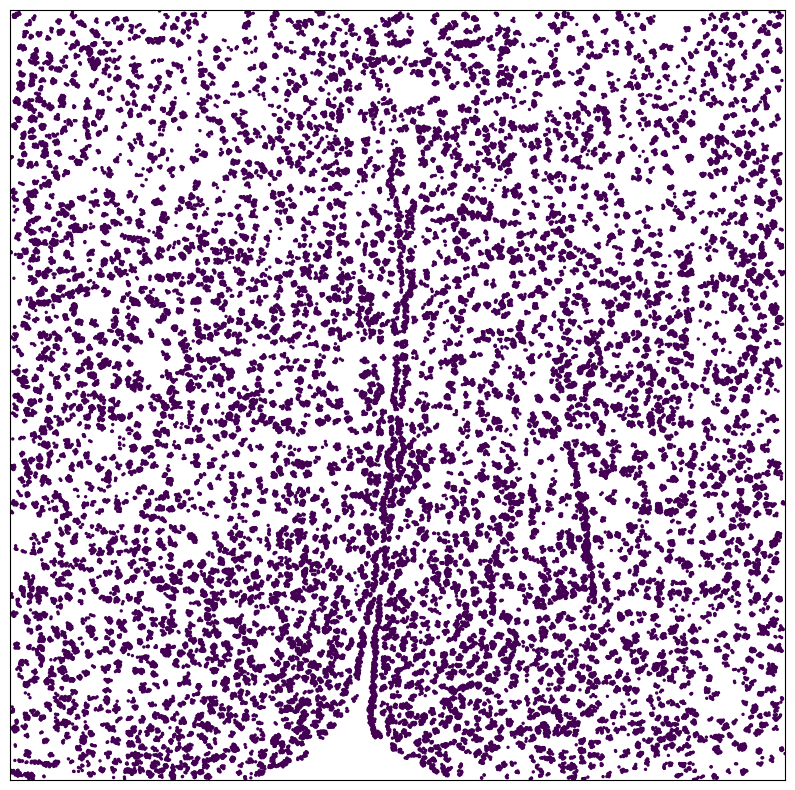

In [28]:
results = estimate_molecule_clusters(sample, 15, method="normal")
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

In [153]:
import pandas as pd
from scipy.stats import entropy
from collections import Counter

t = pd.DataFrame(assignment).groupby(sample['Cell_class'].values, group_keys=True).apply(lambda x: x)
richness = t.reset_index().groupby('level_0')[0].nunique()

# Shannon Diversity Index for each cell type class
def shannon_diversity_index(labels):
    label_counts = Counter(labels)
    probabilities = [count/len(labels) for count in label_counts.values()]
    return entropy(probabilities, base=2)

shannon_diversity = t.reset_index().groupby('level_0')[0].apply(shannon_diversity_index)

def simpson_diversity_index(labels):
    label_counts = Counter(labels)
    N = len(labels)
    return 1 - sum((n/N)**2 for n in label_counts.values())

simpson_diversity = t.reset_index().groupby('level_0')[0].apply(simpson_diversity_index)

diversity_df_random = pd.DataFrame({
    'Richness': richness,
    'Shannon_Index': shannon_diversity,
    'Simpson_Index': simpson_diversity
})
print(diversity_df_random)


               Richness  Shannon_Index  Simpson_Index
level_0                                              
Astrocyte            15       1.897371       0.551030
Endothelial 1        13       2.202663       0.689558
Endothelial 2         7       1.698073       0.548849
Endothelial 3         9       1.900068       0.610445
Ependymal             3       0.557986       0.191106
Excitatory           15       1.528253       0.403822
Inhibitory           15       1.088928       0.278862
Microglia            11       2.074527       0.640315
OD Immature 1        13       1.811474       0.612158
OD Immature 2         5       2.043781       0.737240
OD Mature 1          10       2.047227       0.655070
OD Mature 2          12       1.450516       0.437785
OD Mature 3           2       0.811278       0.375000
OD Mature 4           4       1.561336       0.612245
Pericytes             5       0.503946       0.168695


In [5]:
from neighborhood_composition import estimate_molecule_colors, estimate_molecule_vectors, neighborhood_count_matrix
#from baysorpy import neighborhood_composition
def position_data(df):
    if 'z' in df.columns:
        return np.array(df[['x', 'y', 'z']])
    return np.array(df[['x', 'y']])

n_clusters = 15
k = 25
sample.gene = sample.gene.factorize()[0]
ncm = neighborhood_count_matrix(position_data(sample), np.array(sample.gene), k = k)
mol_vec = estimate_molecule_vectors(ncm, 1)
genes = sample.gene

<Axes: >

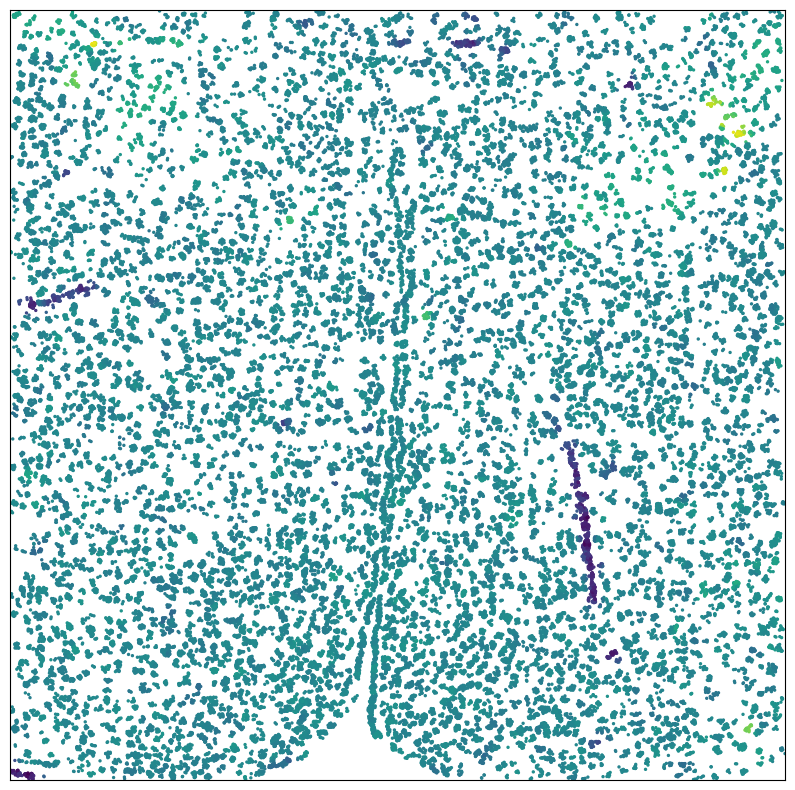

In [36]:
plot_molecules(sample, color=mol_vec[:, 0], alpha=1, s = 2)

In [38]:
from matplotlib import pyplot as plt

NameError: name 'estimate_molecule_vectors' is not defined

In [54]:
mol_vec

array([[ 0.14447],
       [-0.44114],
       [-0.24023],
       ...,
       [ 0.10565],
       [-0.43116],
       [ 0.04003]])

In [48]:
np.unique(results['assignment'])

array([1])

Clustering molecules...
knn
Enter mol clusters
kek
end
Here?


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 43.00it/s]

Done
{'exprs': <molecule_clustering_cython.NormalComponentListWrapper object at 0x7f418e1430b0>, 'assignment': array([0, 0, 1, ..., 1, 0, 1]), 'diffs': array([0.     , 0.00599]), 'assignment_probs': array([[0.50071, 0.50006, 0.49964, ..., 0.49865, 0.50001, 0.49991],
       [0.49929, 0.49994, 0.50036, ..., 0.50135, 0.49999, 0.50009]]), 'change_fracs': array([0.     , 0.91667])}
[[    0 28854]
 [    1 30691]]


<Axes: >

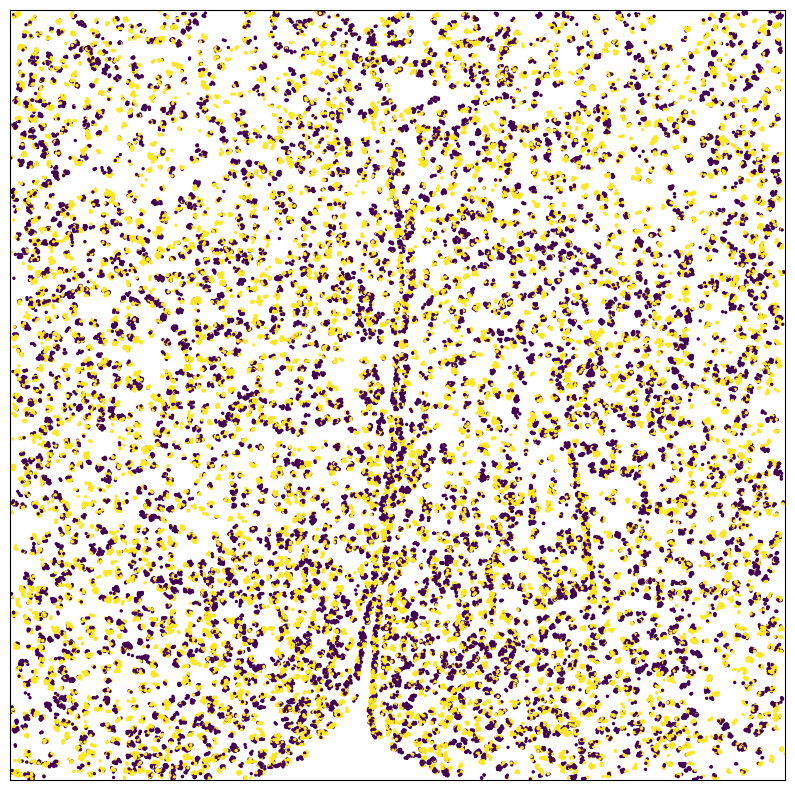

In [53]:
results = estimate_molecule_clusters(sample, 2, method="normal", max_iters = 1, ct_exprs_init=mol_vec.T)
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

In [22]:
results['assignment']

array([4, 4, 4, ..., 4, 4, 7])

<Axes: >

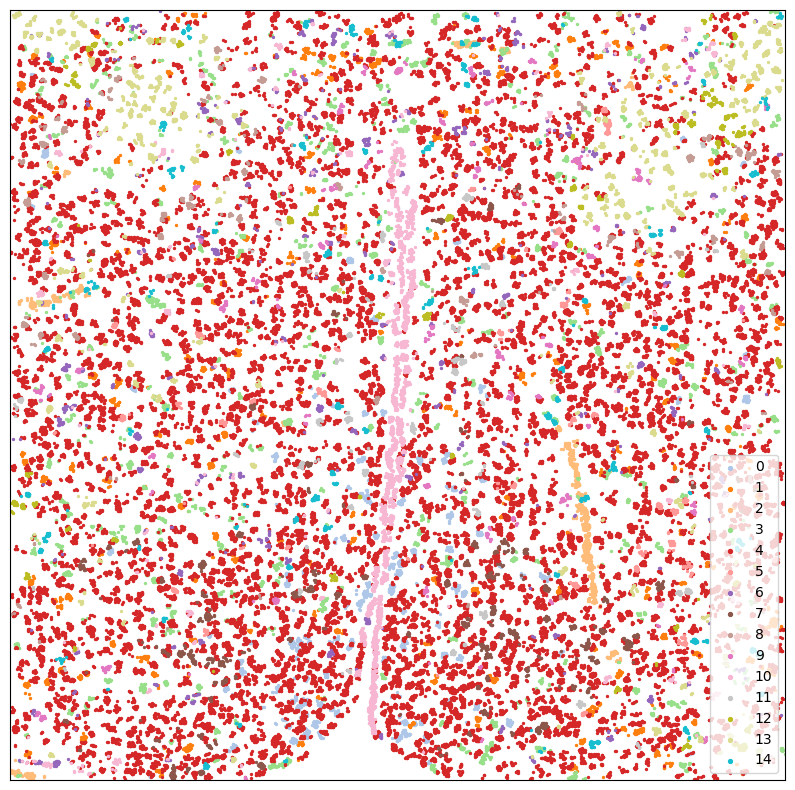

In [20]:
plot_molecules(sample, annotation = results['assignment'], alpha=1, s = 2)

Clustering molecules...
knn
Enter mol clusters
end
Here?


  2%|▉                                      | 238/10000 [00:25<17:34,  9.26it/s]


Done
{'exprs': <molecule_clustering_cython.NormalComponentListWrapper object at 0x7f052363f5f0>, 'assignment': array([7, 0, 7, ..., 7, 7, 0]), 'diffs': array([0.     , 0.     , 0.     , ..., 0.00048, 0.00043, 0.00038]), 'assignment_probs': array([[0.00001, 1.     , 0.00002, ..., 0.00003, 0.     , 1.     ],
       [0.00002, 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
       [0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
       ...,
       [0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ],
       [0.     , 0.     , 0.00001, ..., 0.00001, 0.     , 0.     ],
       [0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.     ]]), 'change_fracs': array([0.     , 0.     , 0.     , ..., 0.04711, 0.04406, 0.04128])}
[[    0  3368]
 [    1  1144]
 [    2   360]
 [    3   339]
 [    4  1517]
 [    5   567]
 [    6    48]
 [    7 41975]
 [    8   871]
 [    9  2500]
 [   10   735]
 [   11  1659]
 [   12    17]
 [   13  1111]
 [   14  3453]]


<Axes: >

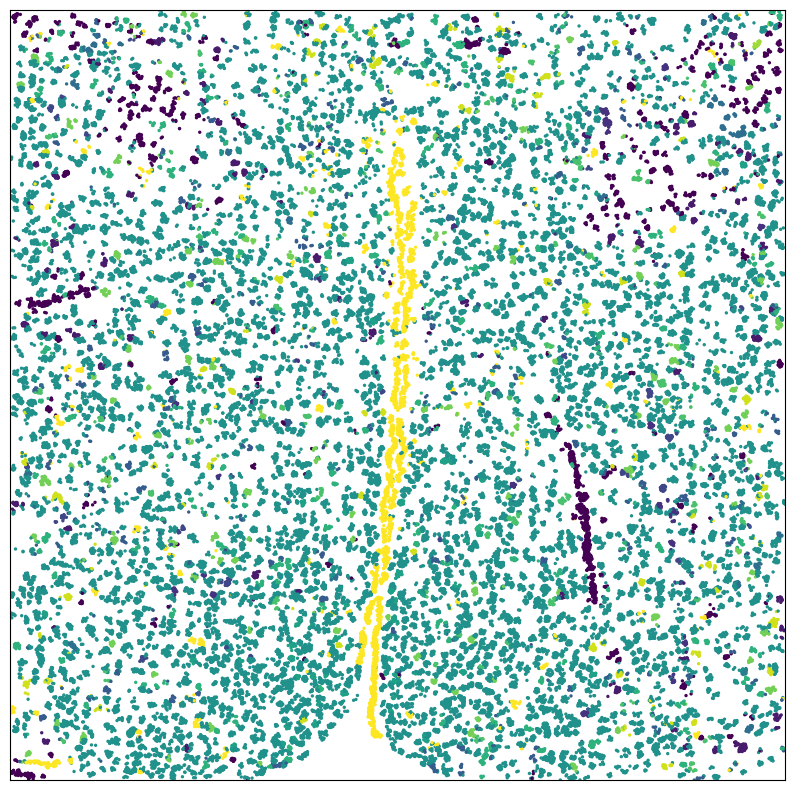

In [188]:
results = estimate_molecule_clusters(sample, 15, method="normal", ct_exprs_init=mol_vec.T)
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

In [189]:
import pandas as pd
from scipy.stats import entropy
from collections import Counter

t = pd.DataFrame(assignment).groupby(sample['Cell_class'].values, group_keys=True).apply(lambda x: x)
richness = t.reset_index().groupby('level_0')[0].nunique()

# Shannon Diversity Index for each cell type class
def shannon_diversity_index(labels):
    label_counts = Counter(labels)
    probabilities = [count/len(labels) for count in label_counts.values()]
    return entropy(probabilities, base=2)

shannon_diversity = t.reset_index().groupby('level_0')[0].apply(shannon_diversity_index)

def simpson_diversity_index(labels):
    label_counts = Counter(labels)
    N = len(labels)
    return 1 - sum((n/N)**2 for n in label_counts.values())

simpson_diversity = t.reset_index().groupby('level_0')[0].apply(simpson_diversity_index)

diversity_df_baseline = pd.DataFrame({
    'Richness': richness,
    'Shannon_Index': shannon_diversity,
    'Simpson_Index': simpson_diversity
})
print(diversity_df_random)


               Richness  Shannon_Index  Simpson_Index
level_0                                              
Astrocyte            15       1.897371       0.551030
Endothelial 1        13       2.202663       0.689558
Endothelial 2         7       1.698073       0.548849
Endothelial 3         9       1.900068       0.610445
Ependymal             3       0.557986       0.191106
Excitatory           15       1.528253       0.403822
Inhibitory           15       1.088928       0.278862
Microglia            11       2.074527       0.640315
OD Immature 1        13       1.811474       0.612158
OD Immature 2         5       2.043781       0.737240
OD Mature 1          10       2.047227       0.655070
OD Mature 2          12       1.450516       0.437785
OD Mature 3           2       0.811278       0.375000
OD Mature 4           4       1.561336       0.612245
Pericytes             5       0.503946       0.168695


In [179]:
pd.factorize(sample['Cell_class'])[0]

array([0, 1, 2, ..., 2, 0, 5])

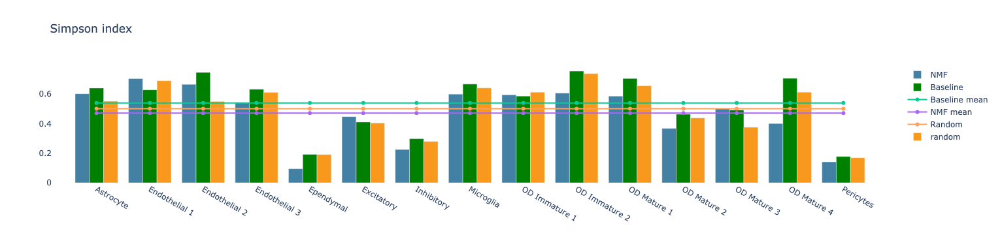

In [175]:
from plotly import graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
fig1 = go.Figure(
    data = [
        go.Bar(
            name="NMF",
            x=diversity_df_nmf.index ,
            y=diversity_df_nmf['Simpson_Index'],
            offsetgroup=1,
             marker=dict(
                 color='#4281A4',  # Set the colors for the bars 
             )
        ),
        go.Bar(
            name="Baseline",
            x=diversity_df_baseline.index ,
            y=diversity_df_baseline['Simpson_Index'],
            offsetgroup=3,
             marker=dict(
                 color='green',  # Set the colors for the bars 
             )
        ),
        go.Scatter(name=f'Baseline mean',
         x=diversity_df_baseline.index,
         y=[diversity_df_baseline['Simpson_Index'].mean()]*len(diversity_df_baseline.index)),
        go.Scatter(name=f'NMF mean',
         x=diversity_df_nmf.index,
         y=[diversity_df_nmf['Simpson_Index'].mean()]*len(diversity_df_nmf.index)),
        go.Scatter(name=f'Random',
         x=diversity_df_random.index,
         y=[diversity_df_random['Simpson_Index'].mean()]*len(diversity_df_baseline.index)),
        go.Bar(
            name="random",
            x=diversity_df_random.index,
            y=diversity_df_random['Simpson_Index'],
            offsetgroup=2,
            marker=dict(
                 color='#F8991D',  # Set the colors for the bars 
            ),
            #text=np.round(total,2),
            #     textposition='auto'
        ),
        
    ],
    layout=go.Layout(
        title="Simpson index",
        #yaxis=dict(title="%", anchor='x'),
        plot_bgcolor='white'
    )
)

fig1.update_layout(barmode='group')
fig1.show()

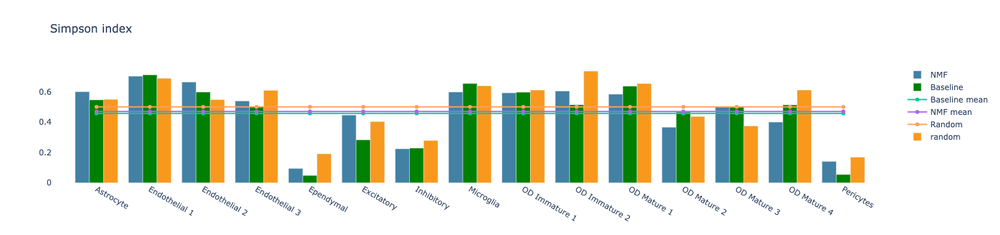

In [203]:
from plotly import graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
fig1 = go.Figure(
    data = [
        go.Bar(
            name="NMF",
            x=diversity_df_nmf.index ,
            y=diversity_df_nmf['Simpson_Index'],
            offsetgroup=1,
             marker=dict(
                 color='#4281A4',  # Set the colors for the bars 
             )
        ),
        go.Bar(
            name="Baseline",
            x=diversity_df_baseline.index ,
            y=diversity_df_baseline['Simpson_Index'],
            offsetgroup=3,
             marker=dict(
                 color='green',  # Set the colors for the bars 
             )
        ),
        go.Scatter(name=f'Baseline mean',
         x=diversity_df_baseline.index,
         y=[diversity_df_baseline['Simpson_Index'].mean()]*len(diversity_df_baseline.index)),
        go.Scatter(name=f'NMF mean',
         x=diversity_df_nmf.index,
         y=[diversity_df_nmf['Simpson_Index'].mean()]*len(diversity_df_nmf.index)),
        go.Scatter(name=f'Random',
         x=diversity_df_random.index,
         y=[diversity_df_random['Simpson_Index'].mean()]*len(diversity_df_baseline.index)),
        go.Bar(
            name="random",
            x=diversity_df_random.index,
            y=diversity_df_random['Simpson_Index'],
            offsetgroup=2,
            marker=dict(
                 color='#F8991D',  # Set the colors for the bars 
            ),
            #text=np.round(total,2),
            #     textposition='auto'
        ),
        
    ],
    layout=go.Layout(
        title="Simpson index",
        #yaxis=dict(title="%", anchor='x'),
        plot_bgcolor='white'
    )
)

fig1.update_layout(barmode='group')
fig1.show()

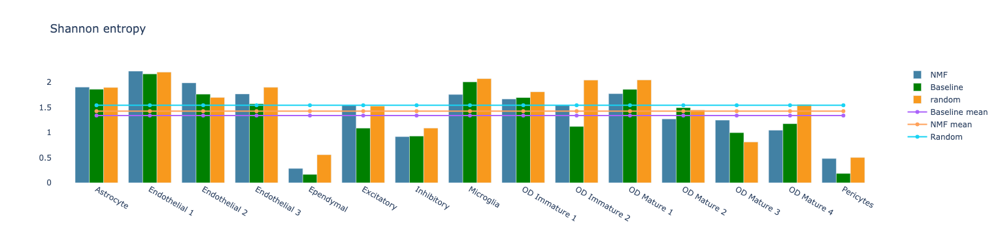

In [209]:
from plotly import graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
fig1 = go.Figure(
    data = [
        go.Bar(
            name="NMF",
            x=diversity_df_nmf.index ,
            y=diversity_df_nmf['Shannon_Index'],
            offsetgroup=1,
             marker=dict(
                 color='#4281A4',  # Set the colors for the bars 
             )
        ),
        go.Bar(
            name="Baseline",
            x=diversity_df_baseline.index ,
            y=diversity_df_baseline['Shannon_Index'],
            offsetgroup=3,
             marker=dict(
                 color='green',  # Set the colors for the bars 
             )
        ),
        go.Bar(
            name="random",
            x=diversity_df_random.index,
            y=diversity_df_random['Shannon_Index'],
            offsetgroup=2,
            marker=dict(
                 color='#F8991D',  # Set the colors for the bars 
            ),
            #text=np.round(total,2),
            #     textposition='auto'
        ),
        go.Scatter(name=f'Baseline mean',
         x=diversity_df_baseline.index,
         y=[diversity_df_baseline['Shannon_Index'].mean()]*len(diversity_df_baseline.index)),
        go.Scatter(name=f'NMF mean',
         x=diversity_df_nmf.index,
         y=[diversity_df_nmf['Shannon_Index'].mean()]*len(diversity_df_nmf.index)),
        go.Scatter(name=f'Random',
         x=diversity_df_random.index,
         y=[diversity_df_random['Shannon_Index'].mean()]*len(diversity_df_baseline.index)),
        
    ],
    layout=go.Layout(
        title="Shannon entropy",
        #yaxis=dict(title="%", anchor='x'),
        plot_bgcolor='white'
    )
)

fig1.update_layout(barmode='group')
fig1.show()

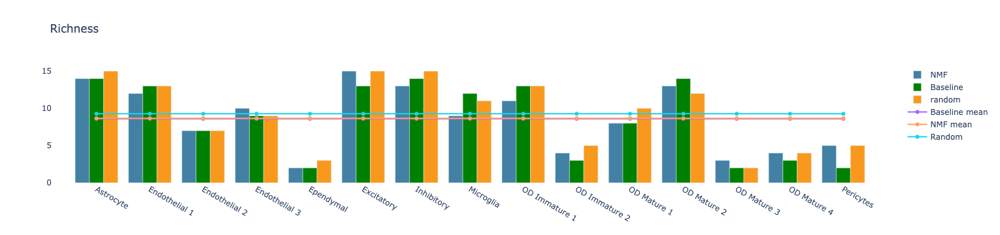

In [204]:
from plotly import graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)
fig1 = go.Figure(
    data = [
        go.Bar(
            name="NMF",
            x=diversity_df_nmf.index ,
            y=diversity_df_nmf['Richness'],
            offsetgroup=1,
             marker=dict(
                 color='#4281A4',  # Set the colors for the bars 
             )
        ),
        go.Bar(
            name="Baseline",
            x=diversity_df_baseline.index ,
            y=diversity_df_baseline['Richness'],
            offsetgroup=3,
             marker=dict(
                 color='green',  # Set the colors for the bars 
             )
        ),
        go.Bar(
            name="random",
            x=diversity_df_random.index,
            y=diversity_df_random['Richness'],
            offsetgroup=2,
            marker=dict(
                 color='#F8991D',  # Set the colors for the bars 
            ),
            #text=np.round(total,2),
            #     textposition='auto'
        ),
        go.Scatter(name=f'Baseline mean',
         x=diversity_df_baseline.index,
         y=[diversity_df_baseline['Richness'].mean()]*len(diversity_df_baseline.index)),
        go.Scatter(name=f'NMF mean',
         x=diversity_df_nmf.index,
         y=[diversity_df_nmf['Richness'].mean()]*len(diversity_df_nmf.index)),
        go.Scatter(name=f'Random',
         x=diversity_df_random.index,
         y=[diversity_df_random['Richness'].mean()]*len(diversity_df_baseline.index)),
        
    ],
    layout=go.Layout(
        title="Richness",
        #yaxis=dict(title="%", anchor='x'),
        plot_bgcolor='white'
    )
)

fig1.update_layout(barmode='group')
fig1.show()

Clustering molecules...
knn
Enter mol clusters
end
Here?


  0%|                                        | 20/10000 [00:00<02:46, 59.77it/s]

Done
{'exprs': array([[0.00791, 0.00709, 0.00535, ..., 0.00757, 0.00715, 0.00703],
       [0.00791, 0.0071 , 0.00535, ..., 0.00757, 0.00714, 0.00703],
       [0.00791, 0.00708, 0.00535, ..., 0.00757, 0.00715, 0.00703],
       ...,
       [0.00791, 0.0071 , 0.00535, ..., 0.00757, 0.00715, 0.00703],
       [0.00791, 0.00709, 0.00535, ..., 0.00757, 0.00715, 0.00703],
       [0.00791, 0.00709, 0.00535, ..., 0.00757, 0.00714, 0.00703]]), 'assignment': array([0, 0, 0, ..., 5, 5, 5]), 'diffs': array([0.     , 0.     , 0.     , ..., 0.00009, 0.0001 , 0.00012]), 'assignment_probs': array([[0.06669, 0.06669, 0.06669, ..., 0.06666, 0.06666, 0.06666],
       [0.06665, 0.06665, 0.06665, ..., 0.06665, 0.06665, 0.06666],
       [0.06668, 0.06668, 0.06668, ..., 0.06667, 0.06667, 0.06667],
       ...,
       [0.06664, 0.06664, 0.06664, ..., 0.06666, 0.06666, 0.06666],
       [0.06667, 0.06667, 0.06667, ..., 0.06668, 0.06668, 0.06668],
       [0.06666, 0.06666, 0.06665, ..., 0.06664, 0.06664, 0.06665]])

<Axes: >

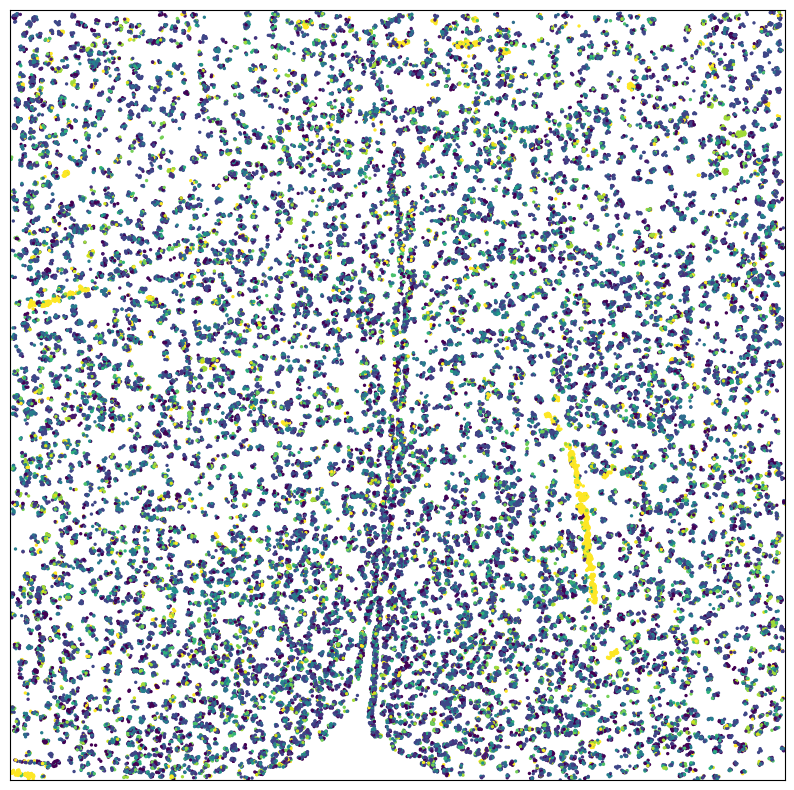

In [185]:
results = estimate_molecule_clusters(sample, 15, method="categorical")
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

Clustering molecules...
knn
Enter mol clusters
end
Here?


  0%|                                        | 20/10000 [00:00<03:03, 54.41it/s]

Done
{'exprs': array([[0.00791, 0.00709, 0.00535, ..., 0.00757, 0.00715, 0.00703],
       [0.00791, 0.0071 , 0.00535, ..., 0.00757, 0.00714, 0.00703],
       [0.00791, 0.00708, 0.00535, ..., 0.00757, 0.00715, 0.00703],
       ...,
       [0.00791, 0.0071 , 0.00535, ..., 0.00757, 0.00715, 0.00703],
       [0.00791, 0.00709, 0.00535, ..., 0.00757, 0.00715, 0.00703],
       [0.00791, 0.00709, 0.00535, ..., 0.00757, 0.00714, 0.00703]]), 'assignment': array([0, 0, 0, ..., 5, 5, 5]), 'diffs': array([0.     , 0.     , 0.     , ..., 0.00009, 0.0001 , 0.00012]), 'assignment_probs': array([[0.06669, 0.06669, 0.06669, ..., 0.06666, 0.06666, 0.06666],
       [0.06665, 0.06665, 0.06665, ..., 0.06665, 0.06665, 0.06666],
       [0.06668, 0.06668, 0.06668, ..., 0.06667, 0.06667, 0.06667],
       ...,
       [0.06664, 0.06664, 0.06664, ..., 0.06666, 0.06666, 0.06666],
       [0.06667, 0.06667, 0.06667, ..., 0.06668, 0.06668, 0.06668],
       [0.06666, 0.06666, 0.06665, ..., 0.06664, 0.06664, 0.06665]])

<Axes: >

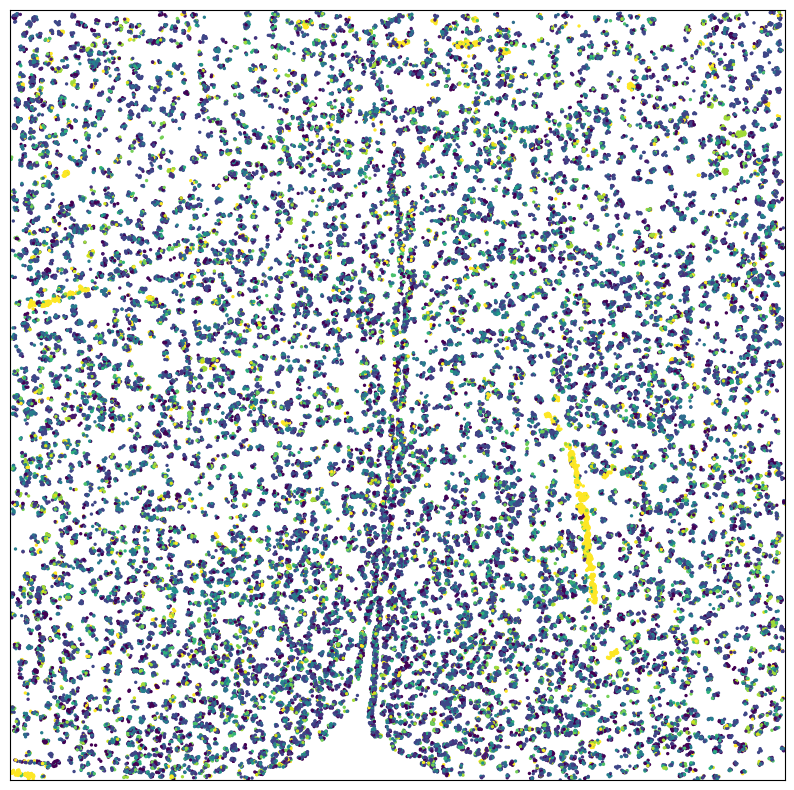

In [186]:
from neighborhood_composition import estimate_molecule_colors, estimate_molecule_vectors, neighborhood_count_matrix
#from baysorpy import neighborhood_composition
def position_data(df):
    if 'z' in df.columns:
        return np.array(df[['x', 'y', 'z']])
    return np.array(df[['x', 'y']])

n_clusters = 15
k = 25
sample.gene = sample.gene.factorize()[0]
ncm = neighborhood_count_matrix(position_data(sample), np.array(sample.gene), k = k)
mol_vec = estimate_molecule_vectors(ncm, n_clusters)
genes = sample.gene

results = estimate_molecule_clusters(sample, 15, method="categorical", ct_exprs_init=mol_vec.T)
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)

Clustering molecules...
knn


  0%|          | 20/10000 [00:00<04:11, 39.69it/s]


Done
{'exprs': array([[0.     , 0.00753, 0.00728, ..., 0.00749, 0.0072 , 0.007  ],
       [0.     , 0.00753, 0.00728, ..., 0.00749, 0.0072 , 0.00699],
       [0.     , 0.00753, 0.00729, ..., 0.00749, 0.0072 , 0.00699],
       ...,
       [0.     , 0.00753, 0.00729, ..., 0.00749, 0.0072 , 0.00699],
       [0.     , 0.00753, 0.00728, ..., 0.00749, 0.0072 , 0.00699],
       [0.     , 0.00753, 0.00729, ..., 0.00749, 0.0072 , 0.00699]]), 'assignment': array([1, 1, 4, ..., 0, 0, 0]), 'diffs': array([0.     , 0.     , 0.     , ..., 0.00007, 0.00008, 0.0001 ]), 'assignment_probs': array([[0.06669, 0.06669, 0.06669, ..., 0.06669, 0.06669, 0.0667 ],
       [0.06669, 0.06669, 0.06669, ..., 0.06666, 0.06666, 0.06667],
       [0.06664, 0.06664, 0.06664, ..., 0.06666, 0.06666, 0.06665],
       ...,
       [0.06669, 0.06668, 0.06668, ..., 0.06665, 0.06665, 0.06665],
       [0.06668, 0.06667, 0.06668, ..., 0.06667, 0.06667, 0.06667],
       [0.06664, 0.06664, 0.06664, ..., 0.06664, 0.06664, 0.06663]])

<Axes: >

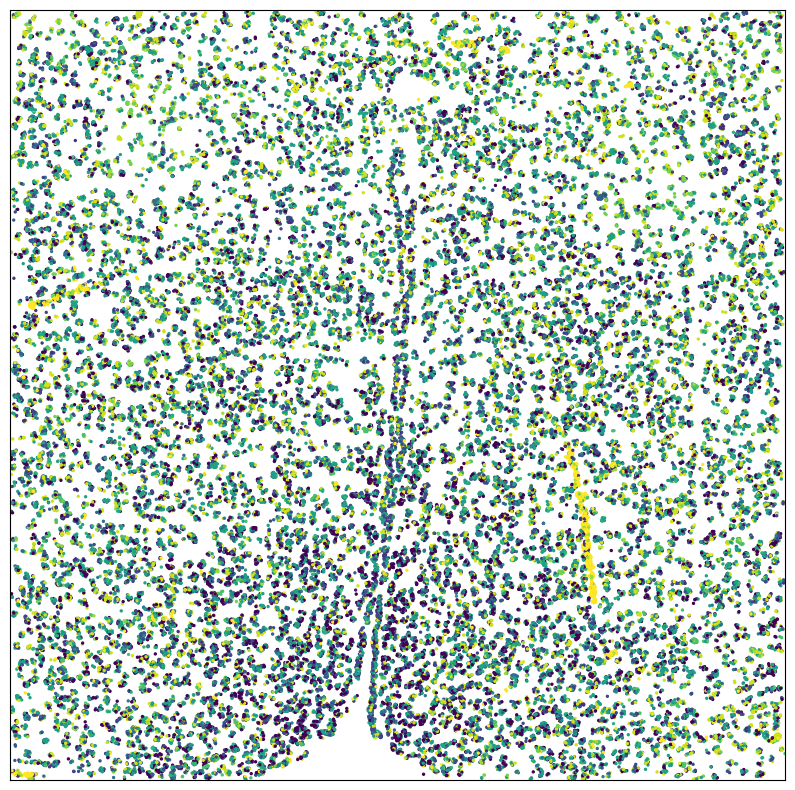

In [6]:
results = estimate_molecule_clusters(sample, 15, method="categorical", tol=1e-6)
print(results)
assignment=results['assignment']
unique, counts = np.unique(assignment, return_counts=True)
print(np.asarray((unique, counts)).T)
colors = results['assignment']#estimate_molecule_colors(results['assignment_probs'])
plot_molecules(sample, color=colors, alpha=1, s = 2)